<a href="https://colab.research.google.com/github/HarisGunawanRomadon/DL-tugas-per-4-GAN/blob/main/Tugas_4_Model_DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Konfigurasi agar GPU digunakan secara efisien
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU Terdeteksi: ", physical_devices[0])
else:
    print("Peringatan: GPU tidak terdeteksi. Training akan lambat.")

GPU Terdeteksi:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
# IMPORTANT: Make sure you have uploaded kaggle.json to your Colab session's /content/ directory first.
# If you uploaded it somewhere else, adjust the source path accordingly.
!mv /content/kaggle.json ~/.kaggle/

# Set read-only permissions for the kaggle.json file for security
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API credentials set up successfully!")

Kaggle API credentials set up successfully!


In [ ]:
# Install kaggle if not already installed
!pip install -q kaggle

# Make sure your Kaggle API credentials (kaggle.json) are set up in ~/.kaggle/
# If you haven't done this, please refer to the previous instructions.

# Download the dataset
!kaggle datasets download -d joosthazelzet/lego-brick-images

# Unzip the downloaded dataset to the specified directory
# The zip file will be downloaded to the current working directory (/content/)
!unzip -q /content/lego-brick-images.zip -d /content/dataset/

# Clean up the zip file after extraction
!rm /content/lego-brick-images.zip

print("Dataset downloaded and extracted to /content/dataset/")

Dataset URL: https://www.kaggle.com/datasets/joosthazelzet/lego-brick-images
License(s): GPL-2.0
 99% 0.99G/1.00G [00:06<00:00, 133MB/s]
100% 1.00G/1.00G [00:06<00:00, 154MB/s]
Dataset downloaded and extracted to /content/dataset/


In [ ]:
# Parameter Konfigurasi
BATCH_SIZE = 64
IMG_HEIGHT = 64  # Menggunakan 64x64 agar detail LEGO cukup terlihat
IMG_WIDTH = 64
CHANNELS = 3     # RGB


# --- OPSI B: Membuat Dataset Loader ---
# Ganti 'path/to/images' dengan path folder dataset Anda
dataset_dir = '/content/dataset/LEGO brick images v1'

# Jika folder kosong/tidak ada, kita buat dummy data agar kode tetap jalan (untuk testing)
if not os.path.exists(dataset_dir) or not os.listdir(dataset_dir):
    print("Dataset tidak ditemukan. Membuat data dummy untuk demonstrasi struktur kode.")
    os.makedirs(dataset_dir, exist_ok=True)
    # Membuat 100 gambar random noise sebagai placeholder
    for i in range(100):
        img = np.random.randint(0, 255, (64, 64, 3), dtype=np.uint8)
        tf.keras.utils.save_img(f"{dataset_dir}/dummy_{i}.png", img)

# Memuat dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_dir,
    label_mode=None, # Kita tidak butuh label untuk GAN
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE
)

# Normalisasi ke [-1, 1]
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)

# Optimasi performa (Caching & Prefetching)
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 6479 files.


In [ ]:
latent_dim = 128

def build_generator():
    model = keras.Sequential(name="generator")

    # Input: Latent Vector
    # Mulai dengan dense layer yang cukup besar untuk di-reshape
    # Kita ingin mulai dari ukuran 8x8 dengan 512 filter
    model.add(layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Reshape menjadi tensor 3D
    model.add(layers.Reshape((8, 8, 512)))

    # Upsampling 1: 8x8 -> 16x16
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 2: 16x16 -> 32x32
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 3: 32x32 -> 64x64
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Output Layer: 64x64 -> 64x64x3 (RGB)
    # Aktivasi TANH penting agar output di range [-1, 1]
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding='same', activation='tanh'))

    return model

def build_discriminator():
    model = keras.Sequential(name="discriminator")

    # Input: Gambar 64x64x3
    # Downsampling 1: 64 -> 32
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 2: 32 -> 16
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 3: 16 -> 8
    model.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # Output berupa logit (skor real/fake)

    return model

# Inisialisasi Model
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
# discriminator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                 │ (None, 32768)          │     4,194,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_5              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_10 (LeakyReLU)      │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 3)      │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,081,411 (27.01 MB)

 Trainable params: 7,014,979 (26.76 MB)

 Non-trainable params: 66,432 (259.50 KB)

In [ ]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        # Metric trackers
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # 1. Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 2. Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # 3. Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # 4. Assemble labels discriminating real from fake images
        # Label 1 untuk fake, 0 untuk real (atau sebaliknya, teknik ini menggunakan label smoothing)
        # Di sini kita pakai standar: 1=Real, 0=Fake.
        # Namun, karena kita concat [Fake, Real], maka labelnya: [0...0, 1...1]
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Tambahkan sedikit noise pada label (Label Smoothing) untuk stabilitas
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # 5. Train the Discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)

        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # 6. Sample random points in the latent space (lagi, untuk Generator)
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 7. Assemble labels that say "all real images" (We want to fool the discriminator)
        misleading_labels = tf.ones((batch_size, 1))

        # 8. Train the Generator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 127.5
        generated_images += 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 4))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show() # Tampilkan inline di Colab

        # Opsional: Simpan ke file
        # plt.savefig(f"generated_lego_epoch_{epoch}.png")
        # plt.close()

Mulai Training...
Epoch 1/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - d_loss: 0.4909 - g_loss: 0.7233

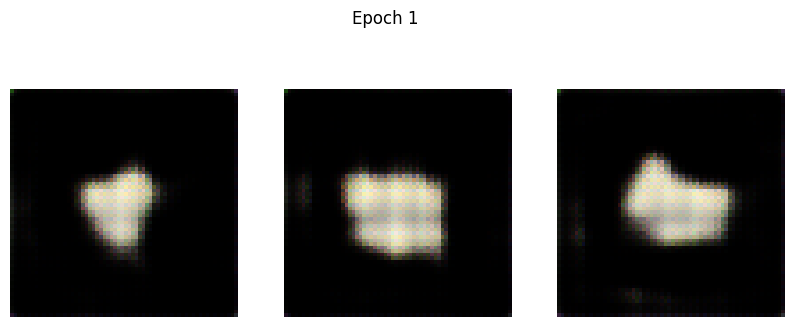

102/102 ━━━━━━━━━━━━━━━━━━━━ 32s 196ms/step - d_loss: 0.4915 - g_loss: 0.7237
Epoch 2/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.6716 - g_loss: 0.7470

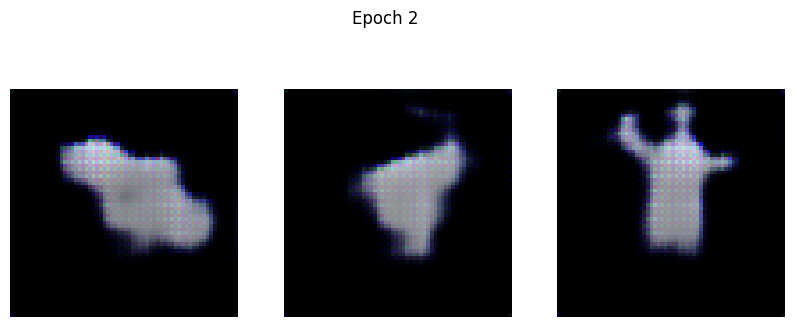

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.6717 - g_loss: 0.7469
Epoch 3/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6652 - g_loss: 0.7377

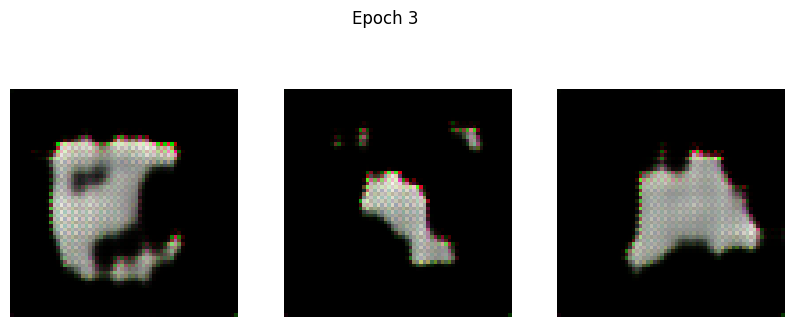

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.6652 - g_loss: 0.7379
Epoch 4/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6585 - g_loss: 0.7936

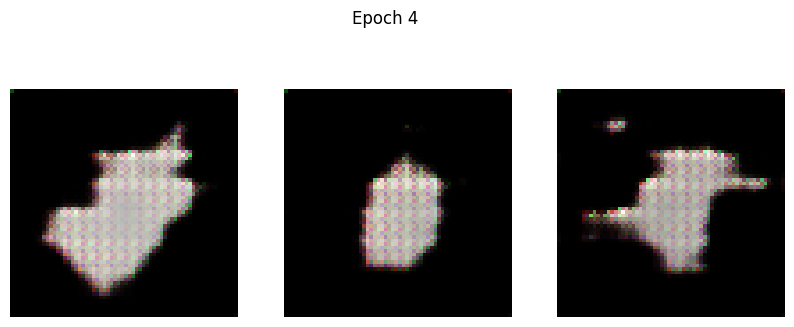

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.6585 - g_loss: 0.7936
Epoch 5/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6503 - g_loss: 0.7953

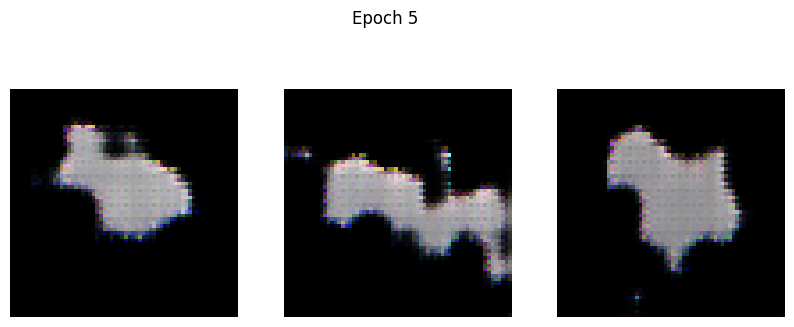

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6504 - g_loss: 0.7953
Epoch 6/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6500 - g_loss: 0.7783

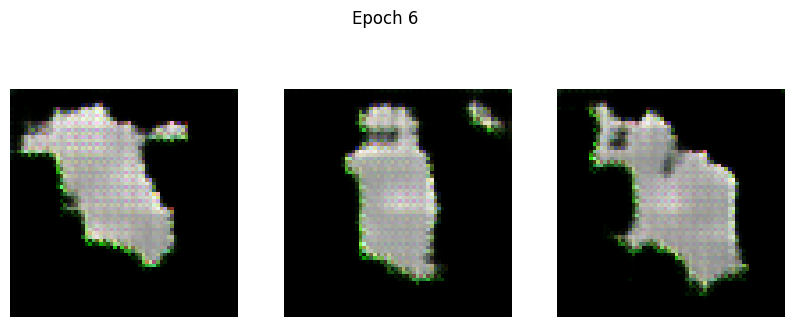

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.6501 - g_loss: 0.7785
Epoch 7/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6577 - g_loss: 0.7907

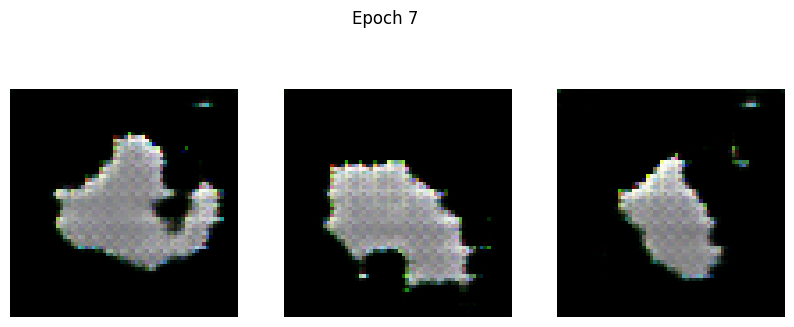

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.6577 - g_loss: 0.7908
Epoch 8/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6508 - g_loss: 0.7711

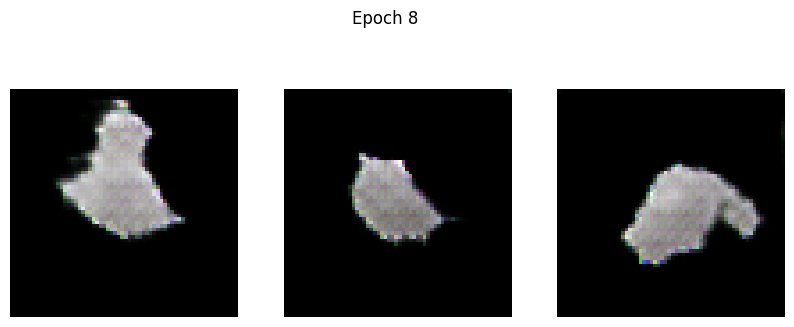

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: 0.6509 - g_loss: 0.7711
Epoch 9/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6609 - g_loss: 0.7581

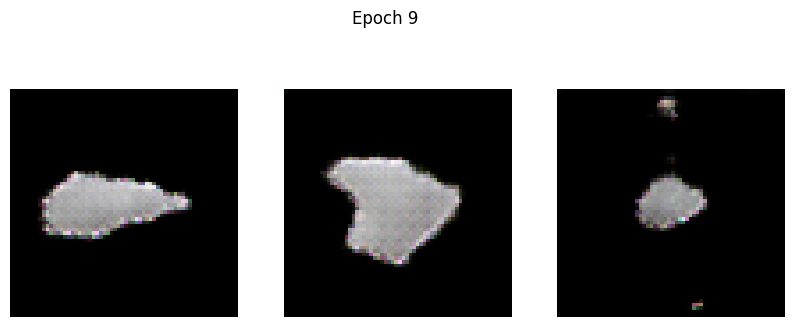

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.6609 - g_loss: 0.7580
Epoch 10/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6578 - g_loss: 0.7404

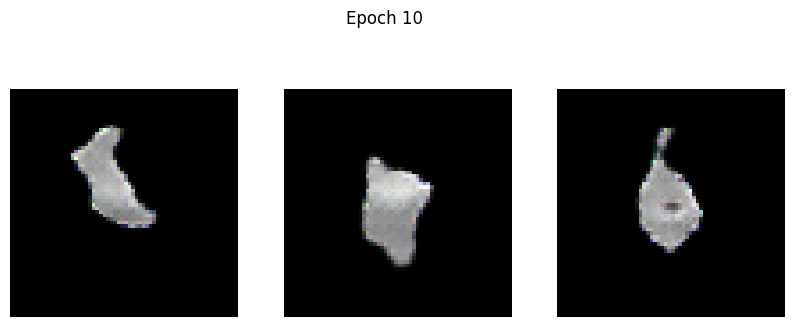

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.6578 - g_loss: 0.7405
Epoch 11/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6531 - g_loss: 0.7506

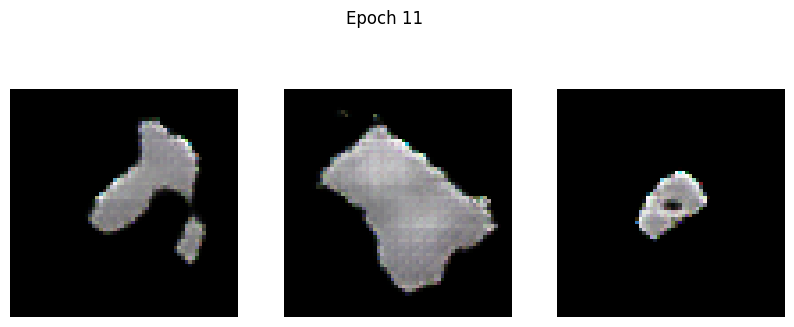

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6531 - g_loss: 0.7506
Epoch 12/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6455 - g_loss: 0.7841

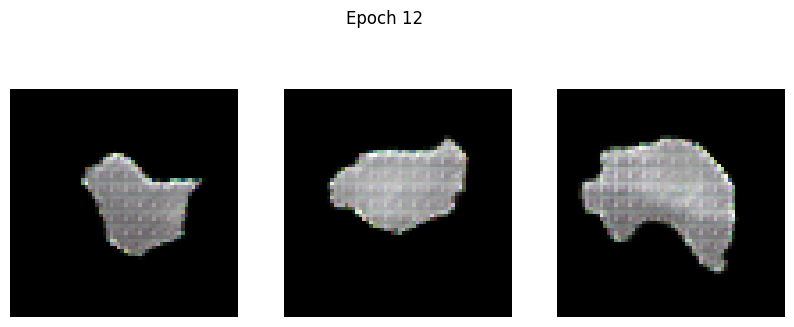

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6455 - g_loss: 0.7840
Epoch 13/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6326 - g_loss: 0.8210

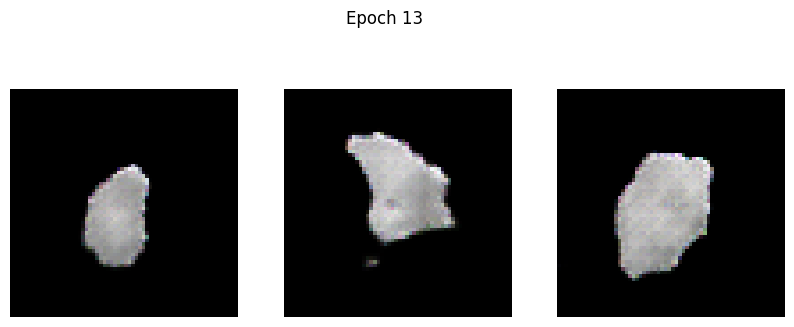

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6326 - g_loss: 0.8209
Epoch 14/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6284 - g_loss: 0.8555

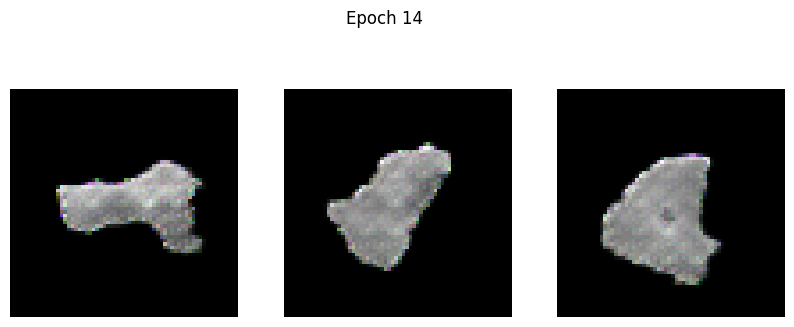

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6283 - g_loss: 0.8556
Epoch 15/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6143 - g_loss: 0.8780

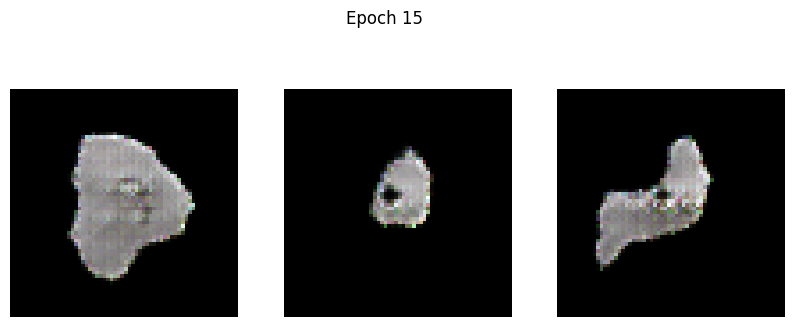

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6143 - g_loss: 0.8783
Epoch 16/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6029 - g_loss: 0.9204

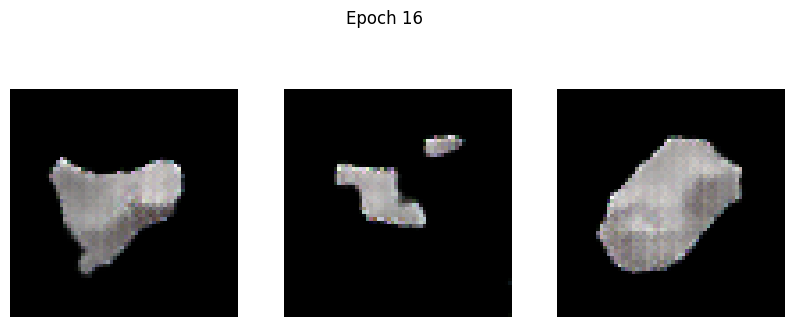

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.6029 - g_loss: 0.9203
Epoch 17/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5762 - g_loss: 0.9229

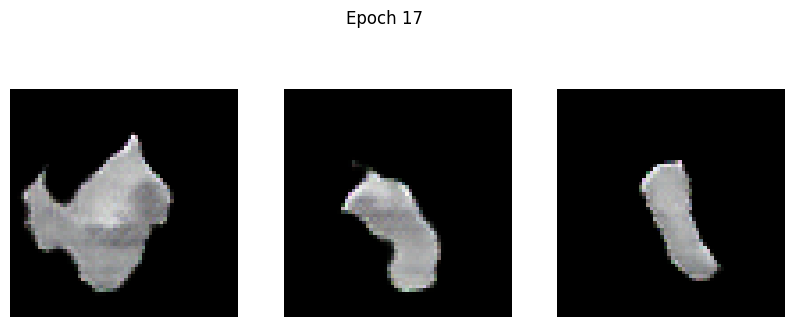

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.5762 - g_loss: 0.9231
Epoch 18/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5667 - g_loss: 0.9933

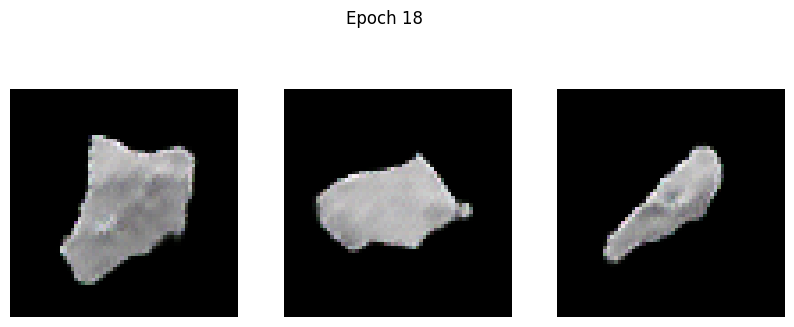

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.5667 - g_loss: 0.9934
Epoch 19/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5494 - g_loss: 1.0033

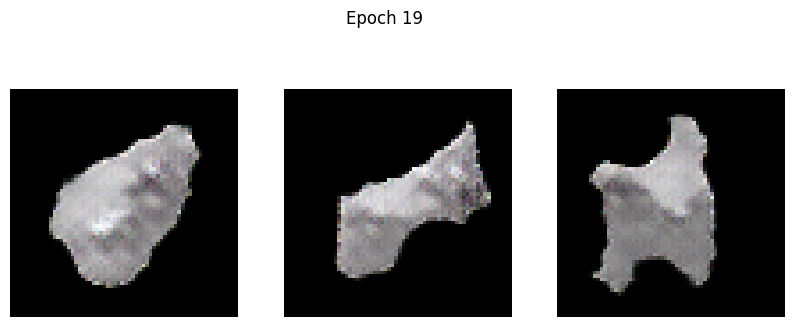

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.5494 - g_loss: 1.0035
Epoch 20/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5299 - g_loss: 1.0272

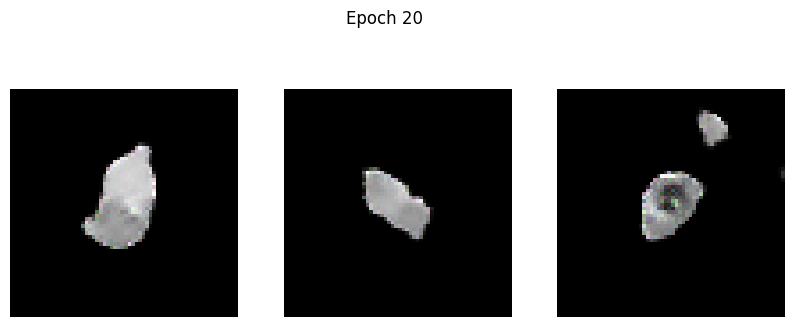

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.5300 - g_loss: 1.0274
Epoch 21/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5230 - g_loss: 1.0289

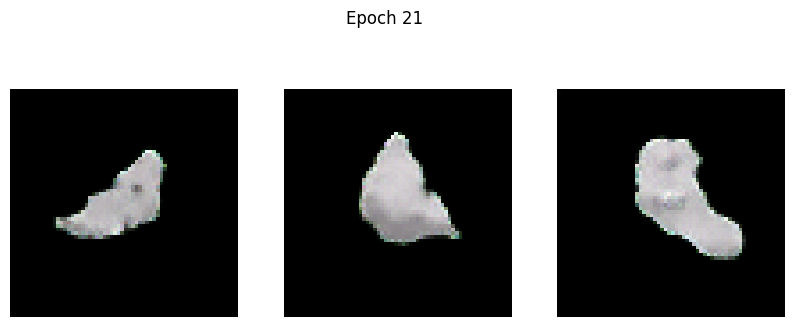

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.5230 - g_loss: 1.0292
Epoch 22/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5013 - g_loss: 1.0867

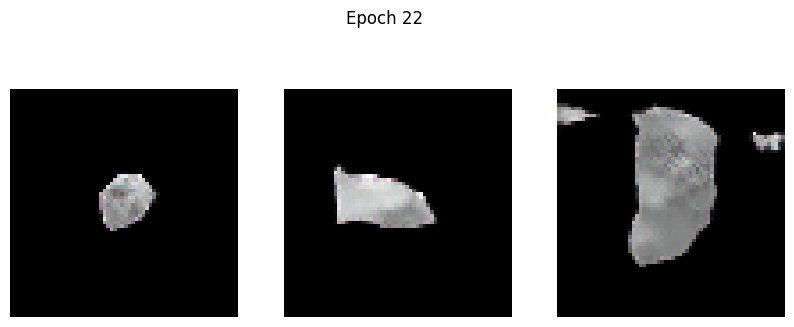

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.5013 - g_loss: 1.0869
Epoch 23/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4998 - g_loss: 1.1192

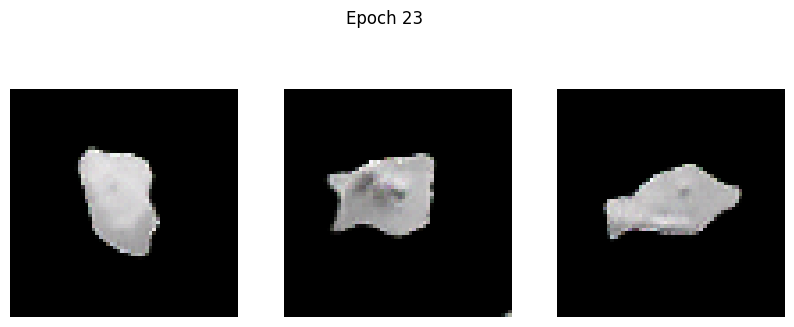

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.4998 - g_loss: 1.1194
Epoch 24/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4963 - g_loss: 1.1951

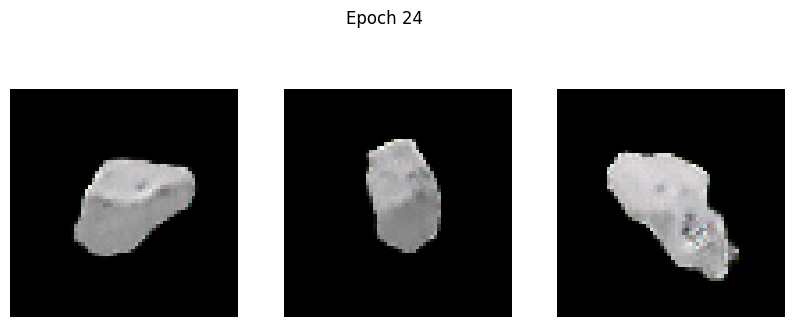

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.4963 - g_loss: 1.1952
Epoch 25/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4641 - g_loss: 1.2308

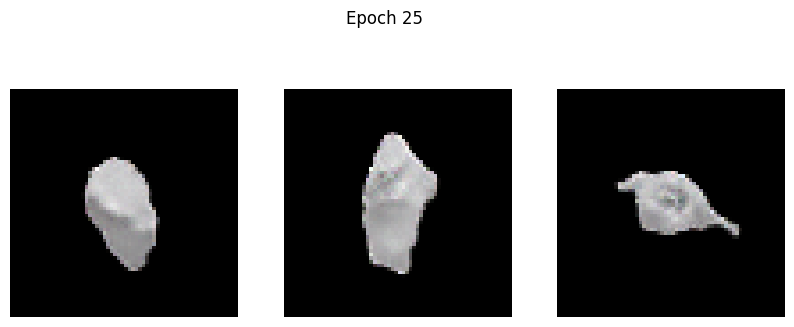

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4642 - g_loss: 1.2308
Epoch 26/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4568 - g_loss: 1.2589

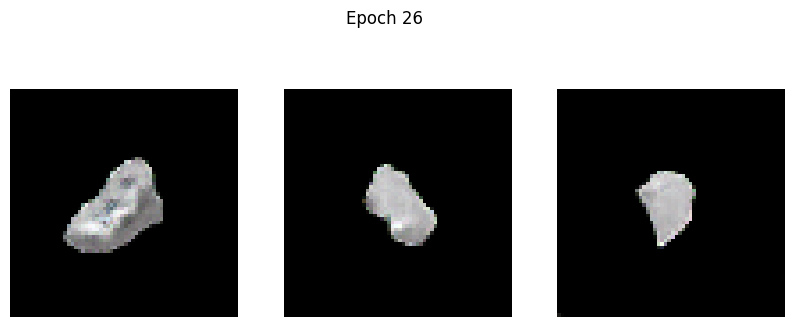

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4568 - g_loss: 1.2591
Epoch 27/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4613 - g_loss: 1.2955

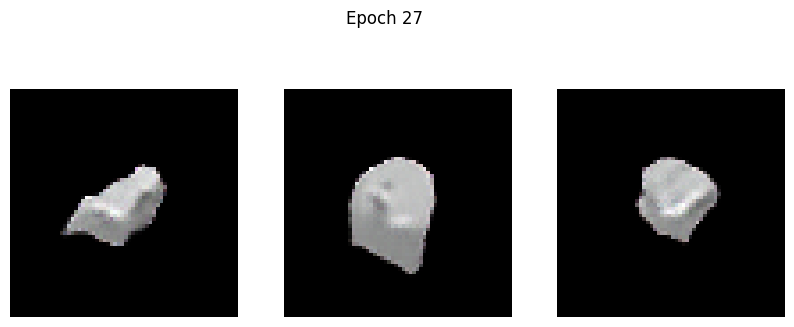

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4612 - g_loss: 1.2955
Epoch 28/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4367 - g_loss: 1.3353

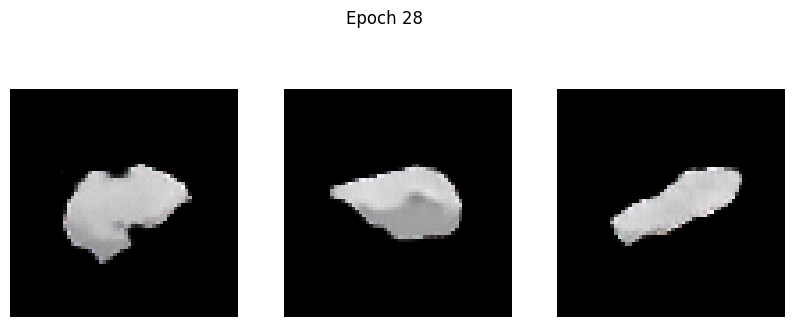

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4367 - g_loss: 1.3355
Epoch 29/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4324 - g_loss: 1.3551

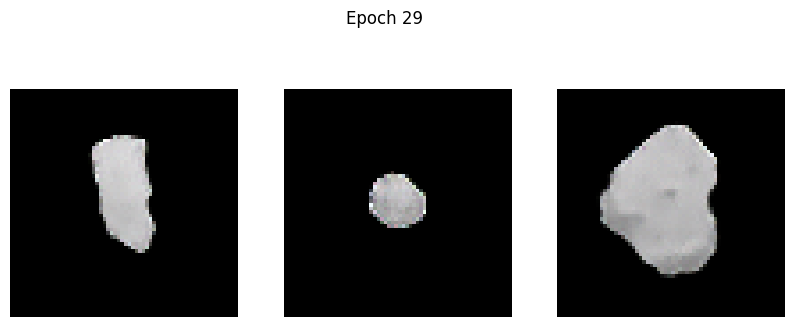

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4324 - g_loss: 1.3554
Epoch 30/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4859 - g_loss: 1.3447

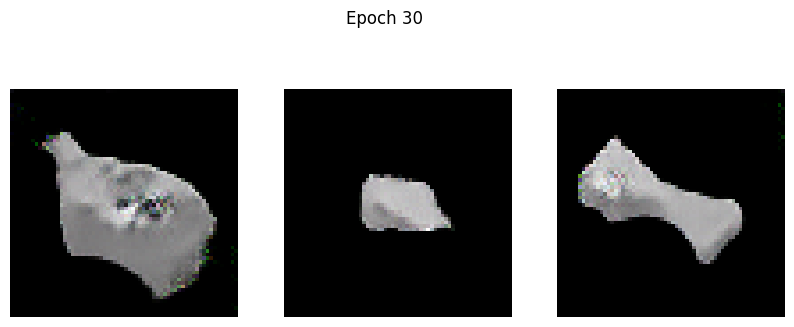

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4856 - g_loss: 1.3447
Epoch 31/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4172 - g_loss: 1.3790

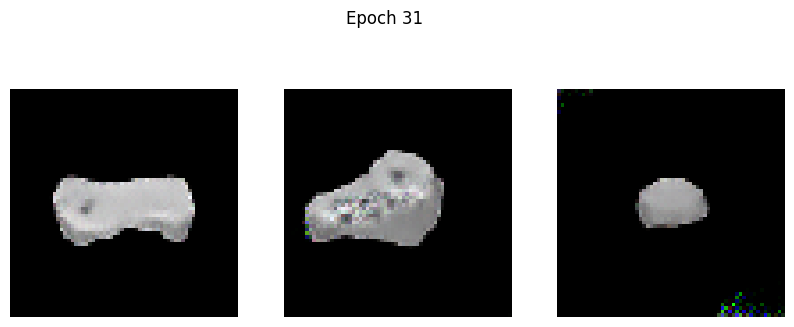

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.4173 - g_loss: 1.3791
Epoch 32/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4298 - g_loss: 1.4137

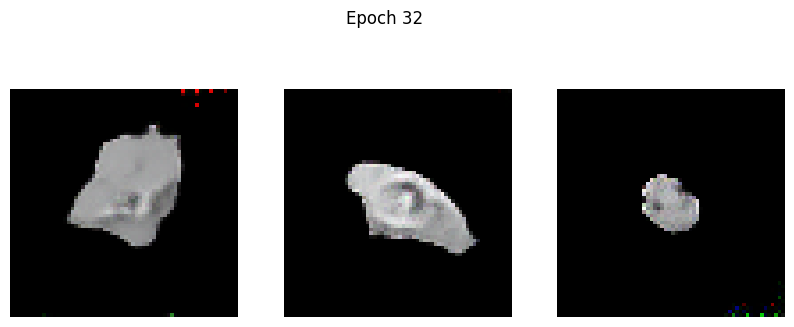

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.4297 - g_loss: 1.4135
Epoch 33/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4103 - g_loss: 1.4862

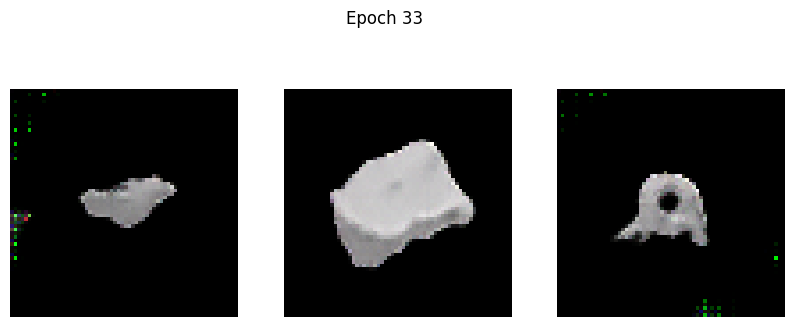

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4103 - g_loss: 1.4860
Epoch 34/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4144 - g_loss: 1.4653

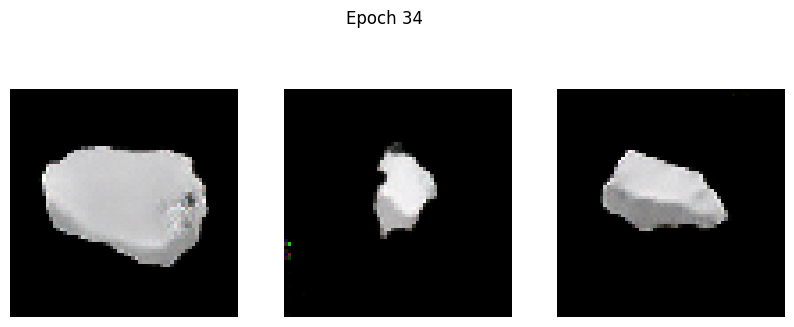

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4143 - g_loss: 1.4653
Epoch 35/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3912 - g_loss: 1.5365

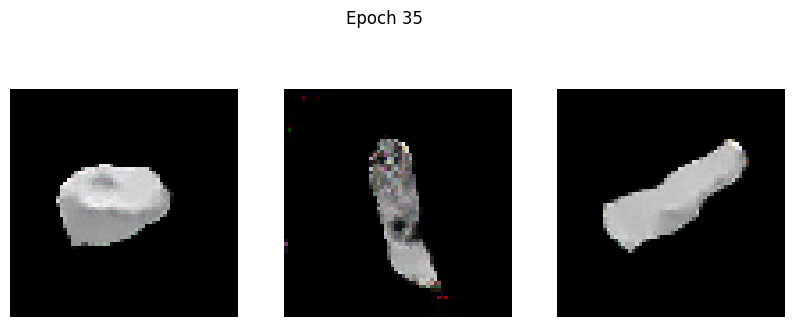

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3913 - g_loss: 1.5363
Epoch 36/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3874 - g_loss: 1.5407

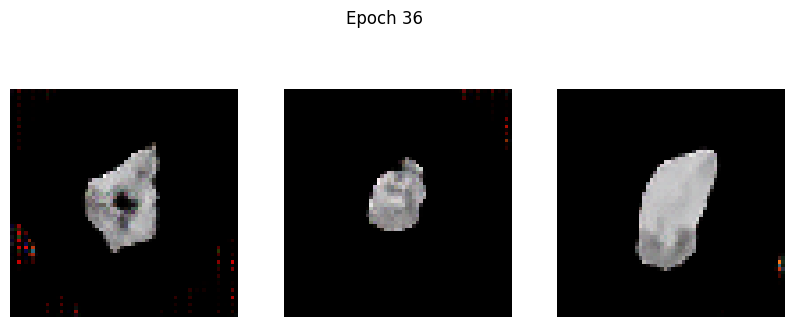

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3877 - g_loss: 1.5407
Epoch 37/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3845 - g_loss: 1.5329

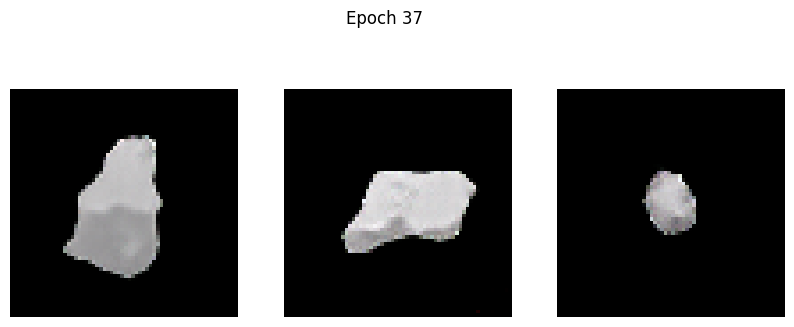

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3845 - g_loss: 1.5327
Epoch 38/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3630 - g_loss: 1.5341

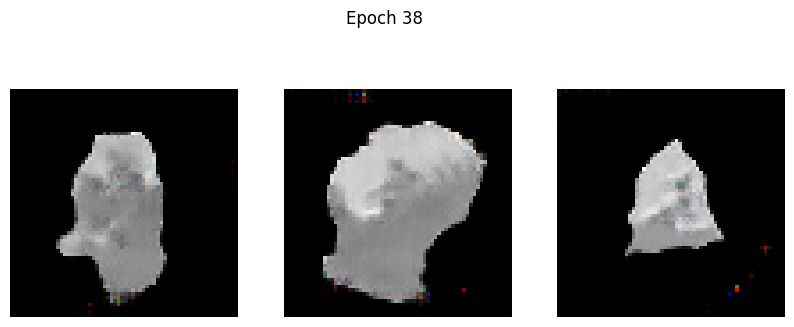

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3630 - g_loss: 1.5345
Epoch 39/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5042 - g_loss: 1.7412

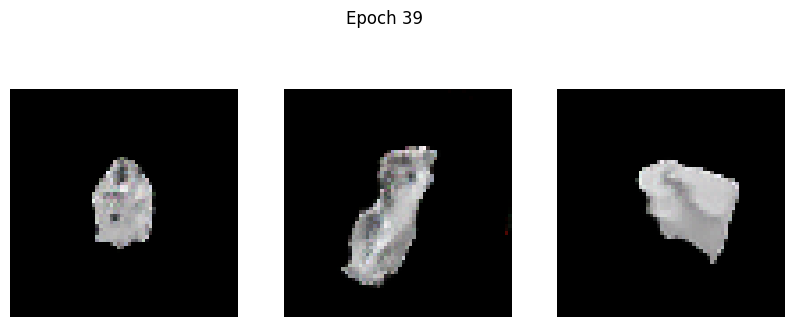

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.5035 - g_loss: 1.7401
Epoch 40/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3412 - g_loss: 1.5738

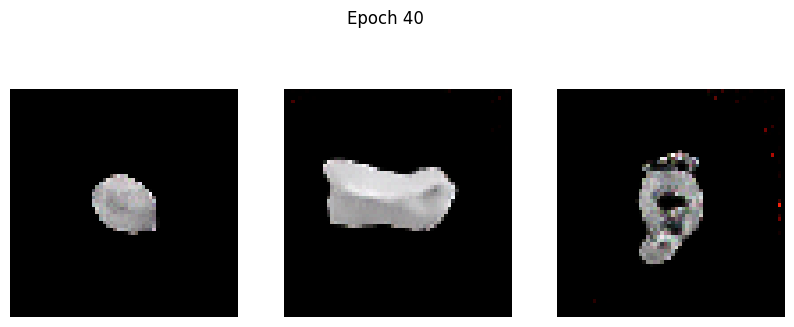

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3412 - g_loss: 1.5738
Epoch 41/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3494 - g_loss: 1.6381

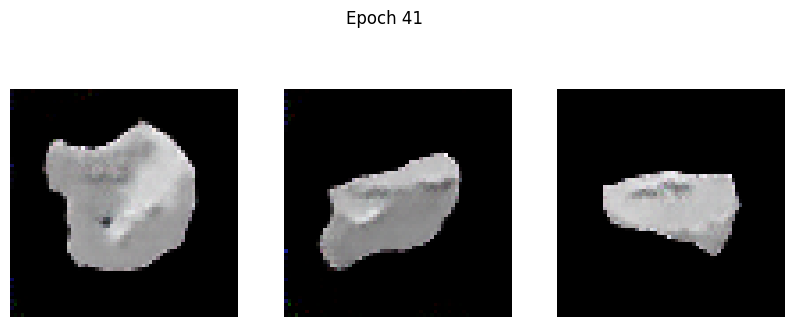

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3494 - g_loss: 1.6380
Epoch 42/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3492 - g_loss: 1.7140

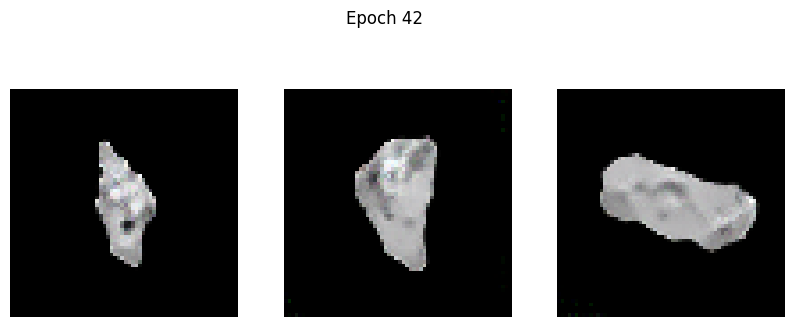

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3493 - g_loss: 1.7140
Epoch 43/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3690 - g_loss: 1.7380

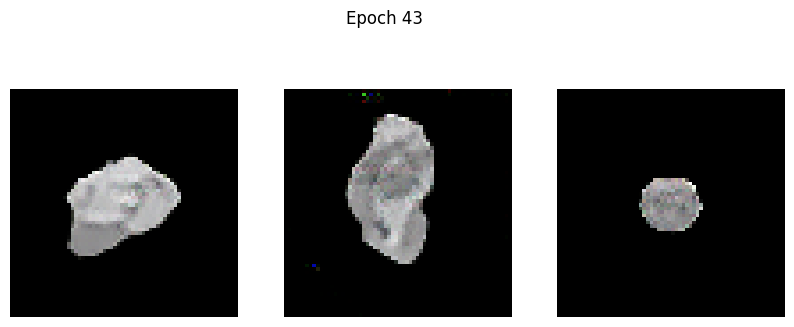

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3691 - g_loss: 1.7380
Epoch 44/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3145 - g_loss: 1.6653

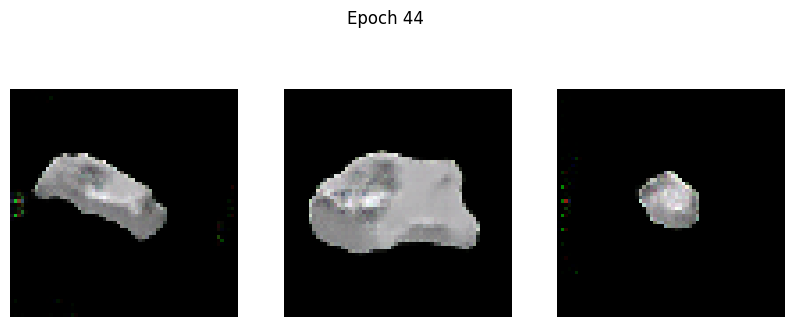

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3148 - g_loss: 1.6660
Epoch 45/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3369 - g_loss: 1.6353

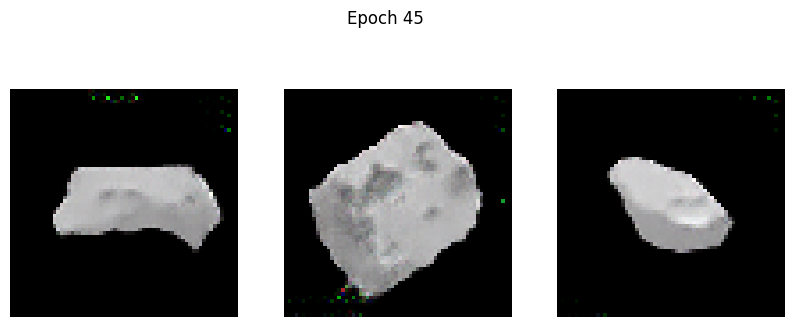

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3368 - g_loss: 1.6357
Epoch 46/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.3293 - g_loss: 1.7233

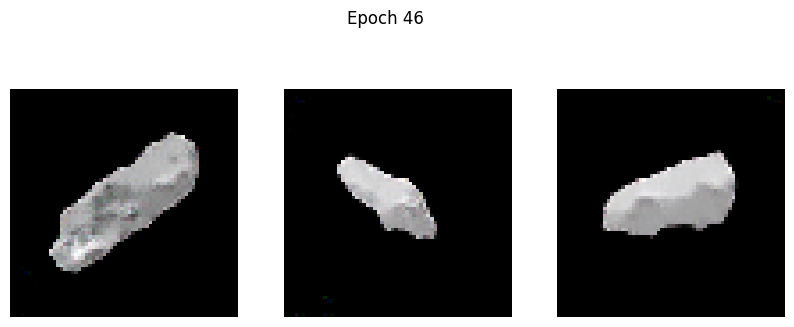

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: 0.3293 - g_loss: 1.7234
Epoch 47/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3043 - g_loss: 1.7242

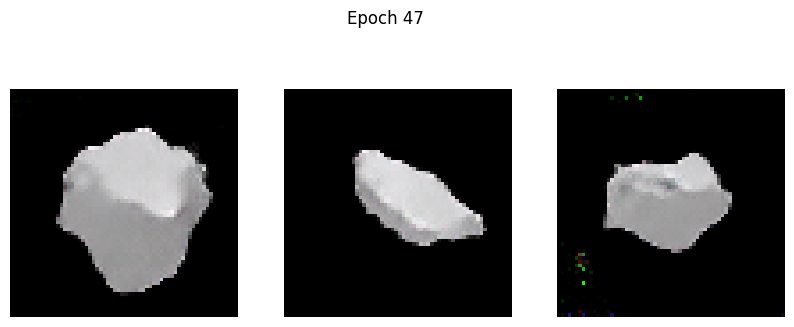

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3046 - g_loss: 1.7247
Epoch 48/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2910 - g_loss: 1.7644

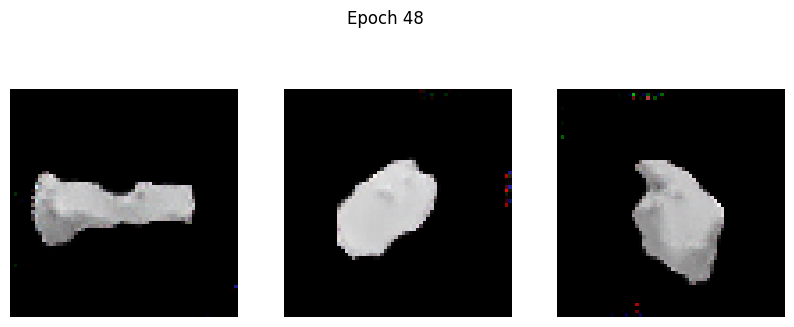

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2911 - g_loss: 1.7647
Epoch 49/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3463 - g_loss: 1.8139

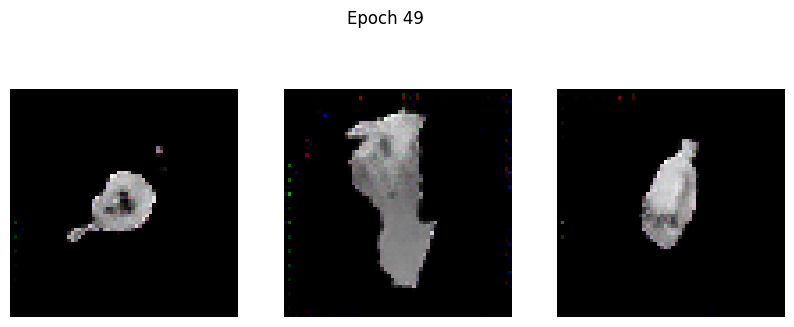

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3464 - g_loss: 1.8137
Epoch 50/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3028 - g_loss: 1.8110

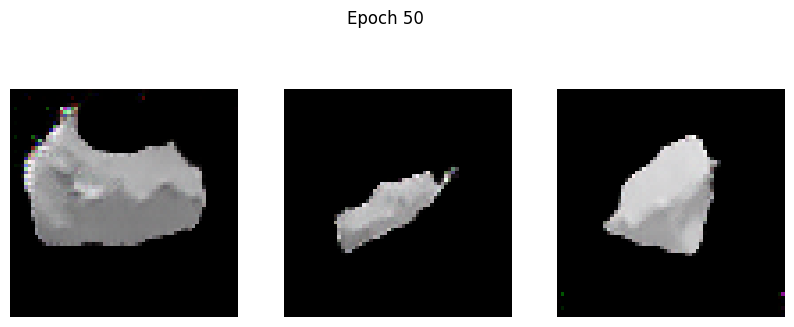

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3028 - g_loss: 1.8111
Epoch 51/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2944 - g_loss: 1.8384

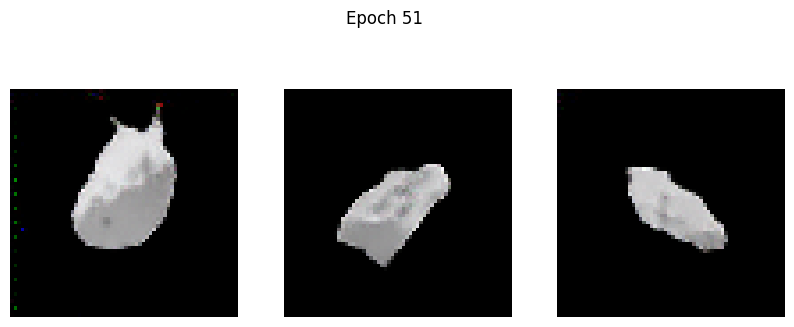

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2946 - g_loss: 1.8387
Epoch 52/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2948 - g_loss: 1.8917

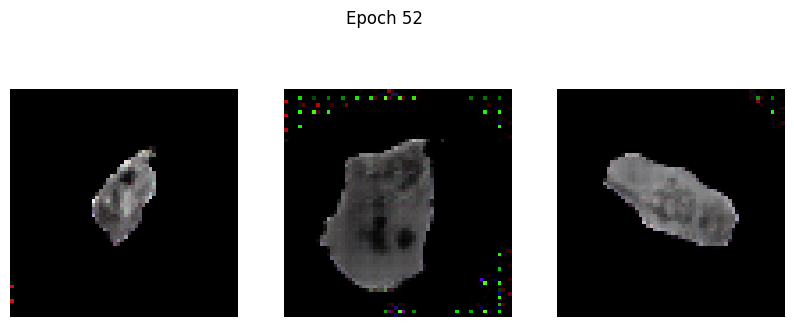

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2958 - g_loss: 1.8925
Epoch 53/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 1.1032 - g_loss: 3.7400

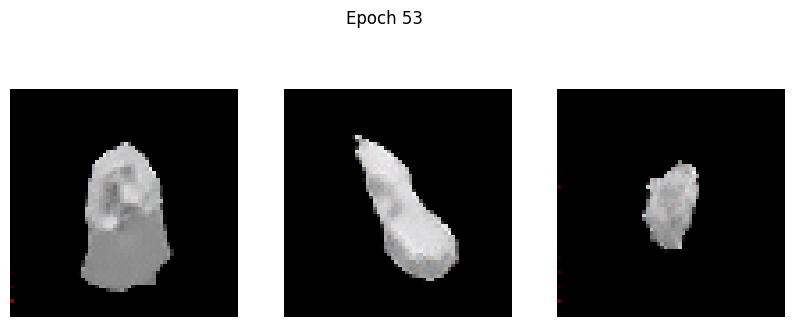

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 1.0979 - g_loss: 3.7269
Epoch 54/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2834 - g_loss: 1.6832

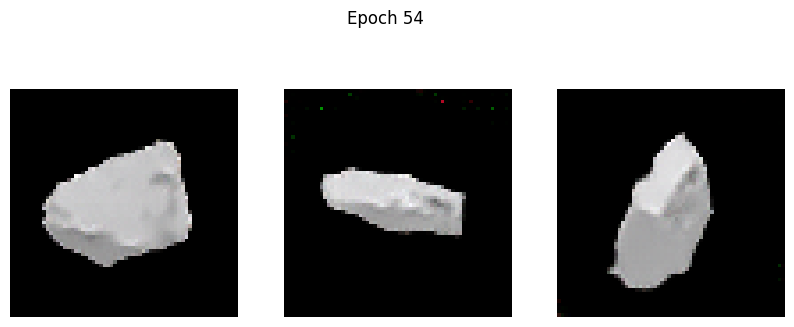

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2834 - g_loss: 1.6832
Epoch 55/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2883 - g_loss: 1.7421

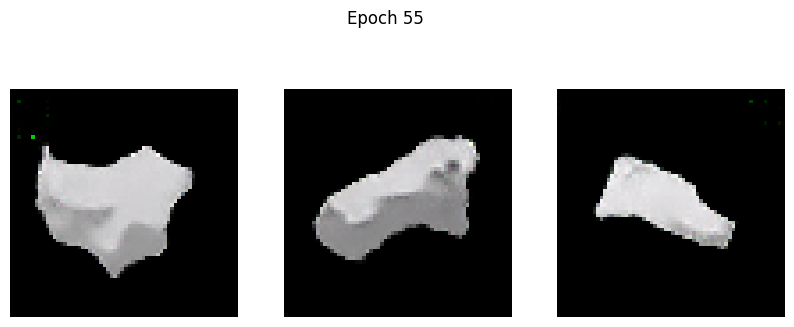

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2882 - g_loss: 1.7422
Epoch 56/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2670 - g_loss: 1.8027

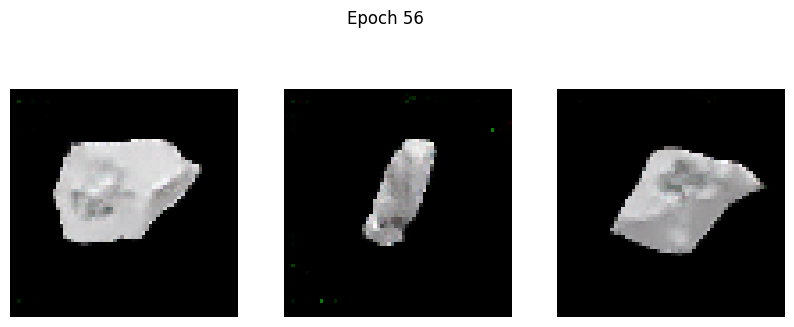

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2671 - g_loss: 1.8028
Epoch 57/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2887 - g_loss: 1.9354

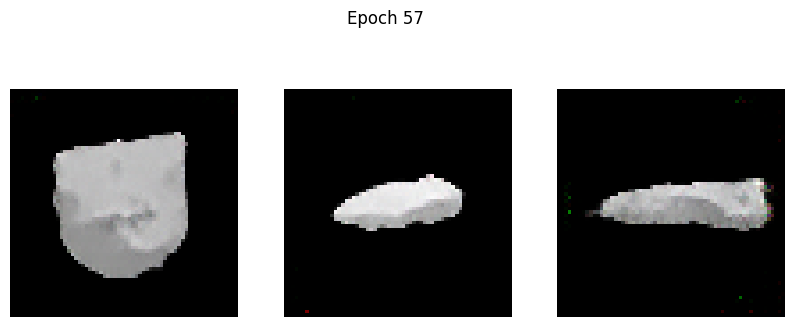

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2888 - g_loss: 1.9351
Epoch 58/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2716 - g_loss: 1.8868

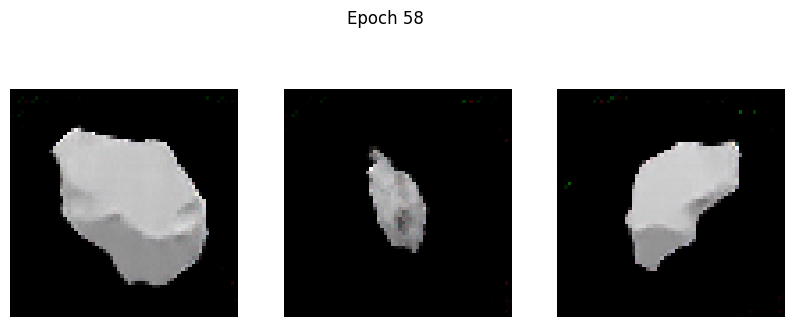

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2717 - g_loss: 1.8870
Epoch 59/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2716 - g_loss: 1.9713

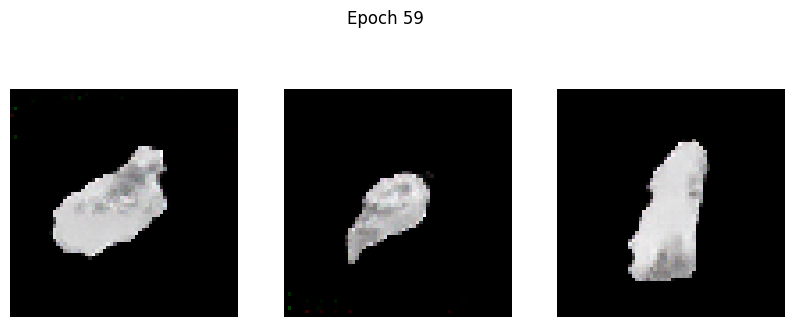

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2716 - g_loss: 1.9713
Epoch 60/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2997 - g_loss: 1.9892

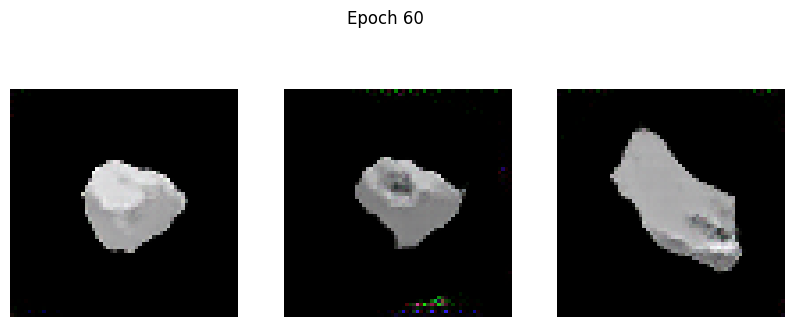

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2995 - g_loss: 1.9892
Epoch 61/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2636 - g_loss: 1.9941

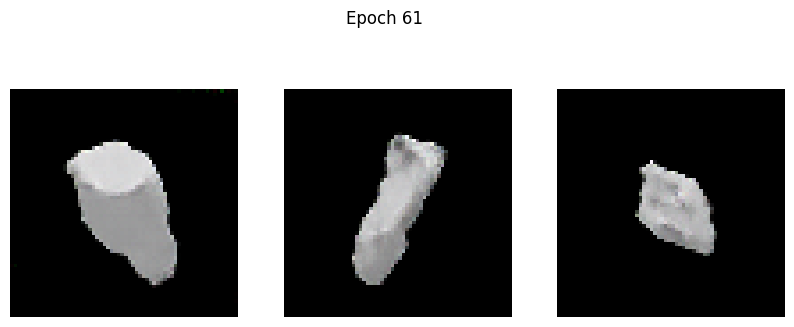

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2637 - g_loss: 1.9942
Epoch 62/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2676 - g_loss: 2.0306

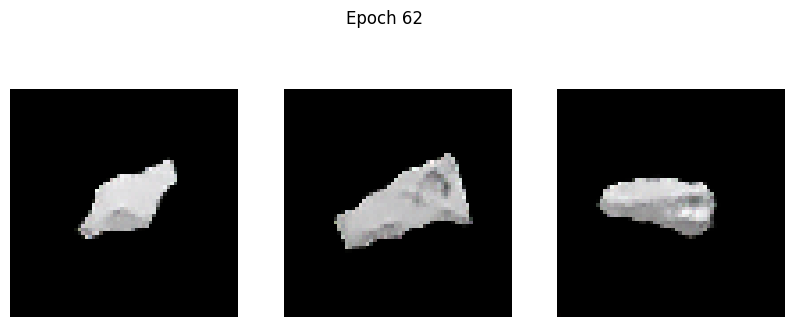

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2674 - g_loss: 2.0304
Epoch 63/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2650 - g_loss: 2.0985

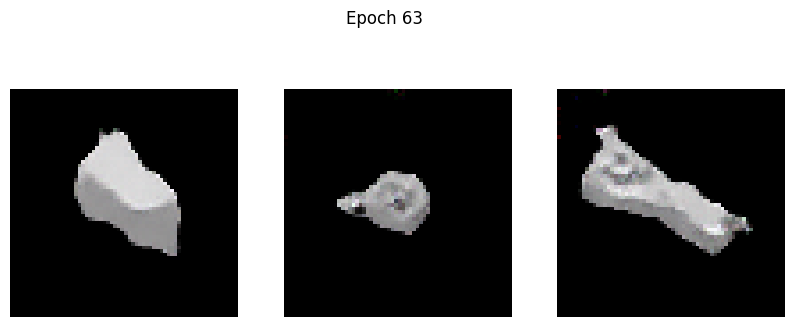

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2651 - g_loss: 2.0984
Epoch 64/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 1.0816 - g_loss: 2.5779

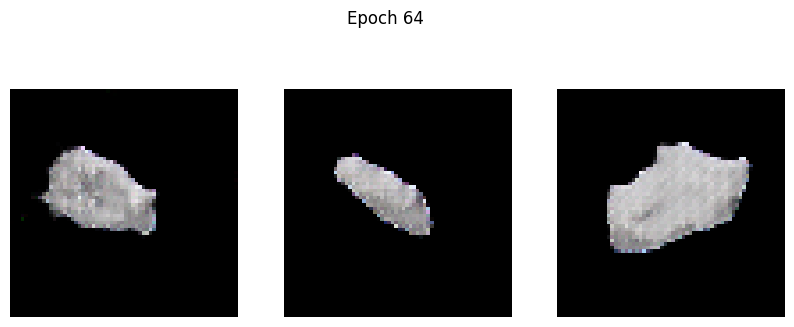

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 1.0833 - g_loss: 2.5758
Epoch 65/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5169 - g_loss: 1.1895

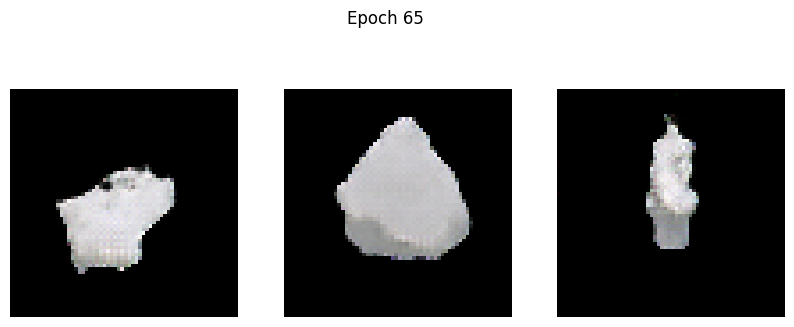

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.5166 - g_loss: 1.1897
Epoch 66/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4309 - g_loss: 1.3465

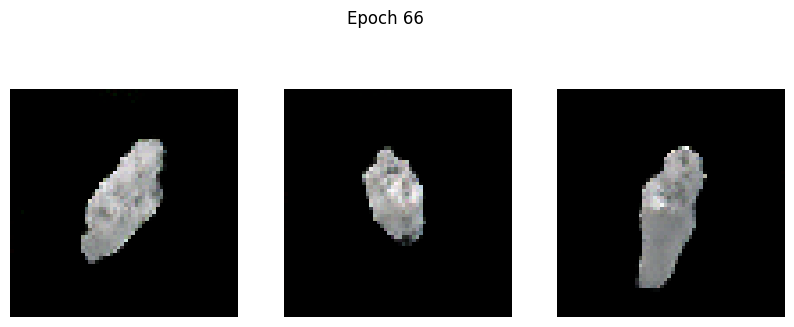

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.4308 - g_loss: 1.3465
Epoch 67/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3803 - g_loss: 1.4565

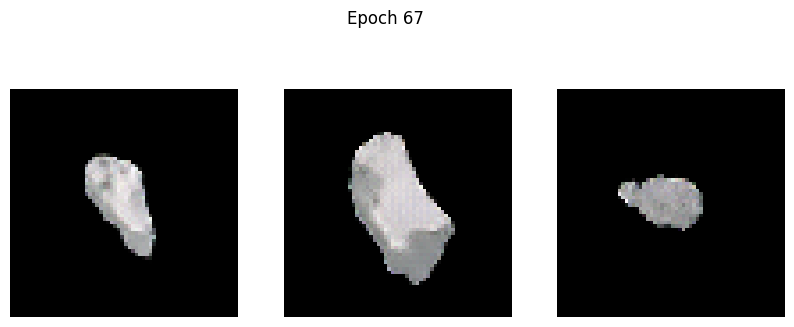

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3802 - g_loss: 1.4567
Epoch 68/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3343 - g_loss: 1.5701

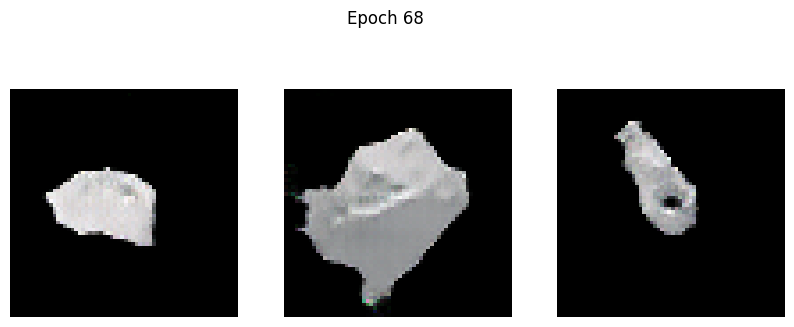

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3342 - g_loss: 1.5703
Epoch 69/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3207 - g_loss: 1.7209

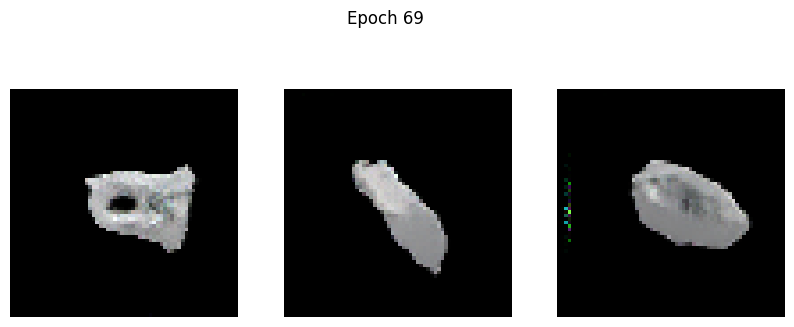

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3206 - g_loss: 1.7206
Epoch 70/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2845 - g_loss: 1.7291

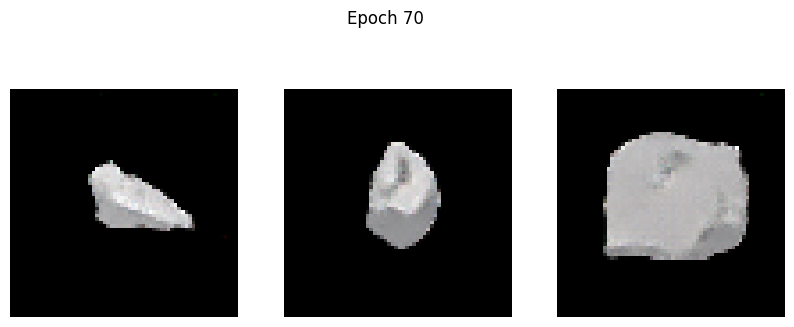

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2845 - g_loss: 1.7293
Epoch 71/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3074 - g_loss: 1.8210

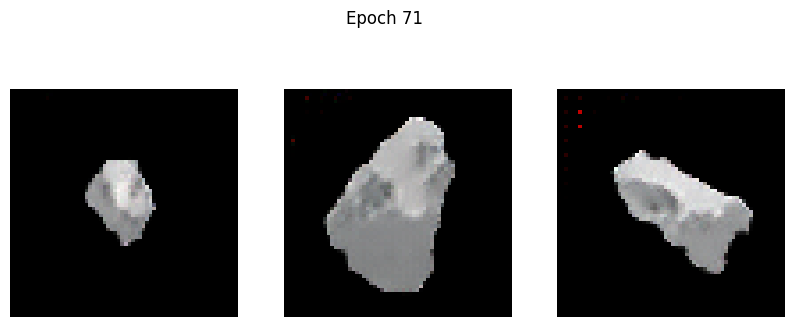

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3074 - g_loss: 1.8211
Epoch 72/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2559 - g_loss: 1.8416

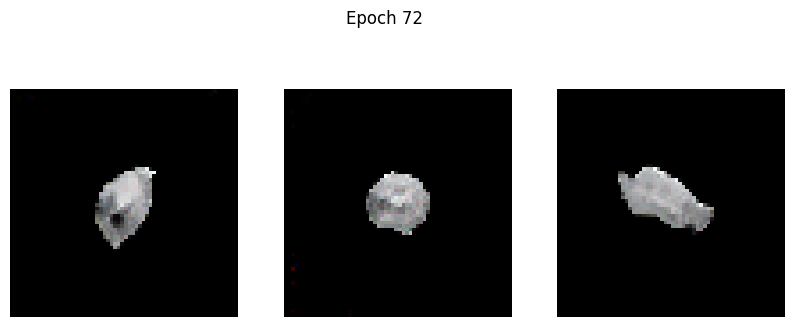

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2561 - g_loss: 1.8419
Epoch 73/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2791 - g_loss: 1.9721

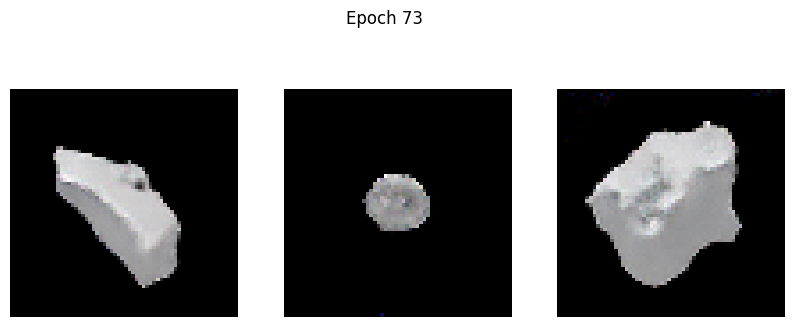

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2790 - g_loss: 1.9720
Epoch 74/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2443 - g_loss: 1.9746

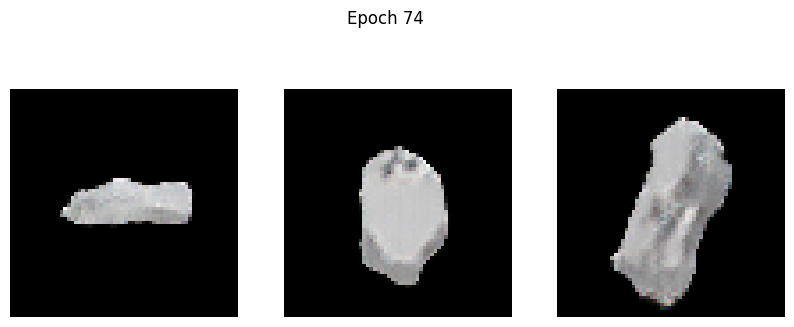

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2445 - g_loss: 1.9743
Epoch 75/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2536 - g_loss: 2.0055

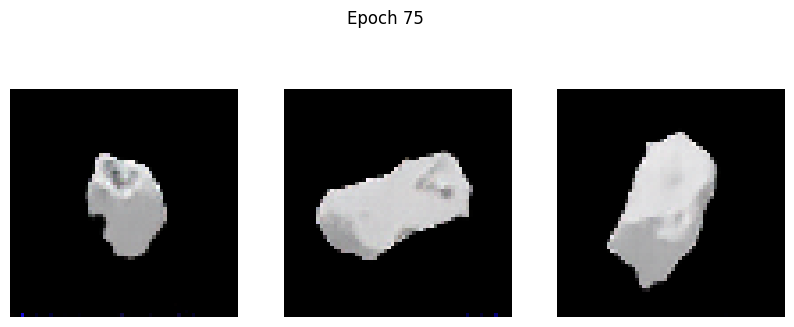

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2538 - g_loss: 2.0055
Epoch 76/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2368 - g_loss: 1.9810

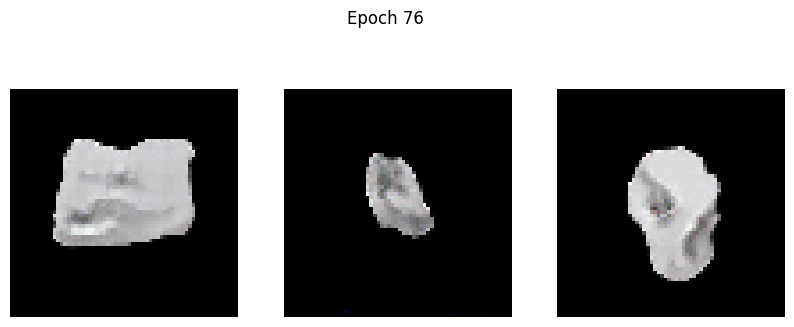

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2370 - g_loss: 1.9814
Epoch 77/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2409 - g_loss: 2.0515

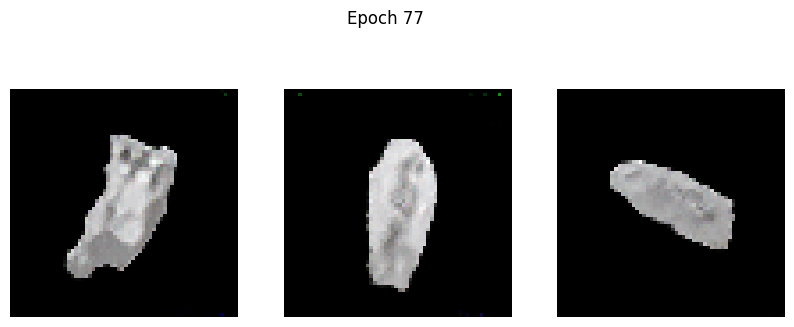

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2409 - g_loss: 2.0515
Epoch 78/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3096 - g_loss: 2.3607

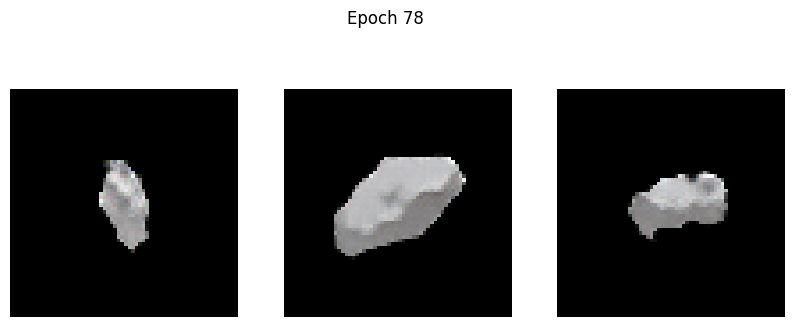

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3102 - g_loss: 2.3624
Epoch 79/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2382 - g_loss: 2.0639

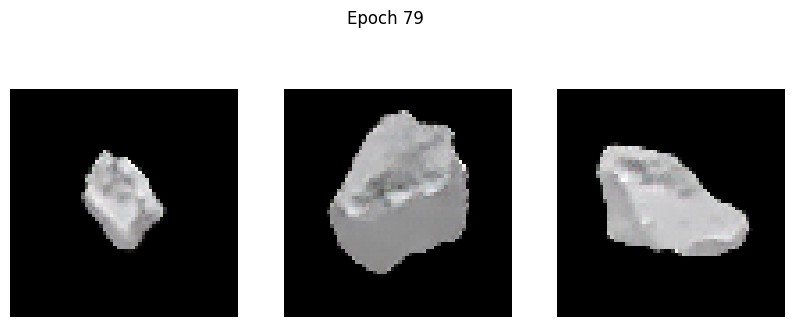

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2382 - g_loss: 2.0638
Epoch 80/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2227 - g_loss: 2.0699

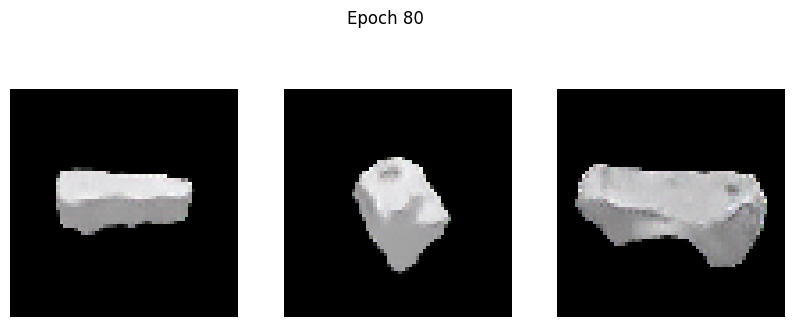

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2228 - g_loss: 2.0700
Epoch 81/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2415 - g_loss: 2.2020

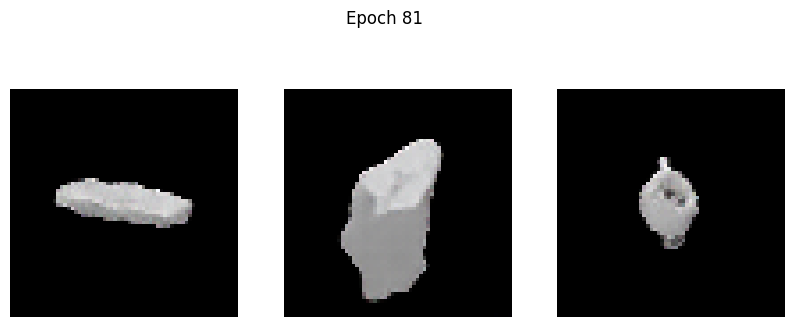

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2414 - g_loss: 2.2016
Epoch 82/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2120 - g_loss: 2.1497

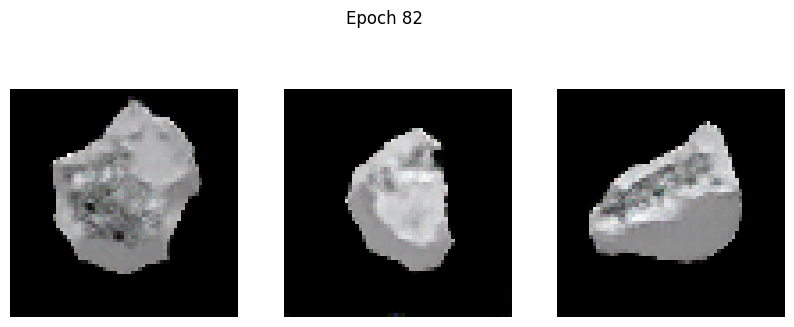

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2120 - g_loss: 2.1496
Epoch 83/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2141 - g_loss: 2.1978

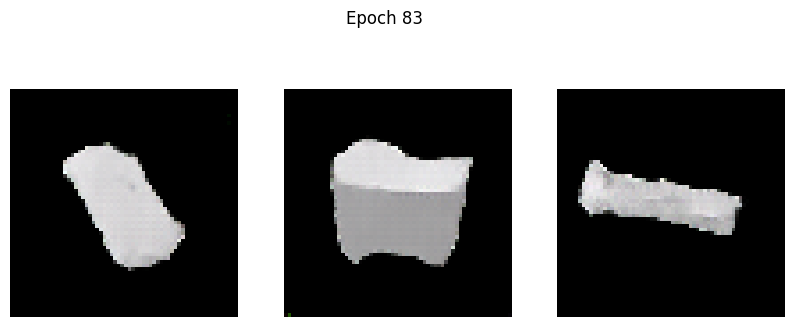

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2142 - g_loss: 2.1981
Epoch 84/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2805 - g_loss: 2.3059

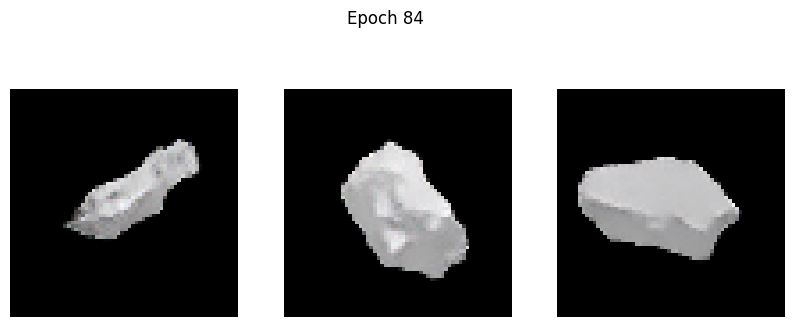

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2801 - g_loss: 2.3057
Epoch 85/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1967 - g_loss: 2.2051

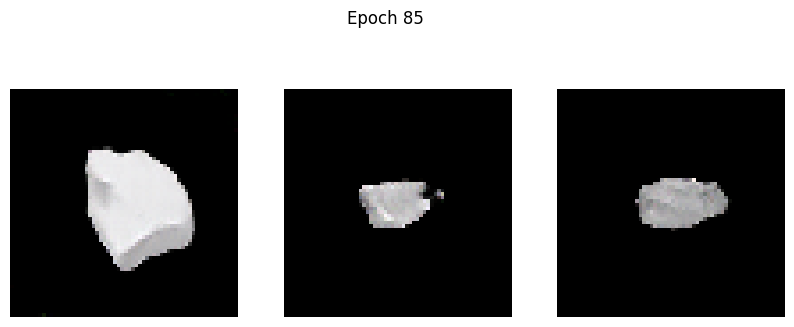

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1967 - g_loss: 2.2052
Epoch 86/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2218 - g_loss: 2.2902

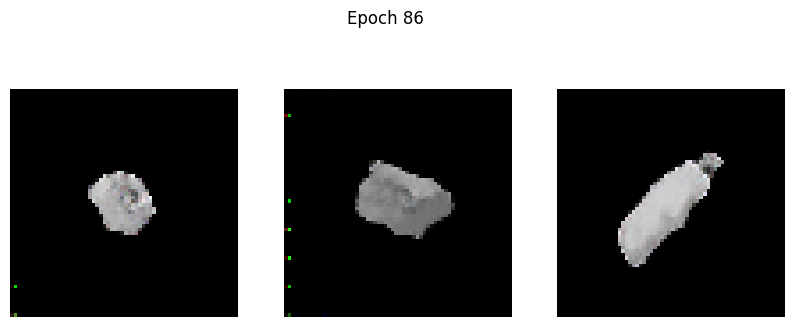

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2218 - g_loss: 2.2901
Epoch 87/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3028 - g_loss: 2.4293

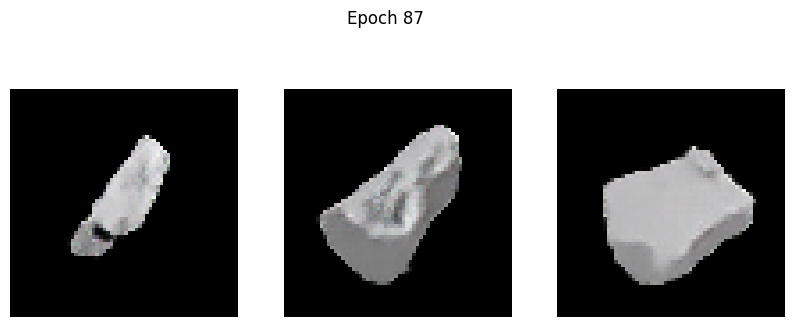

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3023 - g_loss: 2.4284
Epoch 88/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2146 - g_loss: 2.2595

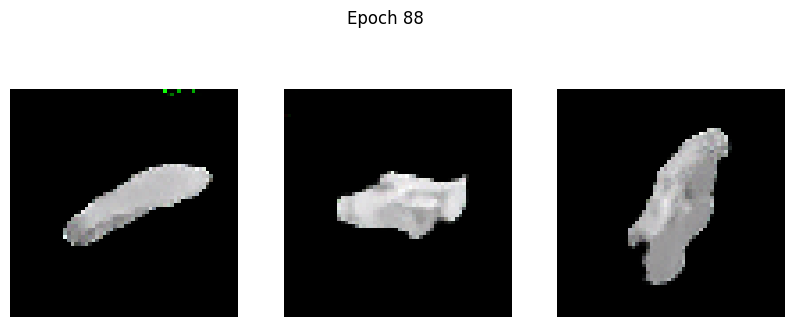

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2148 - g_loss: 2.2597
Epoch 89/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2385 - g_loss: 2.2588

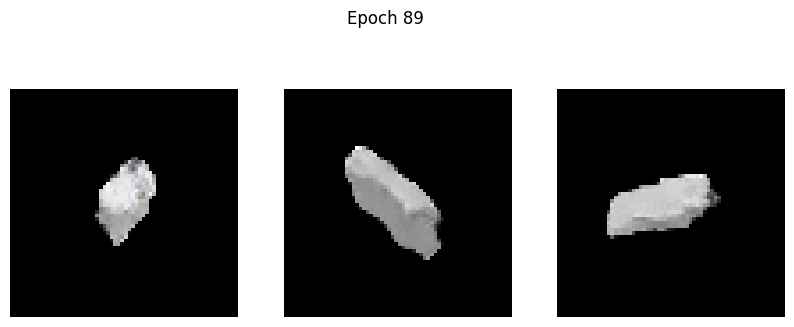

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2381 - g_loss: 2.2588
Epoch 90/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1745 - g_loss: 2.2799

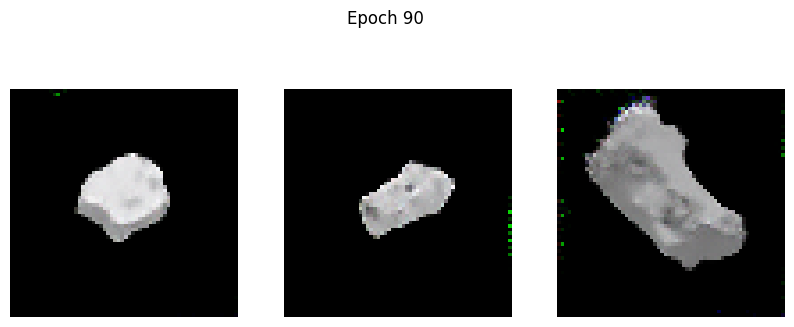

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.1747 - g_loss: 2.2799
Epoch 91/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2058 - g_loss: 2.3545

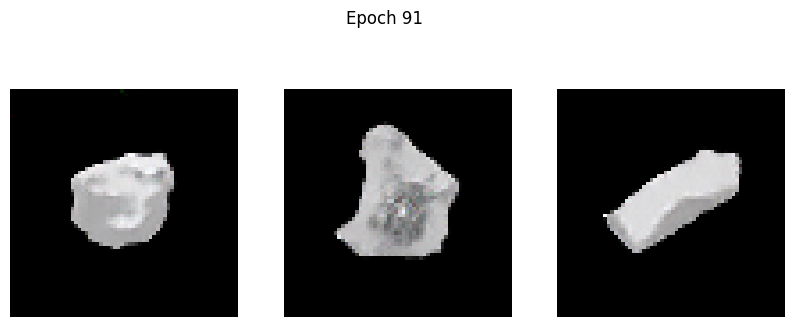

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2059 - g_loss: 2.3541
Epoch 92/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1934 - g_loss: 2.3935

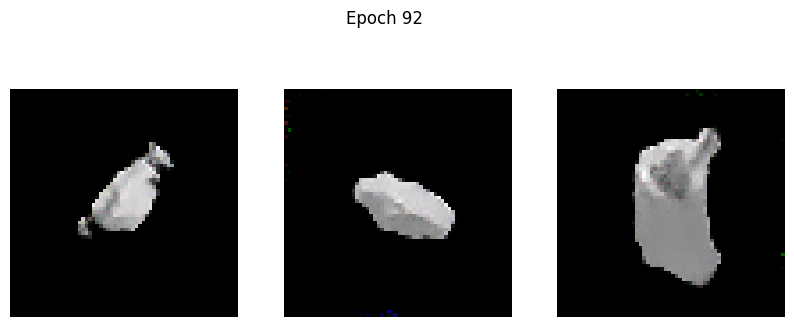

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.1933 - g_loss: 2.3928
Epoch 93/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1961 - g_loss: 2.4202

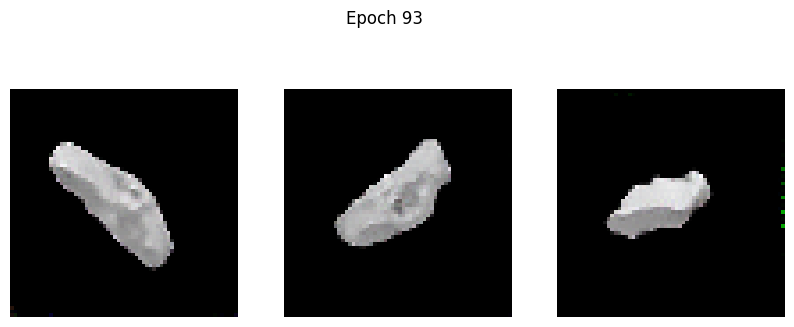

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.1964 - g_loss: 2.4205
Epoch 94/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4474 - g_loss: 2.5673

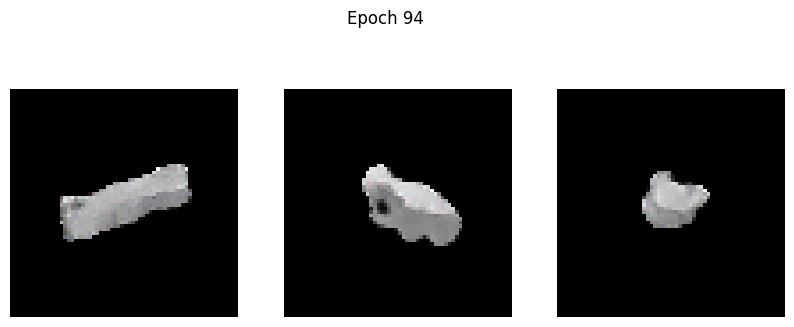

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.4459 - g_loss: 2.5652
Epoch 95/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2249 - g_loss: 2.4637

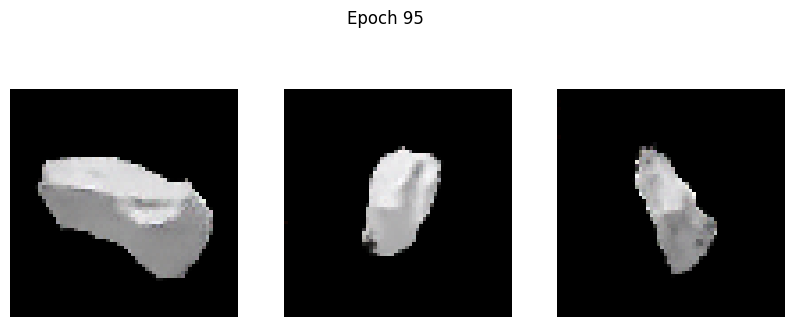

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2245 - g_loss: 2.4624
Epoch 96/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1730 - g_loss: 2.4076

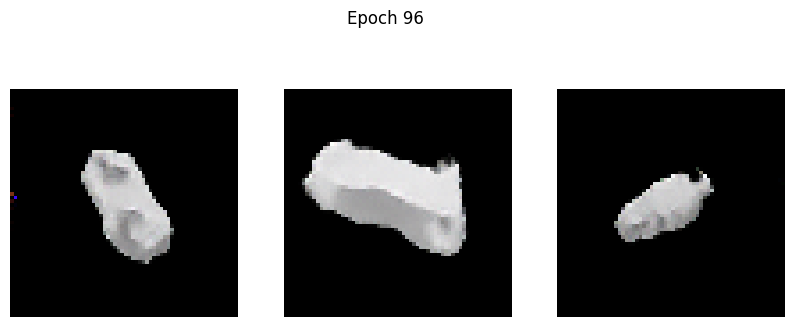

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1729 - g_loss: 2.4073
Epoch 97/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2323 - g_loss: 2.4988

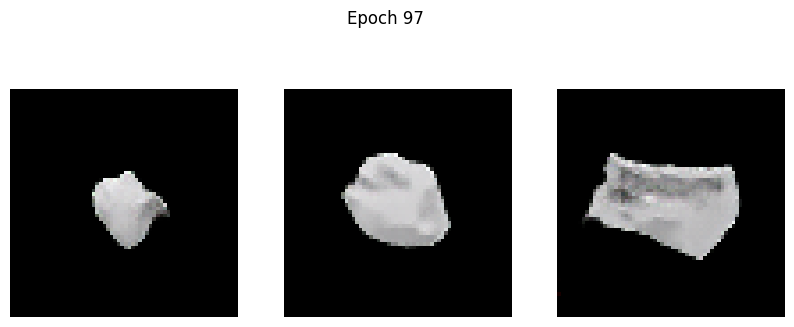

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2322 - g_loss: 2.4987
Epoch 98/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1274 - g_loss: 2.4338

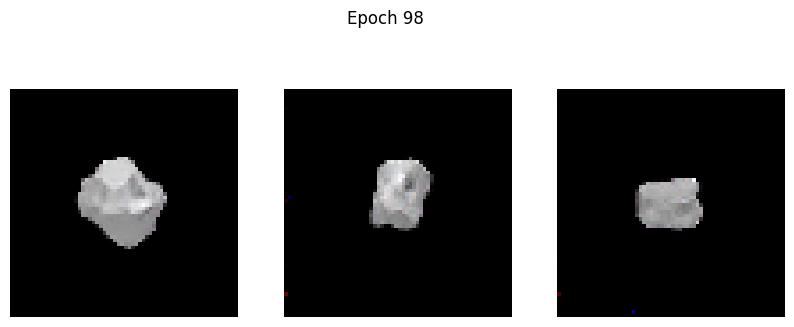

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.1277 - g_loss: 2.4336
Epoch 99/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1450 - g_loss: 2.4631

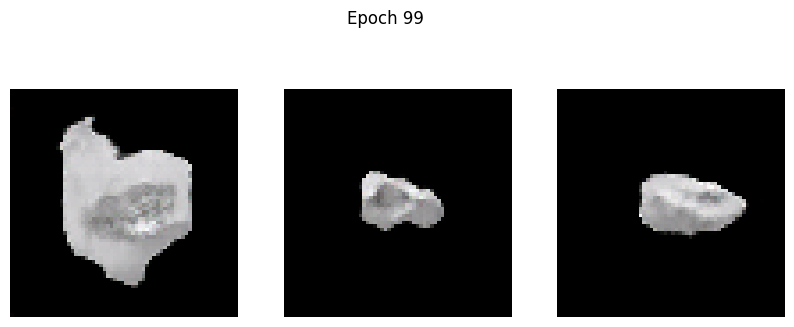

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.1451 - g_loss: 2.4627
Epoch 100/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1921 - g_loss: 2.4229

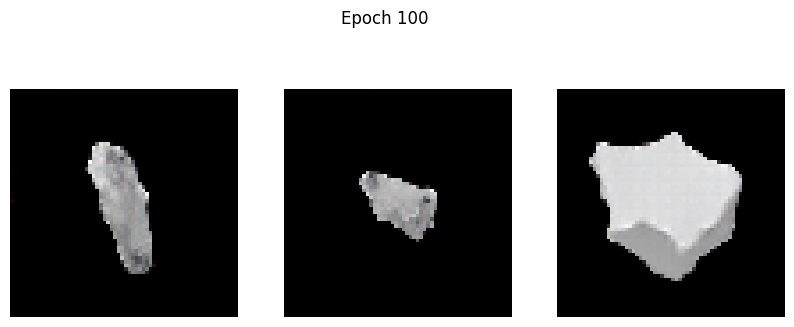

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: 0.1924 - g_loss: 2.4229
Epoch 101/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.1542 - g_loss: 2.5104

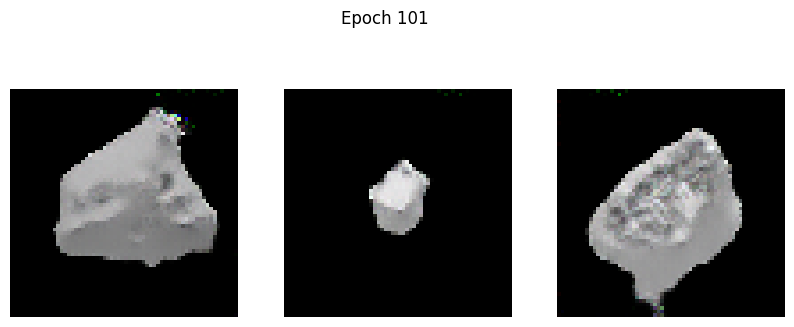

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: 0.1544 - g_loss: 2.5101
Epoch 102/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: 0.1732 - g_loss: 2.5282

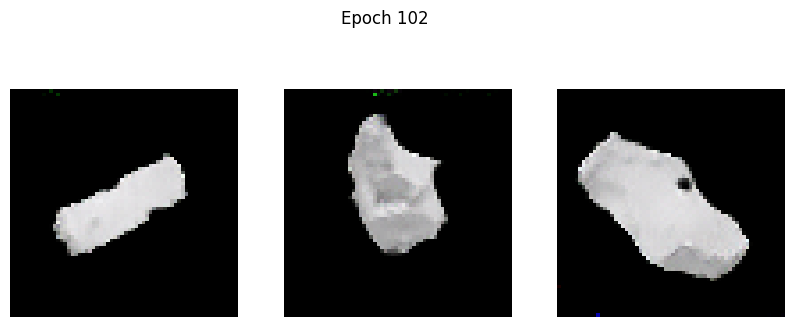

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1741 - g_loss: 2.5293
Epoch 103/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0916 - g_loss: 2.3473

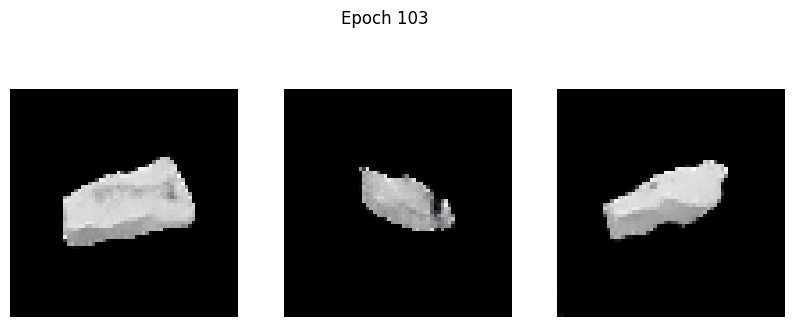

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: 0.0922 - g_loss: 2.3480
Epoch 104/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0960 - g_loss: 2.4256

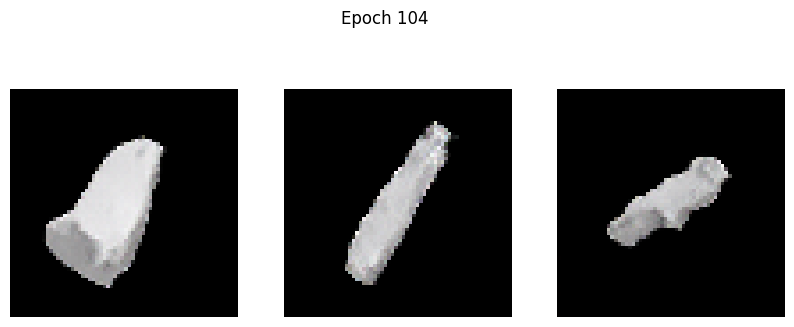

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0961 - g_loss: 2.4257
Epoch 105/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1619 - g_loss: 2.5397

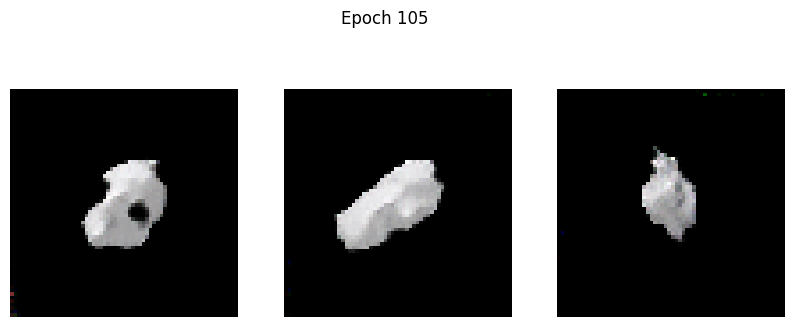

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1620 - g_loss: 2.5399
Epoch 106/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1373 - g_loss: 2.5214

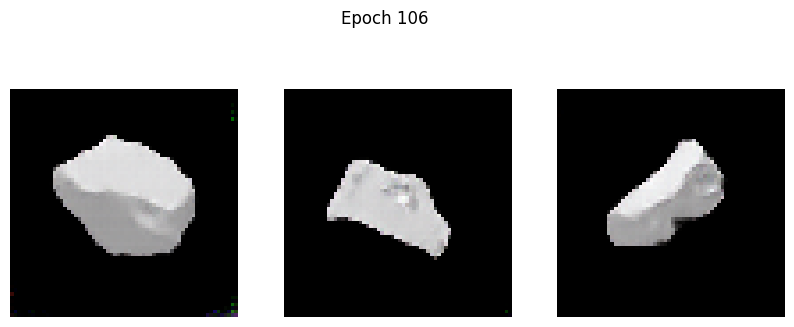

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1369 - g_loss: 2.5212
Epoch 107/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1956 - g_loss: 2.6097

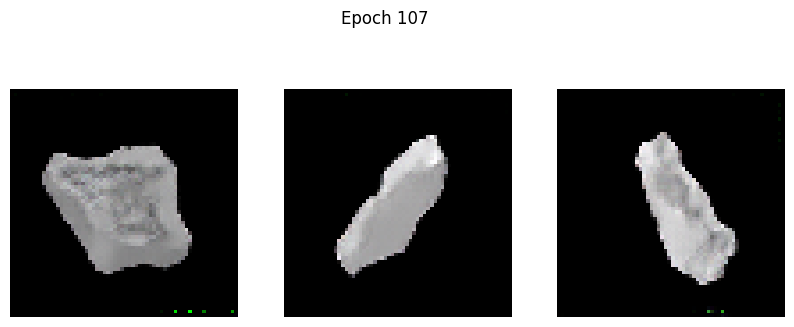

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.1955 - g_loss: 2.6101
Epoch 108/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0975 - g_loss: 2.5162

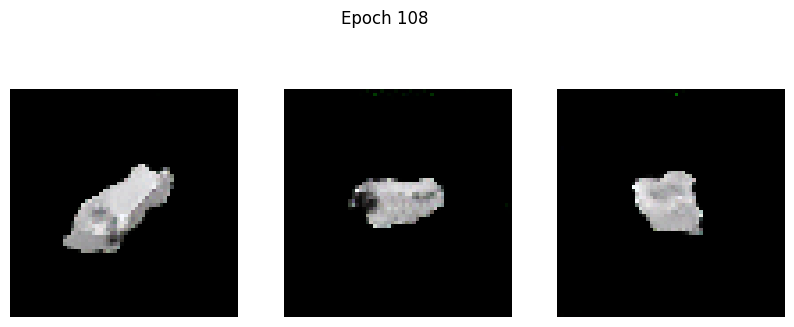

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.0975 - g_loss: 2.5165
Epoch 109/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1243 - g_loss: 2.5181

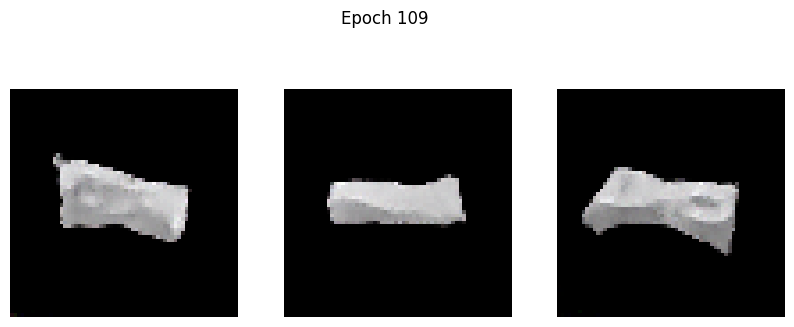

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.1243 - g_loss: 2.5189
Epoch 110/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2052 - g_loss: 2.7046

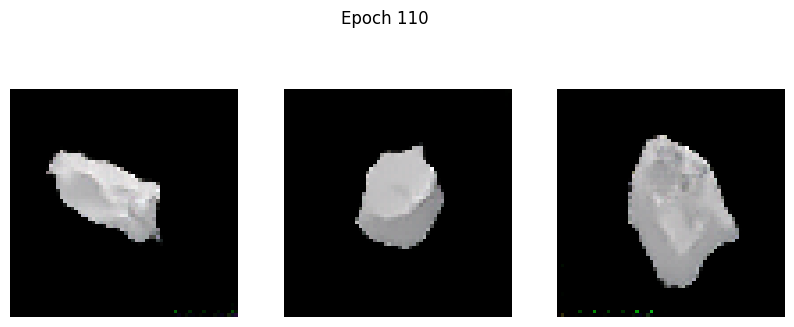

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2061 - g_loss: 2.7047
Epoch 111/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0985 - g_loss: 2.3679

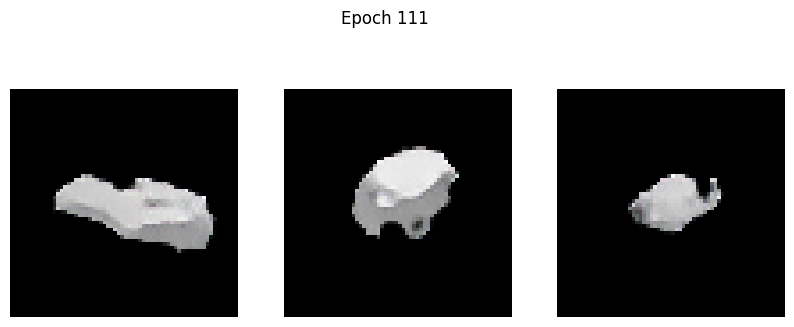

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0983 - g_loss: 2.3686
Epoch 112/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0645 - g_loss: 2.4780

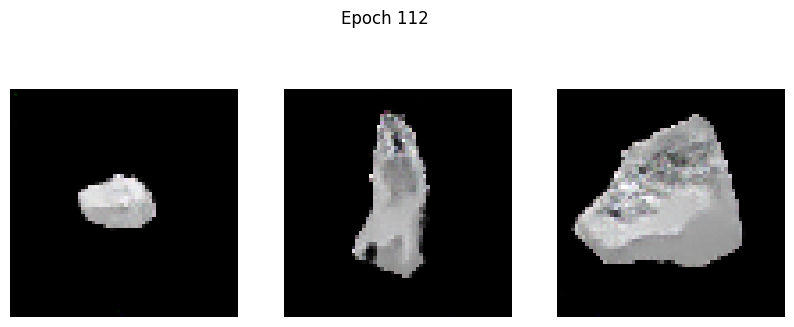

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0643 - g_loss: 2.4782
Epoch 113/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0384 - g_loss: 2.6710

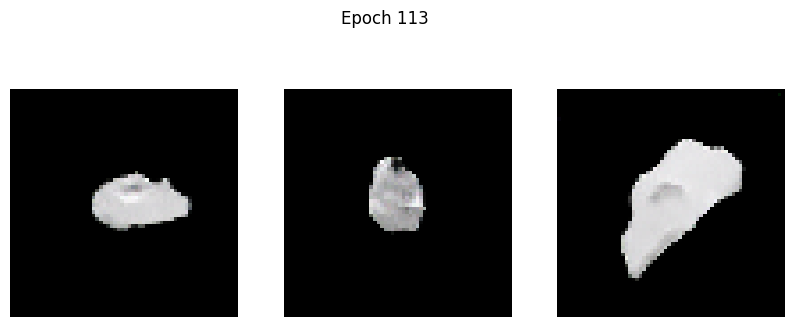

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.0386 - g_loss: 2.6709
Epoch 114/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5541 - g_loss: 2.9962

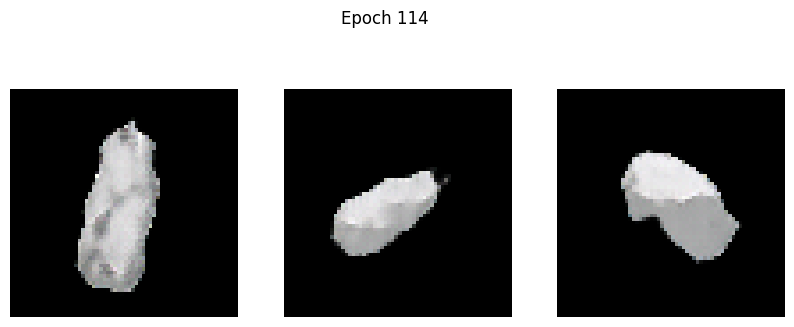

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.5553 - g_loss: 2.9958
Epoch 115/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1162 - g_loss: 2.1161

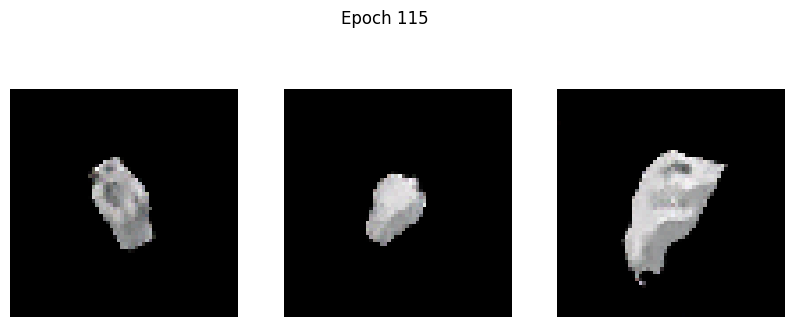

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.1159 - g_loss: 2.1164
Epoch 116/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0339 - g_loss: 2.4187

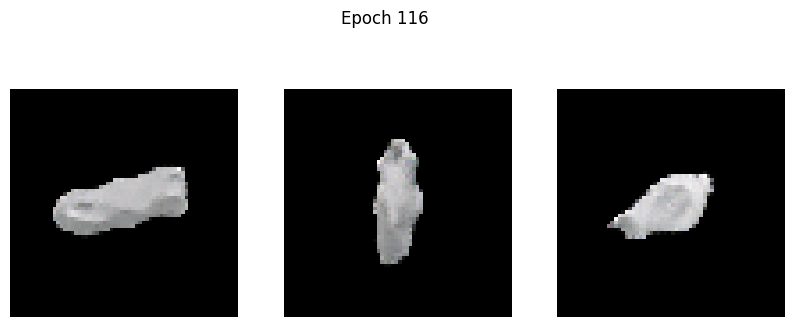

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.0337 - g_loss: 2.4184
Epoch 117/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0153 - g_loss: 2.4607

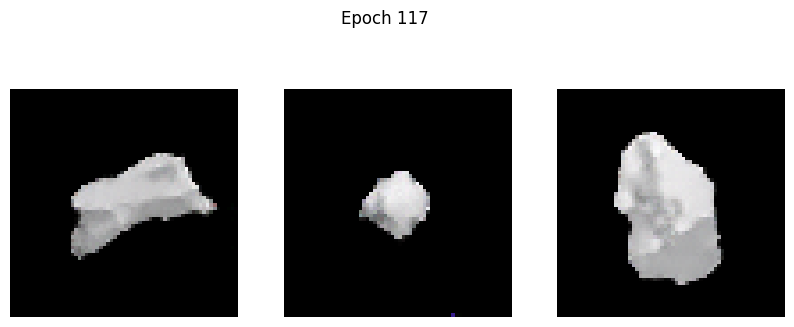

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.0153 - g_loss: 2.4605
Epoch 118/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0320 - g_loss: 2.5928

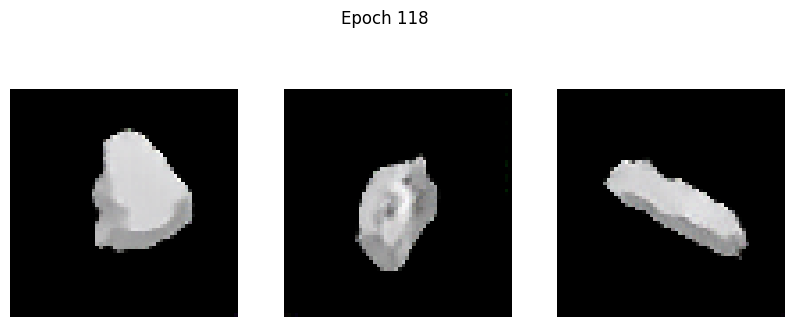

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.0320 - g_loss: 2.5925
Epoch 119/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0403 - g_loss: 2.7013

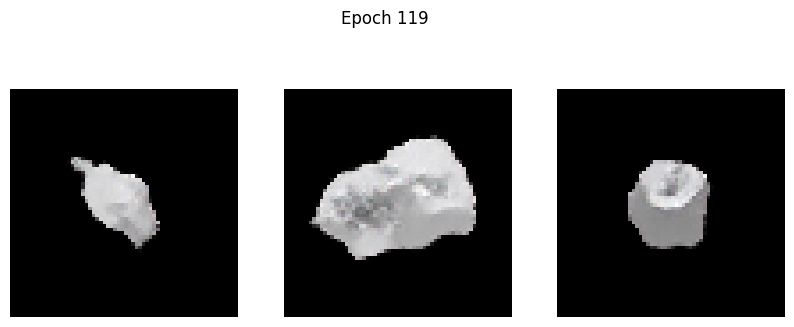

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0402 - g_loss: 2.7008
Epoch 120/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1125 - g_loss: 2.7578

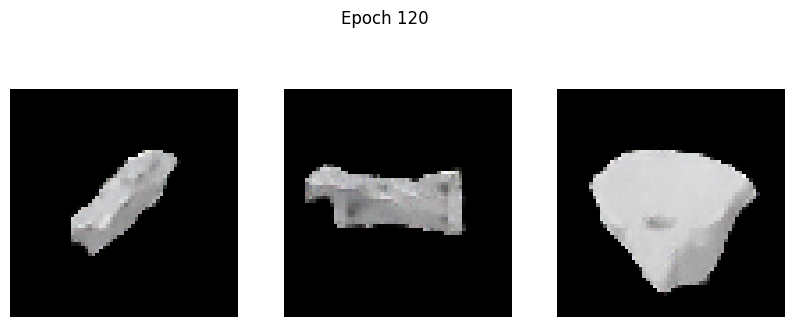

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1127 - g_loss: 2.7578
Epoch 121/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0173 - g_loss: 2.6413

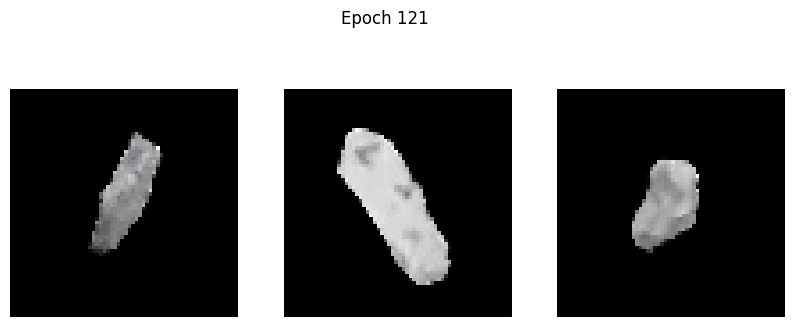

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0172 - g_loss: 2.6417
Epoch 122/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0115 - g_loss: 2.7421

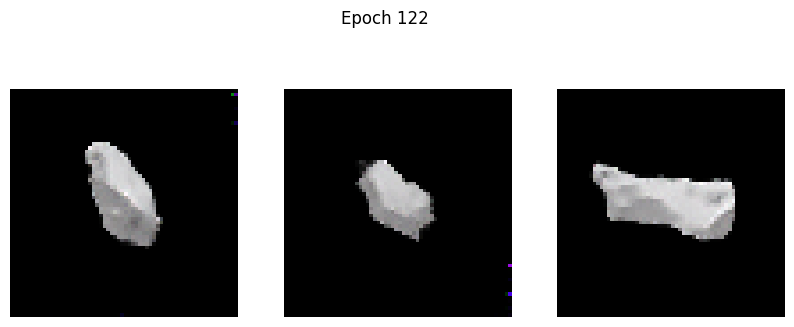

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.0116 - g_loss: 2.7426
Epoch 123/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.5102 - g_loss: 3.1445

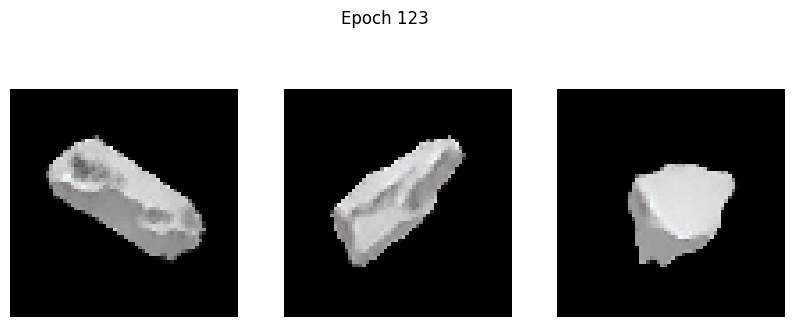

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.5072 - g_loss: 3.1418
Epoch 124/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0552 - g_loss: 2.8260

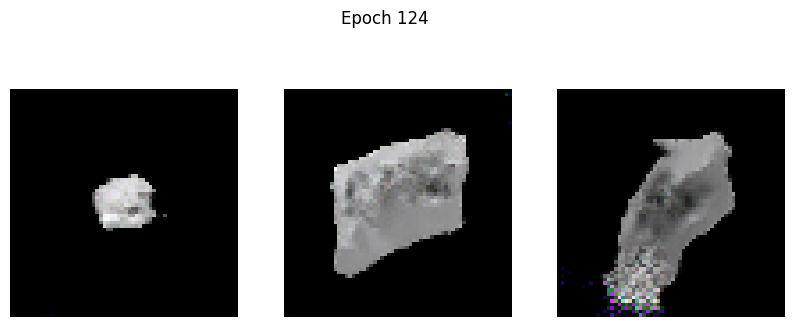

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.0552 - g_loss: 2.8268
Epoch 125/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1703 - g_loss: 2.9436

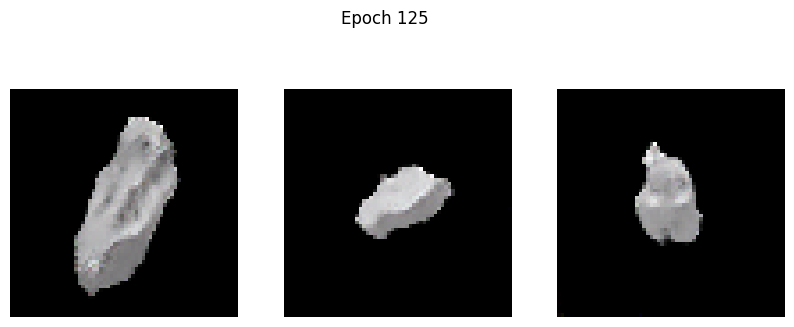

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.1692 - g_loss: 2.9420
Epoch 126/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0387 - g_loss: 2.6884

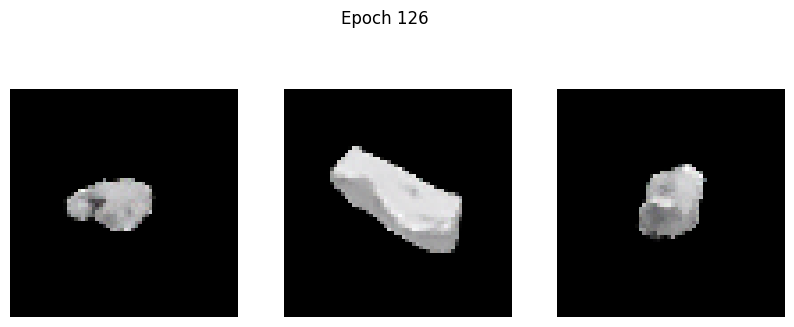

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.0389 - g_loss: 2.6886
Epoch 127/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1292 - g_loss: 2.7827

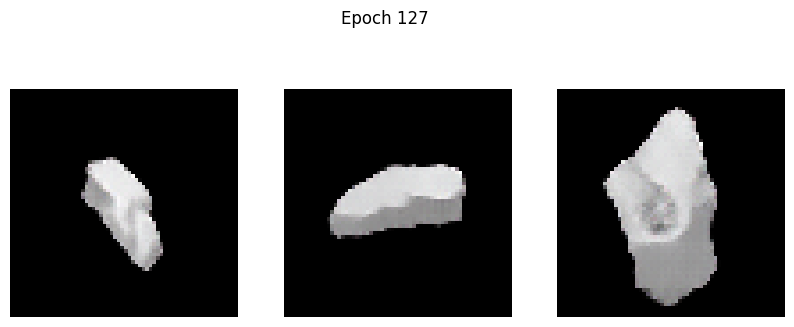

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.1281 - g_loss: 2.7836
Epoch 128/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0342 - g_loss: 2.8862

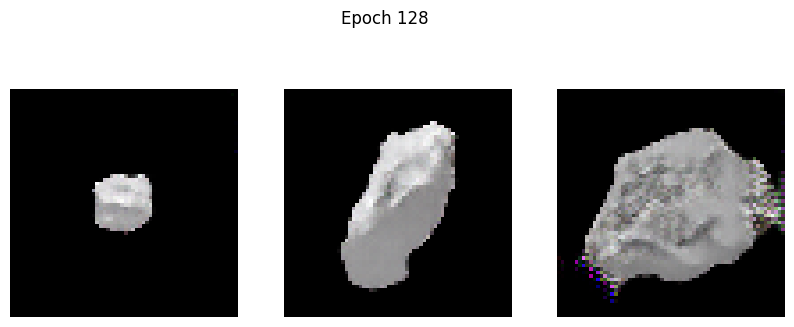

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.0344 - g_loss: 2.8859
Epoch 129/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 3.7895 - g_loss: 8.5126

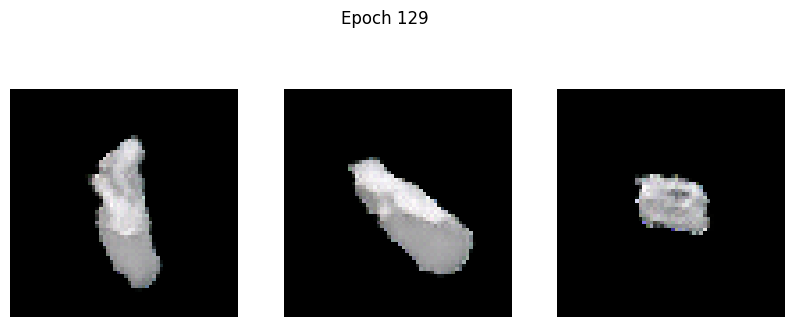

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 3.7766 - g_loss: 8.4912
Epoch 130/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3059 - g_loss: 2.1486

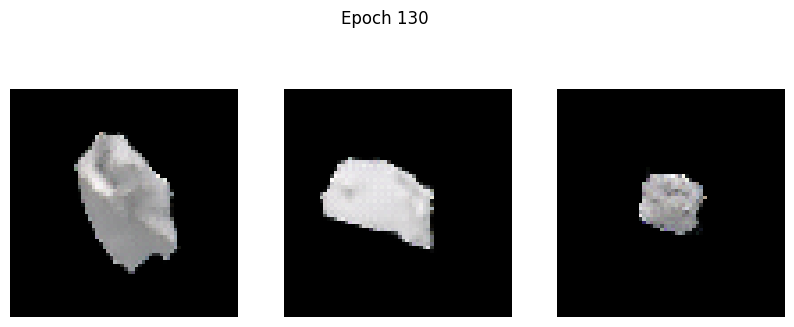

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3050 - g_loss: 2.1477
Epoch 131/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0779 - g_loss: 2.0574

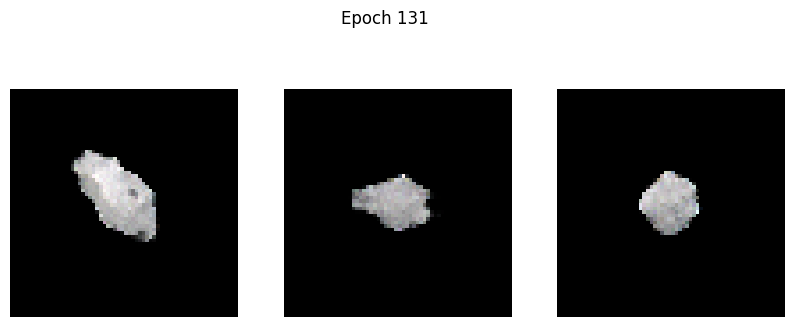

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.0779 - g_loss: 2.0576
Epoch 132/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0601 - g_loss: 2.0929

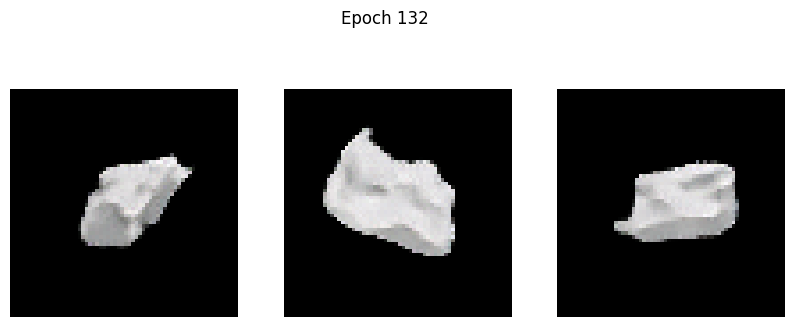

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.0597 - g_loss: 2.0933
Epoch 133/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0576 - g_loss: 2.2480

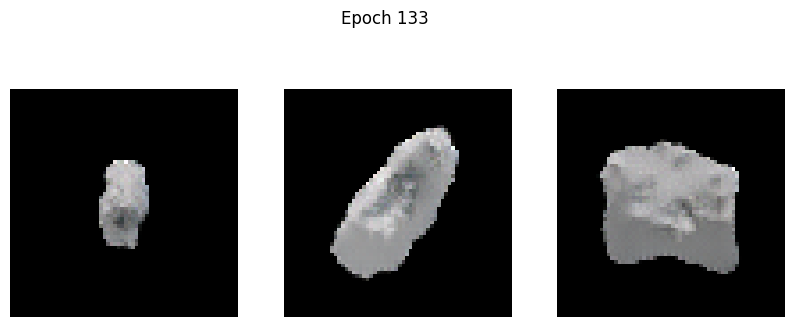

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0577 - g_loss: 2.2482
Epoch 134/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0770 - g_loss: 2.2623

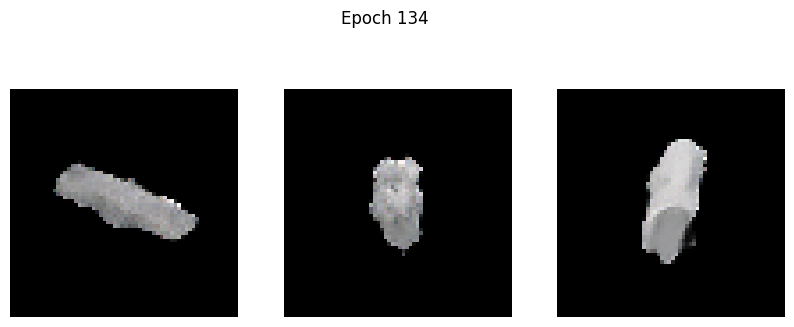

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.0774 - g_loss: 2.2628
Epoch 135/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1356 - g_loss: 2.4191

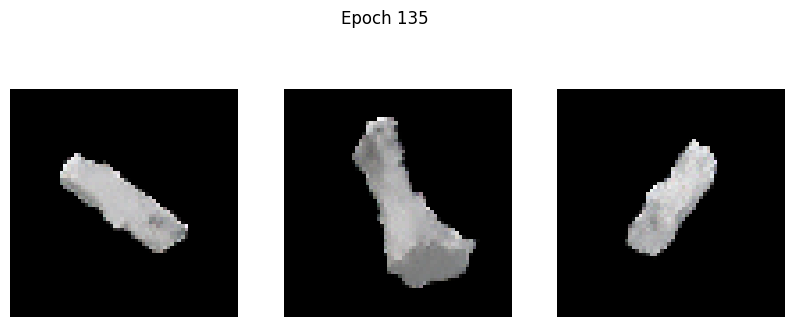

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.1354 - g_loss: 2.4190
Epoch 136/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0074 - g_loss: 2.4261

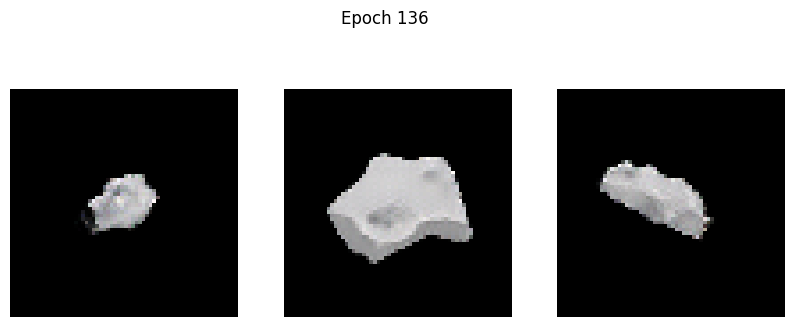

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.0068 - g_loss: 2.4274
Epoch 137/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1963 - g_loss: 2.4136

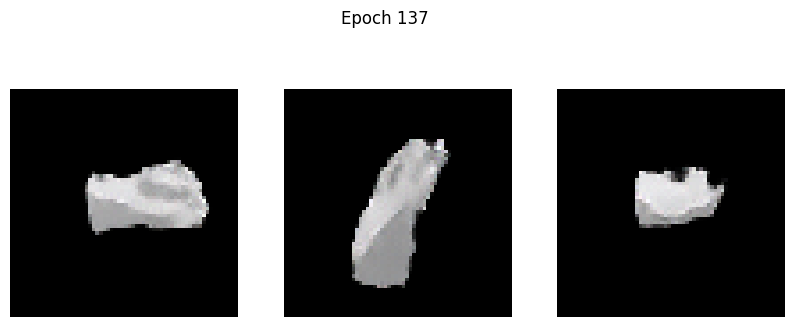

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.1962 - g_loss: 2.4143
Epoch 138/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0835 - g_loss: 2.5553

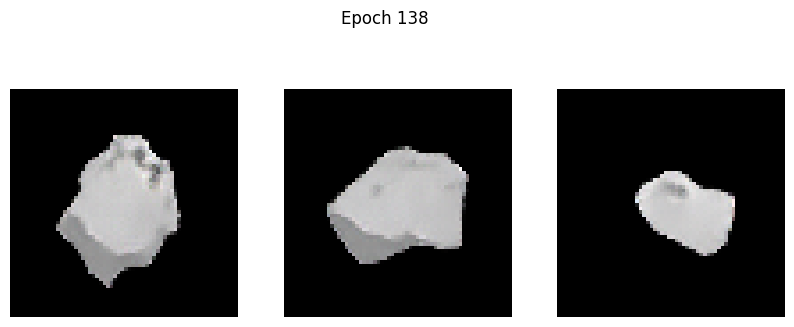

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.0839 - g_loss: 2.5555
Epoch 139/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1068 - g_loss: 2.6090

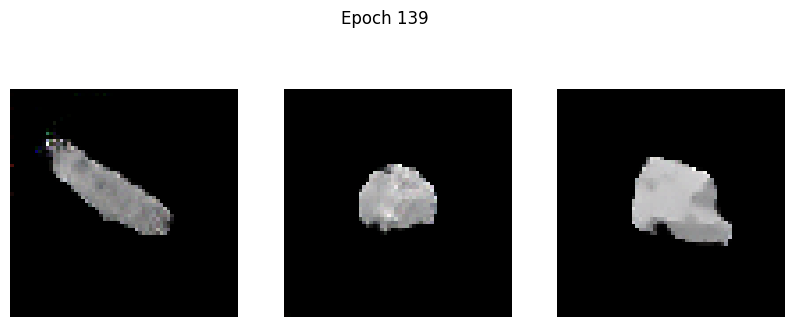

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.1069 - g_loss: 2.6096
Epoch 140/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1011 - g_loss: 2.7012

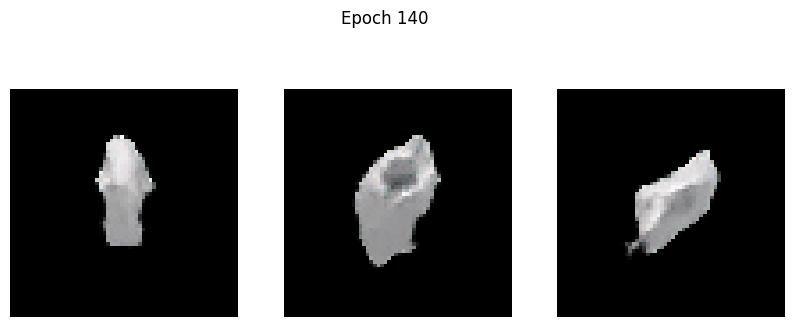

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.1012 - g_loss: 2.7016
Epoch 141/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1676 - g_loss: 2.7110

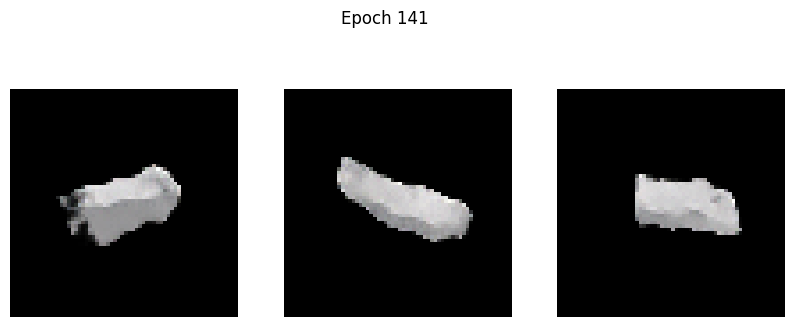

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.1666 - g_loss: 2.7121
Epoch 142/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2165 - g_loss: 3.2594

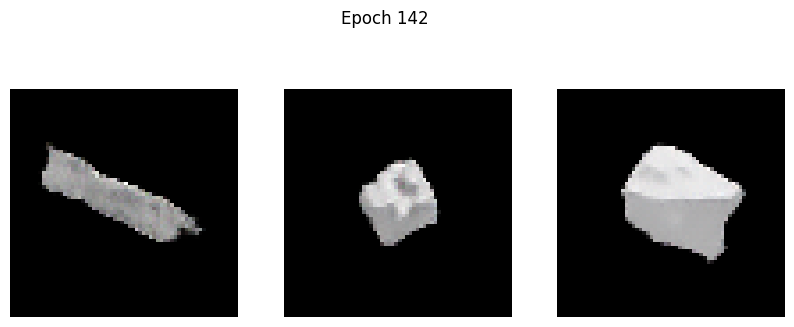

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.2178 - g_loss: 3.2611
Epoch 143/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.2112 - g_loss: 2.6449

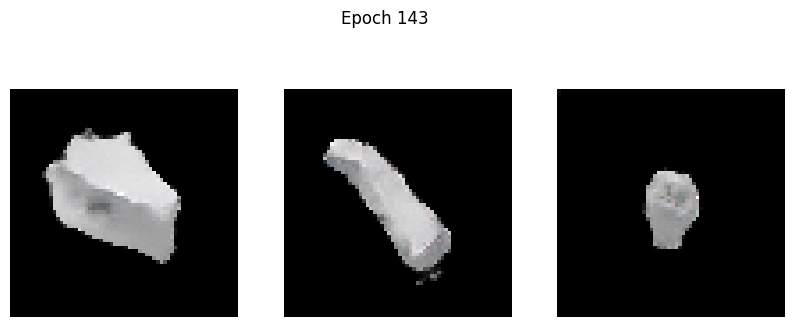

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: -0.2111 - g_loss: 2.6450
Epoch 144/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.3881 - g_loss: 2.6359

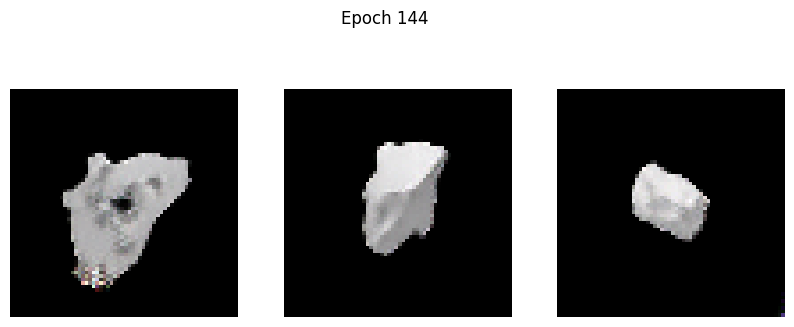

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -0.3878 - g_loss: 2.6364
Epoch 145/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.2536 - g_loss: 2.8138

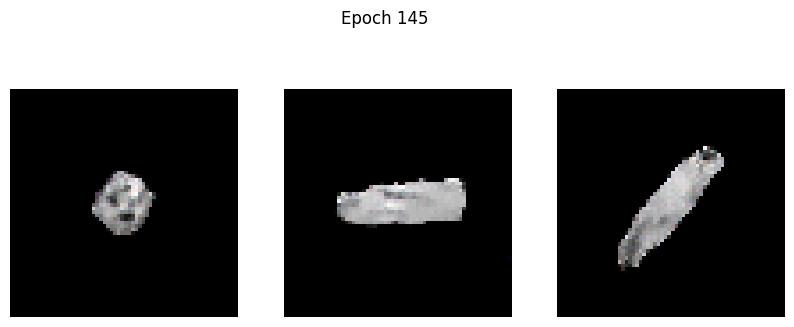

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.2522 - g_loss: 2.8156
Epoch 146/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0211 - g_loss: 2.9639

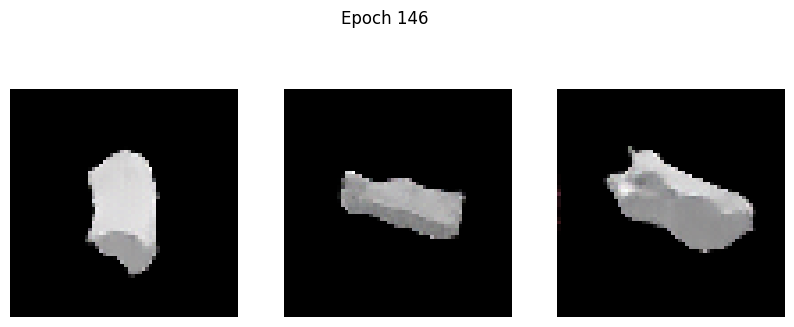

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -0.0206 - g_loss: 2.9635
Epoch 147/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1807 - g_loss: 2.7500

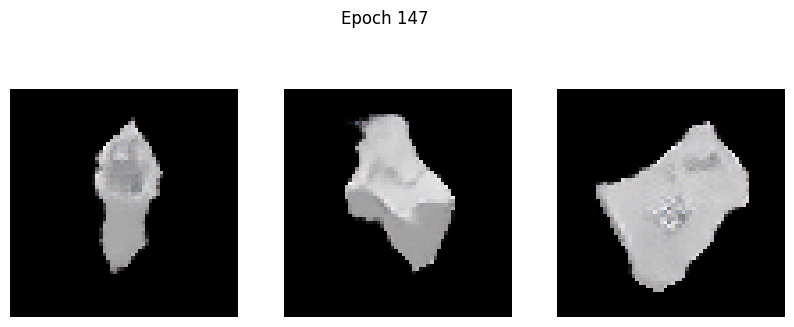

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1817 - g_loss: 2.7505
Epoch 148/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.4616 - g_loss: 2.8230

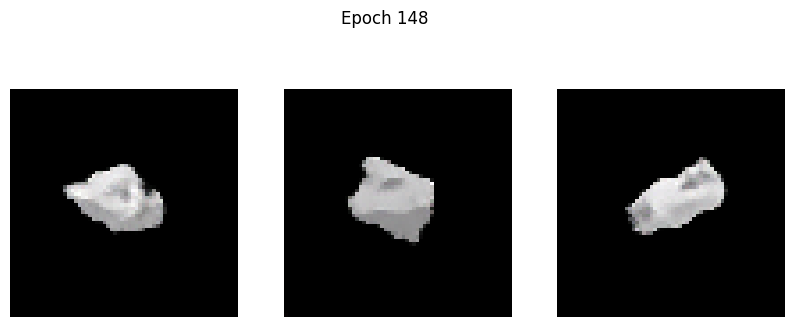

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.4601 - g_loss: 2.8237
Epoch 149/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.2188 - g_loss: 3.0436

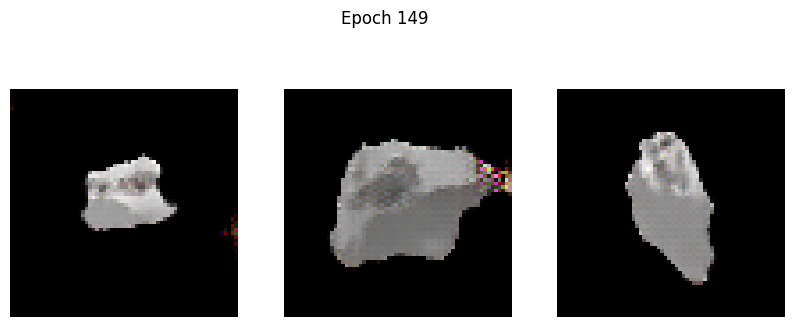

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.2152 - g_loss: 3.0462
Epoch 150/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.9578 - g_loss: 3.9298

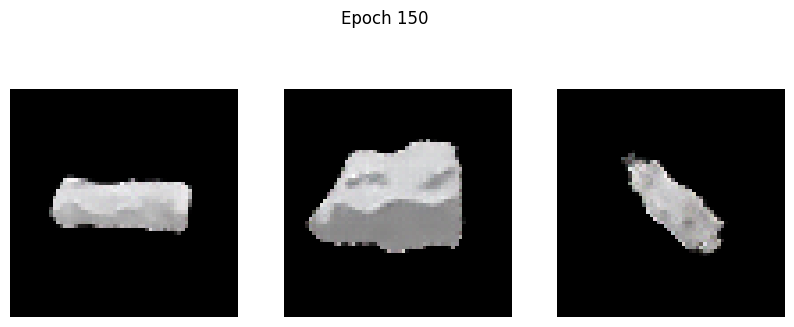

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.9509 - g_loss: 3.9234
Epoch 151/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.3094 - g_loss: 2.7112

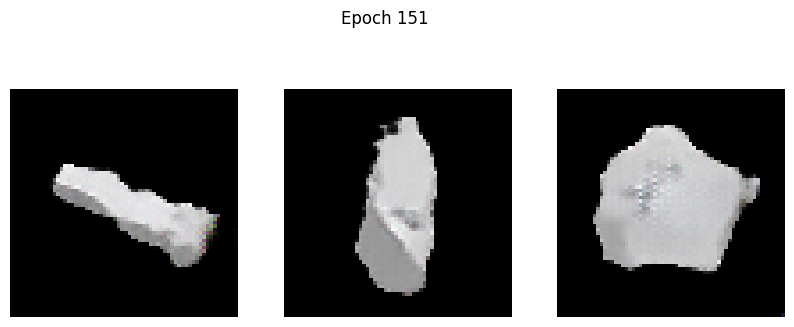

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.3099 - g_loss: 2.7118
Epoch 152/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.3159 - g_loss: 2.7621

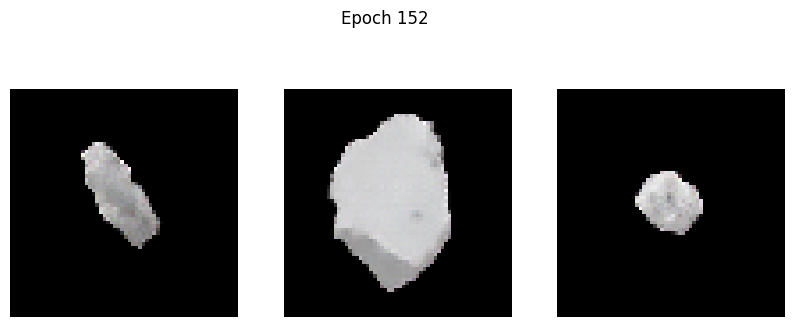

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.3164 - g_loss: 2.7627
Epoch 153/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.4667 - g_loss: 3.0140

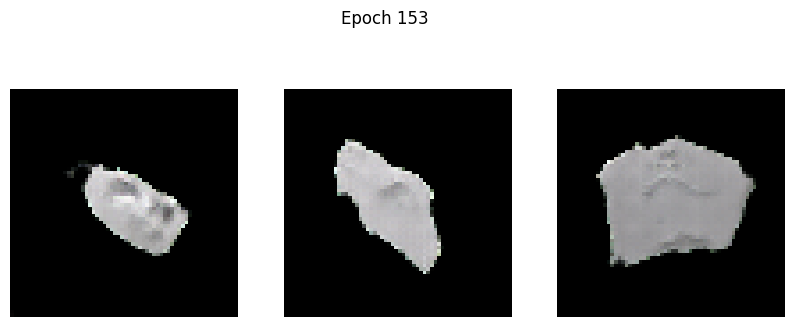

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.4640 - g_loss: 3.0166
Epoch 154/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1505 - g_loss: 3.1890

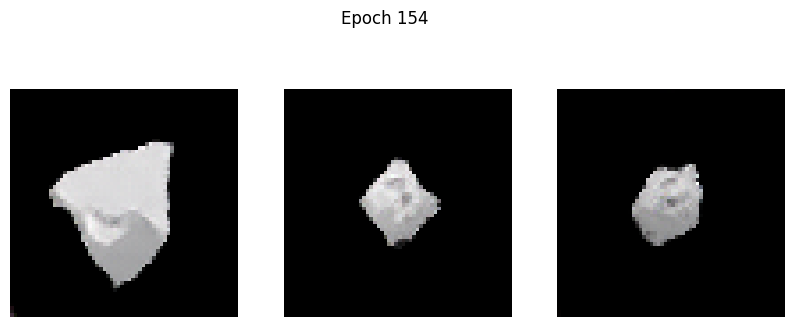

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1470 - g_loss: 3.1868
Epoch 155/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.4598 - g_loss: 3.0062

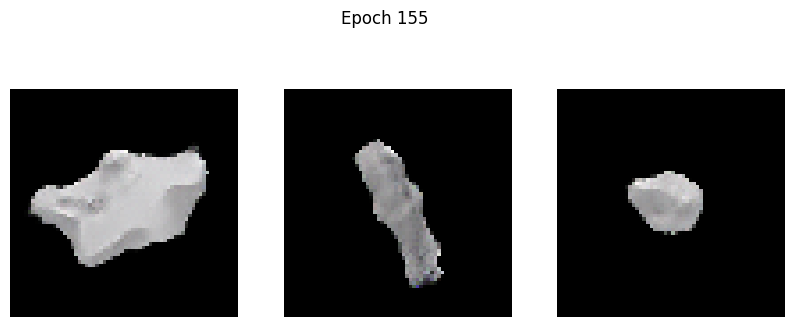

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.4600 - g_loss: 3.0056
Epoch 156/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.6662 - g_loss: 2.8996

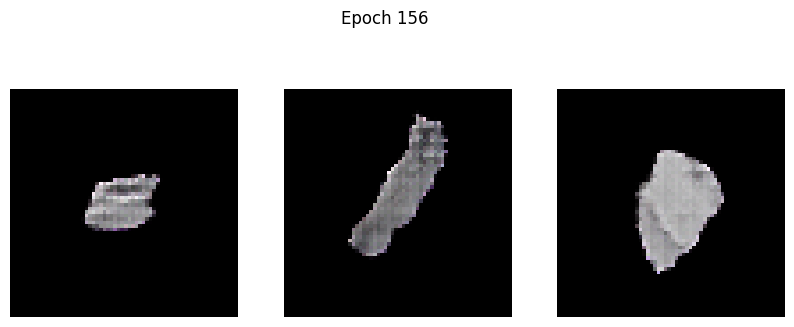

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.6572 - g_loss: 2.9065
Epoch 157/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 5.4900 - g_loss: 6.5562

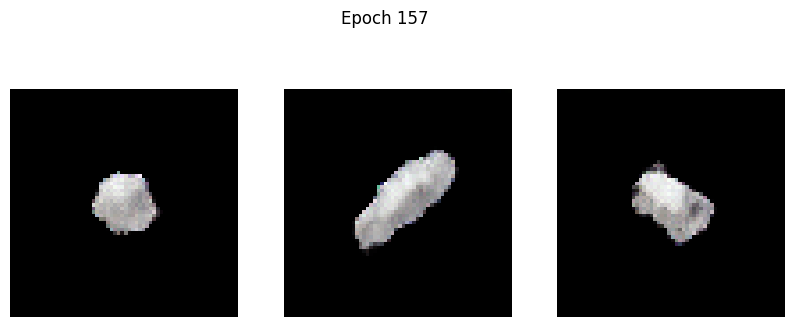

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 5.4587 - g_loss: 6.5331
Epoch 158/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0763 - g_loss: 2.3058

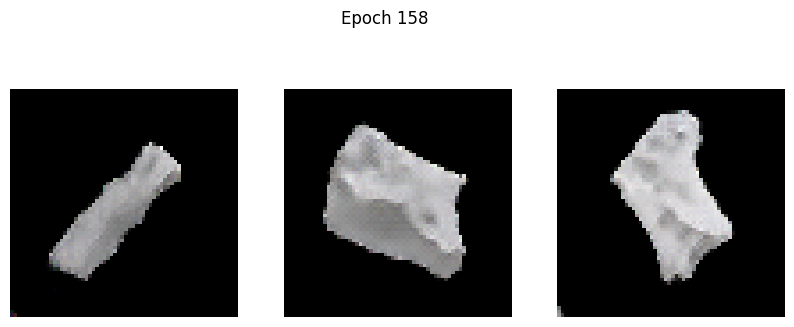

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.0774 - g_loss: 2.3058
Epoch 159/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.4028 - g_loss: 2.4414

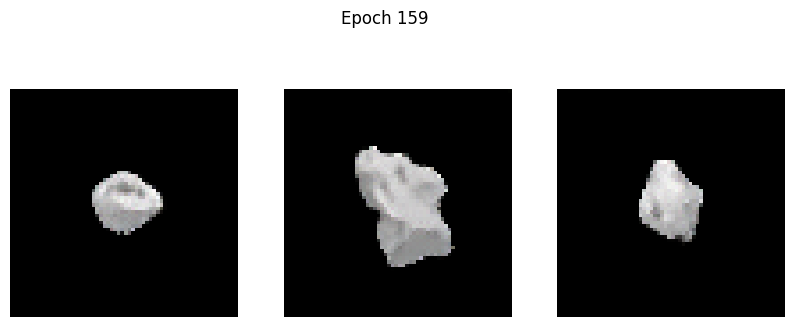

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.4031 - g_loss: 2.4409
Epoch 160/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.3616 - g_loss: 2.4397

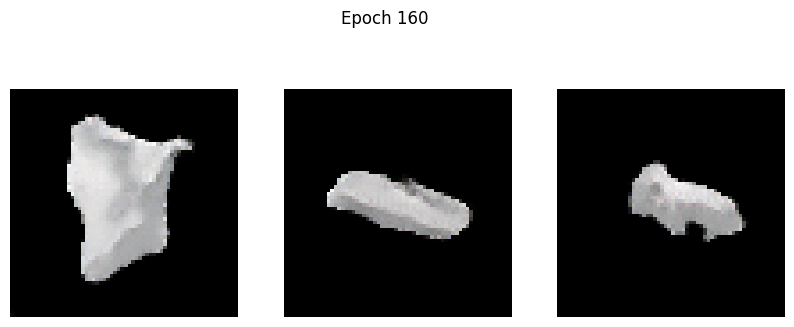

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.3631 - g_loss: 2.4398
Epoch 161/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.5926 - g_loss: 2.5277

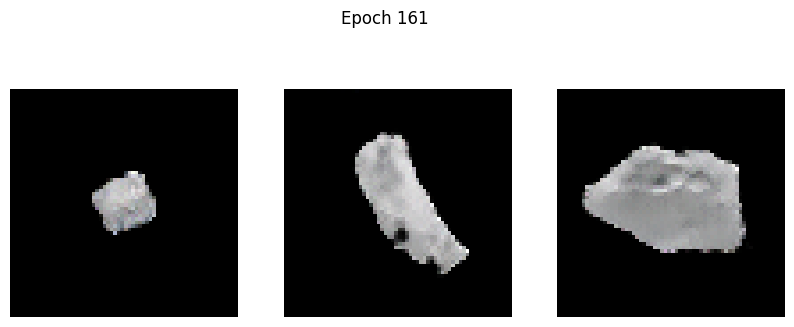

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.5923 - g_loss: 2.5278
Epoch 162/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.4347 - g_loss: 2.6457

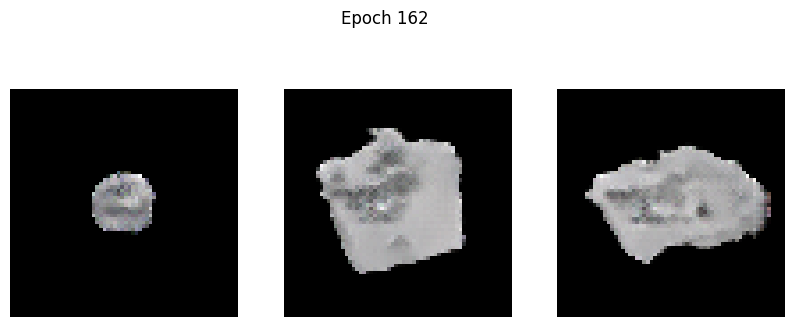

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.4346 - g_loss: 2.6460
Epoch 163/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.6675 - g_loss: 2.7292

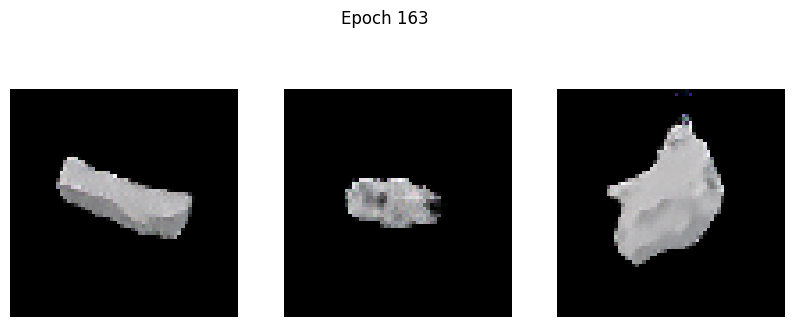

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.6651 - g_loss: 2.7304
Epoch 164/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.4616 - g_loss: 2.6862

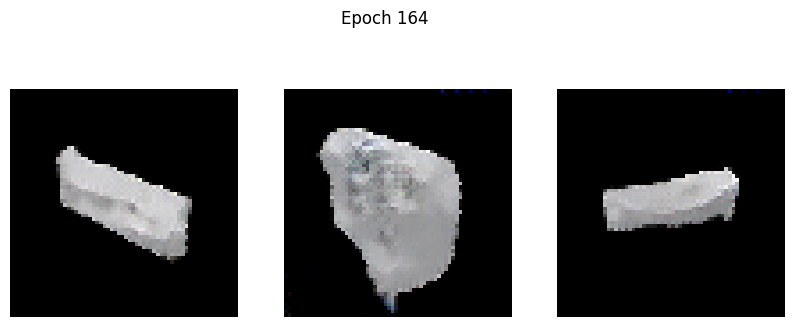

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.4609 - g_loss: 2.6877
Epoch 165/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.6258 - g_loss: 2.7842

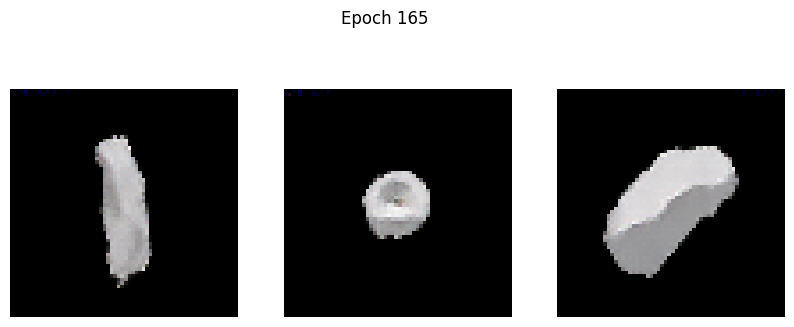

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.6258 - g_loss: 2.7850
Epoch 166/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.5981 - g_loss: 2.9017

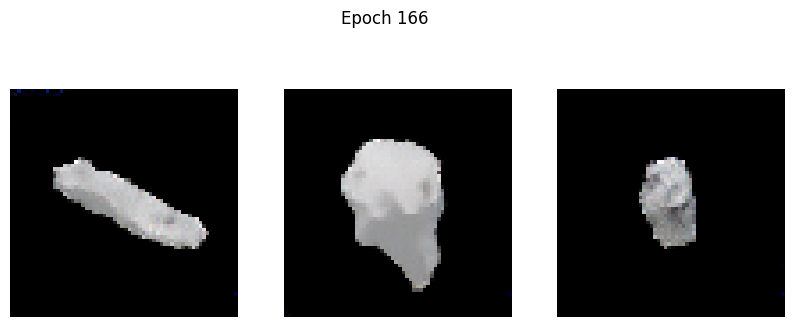

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.5989 - g_loss: 2.9016
Epoch 167/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.3553 - g_loss: 3.8070

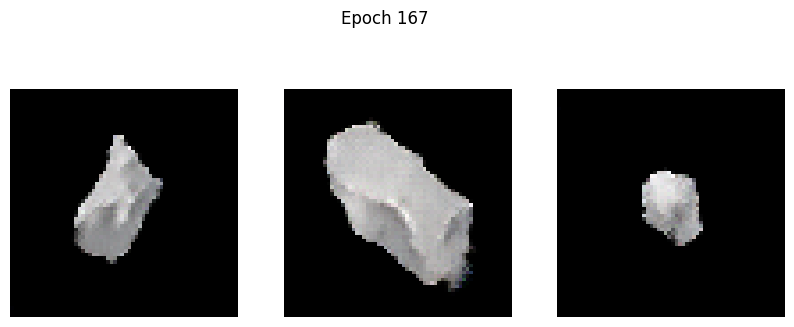

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.3543 - g_loss: 3.8066
Epoch 168/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.8171 - g_loss: 2.9762

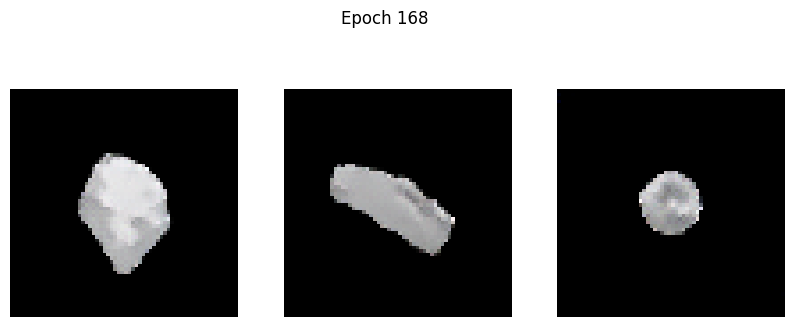

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.8156 - g_loss: 2.9768
Epoch 169/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.6880 - g_loss: 2.9186

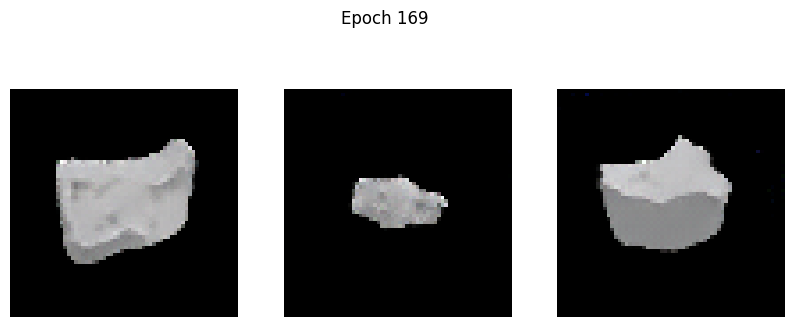

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.6885 - g_loss: 2.9191
Epoch 170/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.6267 - g_loss: 2.8968

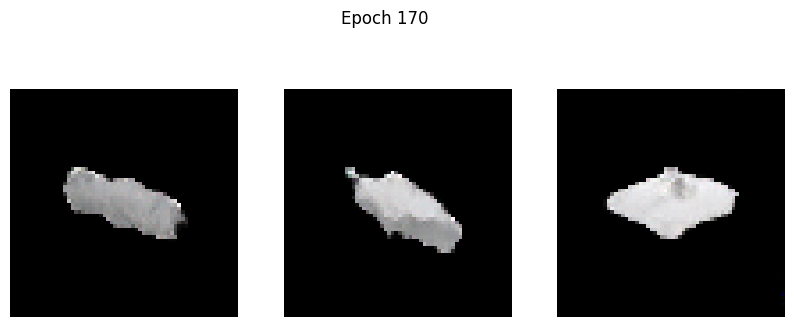

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.6284 - g_loss: 2.8976
Epoch 171/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.8911 - g_loss: 3.0073

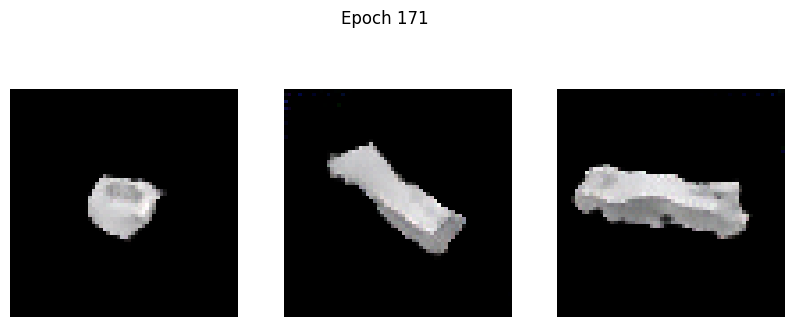

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.8910 - g_loss: 3.0085
Epoch 172/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.5400 - g_loss: 3.5494

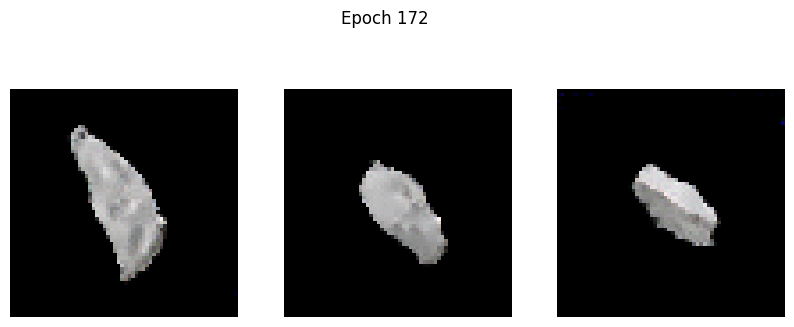

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.5375 - g_loss: 3.5504
Epoch 173/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.8035 - g_loss: 2.9377

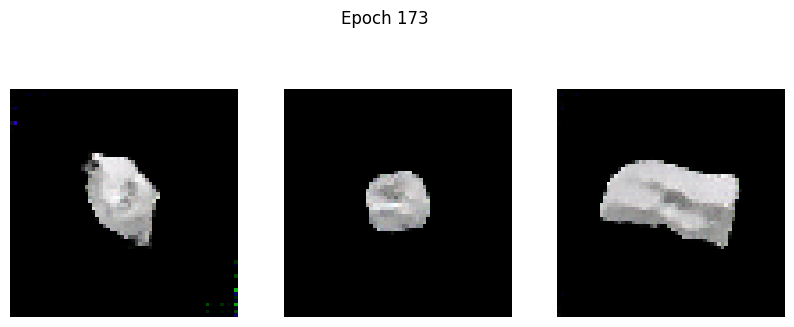

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.8038 - g_loss: 2.9380
Epoch 174/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.8661 - g_loss: 3.1000

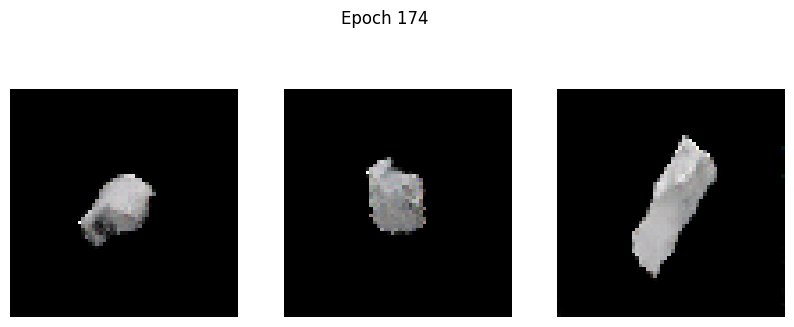

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.8640 - g_loss: 3.0997
Epoch 175/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.8029 - g_loss: 3.1493

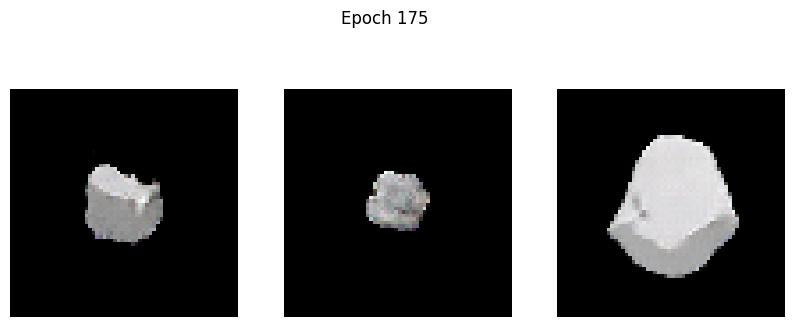

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.8064 - g_loss: 3.1479
Epoch 176/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.0600 - g_loss: 3.0164

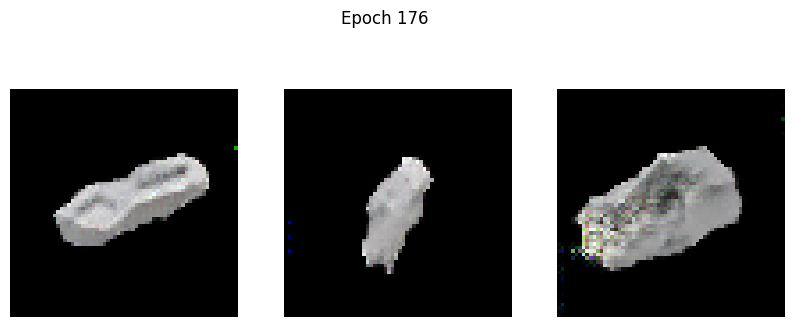

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -1.0615 - g_loss: 3.0170
Epoch 177/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.1008 - g_loss: 3.3991

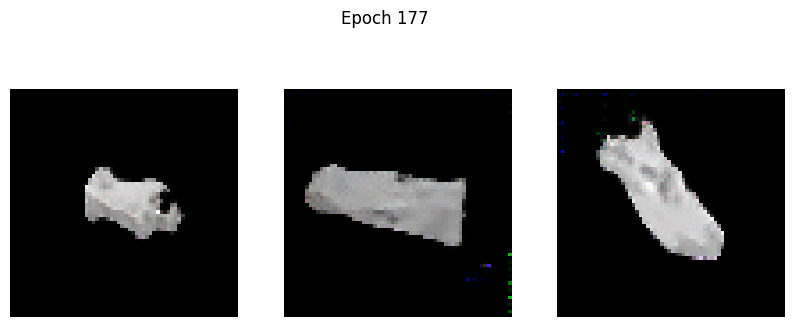

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -1.0994 - g_loss: 3.3980
Epoch 178/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 1.2482 - g_loss: 5.1383

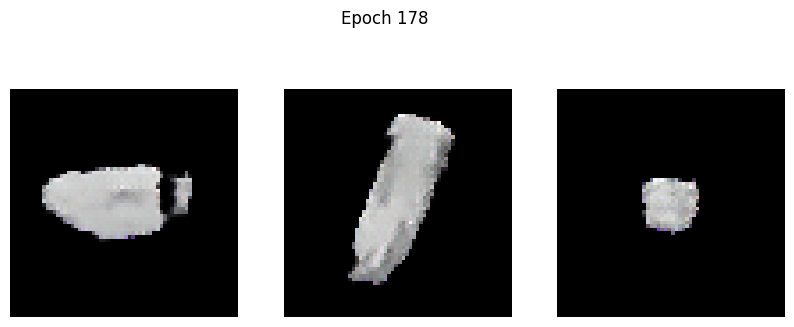

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 1.2408 - g_loss: 5.1313
Epoch 179/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.9897 - g_loss: 2.9989

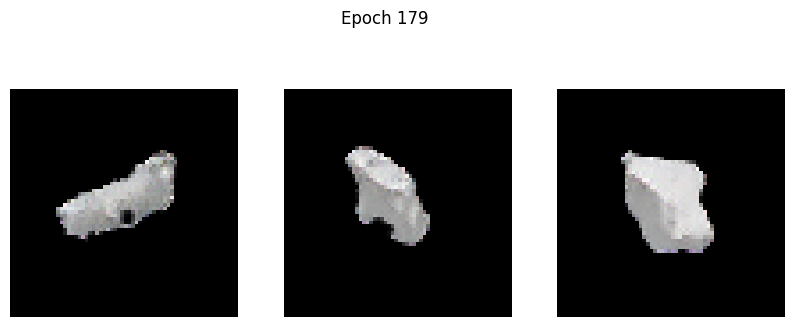

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.9922 - g_loss: 2.9982
Epoch 180/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.1463 - g_loss: 3.0403

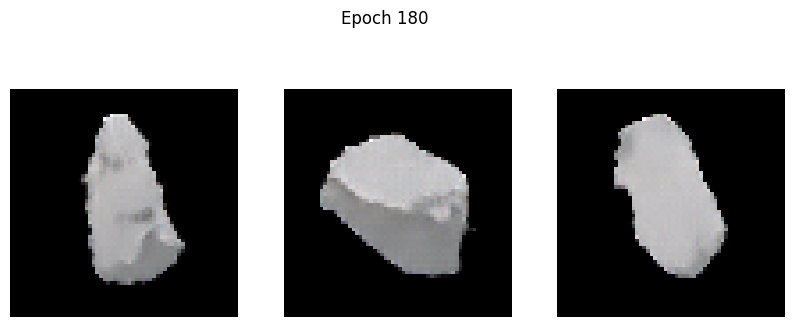

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -1.1438 - g_loss: 3.0408
Epoch 181/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.0100 - g_loss: 3.0365

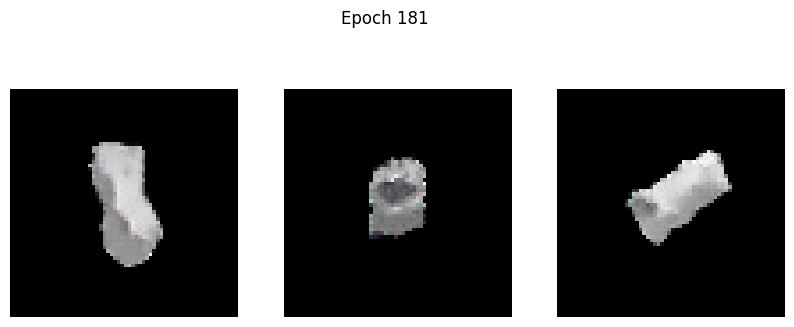

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.0105 - g_loss: 3.0368
Epoch 182/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.7355 - g_loss: 3.1062

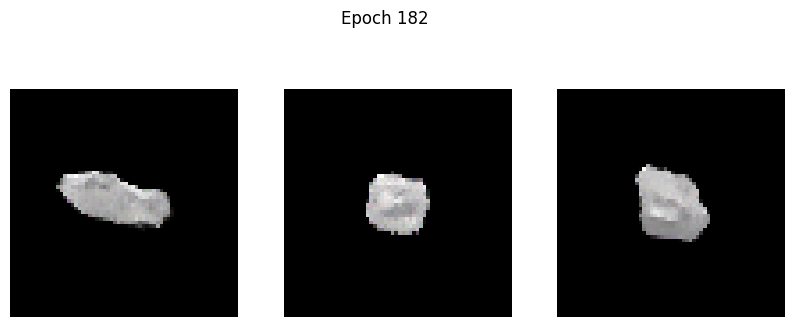

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.7318 - g_loss: 3.1066
Epoch 183/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.5807 - g_loss: 3.2534

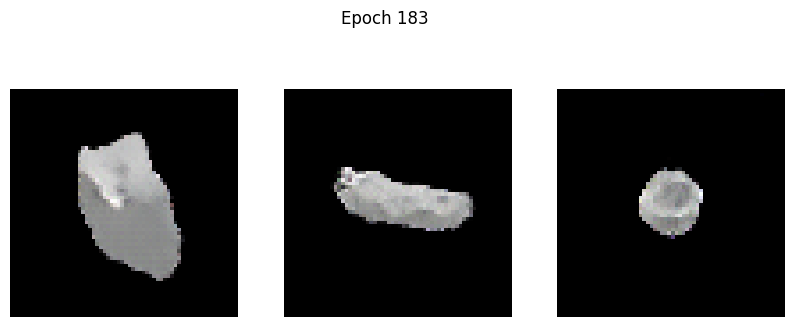

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -1.5806 - g_loss: 3.2528
Epoch 184/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.0905 - g_loss: 3.9537

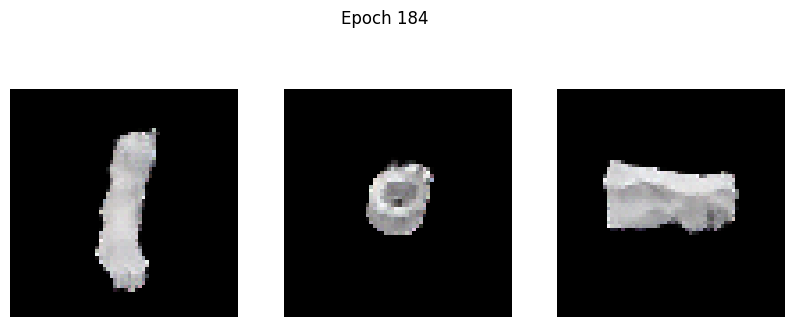

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -1.0866 - g_loss: 3.9533
Epoch 185/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.8369 - g_loss: 2.8680

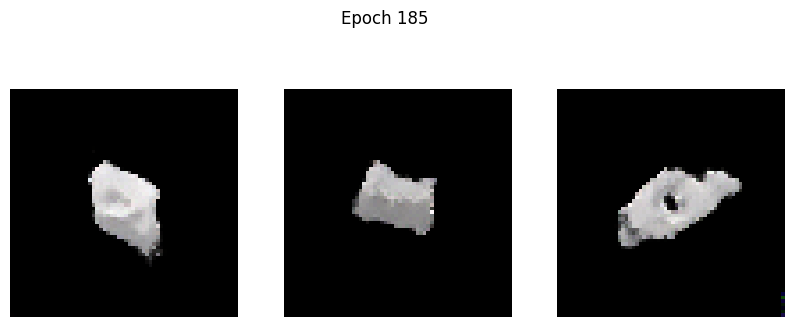

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -1.8354 - g_loss: 2.8693
Epoch 186/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.7993 - g_loss: 3.1243

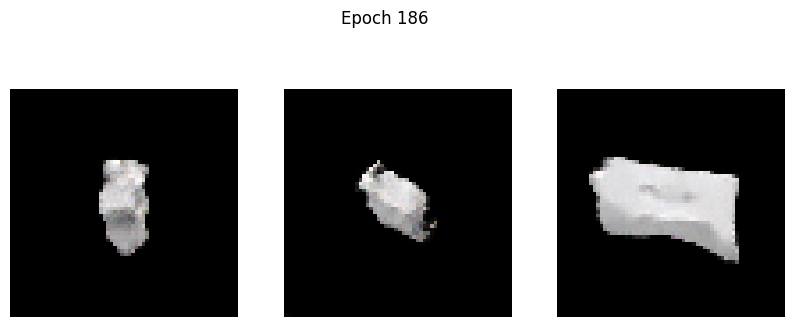

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.8018 - g_loss: 3.1253
Epoch 187/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.9094 - g_loss: 3.3253

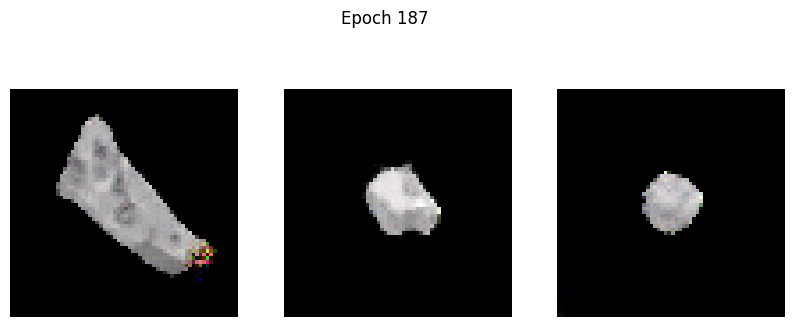

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.9099 - g_loss: 3.3264
Epoch 188/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.6007 - g_loss: 4.5201

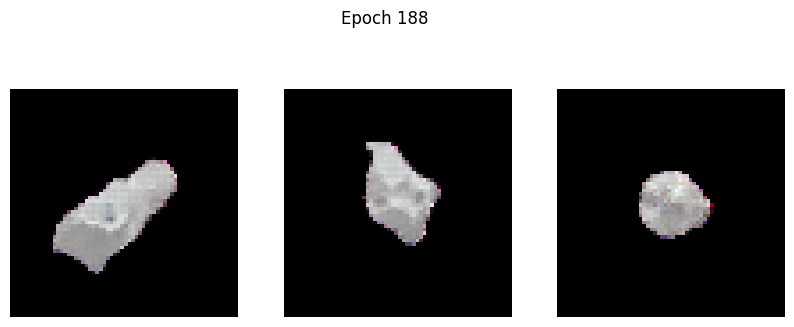

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.5973 - g_loss: 4.5215
Epoch 189/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.5114 - g_loss: 2.6722

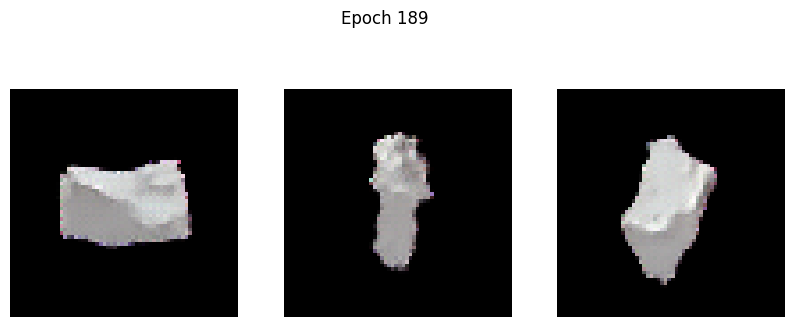

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -1.5135 - g_loss: 2.6717
Epoch 190/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -2.5847 - g_loss: 2.7663

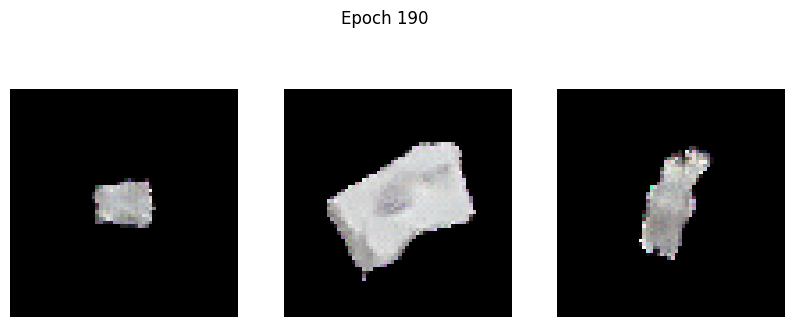

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -2.5817 - g_loss: 2.7661
Epoch 191/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.2290 - g_loss: 2.8742

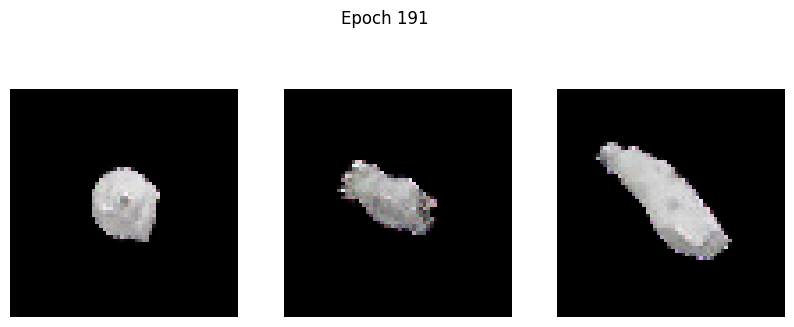

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.2286 - g_loss: 2.8744
Epoch 192/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.4084 - g_loss: 3.0012

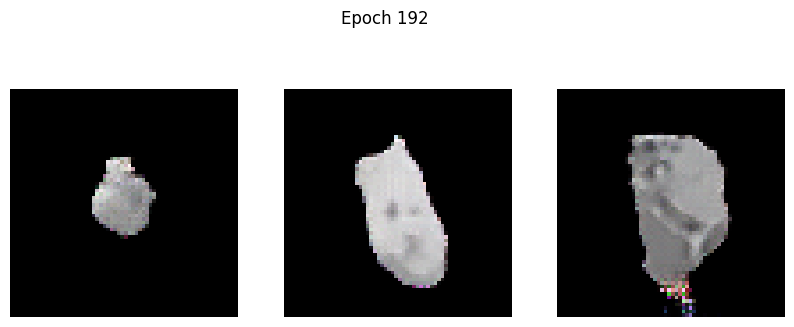

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -2.4054 - g_loss: 3.0010
Epoch 193/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.2555 - g_loss: 3.1696

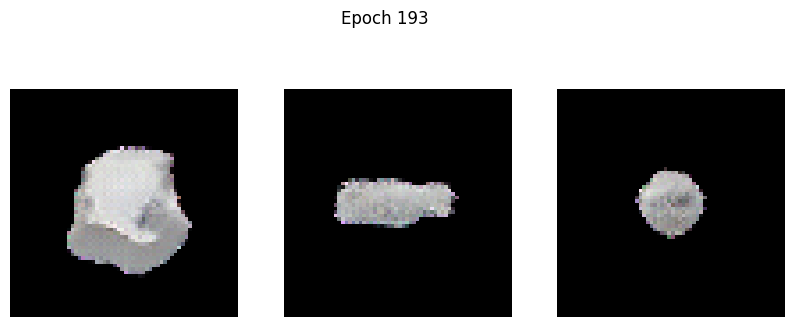

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.2495 - g_loss: 3.1711
Epoch 194/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.7578 - g_loss: 2.9416

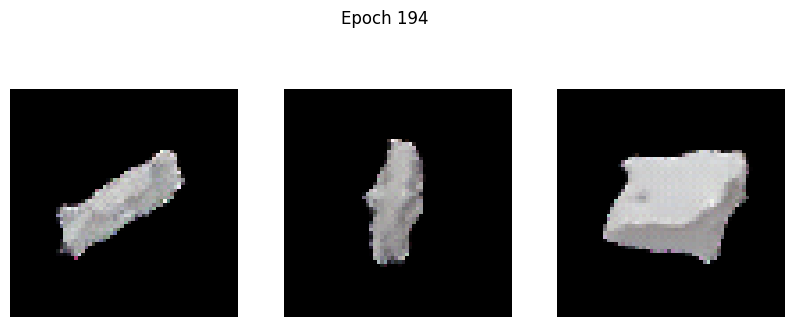

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.7565 - g_loss: 2.9422
Epoch 195/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.0045 - g_loss: 2.9450

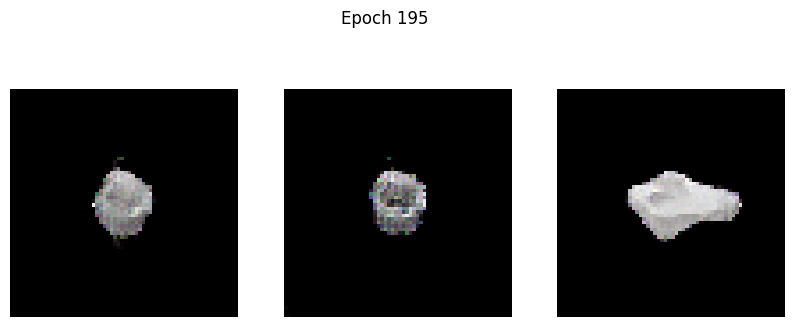

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.0088 - g_loss: 2.9462
Epoch 196/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5235 - g_loss: 4.2630

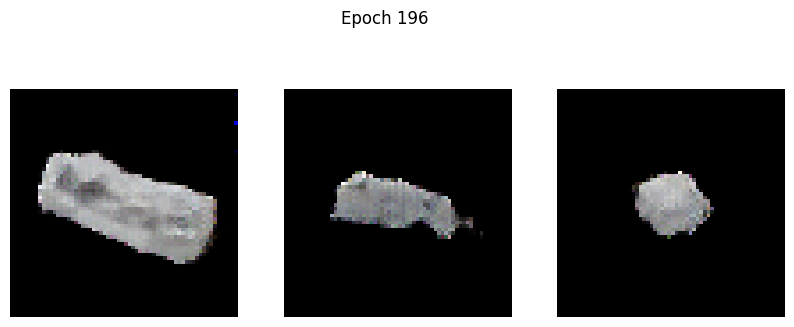

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5022 - g_loss: 4.2571
Epoch 197/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.0068 - g_loss: 2.9737

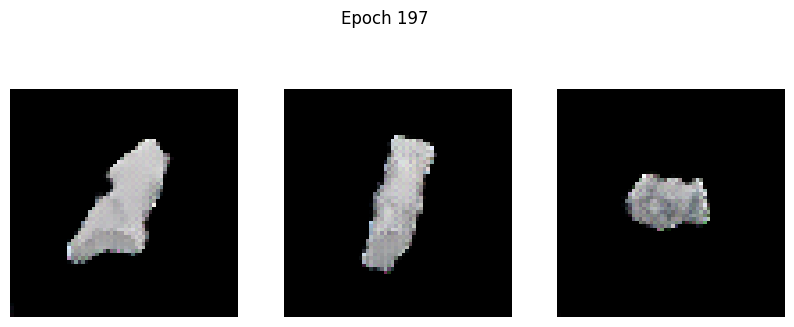

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.9964 - g_loss: 2.9782
Epoch 198/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.4949 - g_loss: 3.4318

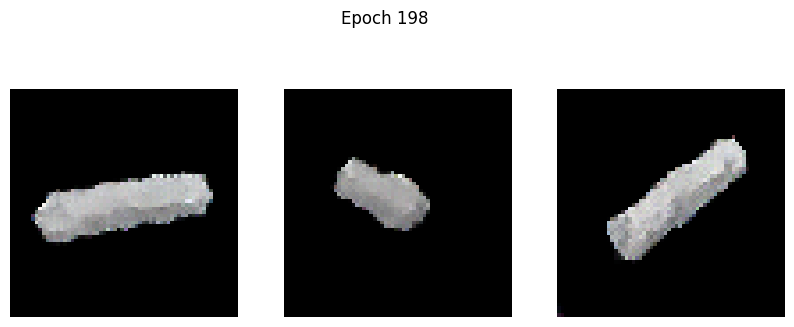

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.4982 - g_loss: 3.4300
Epoch 199/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.1862 - g_loss: 3.0653

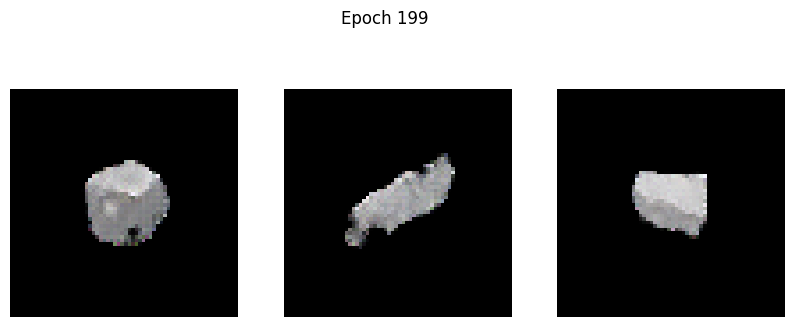

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.1783 - g_loss: 3.0673
Epoch 200/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.1599 - g_loss: 3.3174

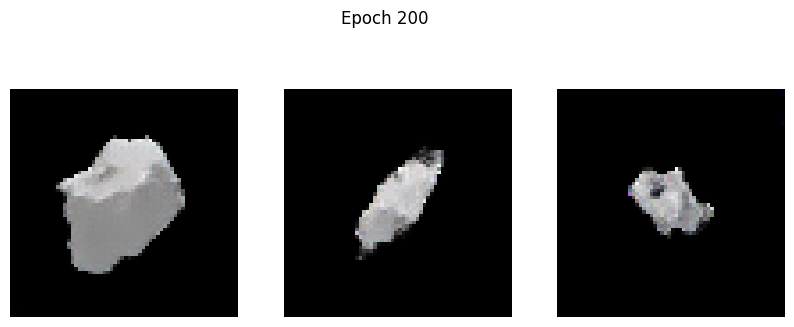

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.1657 - g_loss: 3.3169
Epoch 201/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.7826 - g_loss: 3.6489

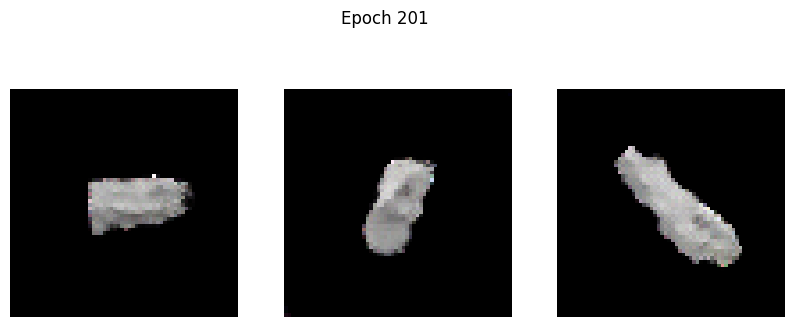

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.7706 - g_loss: 3.6546
Epoch 202/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.2970 - g_loss: 4.0097

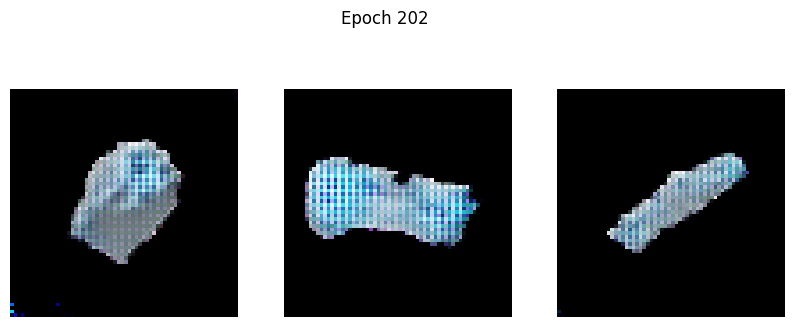

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.2591 - g_loss: 4.0134
Epoch 203/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 53.7063 - g_loss: 39.4973

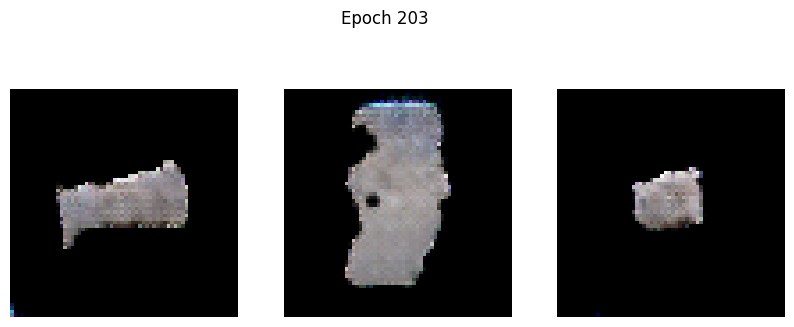

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 53.0653 - g_loss: 39.1073
Epoch 204/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 1.0927 - g_loss: 5.5705

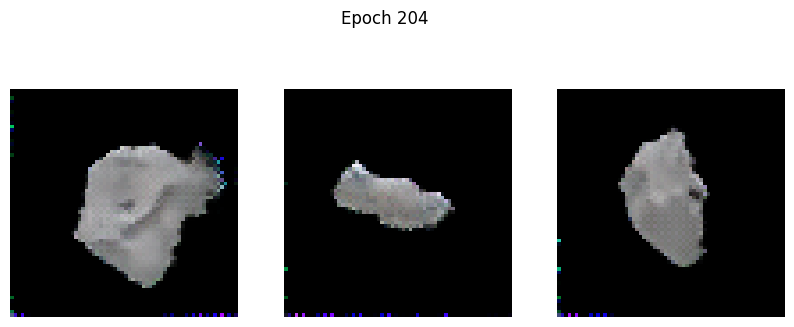

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 1.0863 - g_loss: 5.5629
Epoch 205/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.6635 - g_loss: 3.7501

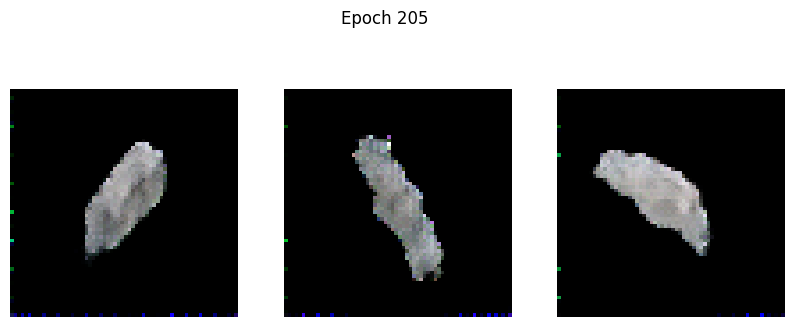

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.6700 - g_loss: 3.7466
Epoch 206/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.1747 - g_loss: 3.1672

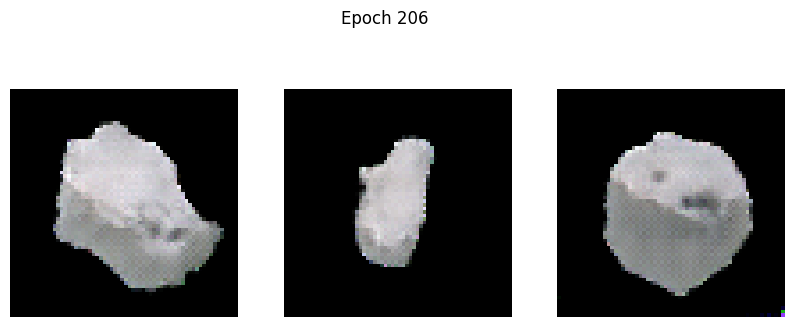

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.1749 - g_loss: 3.1659
Epoch 207/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.6696 - g_loss: 2.8061

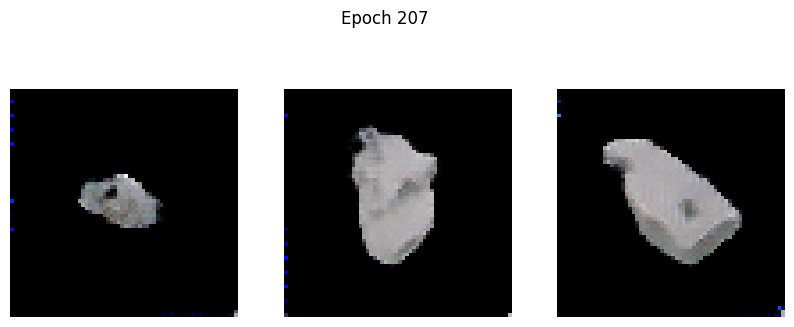

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.6690 - g_loss: 2.8060
Epoch 208/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.0806 - g_loss: 2.5602

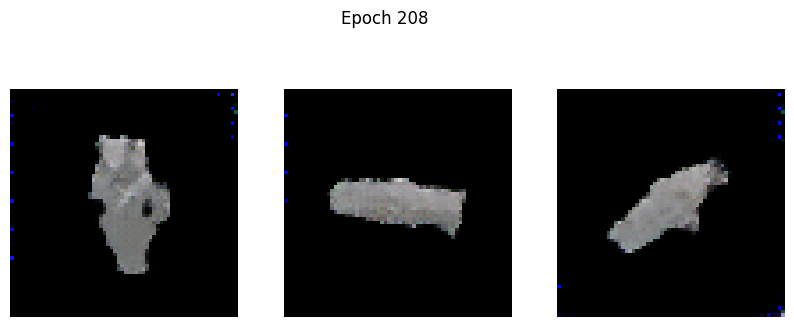

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.0799 - g_loss: 2.5603
Epoch 209/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.5902 - g_loss: 2.7936

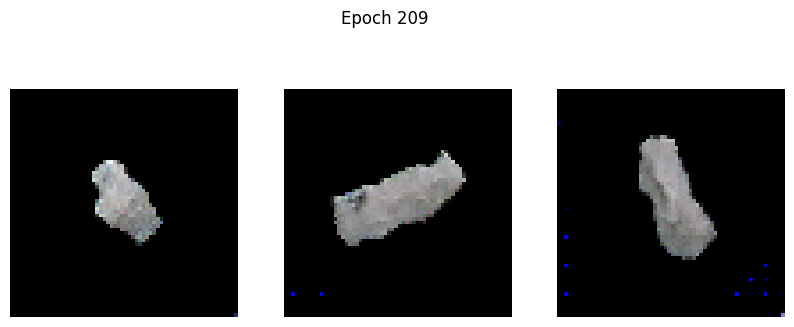

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.5875 - g_loss: 2.7923
Epoch 210/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.4836 - g_loss: 2.4769

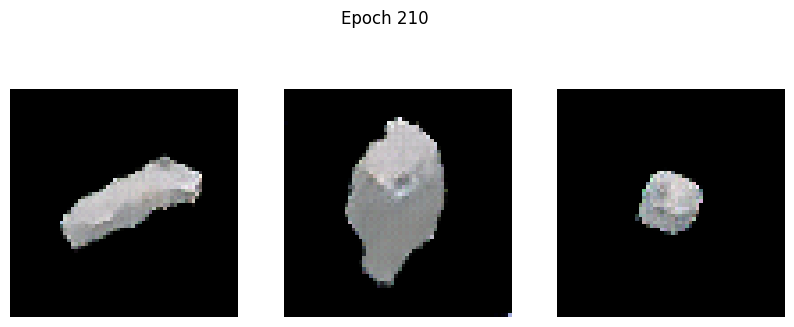

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.4864 - g_loss: 2.4776
Epoch 211/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.8054 - g_loss: 2.6021

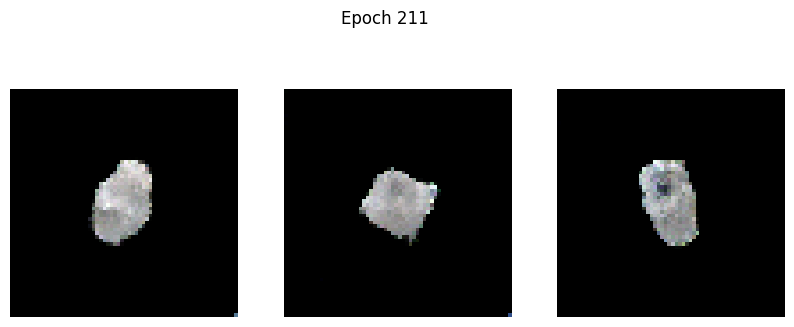

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.8092 - g_loss: 2.6021
Epoch 212/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.7500 - g_loss: 2.4879

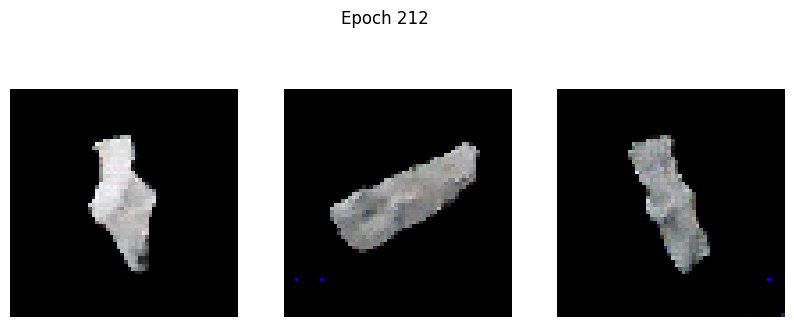

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -4.7522 - g_loss: 2.4888
Epoch 213/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.8070 - g_loss: 2.5300

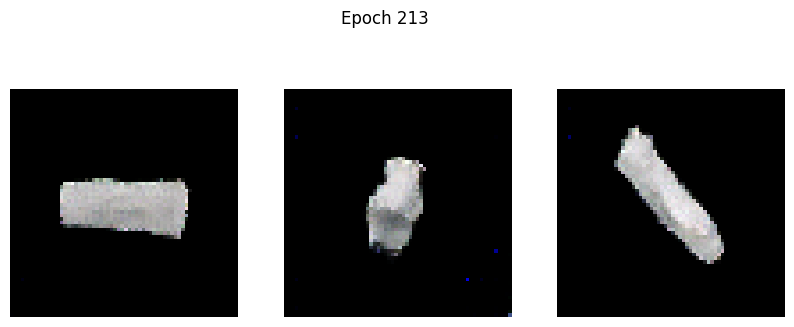

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.8086 - g_loss: 2.5306
Epoch 214/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.0196 - g_loss: 2.6452

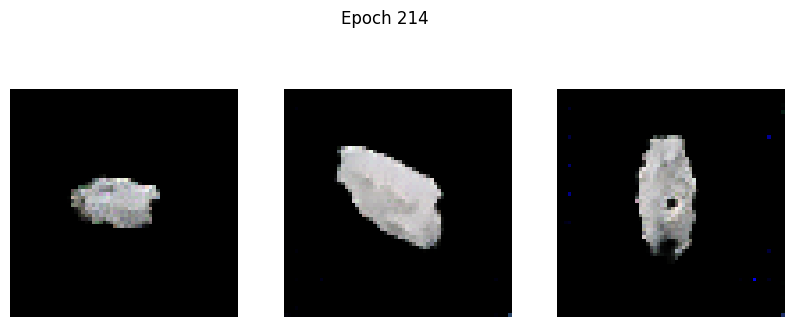

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.0204 - g_loss: 2.6461
Epoch 215/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.5742 - g_loss: 3.0244

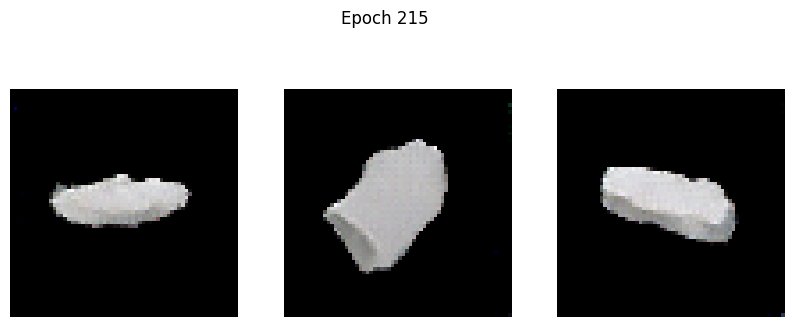

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.5791 - g_loss: 3.0253
Epoch 216/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.1156 - g_loss: 3.1860

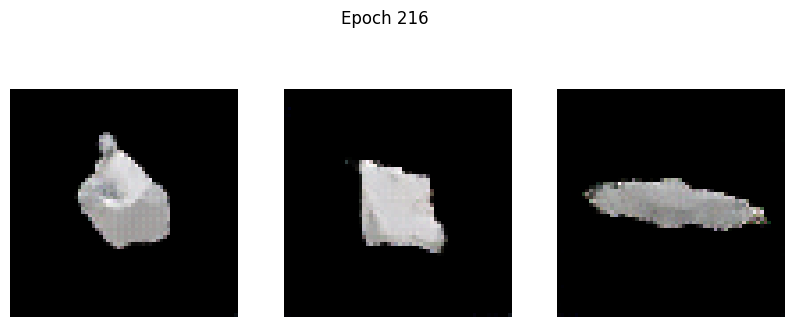

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.1120 - g_loss: 3.1873
Epoch 217/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.1232 - g_loss: 3.4963

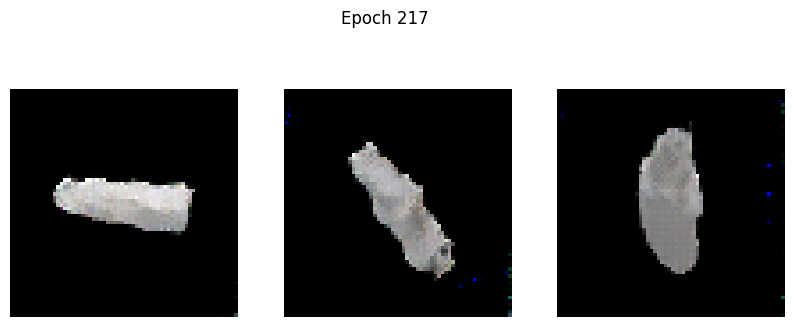

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -4.1282 - g_loss: 3.4961
Epoch 218/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.5129 - g_loss: 3.7900

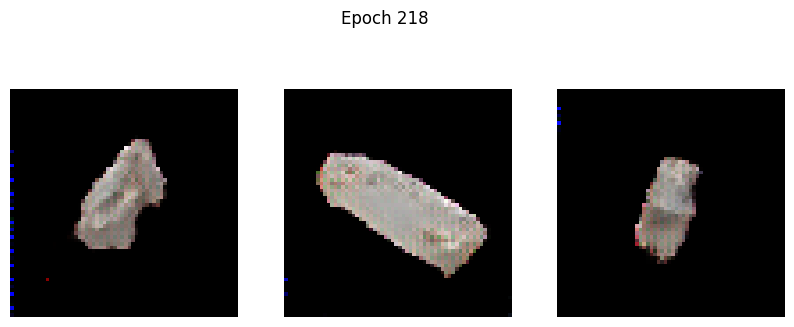

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.5000 - g_loss: 3.7956
Epoch 219/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0910 - g_loss: 5.5367

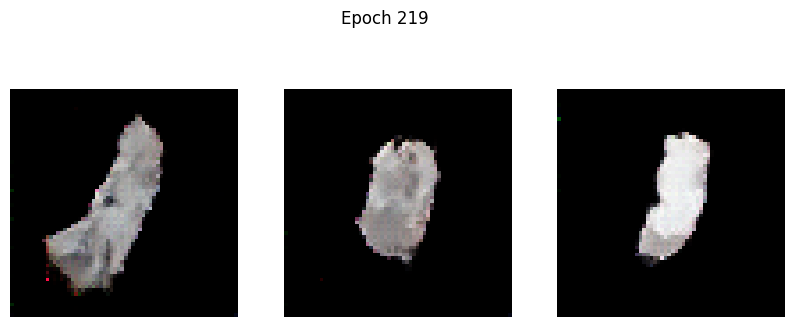

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.1155 - g_loss: 5.5277
Epoch 220/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.0320 - g_loss: 3.2648

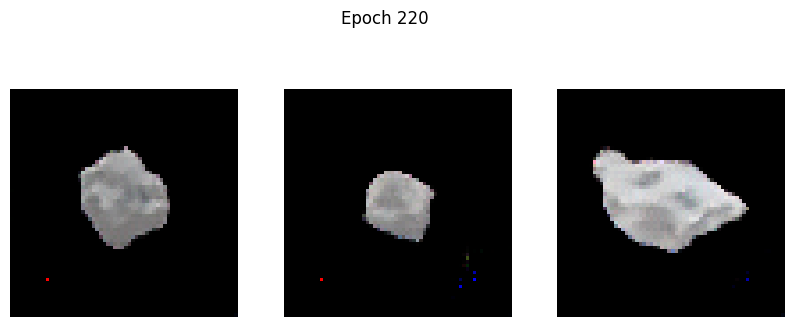

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.0325 - g_loss: 3.2634
Epoch 221/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.6723 - g_loss: 3.5535

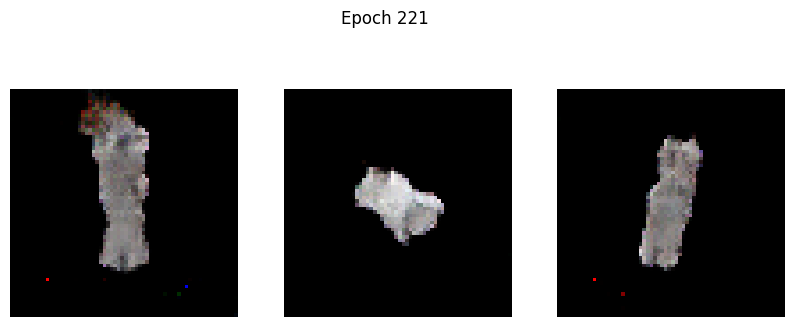

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.6624 - g_loss: 3.5575
Epoch 222/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.1562 - g_loss: 3.2408

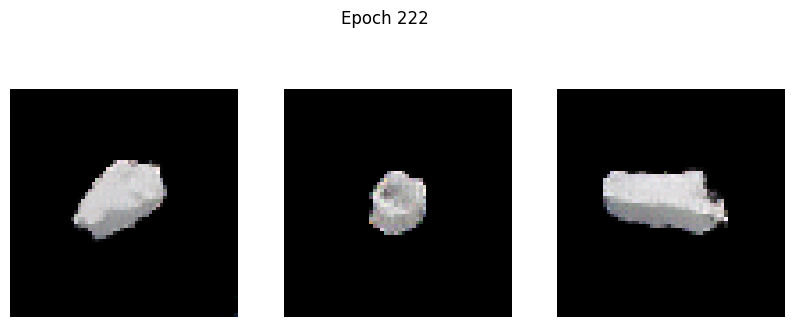

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.1642 - g_loss: 3.2403
Epoch 223/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.8999 - g_loss: 3.2287

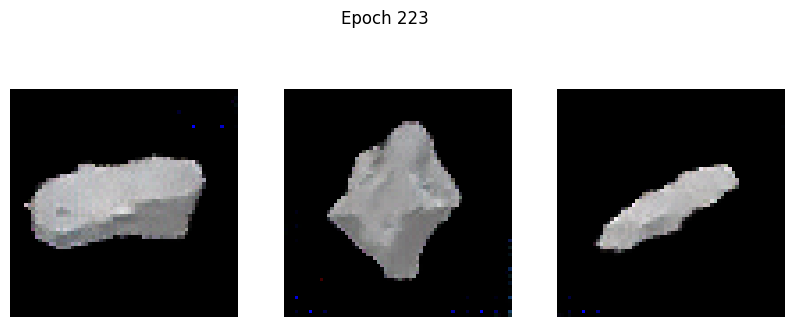

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.9045 - g_loss: 3.2310
Epoch 224/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 257.0075 - g_loss: 257.0599

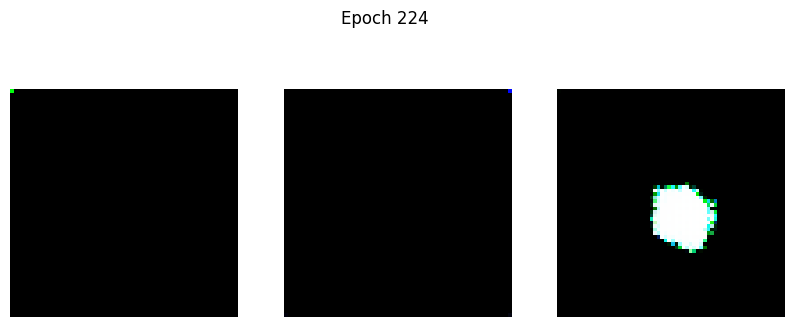

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 256.2422 - g_loss: 256.9062
Epoch 225/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 3.4413 - g_loss: 42.4461

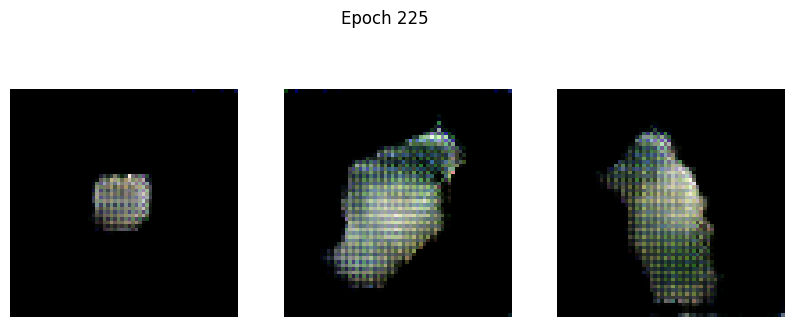

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 3.4978 - g_loss: 42.4471
Epoch 226/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 7.2393 - g_loss: 14.4991

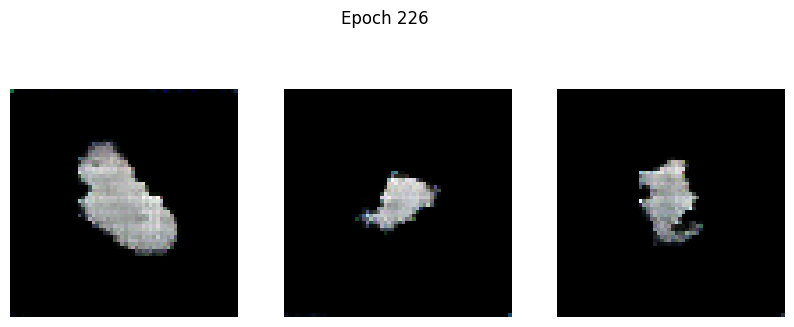

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 7.2329 - g_loss: 14.4727
Epoch 227/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 2.5236 - g_loss: 7.7666

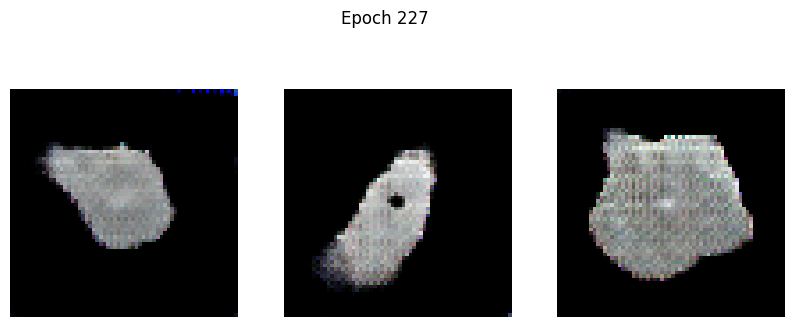

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 2.5189 - g_loss: 7.7532
Epoch 228/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1911 - g_loss: 5.0461

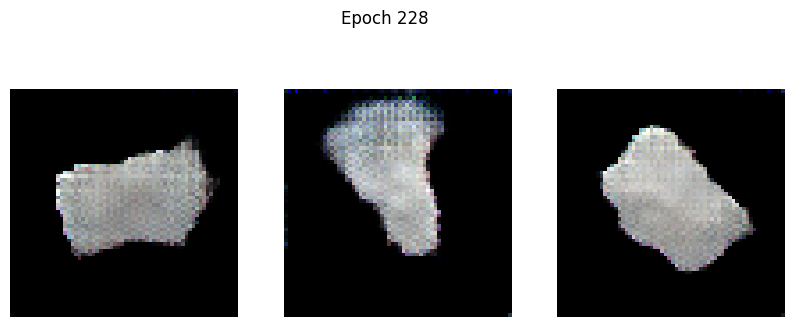

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1877 - g_loss: 5.0445
Epoch 229/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.8618 - g_loss: 4.6525

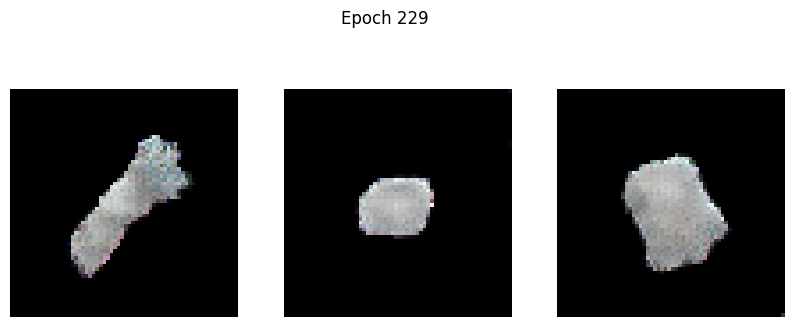

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.8627 - g_loss: 4.6498
Epoch 230/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.6761 - g_loss: 4.1140

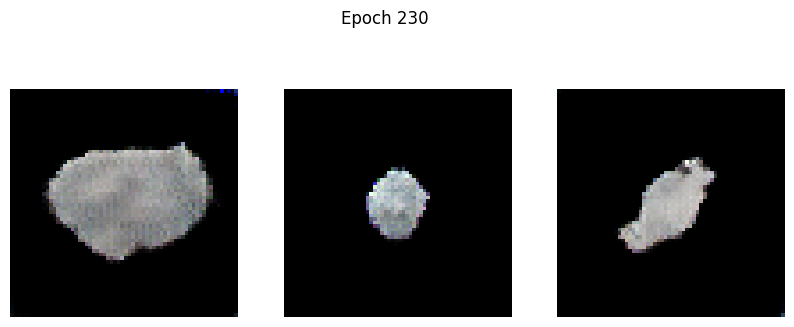

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.6763 - g_loss: 4.1118
Epoch 231/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.0146 - g_loss: 3.7063

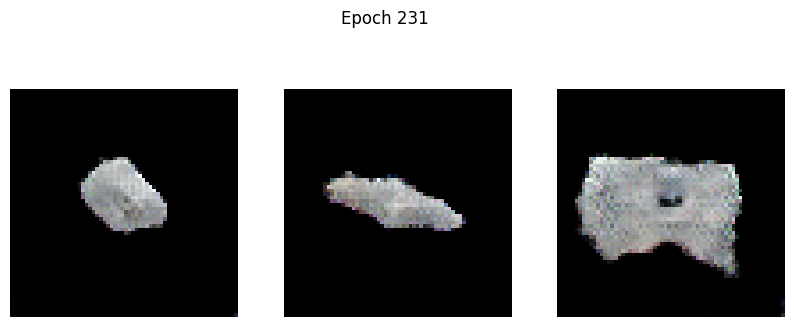

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.0153 - g_loss: 3.7059
Epoch 232/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.3458 - g_loss: 3.2686

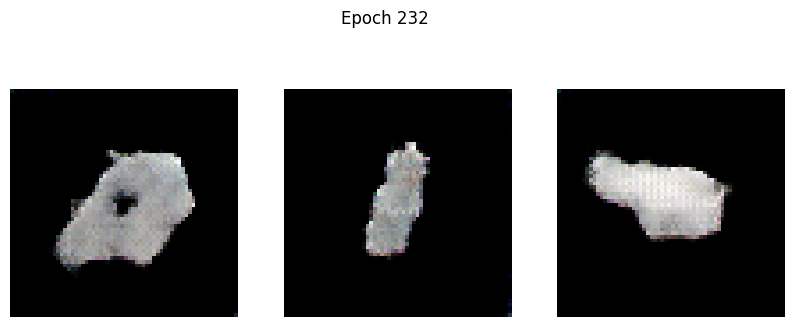

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.3445 - g_loss: 3.2700
Epoch 233/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.6862 - g_loss: 3.1780

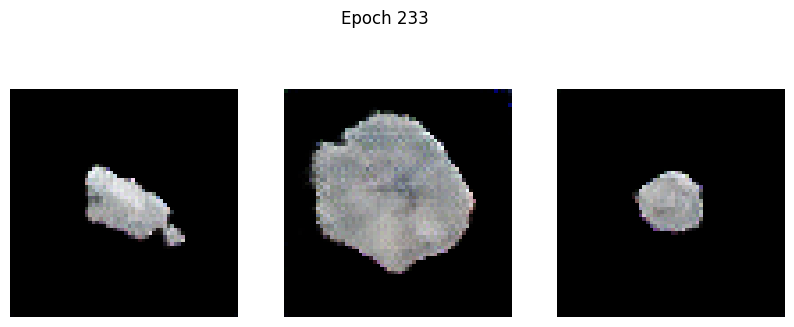

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.6891 - g_loss: 3.1778
Epoch 234/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.6085 - g_loss: 2.8611

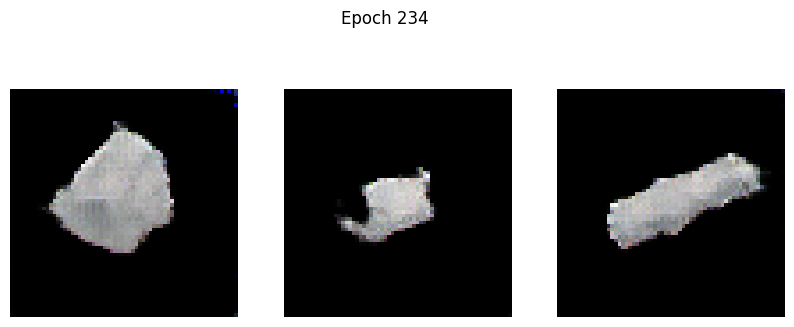

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.6079 - g_loss: 2.8609
Epoch 235/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.8611 - g_loss: 2.9442

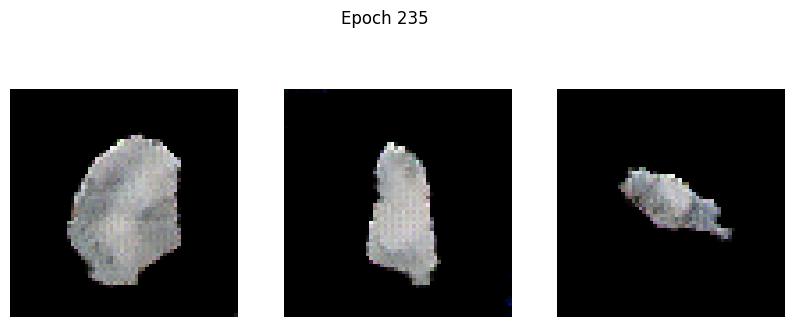

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.8710 - g_loss: 2.9443
Epoch 236/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.3935 - g_loss: 2.8086

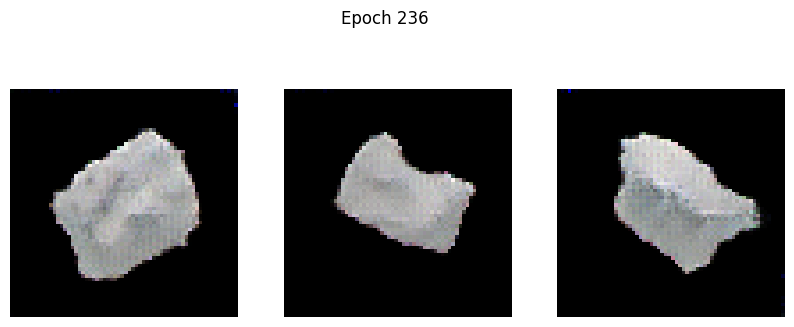

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.3918 - g_loss: 2.8091
Epoch 237/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.4839 - g_loss: 2.8161

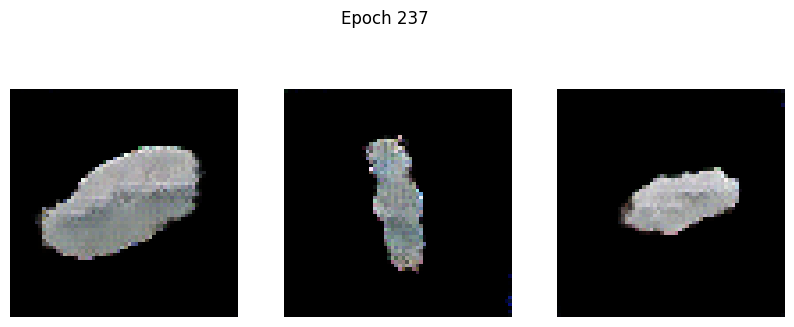

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.4891 - g_loss: 2.8163
Epoch 238/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.9552 - g_loss: 2.9165

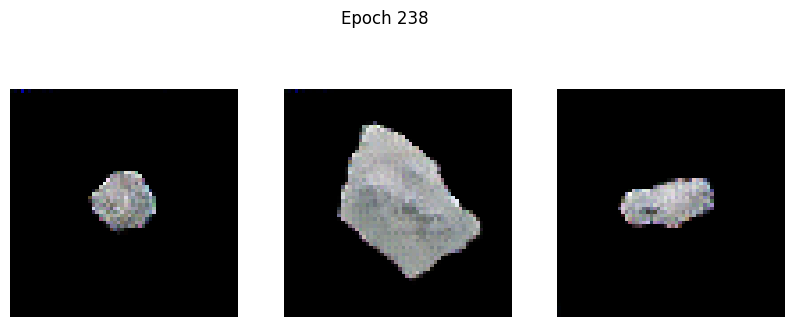

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.9611 - g_loss: 2.9157
Epoch 239/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.2208 - g_loss: 2.8191

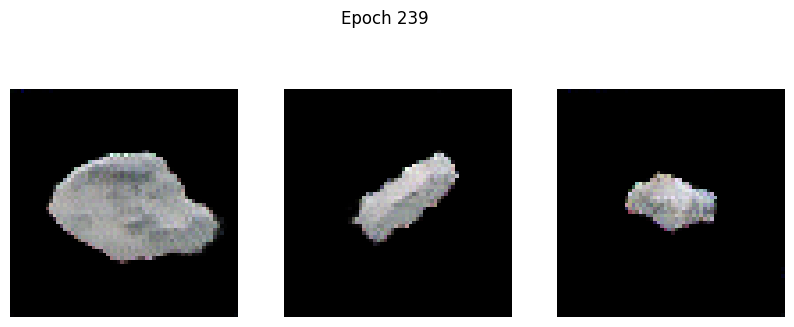

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.2143 - g_loss: 2.8187
Epoch 240/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.5881 - g_loss: 2.8106

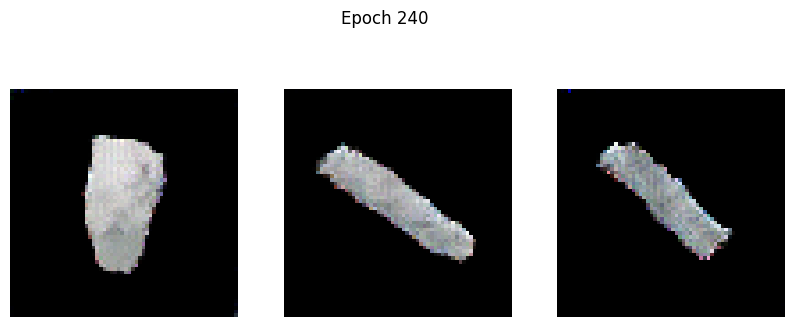

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.5848 - g_loss: 2.8111
Epoch 241/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.0871 - g_loss: 2.8010

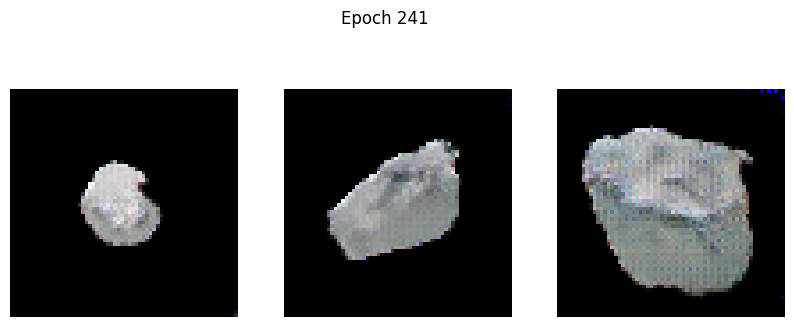

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.0932 - g_loss: 2.8008
Epoch 242/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.9657 - g_loss: 2.8316

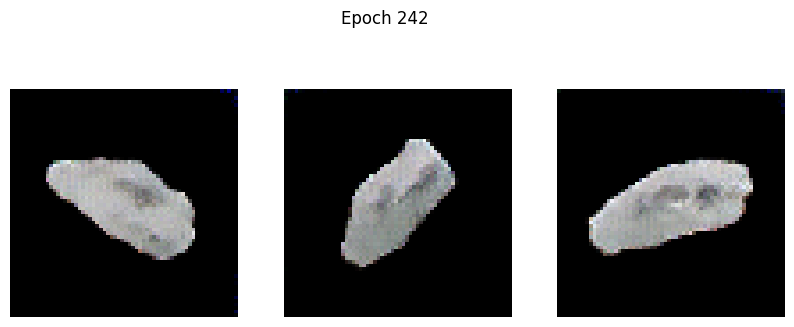

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.9583 - g_loss: 2.8316
Epoch 243/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.4995 - g_loss: 2.8145

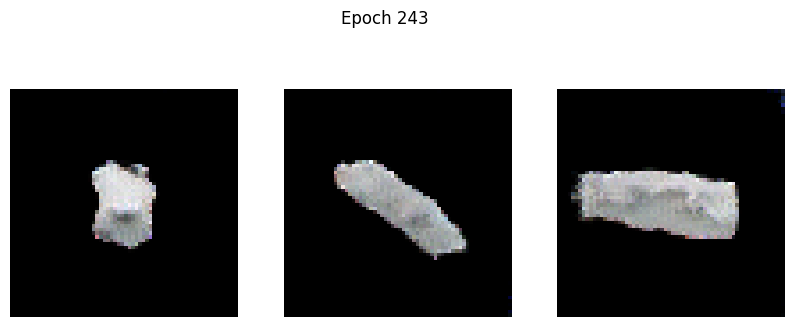

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.5027 - g_loss: 2.8148
Epoch 244/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.8351 - g_loss: 2.9015

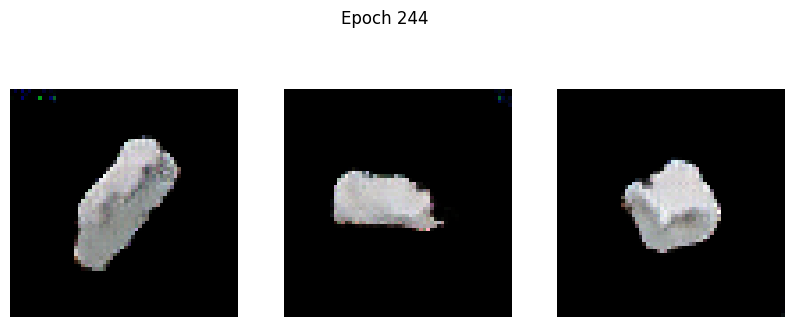

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.8390 - g_loss: 2.9012
Epoch 245/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.3545 - g_loss: 2.8374

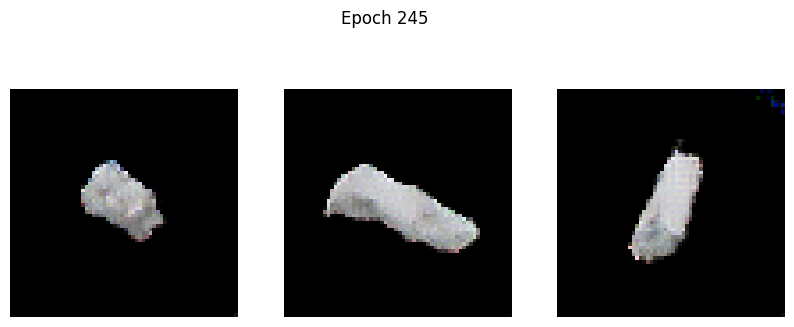

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.3610 - g_loss: 2.8371
Epoch 246/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.3459 - g_loss: 2.9439

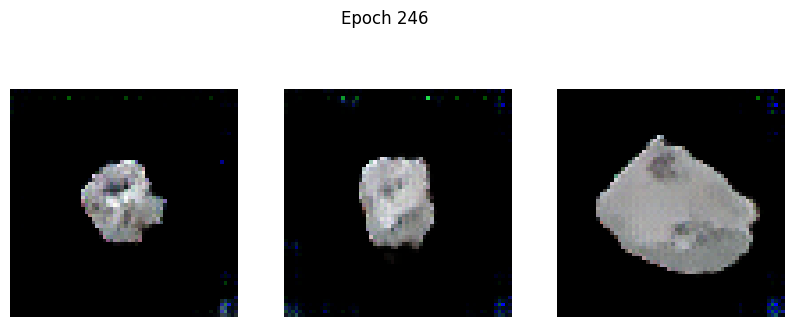

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.3574 - g_loss: 2.9434
Epoch 247/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.7535 - g_loss: 2.9364

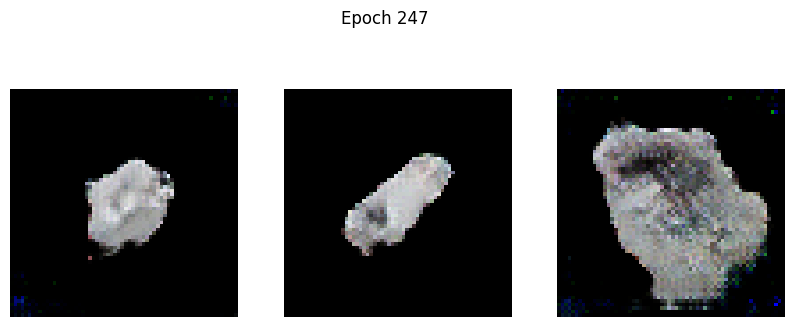

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.7633 - g_loss: 2.9359
Epoch 248/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.5660 - g_loss: 3.0967

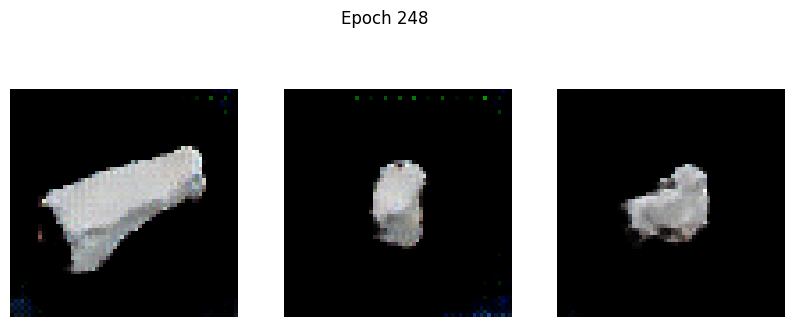

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.5575 - g_loss: 3.0959
Epoch 249/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.0206 - g_loss: 3.1203

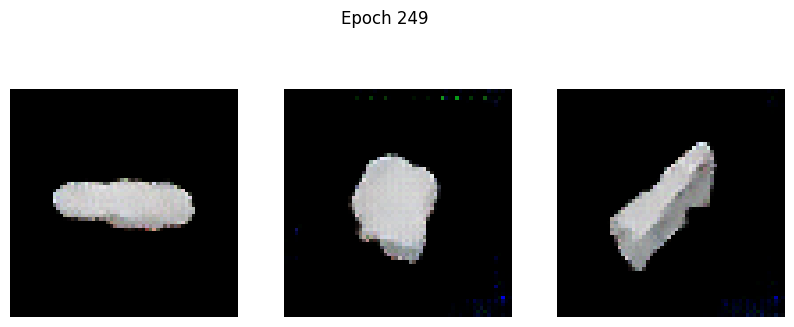

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.0237 - g_loss: 3.1202
Epoch 250/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.2554 - g_loss: 3.0941

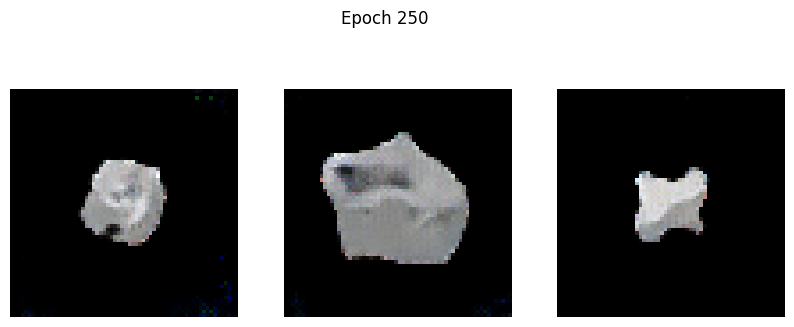

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -5.2621 - g_loss: 3.0942
Epoch 251/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 5.9214 - g_loss: 5.9182

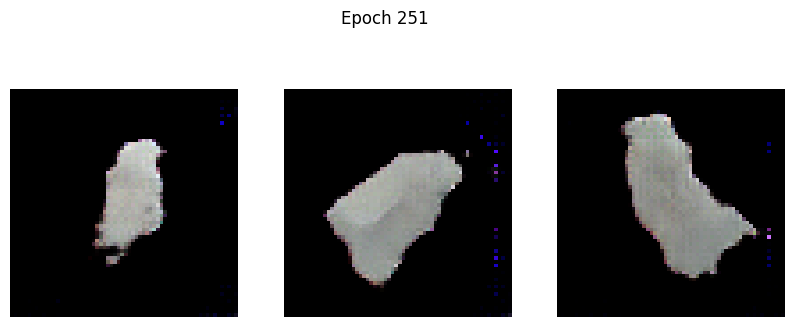

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 5.9692 - g_loss: 5.9485
Epoch 252/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.0744 - g_loss: 5.9233

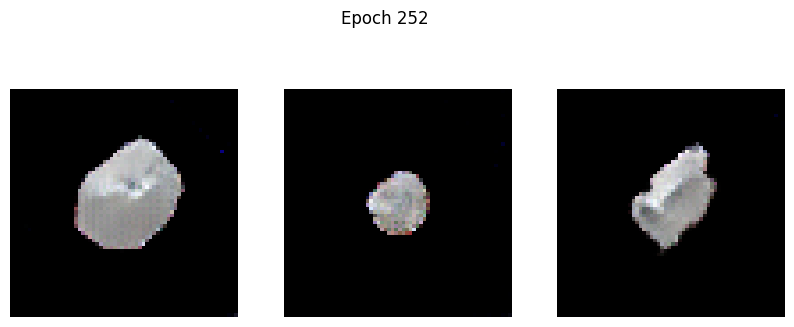

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.0724 - g_loss: 5.9153
Epoch 253/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.4734 - g_loss: 3.8065

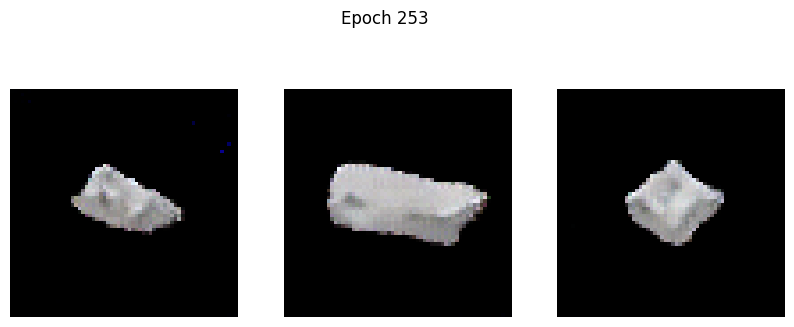

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.4843 - g_loss: 3.8037
Epoch 254/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.5136 - g_loss: 3.0383

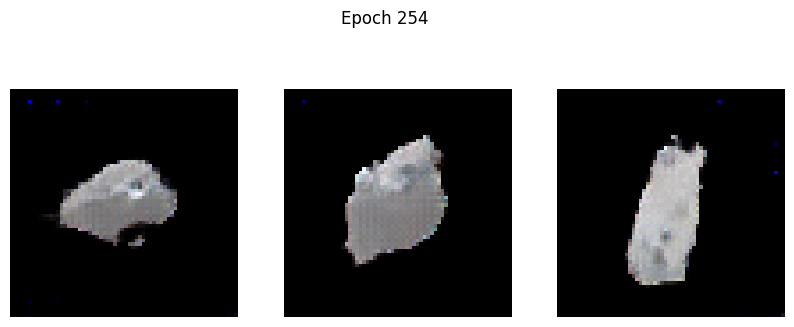

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.5123 - g_loss: 3.0384
Epoch 255/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.1259 - g_loss: 3.0507

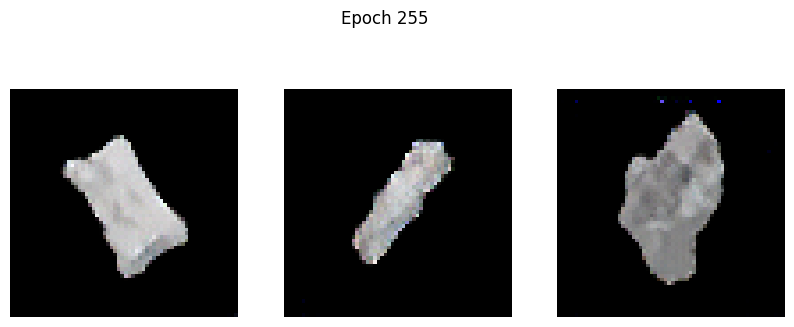

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.1296 - g_loss: 3.0501
Epoch 256/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.0358 - g_loss: 3.1687

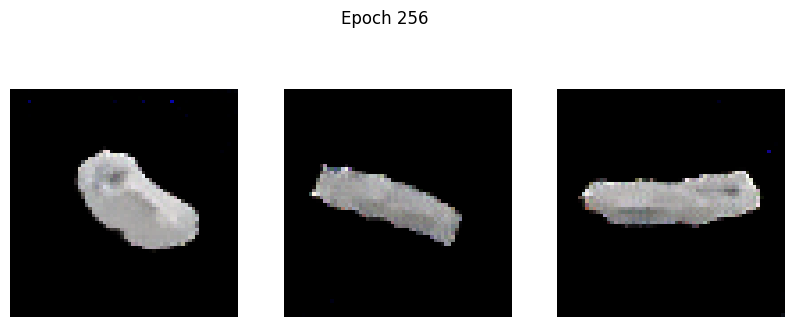

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.0429 - g_loss: 3.1678
Epoch 257/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.8607 - g_loss: 3.1272

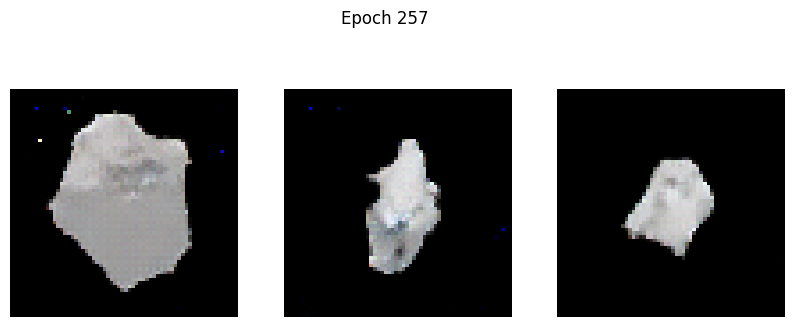

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.8380 - g_loss: 3.1270
Epoch 258/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.8462 - g_loss: 3.2766

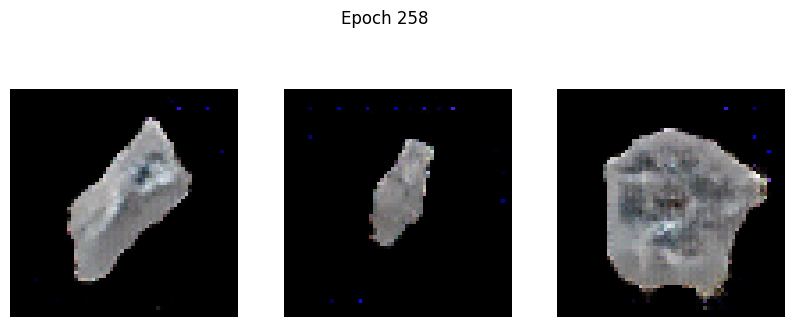

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.8367 - g_loss: 3.2777
Epoch 259/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.1708 - g_loss: 3.8302

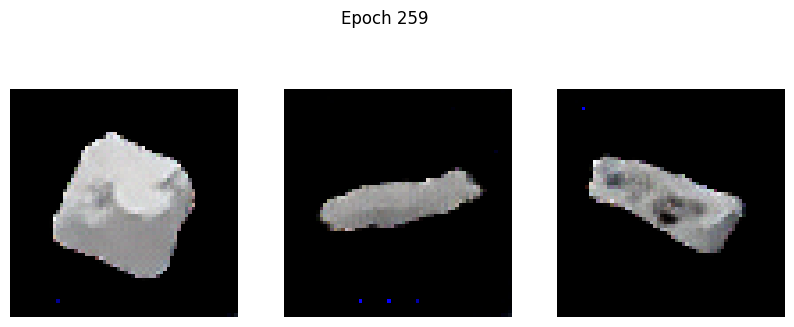

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.1753 - g_loss: 3.8281
Epoch 260/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.4982 - g_loss: 3.6487

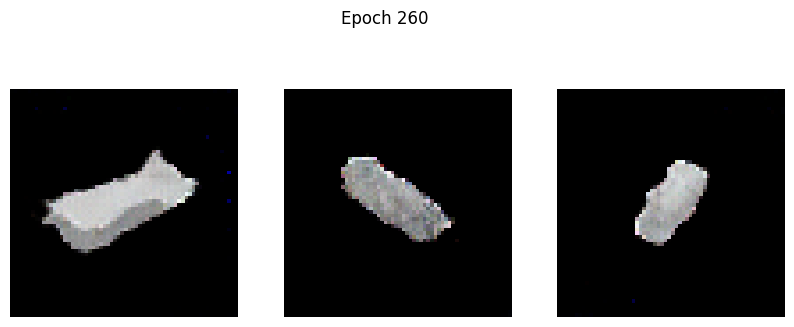

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.5073 - g_loss: 3.6489
Epoch 261/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.8787 - g_loss: 5.1466

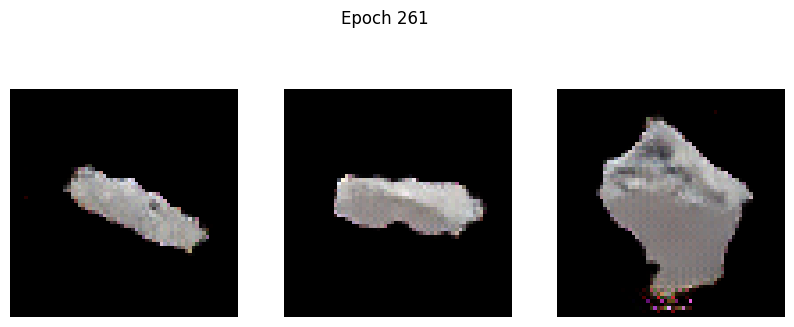

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.8942 - g_loss: 5.1450
Epoch 262/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.6011 - g_loss: 4.1532

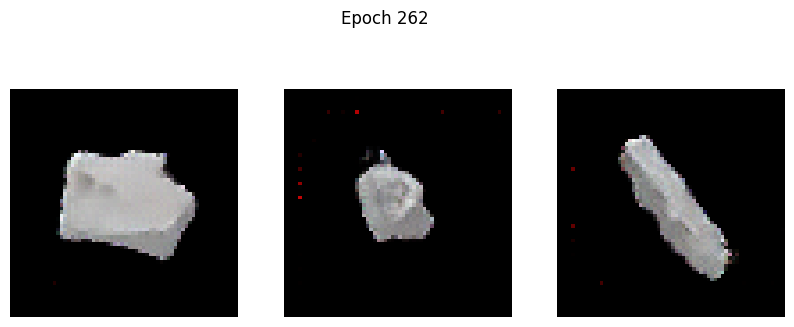

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.6017 - g_loss: 4.1493
Epoch 263/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.6627 - g_loss: 3.4889

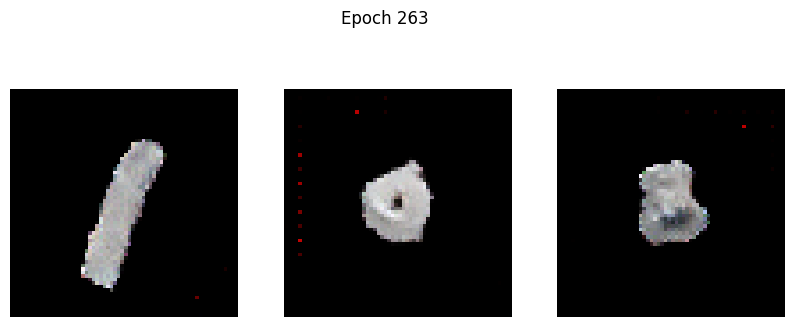

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.6620 - g_loss: 3.4896
Epoch 264/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.8714 - g_loss: 3.6717

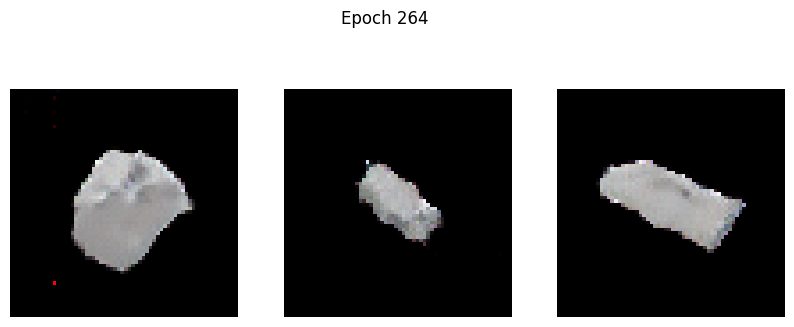

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.8651 - g_loss: 3.6704
Epoch 265/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.6398 - g_loss: 3.8850

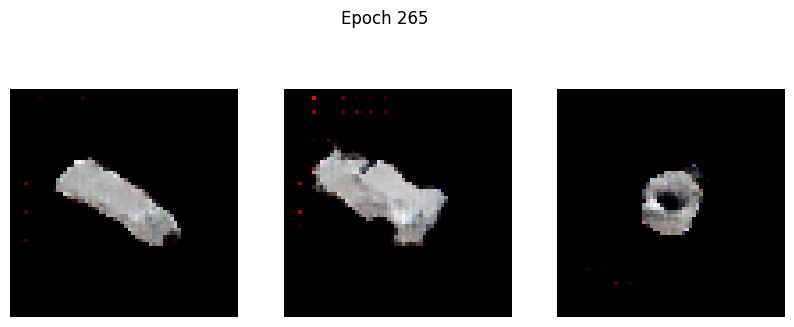

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.6130 - g_loss: 3.8945
Epoch 266/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.3820 - g_loss: 4.2158

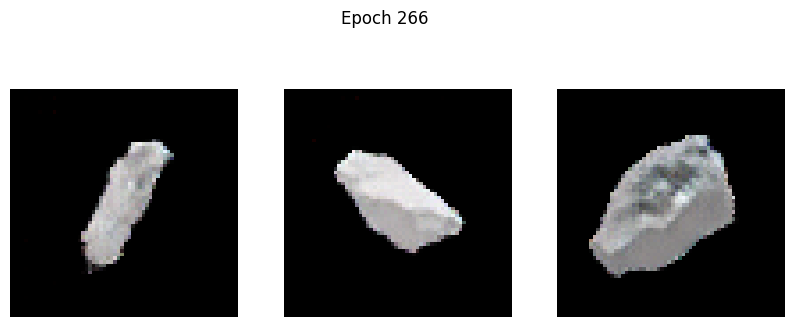

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.3686 - g_loss: 4.2133
Epoch 267/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.3270 - g_loss: 3.3977

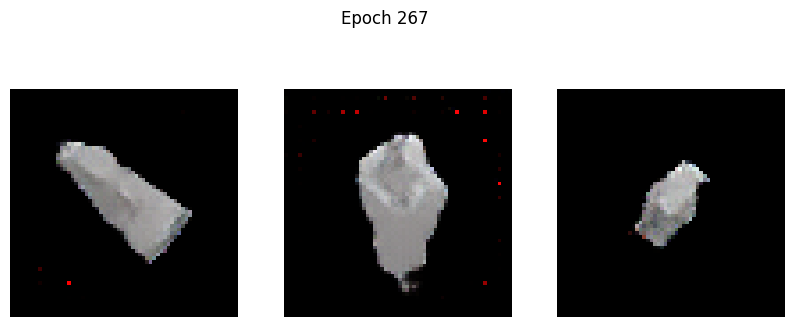

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.3326 - g_loss: 3.3981
Epoch 268/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.2982 - g_loss: 3.5567

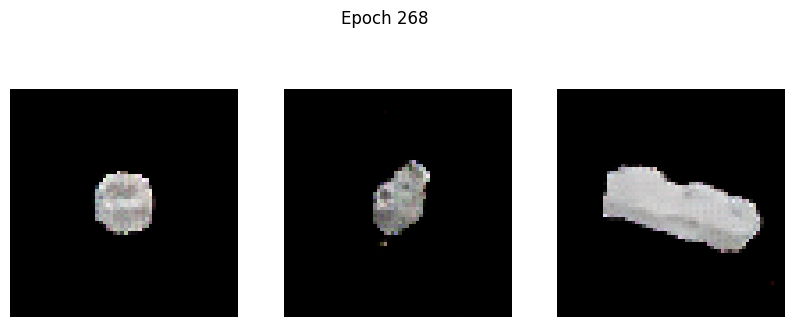

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.3050 - g_loss: 3.5582
Epoch 269/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.3028 - g_loss: 3.9528

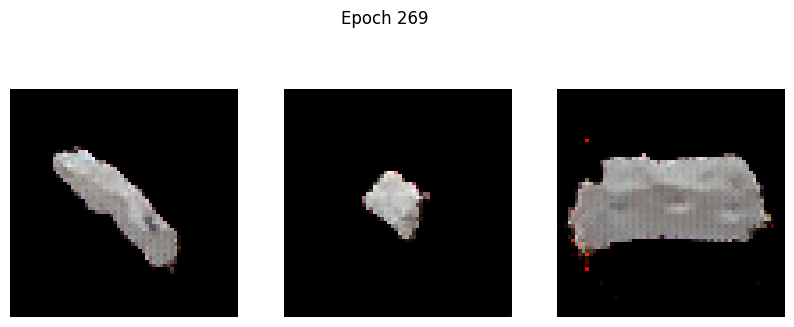

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.2813 - g_loss: 3.9562
Epoch 270/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.7957 - g_loss: 4.8856

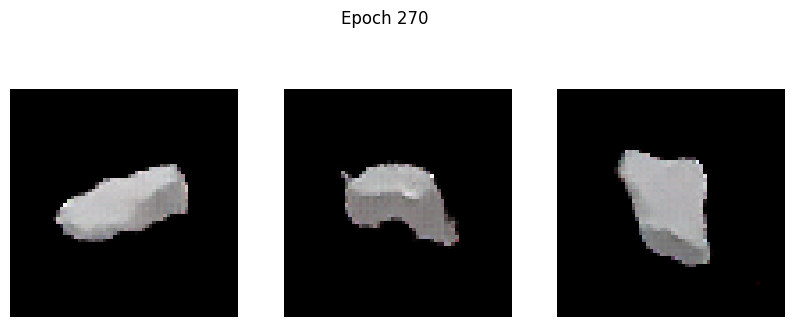

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.7940 - g_loss: 4.8819
Epoch 271/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.4191 - g_loss: 4.0656

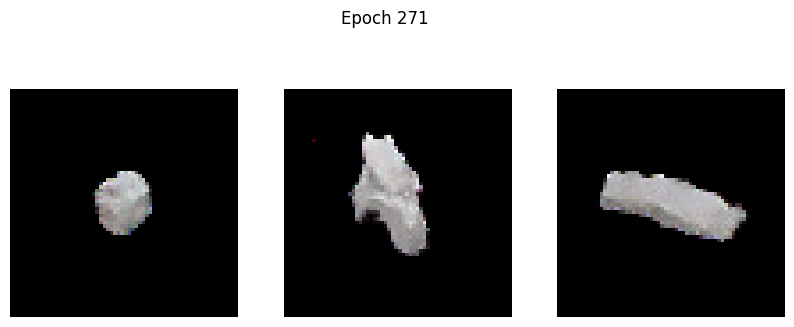

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.4239 - g_loss: 4.0645
Epoch 272/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.0786 - g_loss: 3.9870

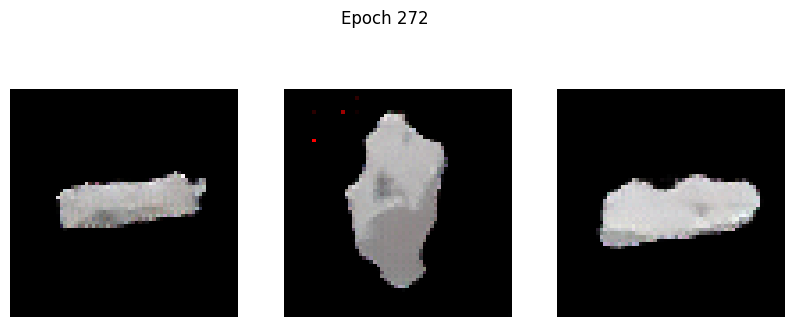

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.0639 - g_loss: 3.9892
Epoch 273/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.2854 - g_loss: 4.0805

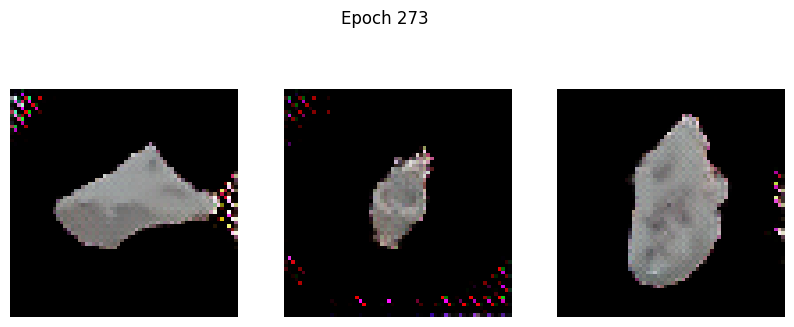

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.2468 - g_loss: 4.0867
Epoch 274/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 444.9037 - g_loss: 195.2039

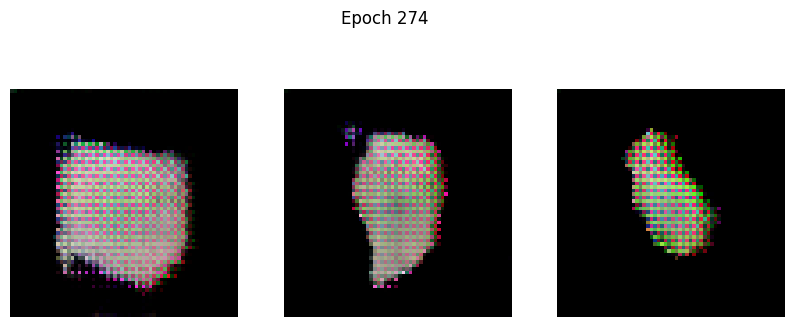

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 442.3007 - g_loss: 194.6361
Epoch 275/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 24.9590 - g_loss: 16.7059

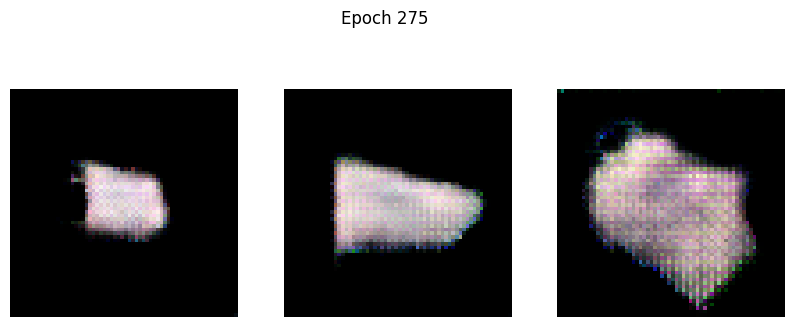

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 24.8980 - g_loss: 16.6812
Epoch 276/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 4.7196 - g_loss: 8.3993

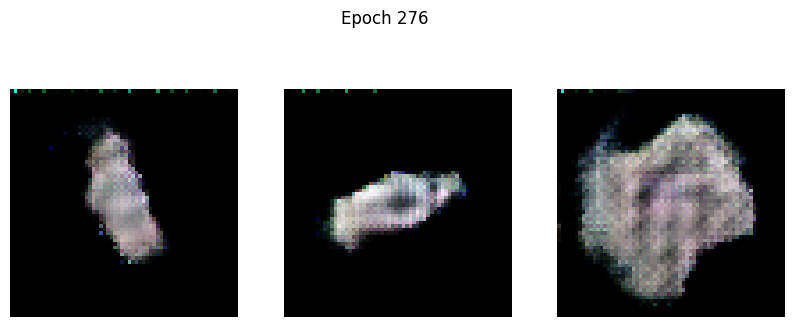

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 4.7044 - g_loss: 8.3987
Epoch 277/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5362 - g_loss: 6.9159

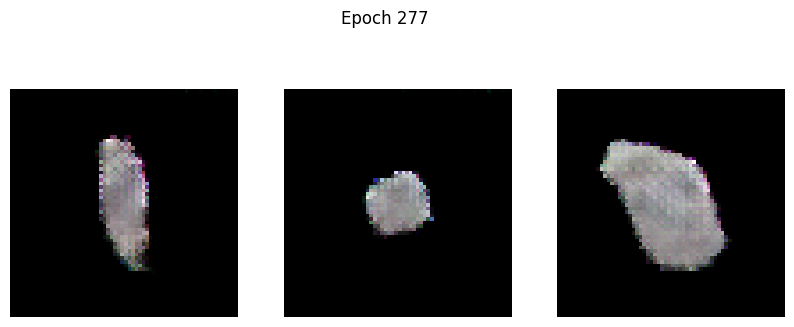

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5319 - g_loss: 6.9119
Epoch 278/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4649 - g_loss: 5.3355

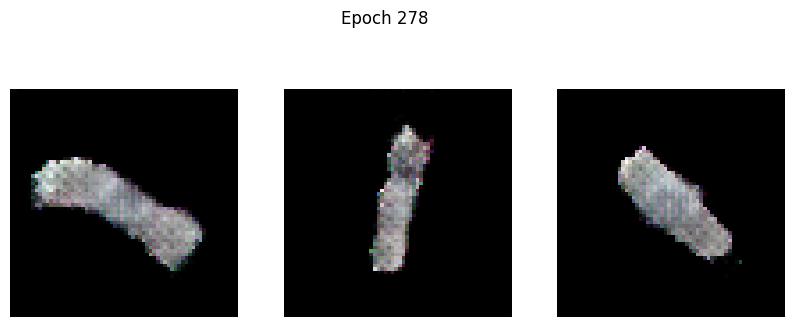

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4570 - g_loss: 5.3337
Epoch 279/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.6726 - g_loss: 4.9971

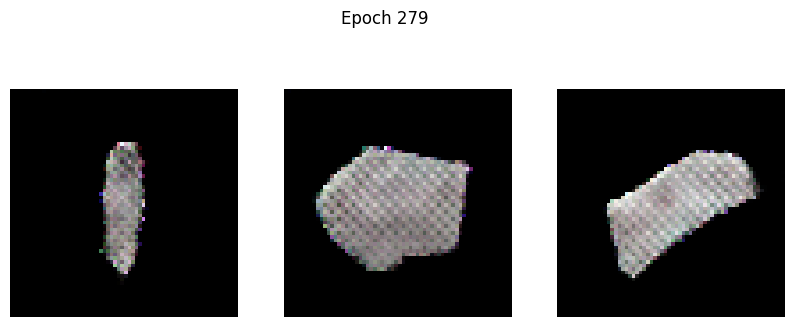

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.6711 - g_loss: 4.9941
Epoch 280/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.5421 - g_loss: 4.5230

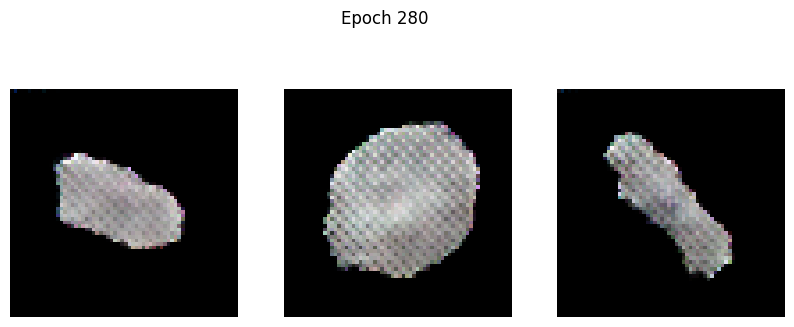

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.5452 - g_loss: 4.5211
Epoch 281/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.0057 - g_loss: 3.7396

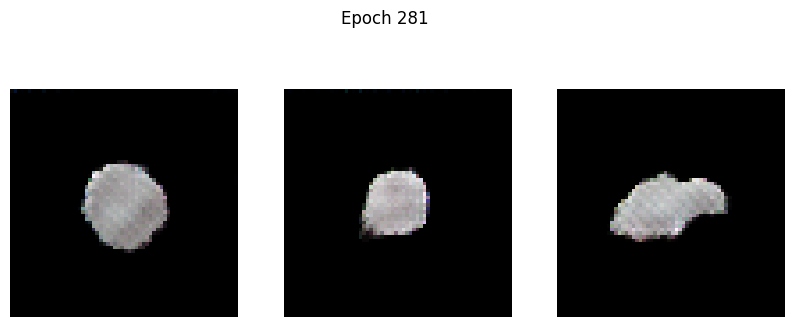

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.0046 - g_loss: 3.7394
Epoch 282/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.6539 - g_loss: 3.4724

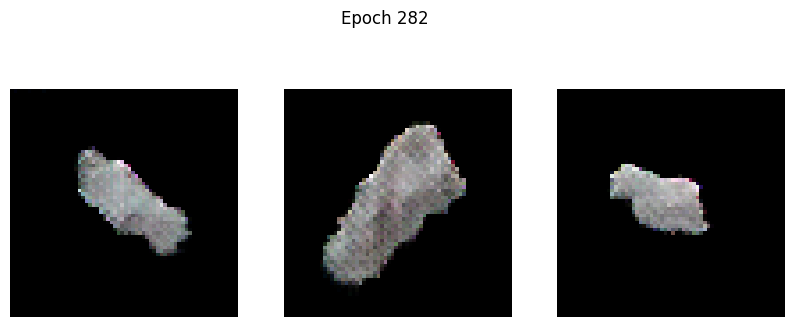

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - d_loss: -2.6598 - g_loss: 3.4722
Epoch 283/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -3.8429 - g_loss: 3.7007

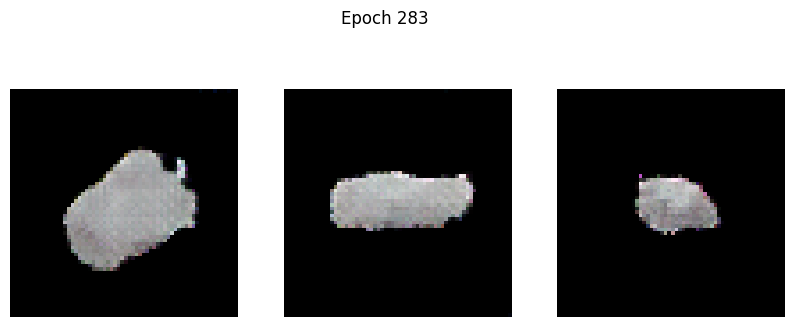

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.8439 - g_loss: 3.6994
Epoch 284/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.6016 - g_loss: 3.2763

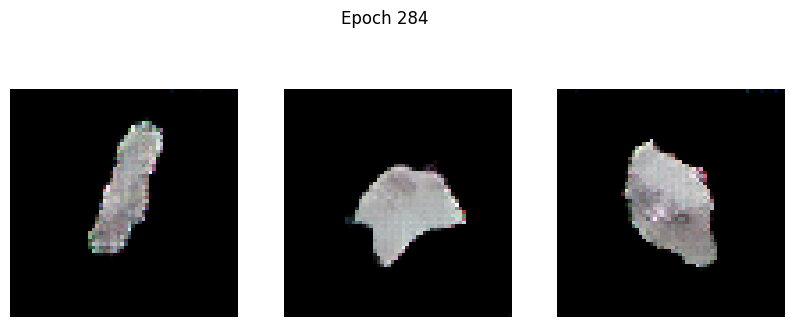

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.6041 - g_loss: 3.2767
Epoch 285/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.2328 - g_loss: 3.3970

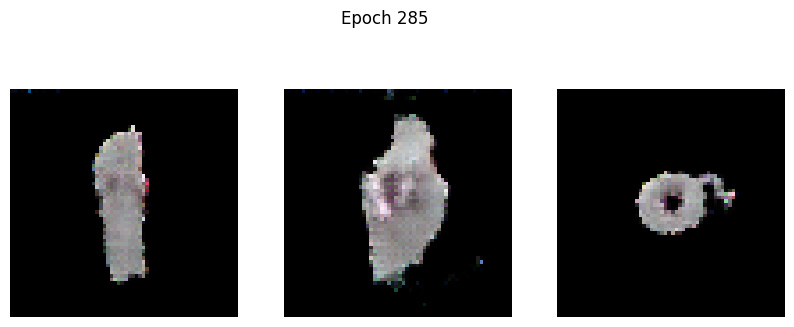

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.2386 - g_loss: 3.3957
Epoch 286/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.4878 - g_loss: 3.1311

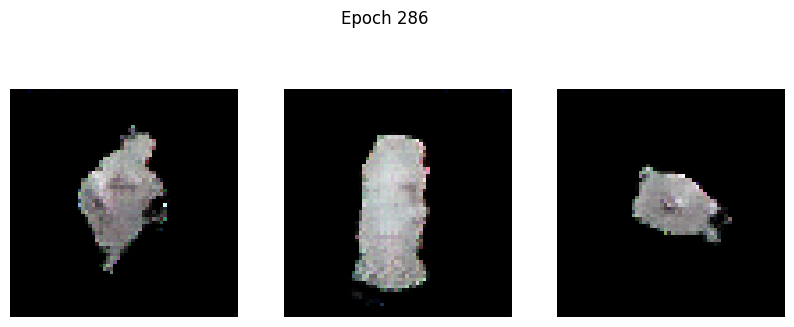

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.4992 - g_loss: 3.1311
Epoch 287/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.3163 - g_loss: 3.2164

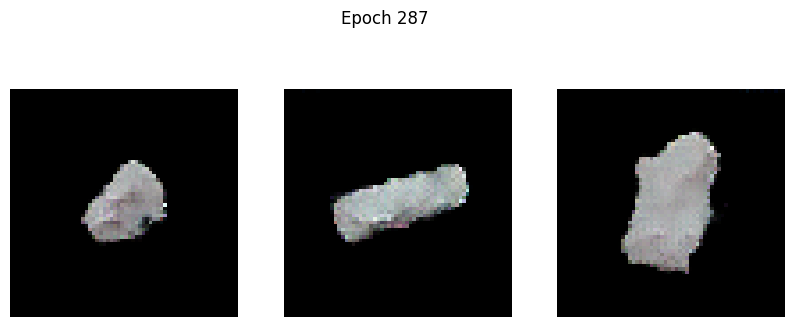

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.3121 - g_loss: 3.2156
Epoch 288/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -5.4230 - g_loss: 2.9996

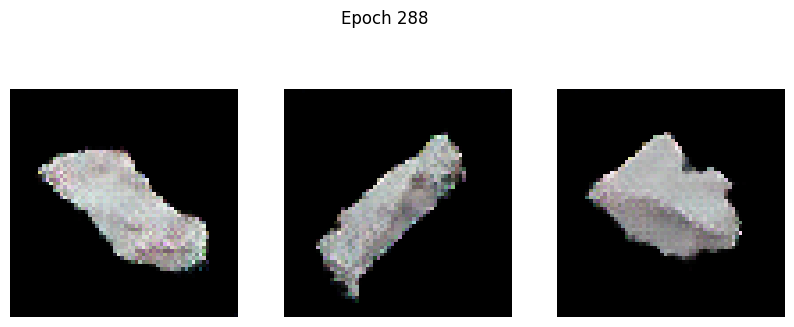

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -5.4224 - g_loss: 2.9992
Epoch 289/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -5.1865 - g_loss: 2.8931

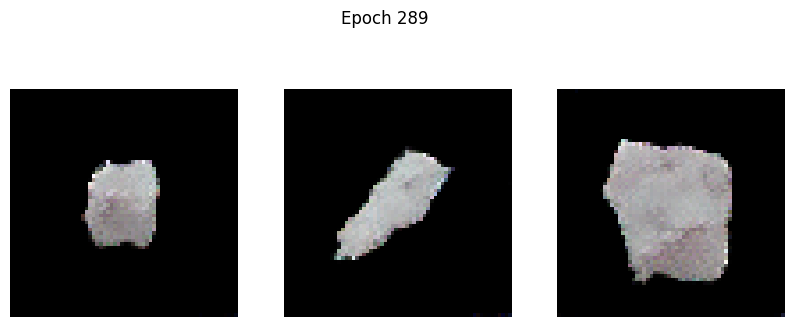

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -5.1913 - g_loss: 2.8936
Epoch 290/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.0375 - g_loss: 3.1937

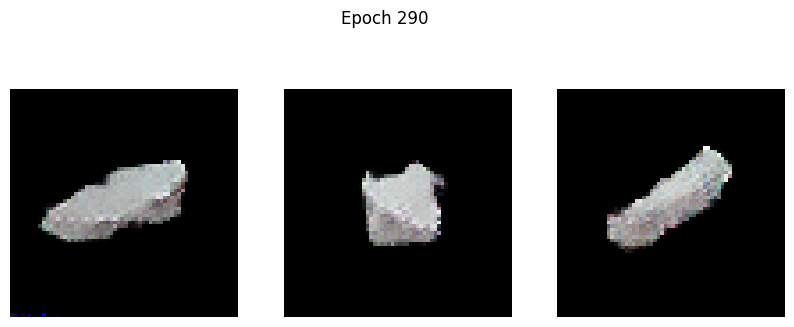

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -4.0492 - g_loss: 3.1919
Epoch 291/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.1700 - g_loss: 3.0753

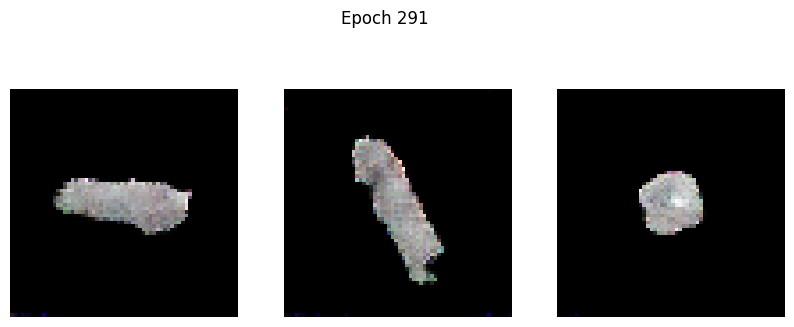

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.1621 - g_loss: 3.0752
Epoch 292/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -6.1407 - g_loss: 3.0482

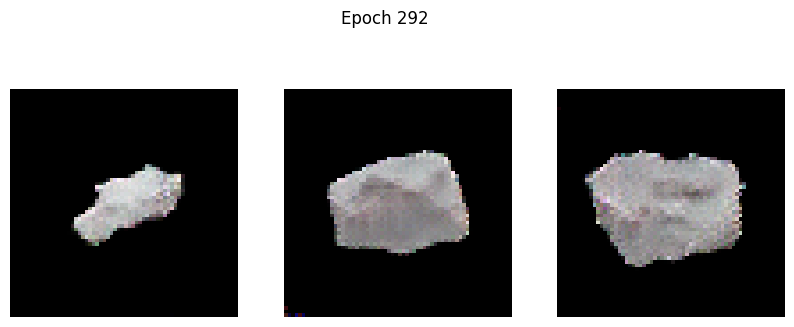

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -6.1431 - g_loss: 3.0471
Epoch 293/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.9596 - g_loss: 2.9384

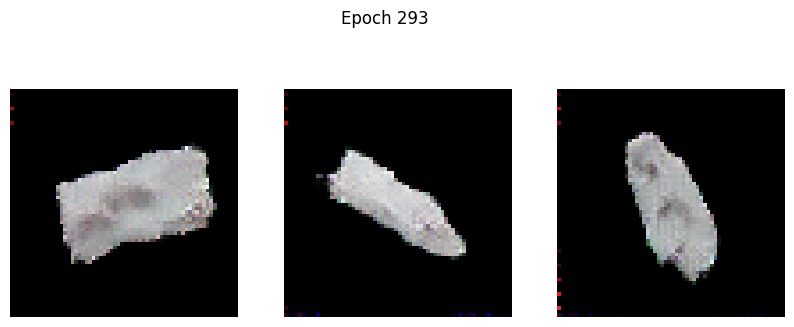

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.9621 - g_loss: 2.9391
Epoch 294/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.1699 - g_loss: 2.9798

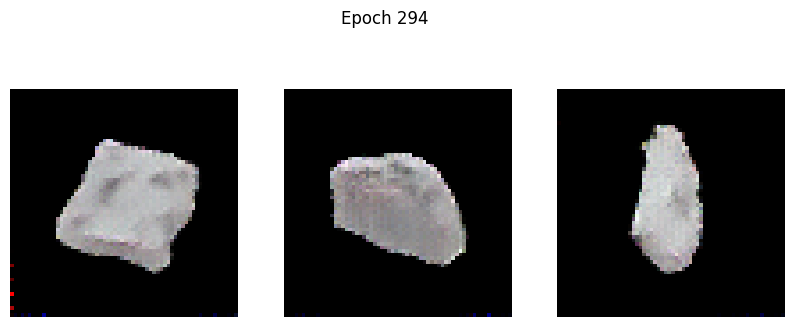

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.1643 - g_loss: 2.9803
Epoch 295/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.1809 - g_loss: 2.9795

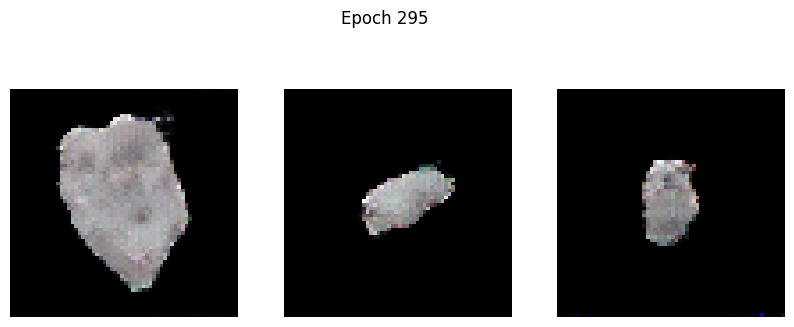

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -7.1879 - g_loss: 2.9790
Epoch 296/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.1500 - g_loss: 3.0256

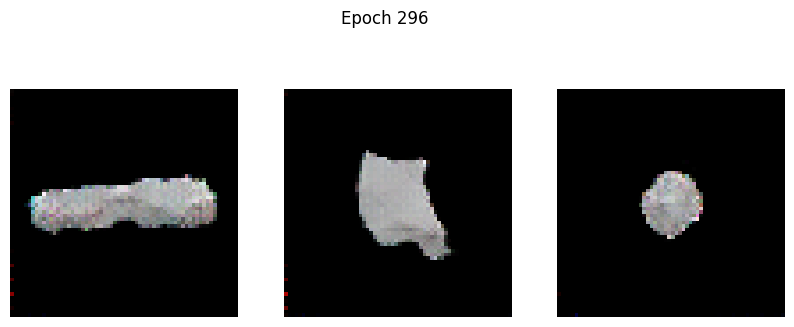

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -8.1462 - g_loss: 3.0252
Epoch 297/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -8.7001 - g_loss: 3.4524

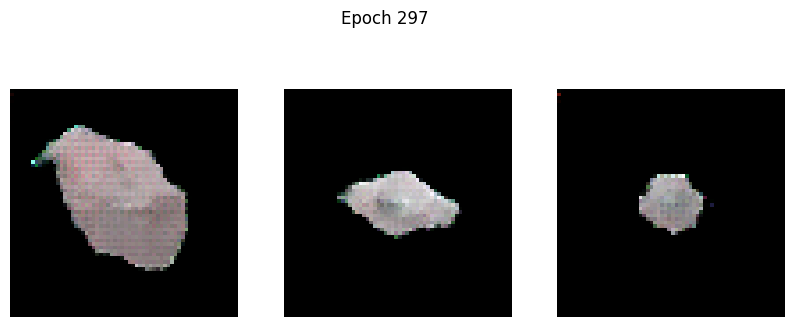

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.6647 - g_loss: 3.4612
Epoch 298/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.5056 - g_loss: 7.1059

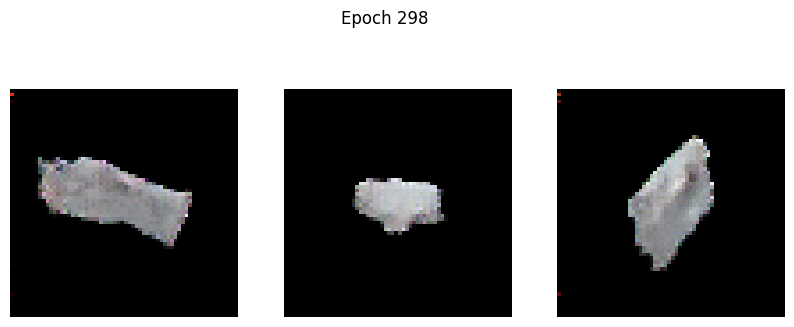

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.5314 - g_loss: 7.0862
Epoch 299/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.6407 - g_loss: 3.5443

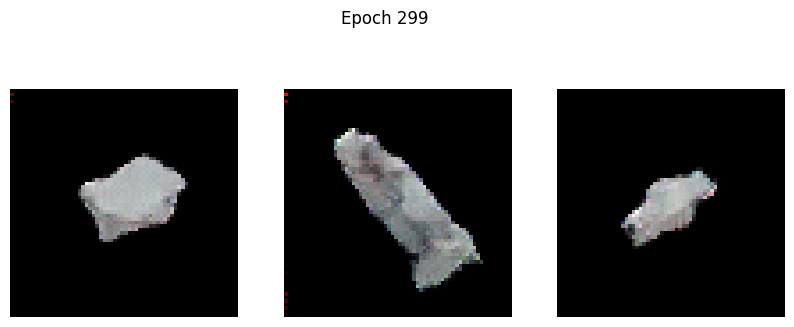

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -6.6672 - g_loss: 3.5437
Epoch 300/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.6881 - g_loss: 3.2293

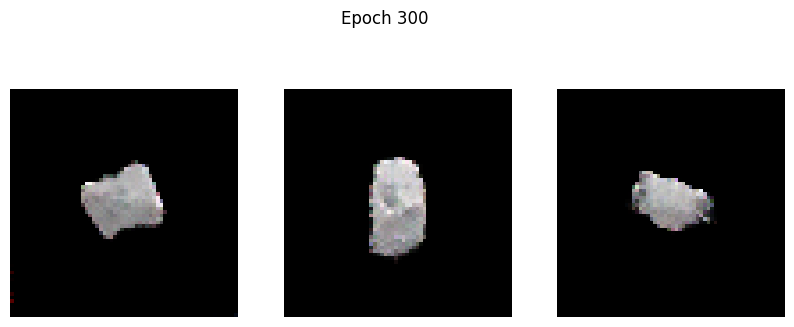

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.7171 - g_loss: 3.2300
Epoch 301/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -5.8911 - g_loss: 4.4156

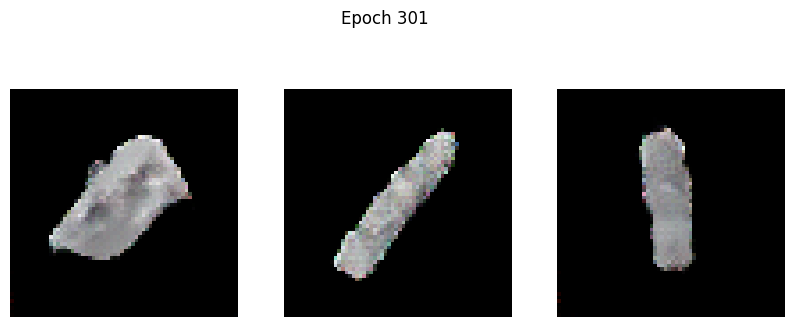

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -5.9118 - g_loss: 4.4134
Epoch 302/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -8.8194 - g_loss: 3.7432

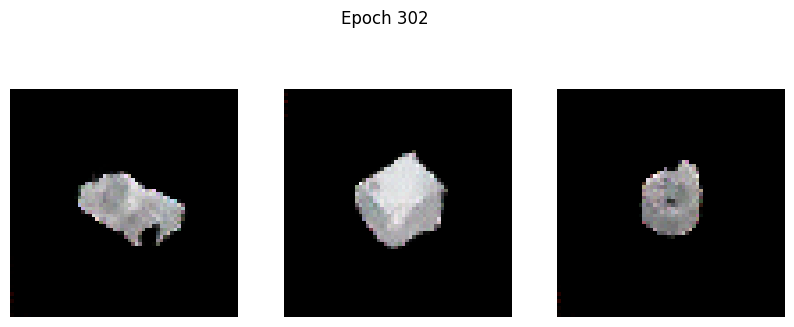

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -8.8301 - g_loss: 3.7429
Epoch 303/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.4671 - g_loss: 3.5611

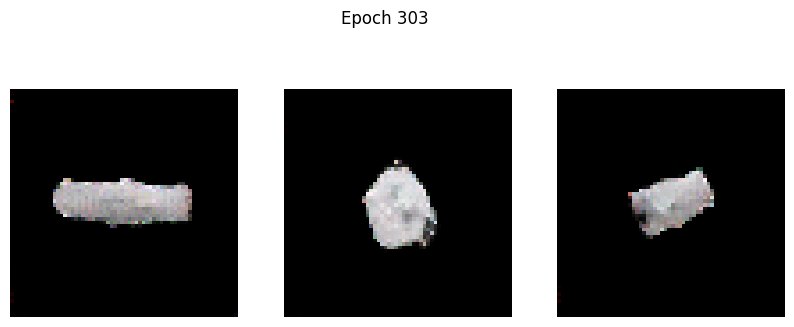

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.4776 - g_loss: 3.5616
Epoch 304/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.8041 - g_loss: 3.8480

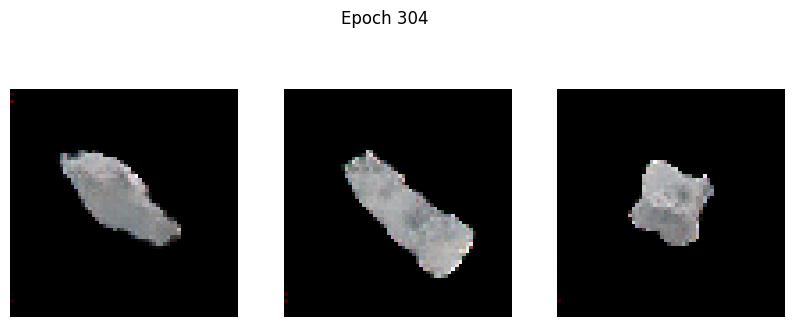

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -10.7961 - g_loss: 3.8483
Epoch 305/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.5326 - g_loss: 3.8264

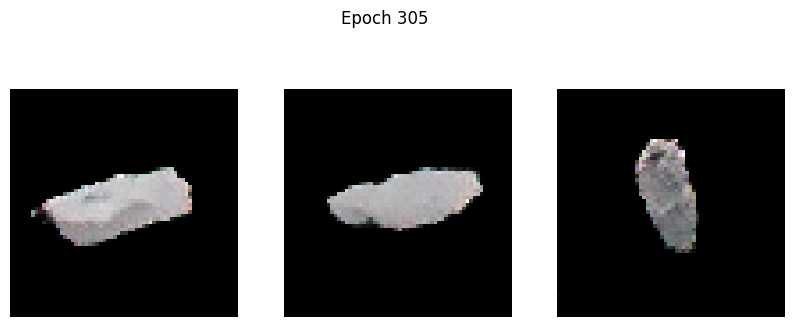

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.5304 - g_loss: 3.8265
Epoch 306/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.5897 - g_loss: 4.0943

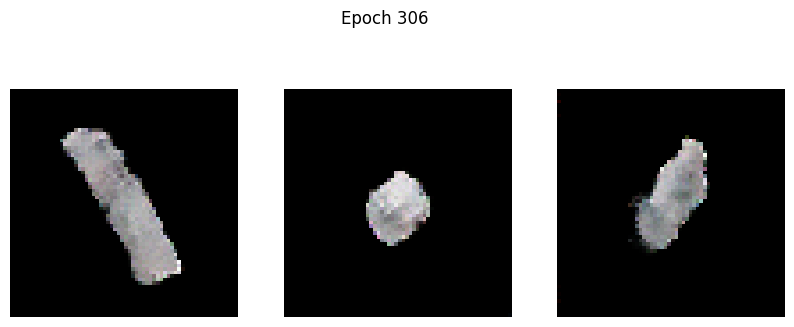

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.5848 - g_loss: 4.0938
Epoch 307/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.3594 - g_loss: 3.8707

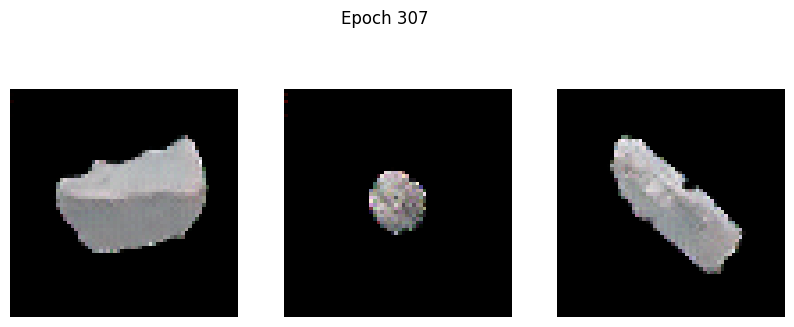

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.3670 - g_loss: 3.8714
Epoch 308/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -12.9314 - g_loss: 3.9697

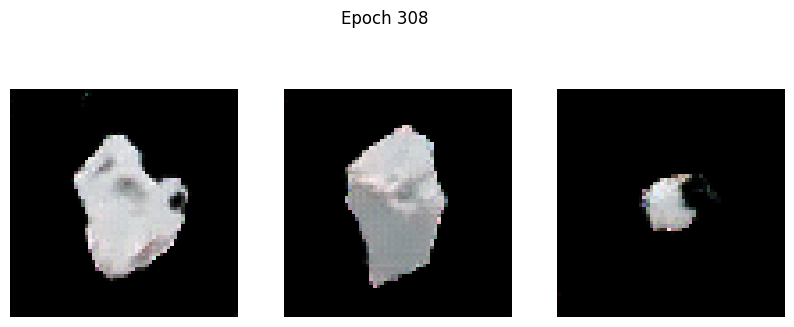

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -12.9134 - g_loss: 3.9716
Epoch 309/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.5671 - g_loss: 3.8411

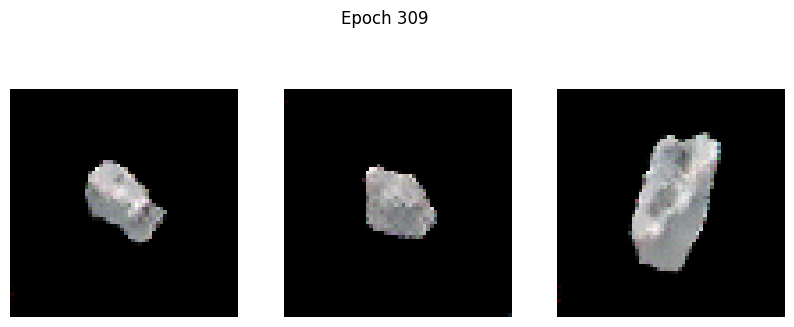

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.5951 - g_loss: 3.8439
Epoch 310/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -12.8320 - g_loss: 3.9790

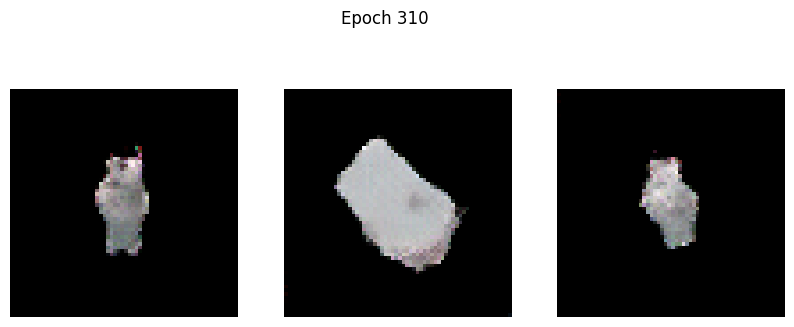

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -12.8305 - g_loss: 3.9817
Epoch 311/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.9499 - g_loss: 4.1556

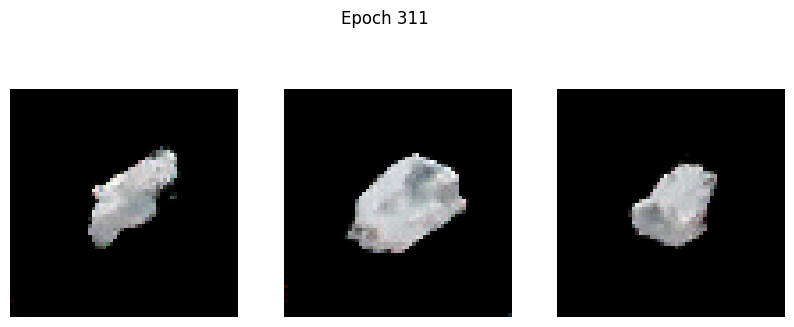

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.9436 - g_loss: 4.1560
Epoch 312/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -12.9481 - g_loss: 4.1212

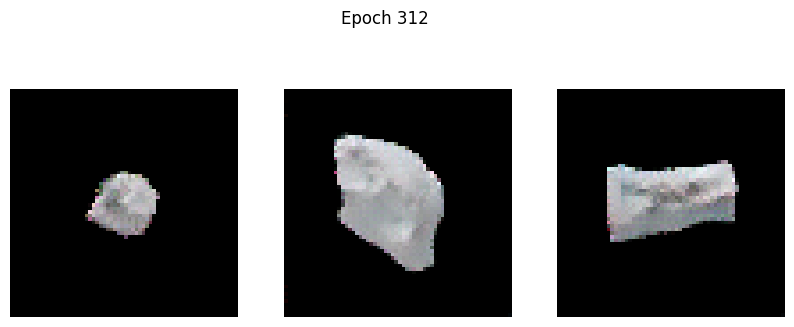

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -12.9555 - g_loss: 4.1224
Epoch 313/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -12.2954 - g_loss: 3.9311

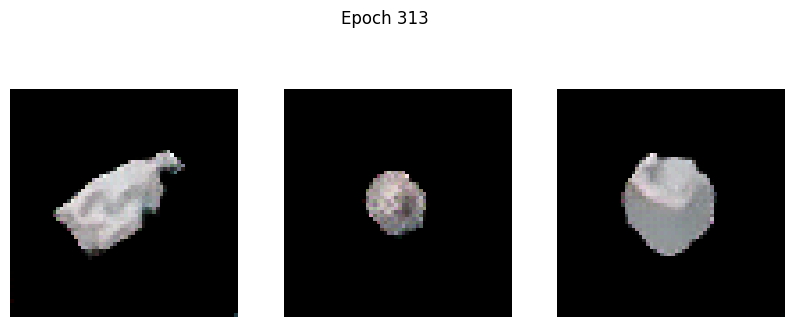

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -12.3138 - g_loss: 3.9332
Epoch 314/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -15.4872 - g_loss: 4.4939

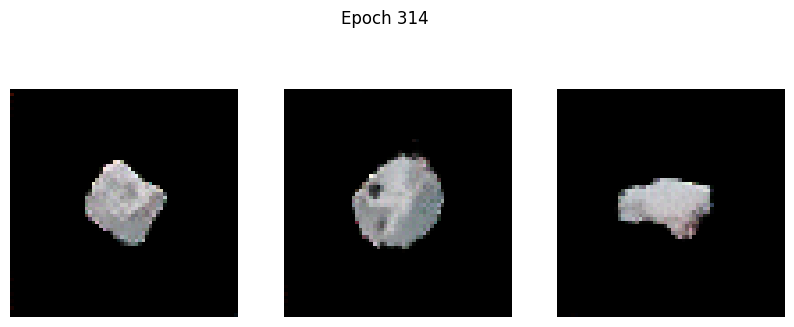

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.4637 - g_loss: 4.4954
Epoch 315/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.7500 - g_loss: 4.4161

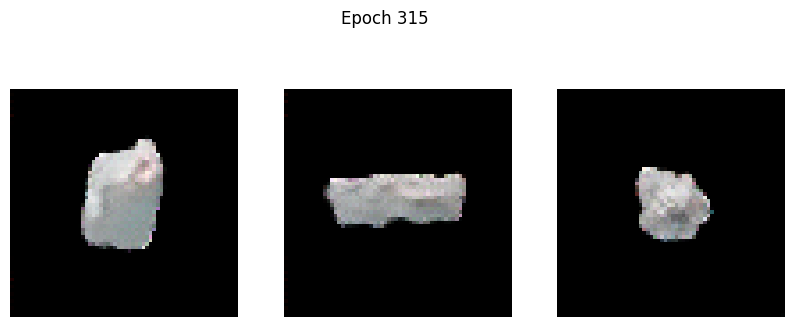

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.7570 - g_loss: 4.4161
Epoch 316/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -14.9974 - g_loss: 4.7986

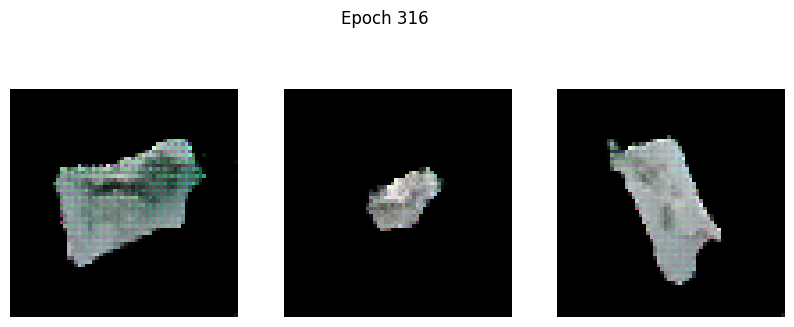

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -14.8914 - g_loss: 4.8360
Epoch 317/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.3168 - g_loss: 4.7343

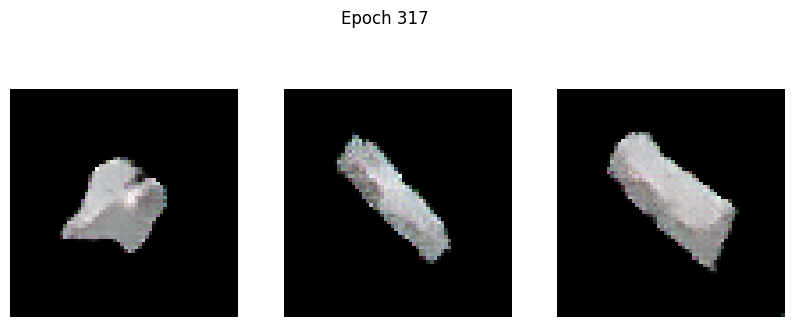

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.3124 - g_loss: 4.7294
Epoch 318/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.6609 - g_loss: 3.6074

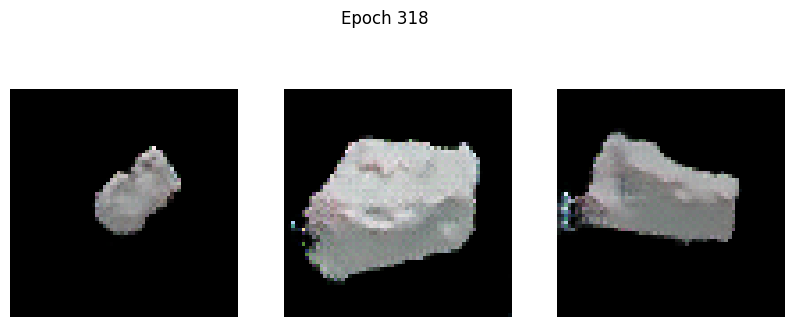

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.6719 - g_loss: 3.6100
Epoch 319/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 124.7665 - g_loss: 44.5988

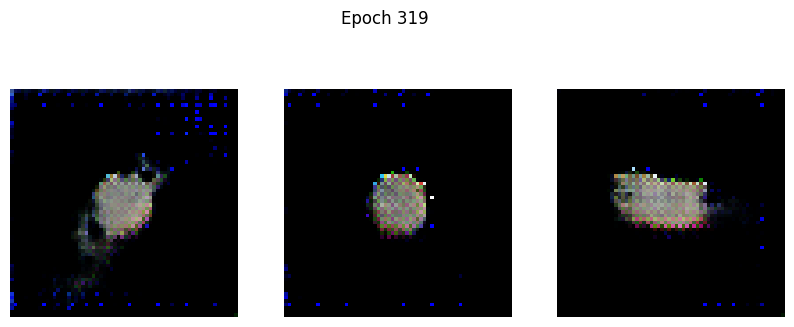

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 124.9765 - g_loss: 44.8122
Epoch 320/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 9.1439 - g_loss: 18.2264

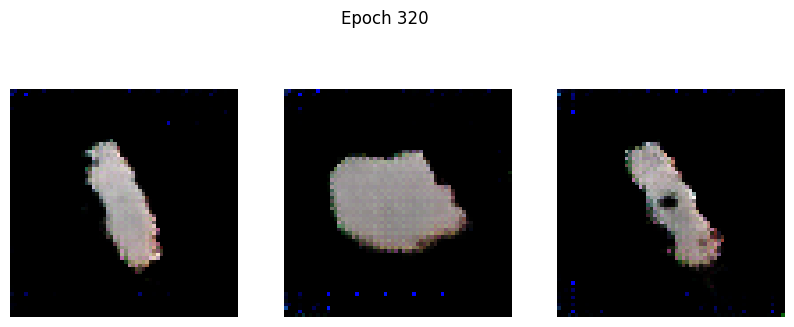

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 9.0998 - g_loss: 18.1814
Epoch 321/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.0756 - g_loss: 8.5649

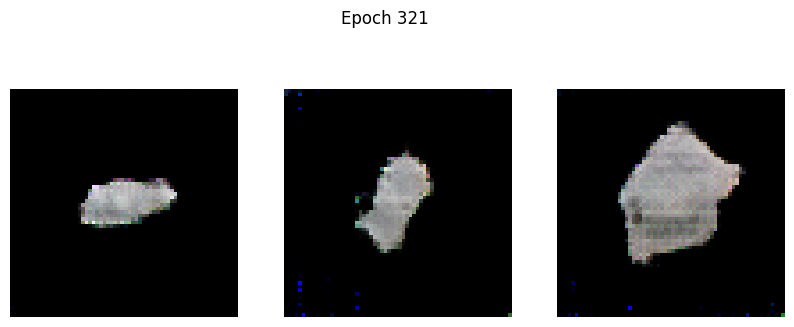

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.0859 - g_loss: 8.5543
Epoch 322/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.1939 - g_loss: 6.0075

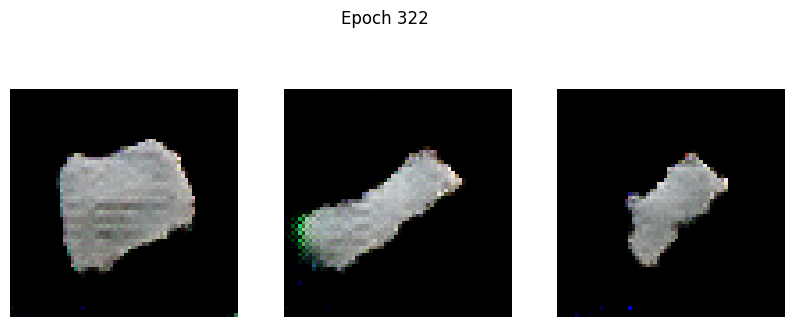

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -7.2003 - g_loss: 6.0023
Epoch 323/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.2650 - g_loss: 4.9117

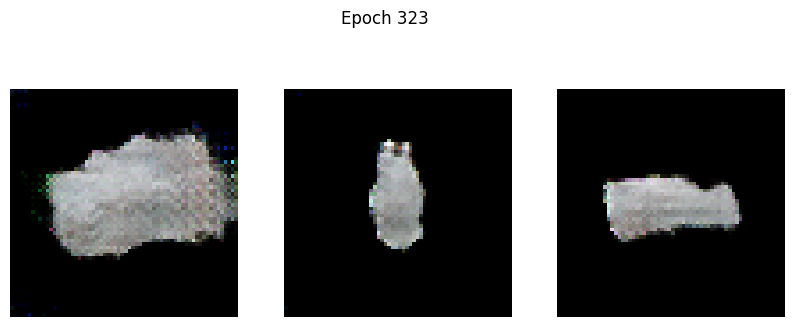

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.2699 - g_loss: 4.9095
Epoch 324/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.8512 - g_loss: 4.4113

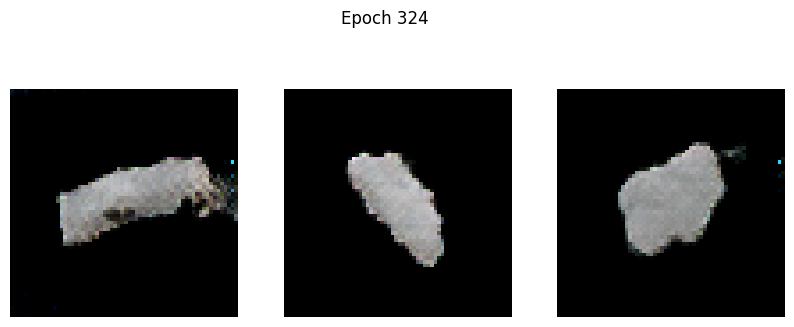

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.8667 - g_loss: 4.4092
Epoch 325/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.7617 - g_loss: 3.9400

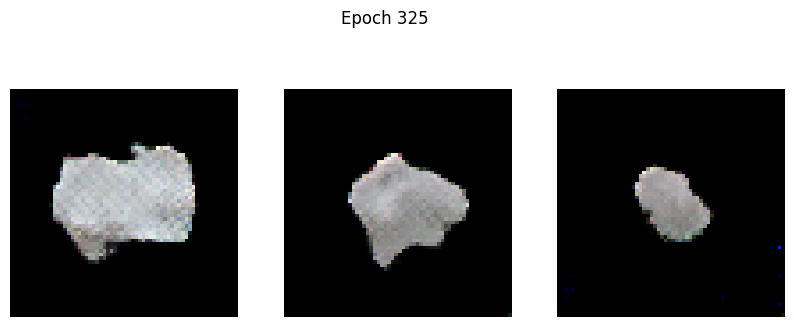

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.7650 - g_loss: 3.9399
Epoch 326/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.4450 - g_loss: 3.9385

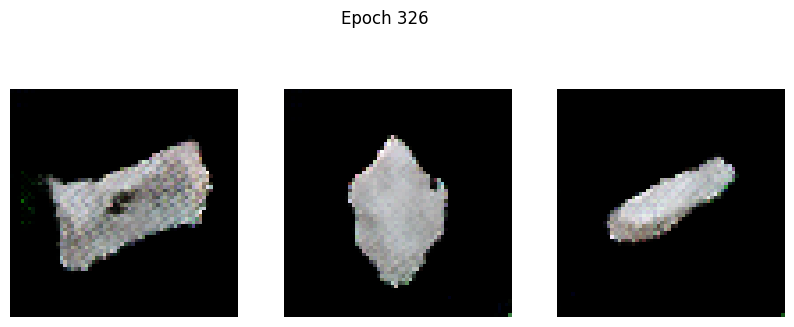

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.4603 - g_loss: 3.9374
Epoch 327/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.2460 - g_loss: 3.6281

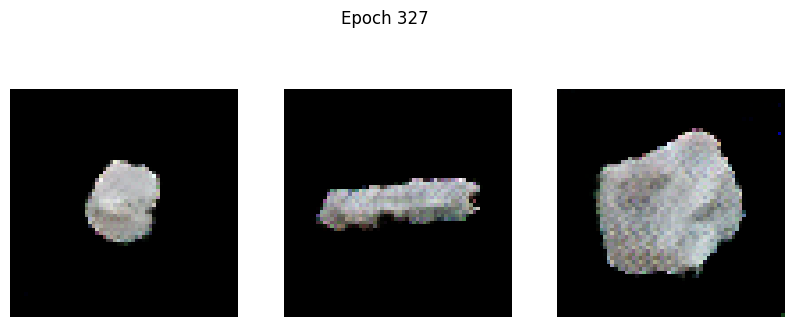

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.2678 - g_loss: 3.6278
Epoch 328/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -12.8361 - g_loss: 3.5294

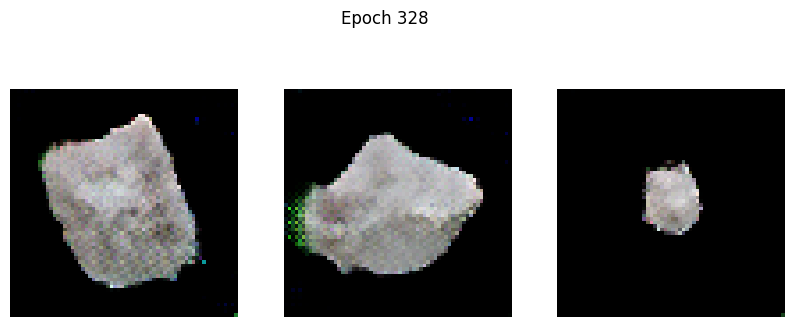

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -12.8497 - g_loss: 3.5290
Epoch 329/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -14.2340 - g_loss: 3.3400

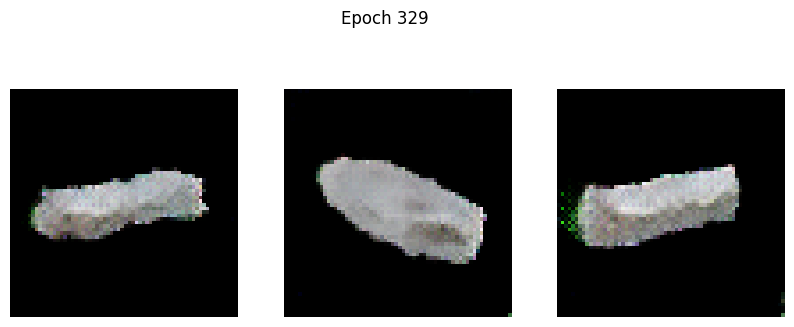

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -14.2378 - g_loss: 3.3406
Epoch 330/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -13.3139 - g_loss: 3.4089

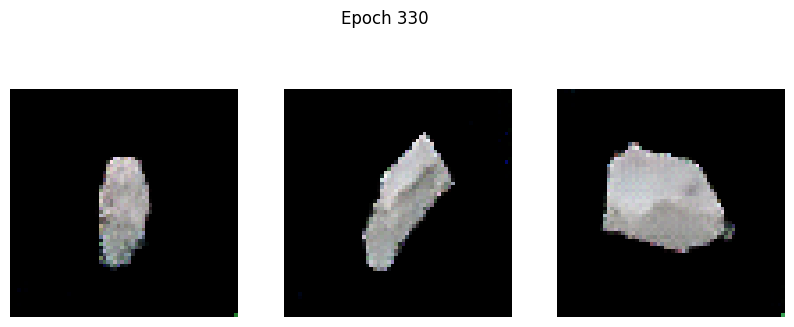

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -13.3128 - g_loss: 3.4096
Epoch 331/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -14.9949 - g_loss: 3.4345

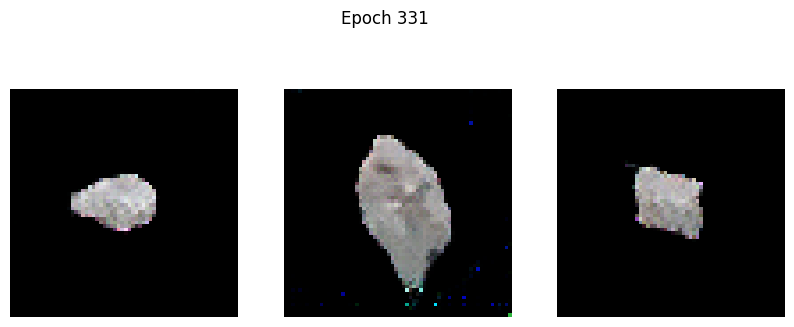

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -15.0050 - g_loss: 3.4348
Epoch 332/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -17.2834 - g_loss: 3.9213

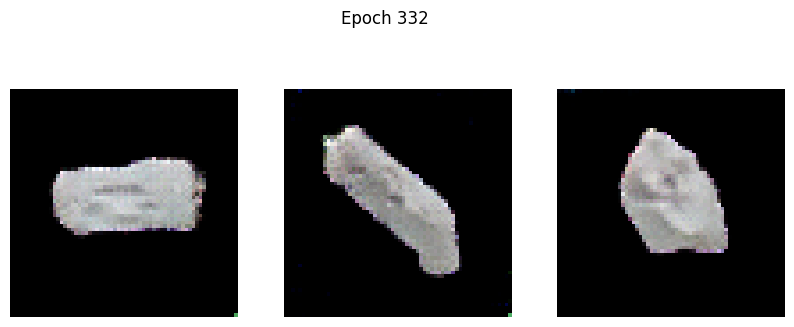

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -17.2668 - g_loss: 3.9249
Epoch 333/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -18.2014 - g_loss: 4.1714

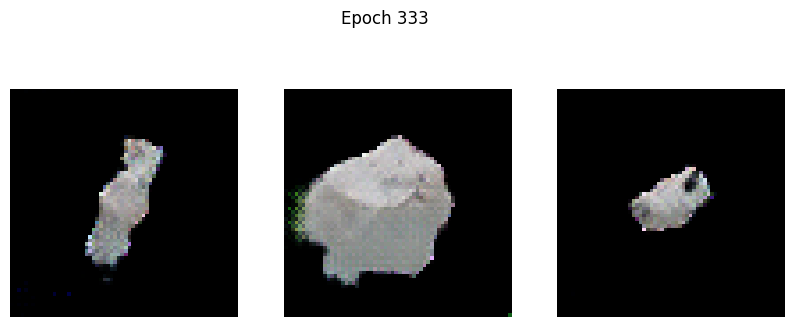

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -18.1905 - g_loss: 4.1697
Epoch 334/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -18.9724 - g_loss: 4.0265

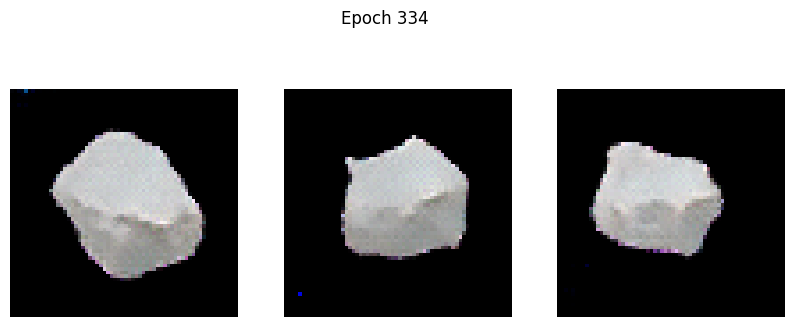

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -18.9704 - g_loss: 4.0271
Epoch 335/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -17.0326 - g_loss: 4.3428

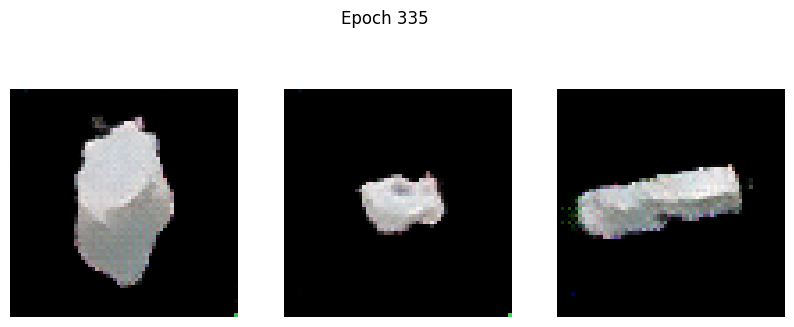

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -17.0482 - g_loss: 4.3398
Epoch 336/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -22.2957 - g_loss: 4.3368

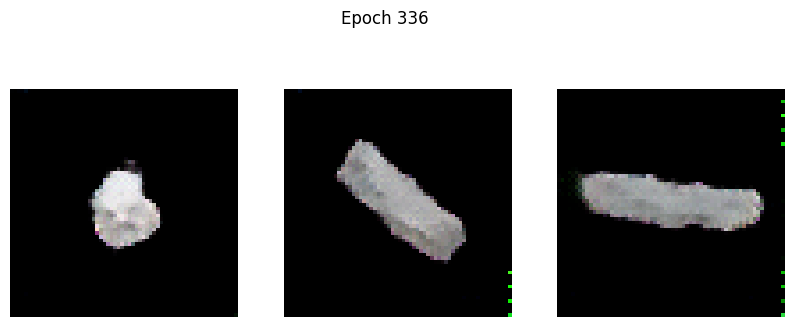

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -22.2788 - g_loss: 4.3363
Epoch 337/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -17.4436 - g_loss: 4.5791

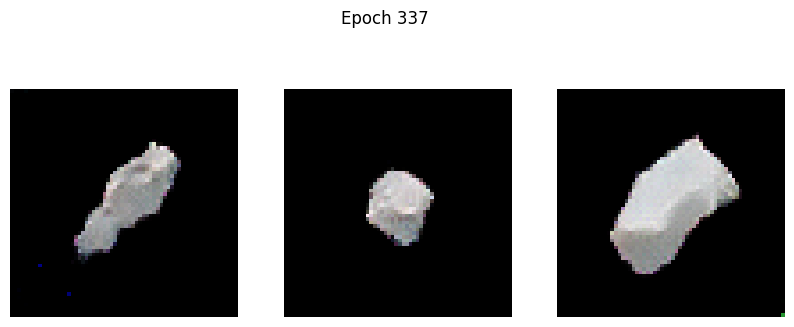

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -17.4419 - g_loss: 4.5805
Epoch 338/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -18.1272 - g_loss: 4.6349

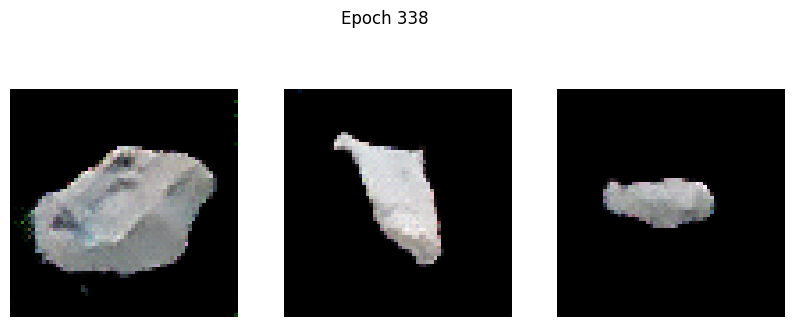

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -18.1517 - g_loss: 4.6343
Epoch 339/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 3824.1790 - g_loss: 1823.0774

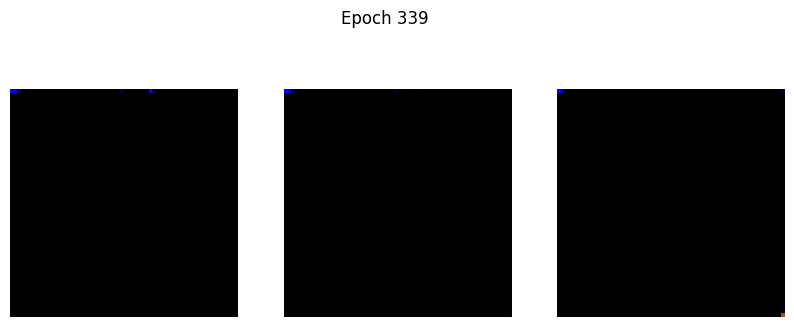

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 3816.4199 - g_loss: 1823.8718
Epoch 340/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 48.4101 - g_loss: 494.1156

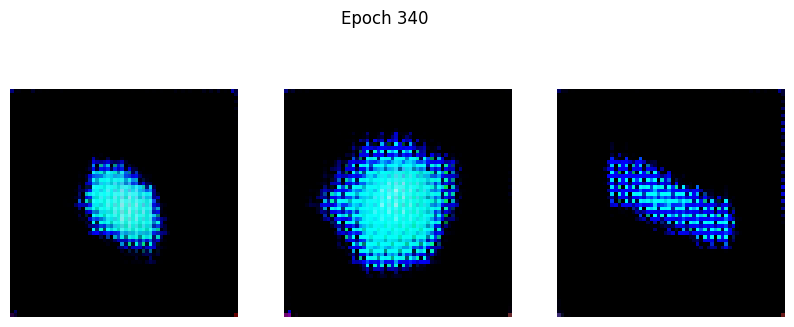

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 48.3222 - g_loss: 493.5098
Epoch 341/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 34.8834 - g_loss: 188.7947

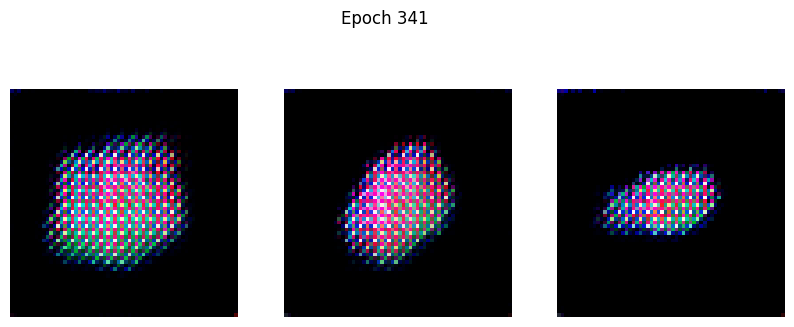

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 34.9336 - g_loss: 188.5268
Epoch 342/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 39.7424 - g_loss: 105.7805

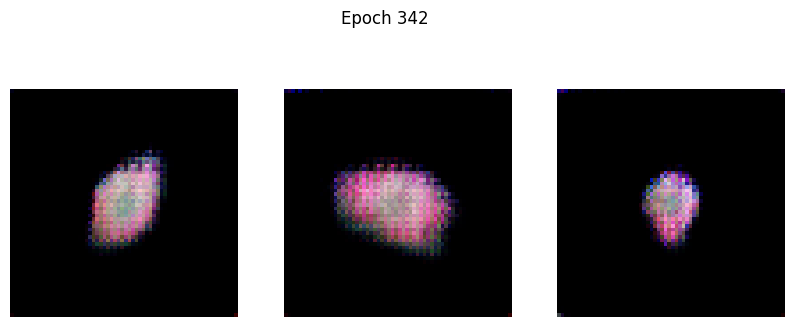

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 39.7565 - g_loss: 105.6452
Epoch 343/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 49.5848 - g_loss: 49.8794

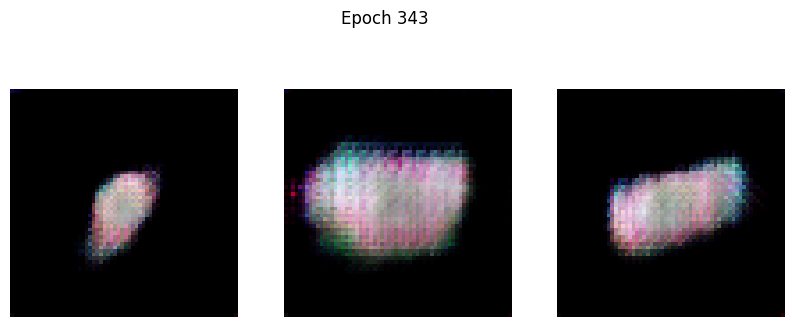

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 49.5695 - g_loss: 49.8200
Epoch 344/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 37.2779 - g_loss: 36.6261

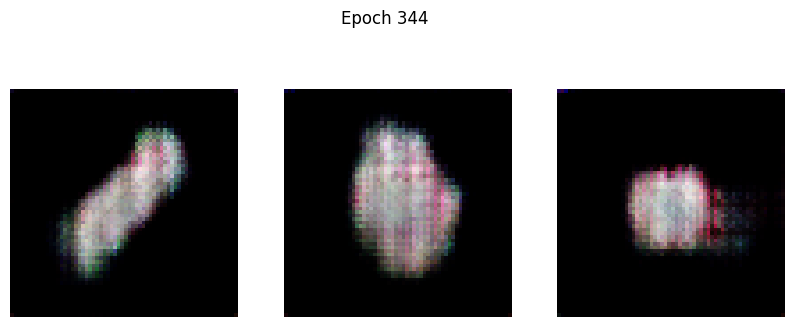

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 37.2601 - g_loss: 36.6101
Epoch 345/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 25.5048 - g_loss: 28.2582

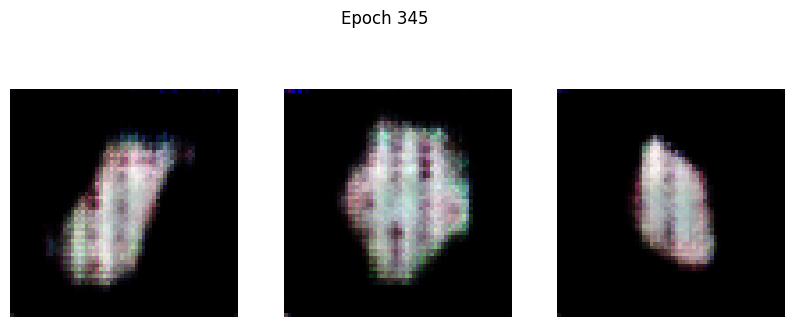

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 25.5005 - g_loss: 28.2458
Epoch 346/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 16.8579 - g_loss: 26.5382

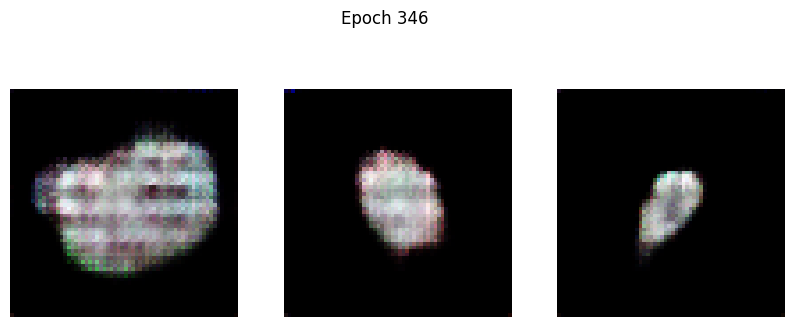

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 16.8681 - g_loss: 26.5050
Epoch 347/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 16.7498 - g_loss: 23.4489

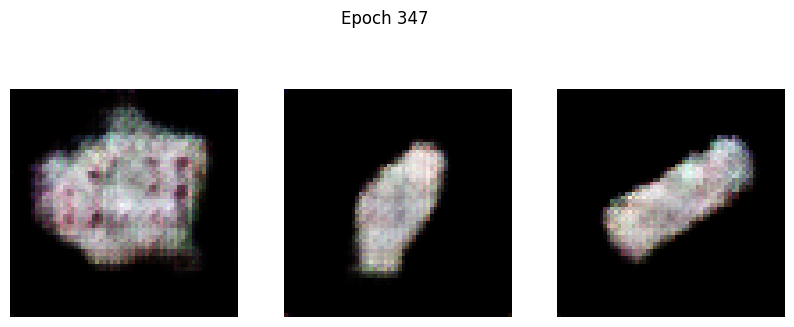

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 16.7504 - g_loss: 23.4296
Epoch 348/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 15.1865 - g_loss: 18.4948

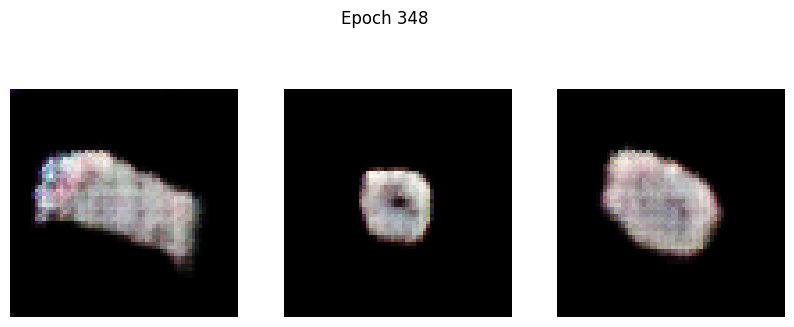

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 15.1832 - g_loss: 18.4852
Epoch 349/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 12.6263 - g_loss: 16.5525

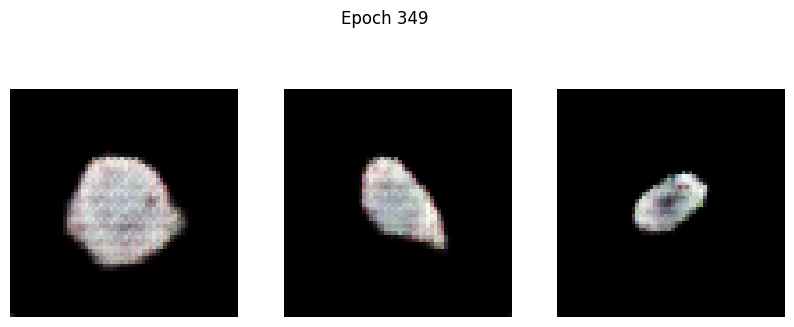

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 12.6235 - g_loss: 16.5527
Epoch 350/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 11.5706 - g_loss: 15.5637

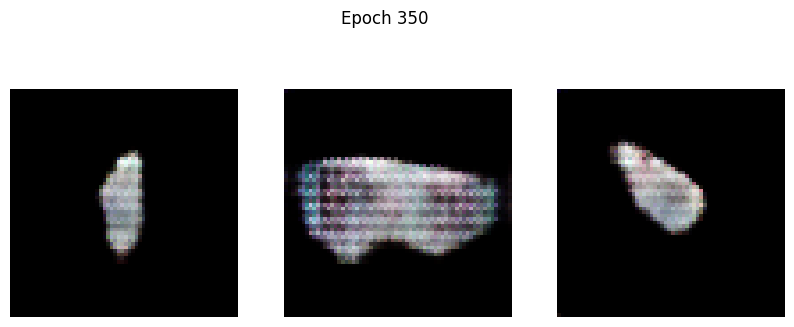

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 11.5721 - g_loss: 15.5586
Epoch 351/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 10.9343 - g_loss: 14.4957

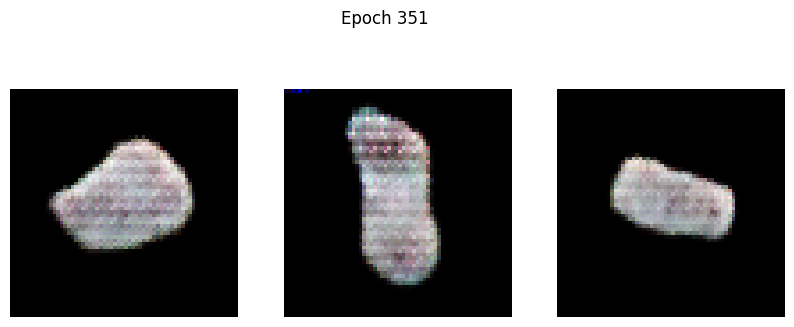

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 10.9350 - g_loss: 14.4932
Epoch 352/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 10.2866 - g_loss: 13.9214

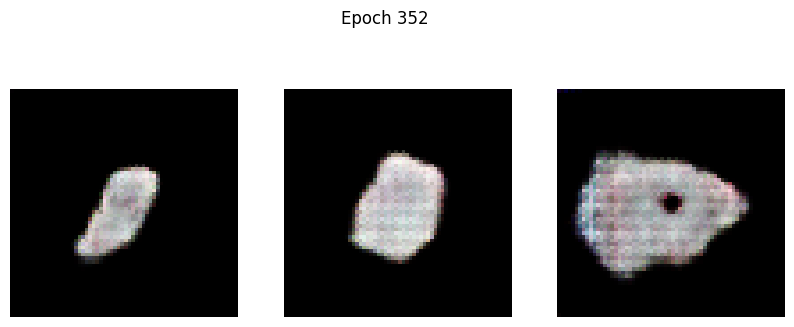

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 10.2819 - g_loss: 13.9150
Epoch 353/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 9.9403 - g_loss: 12.3789

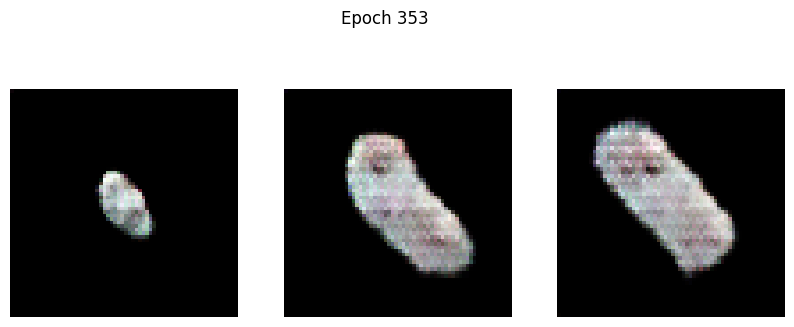

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 9.9350 - g_loss: 12.3790
Epoch 354/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 8.6920 - g_loss: 11.3320

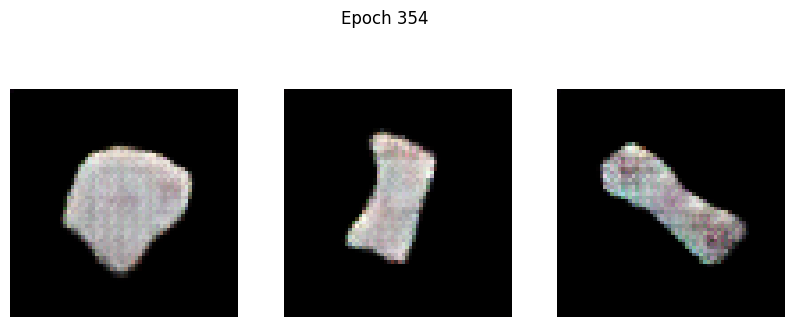

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 8.6889 - g_loss: 11.3310
Epoch 355/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 7.9821 - g_loss: 10.9075

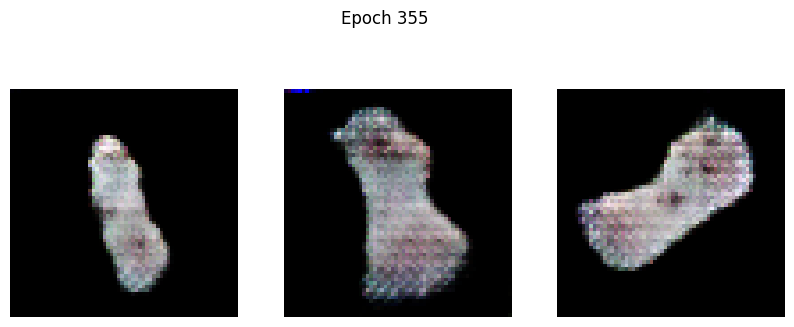

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 7.9768 - g_loss: 10.9106
Epoch 356/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 5.9683 - g_loss: 9.0080

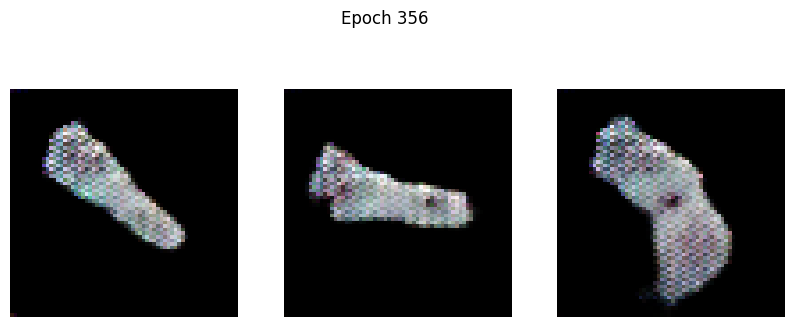

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 5.9712 - g_loss: 9.0174
Epoch 357/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 5.0481 - g_loss: 9.8122

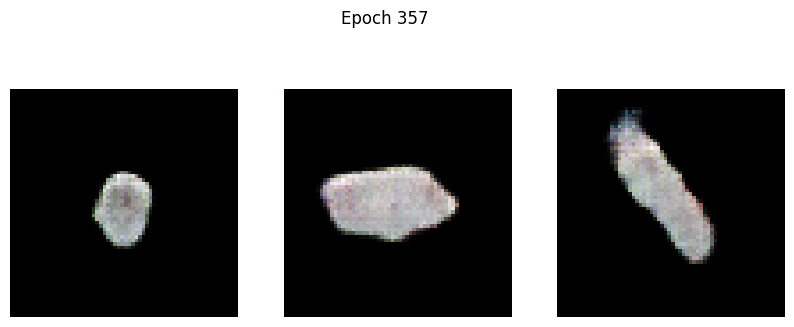

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 5.0527 - g_loss: 9.8145
Epoch 358/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 4.8762 - g_loss: 9.1009

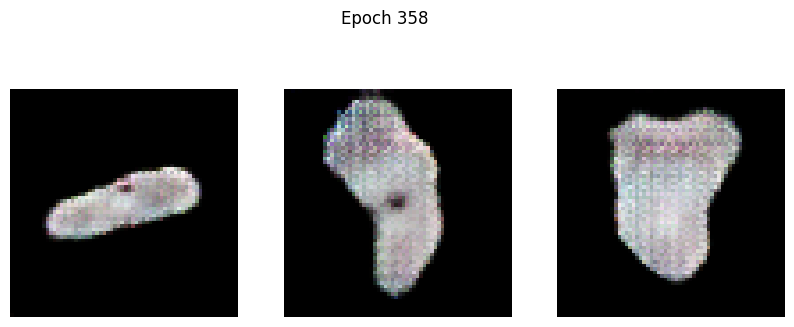

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 4.8790 - g_loss: 9.1034
Epoch 359/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 4.3414 - g_loss: 8.8912

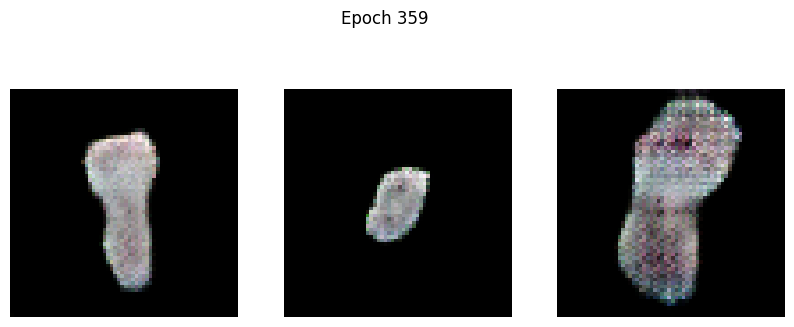

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 4.3385 - g_loss: 8.8933
Epoch 360/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 3.5387 - g_loss: 9.7614

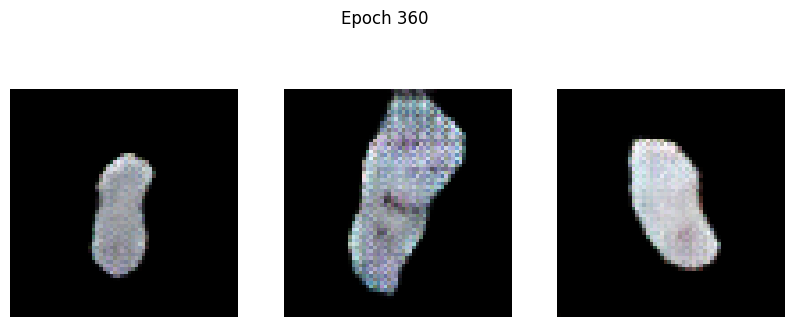

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 3.5381 - g_loss: 9.7590
Epoch 361/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 2.8079 - g_loss: 9.3019

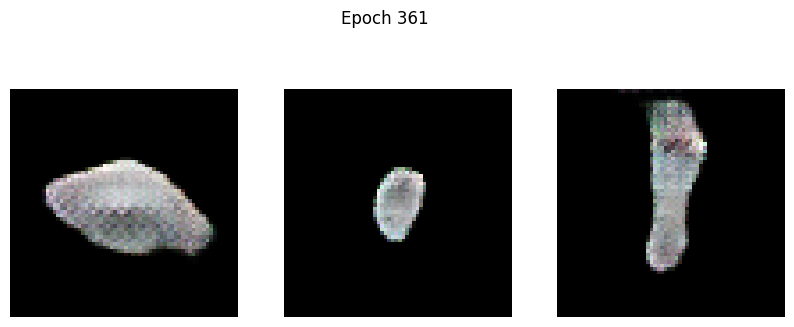

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 2.8114 - g_loss: 9.2987
Epoch 362/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 3.1715 - g_loss: 8.4283

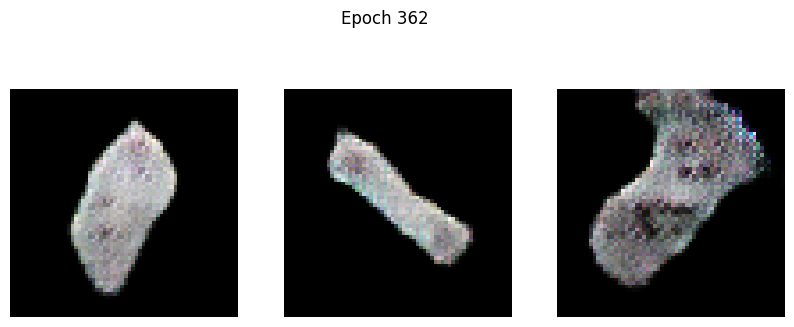

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 3.1696 - g_loss: 8.4287
Epoch 363/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 2.3472 - g_loss: 7.6122

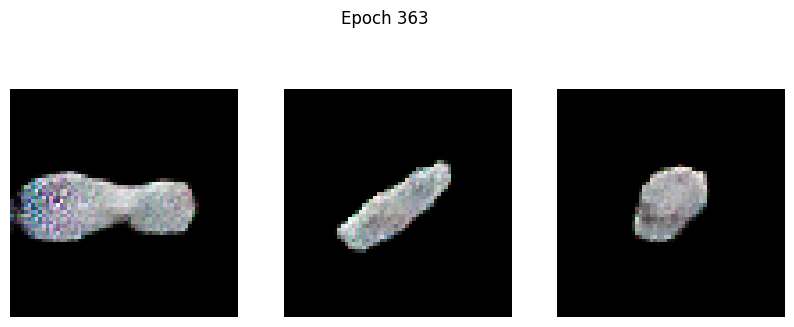

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 2.3476 - g_loss: 7.6138
Epoch 364/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 1.9659 - g_loss: 8.6452

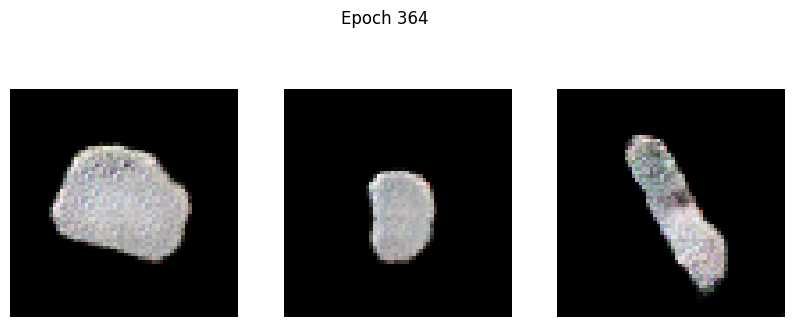

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 1.9637 - g_loss: 8.6414
Epoch 365/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 1.3164 - g_loss: 8.0213

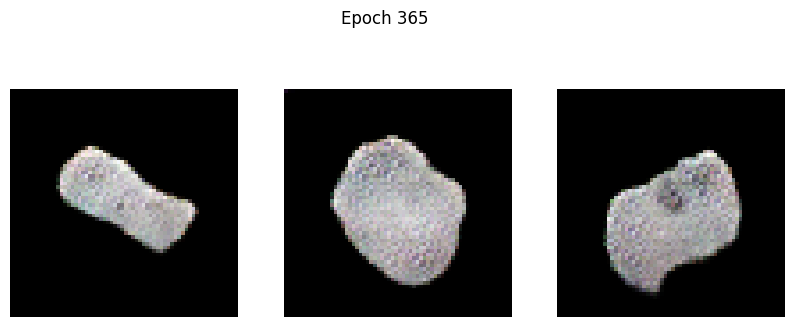

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 1.3107 - g_loss: 8.0218
Epoch 366/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.7230 - g_loss: 7.7716

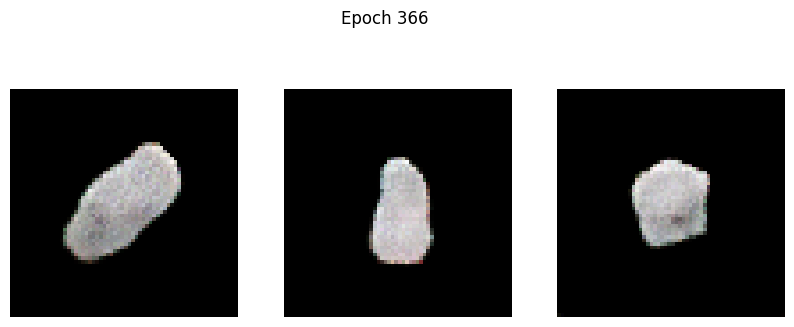

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.7195 - g_loss: 7.7730
Epoch 367/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1472 - g_loss: 8.1975

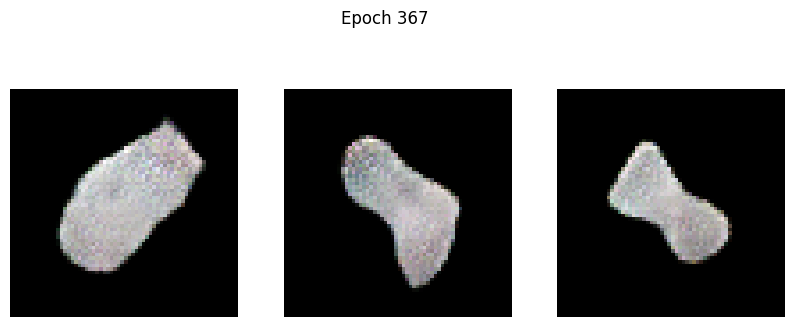

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1480 - g_loss: 8.1949
Epoch 368/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0329 - g_loss: 7.8169

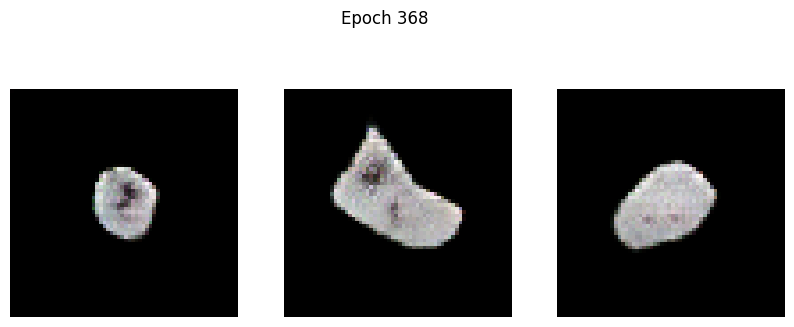

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0229 - g_loss: 7.8130
Epoch 369/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.0750 - g_loss: 7.4188

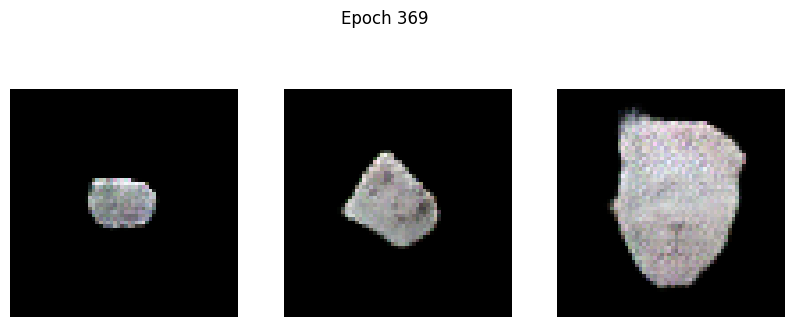

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.0733 - g_loss: 7.4178
Epoch 370/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.9537 - g_loss: 7.4422

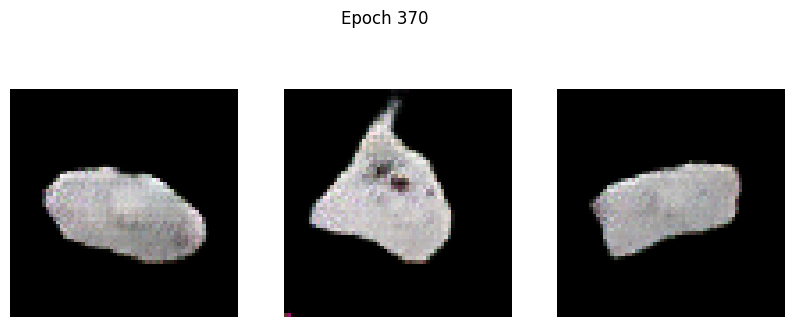

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.9563 - g_loss: 7.4406
Epoch 371/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.6651 - g_loss: 7.5584

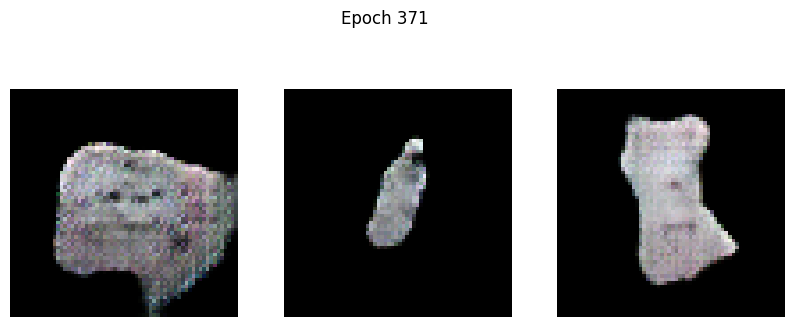

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.6621 - g_loss: 7.5537
Epoch 372/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.0670 - g_loss: 7.1945

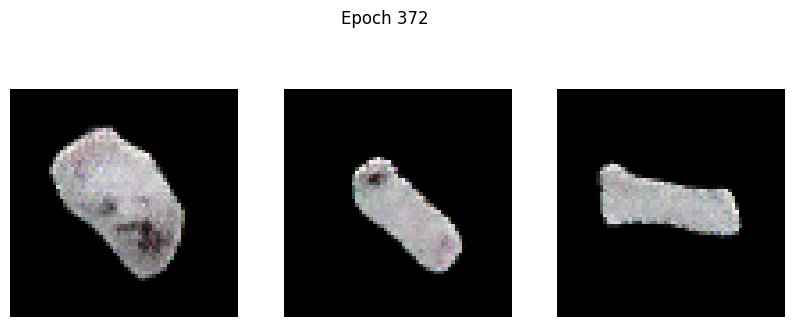

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.0663 - g_loss: 7.1931
Epoch 373/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.3039 - g_loss: 6.5383

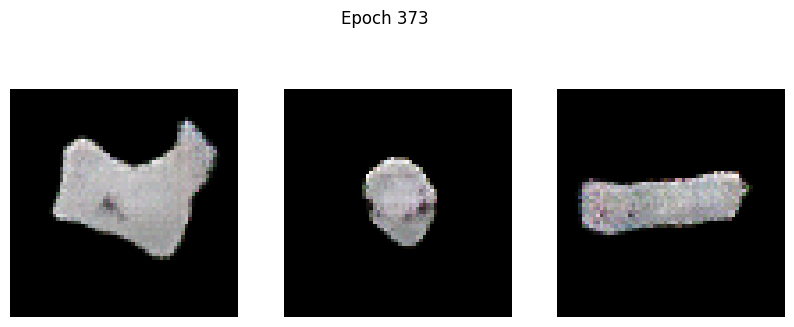

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.2981 - g_loss: 6.5373
Epoch 374/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.6779 - g_loss: 6.7606

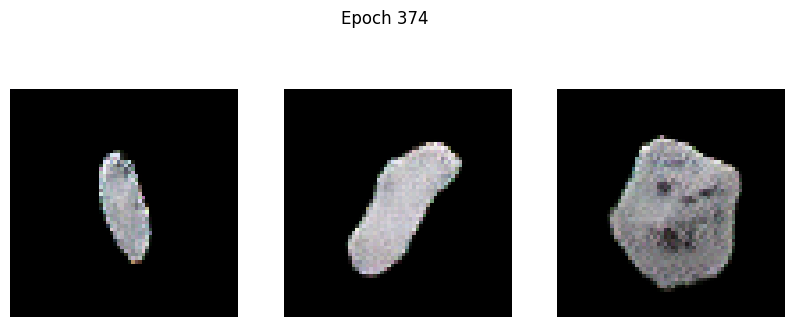

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.6831 - g_loss: 6.7615
Epoch 375/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.0489 - g_loss: 6.6796

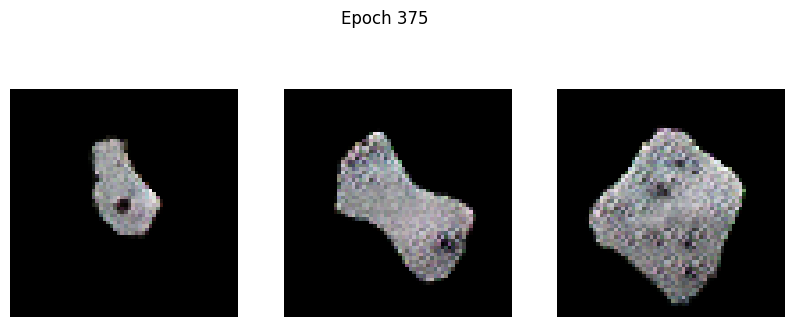

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.0439 - g_loss: 6.6777
Epoch 376/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.6528 - g_loss: 6.5856

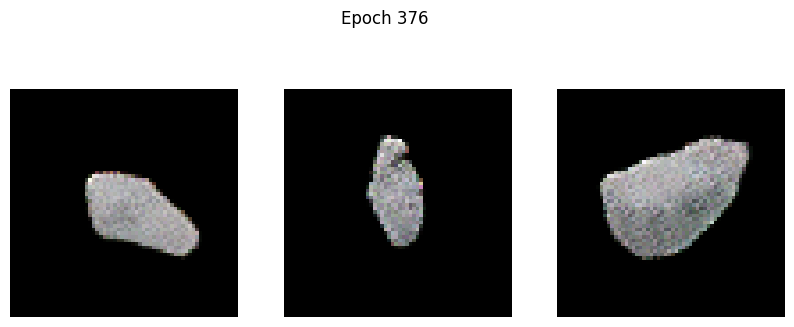

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.6480 - g_loss: 6.5847
Epoch 377/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.9908 - g_loss: 6.4128

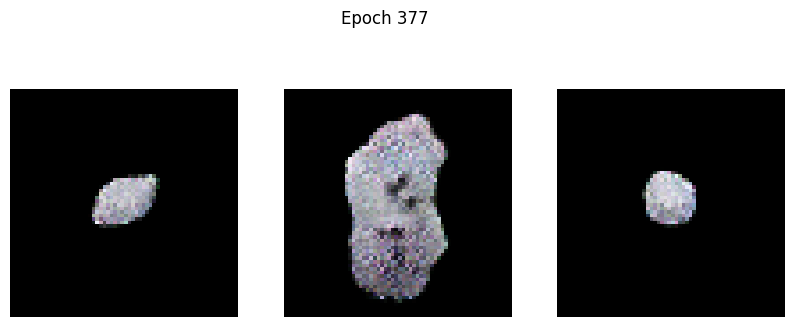

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -3.9930 - g_loss: 6.4122
Epoch 378/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.3059 - g_loss: 6.1440

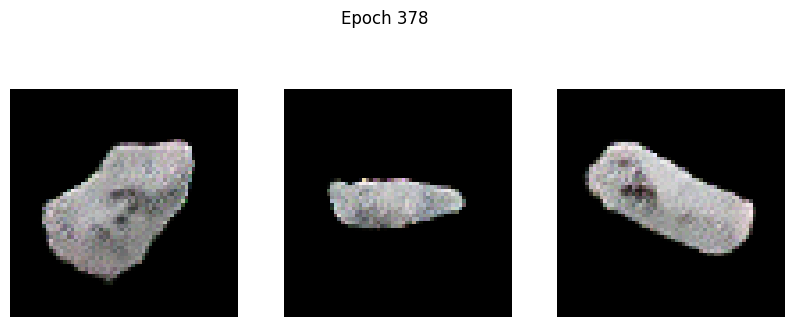

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.3090 - g_loss: 6.1423
Epoch 379/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.4082 - g_loss: 6.2732

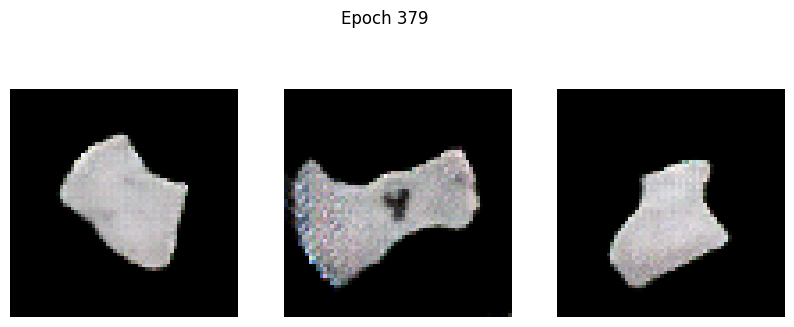

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.4004 - g_loss: 6.2728
Epoch 380/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.4061 - g_loss: 7.0959

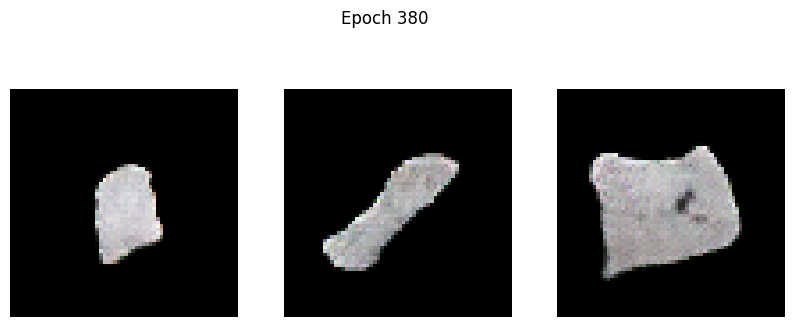

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.3978 - g_loss: 7.0955
Epoch 381/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -6.2659 - g_loss: 6.1374

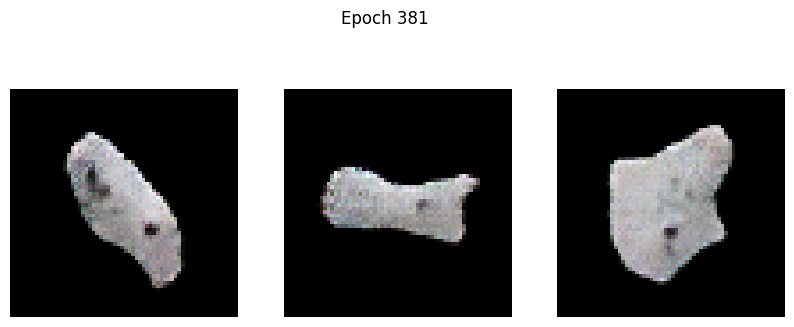

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -6.2669 - g_loss: 6.1356
Epoch 382/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -5.0501 - g_loss: 5.4922

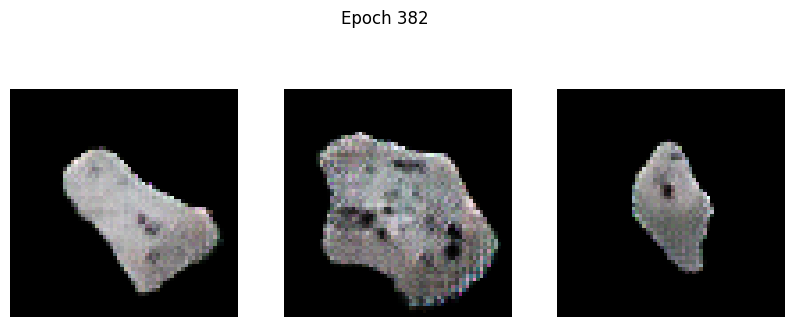

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -5.0610 - g_loss: 5.4928
Epoch 383/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -6.1646 - g_loss: 5.8839

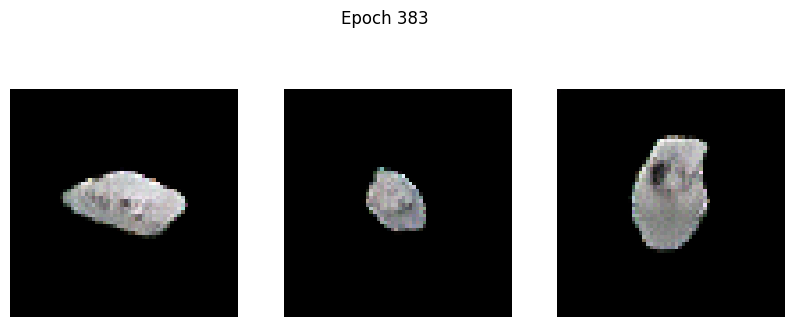

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.1649 - g_loss: 5.8811
Epoch 384/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.2451 - g_loss: 5.7156

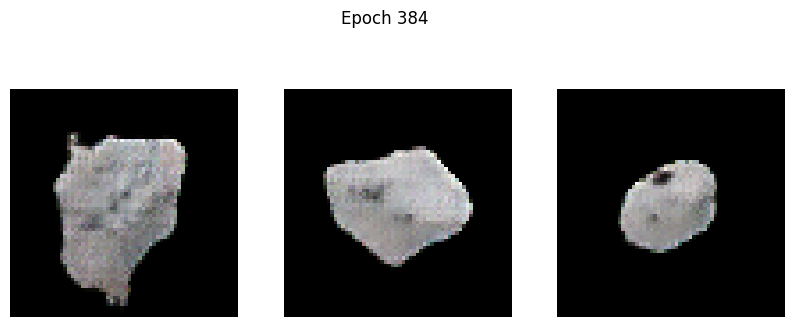

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.2421 - g_loss: 5.7163
Epoch 385/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.0912 - g_loss: 5.9848

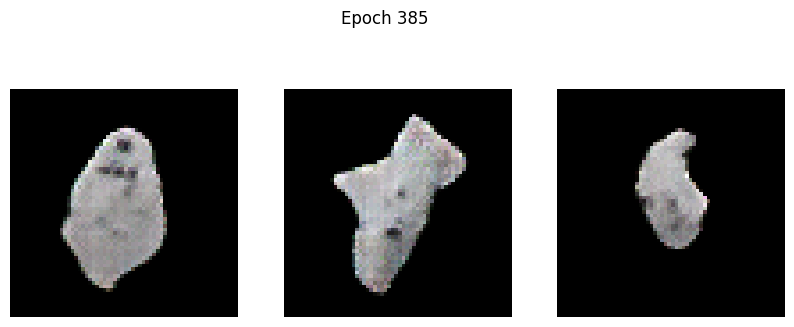

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.0819 - g_loss: 5.9837
Epoch 386/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.7952 - g_loss: 5.5707

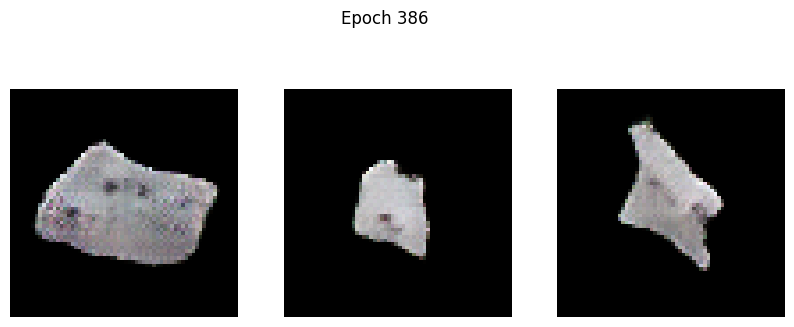

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.7829 - g_loss: 5.5697
Epoch 387/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.2773 - g_loss: 5.8443

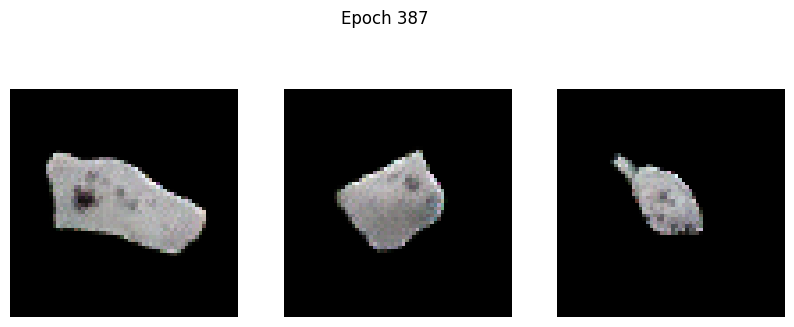

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.2839 - g_loss: 5.8421
Epoch 388/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -9.5716 - g_loss: 6.0362

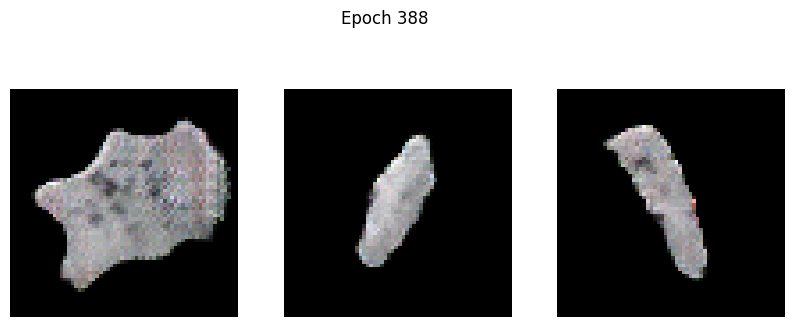

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -9.5672 - g_loss: 6.0330
Epoch 389/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.2997 - g_loss: 5.6610

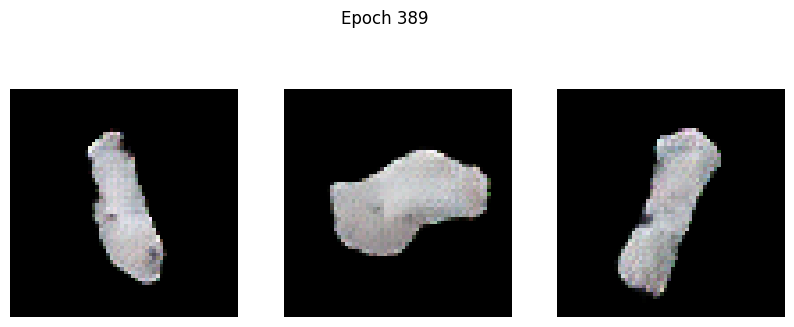

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.2974 - g_loss: 5.6598
Epoch 390/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.5133 - g_loss: 5.6063

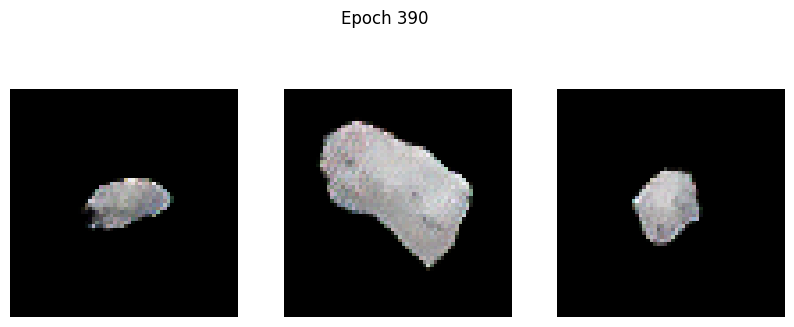

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.5036 - g_loss: 5.6052
Epoch 391/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.5756 - g_loss: 5.1853

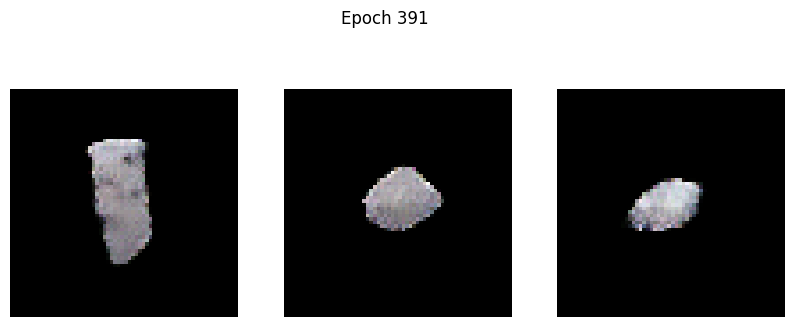

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.5742 - g_loss: 5.1886
Epoch 392/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -11.6223 - g_loss: 5.1710

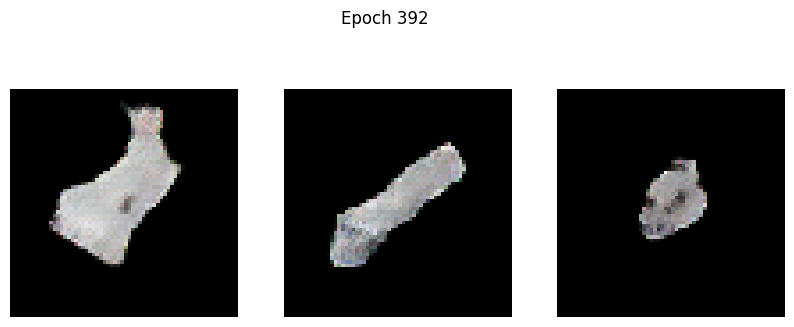

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -11.6323 - g_loss: 5.1720
Epoch 393/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -14.7819 - g_loss: 5.4056

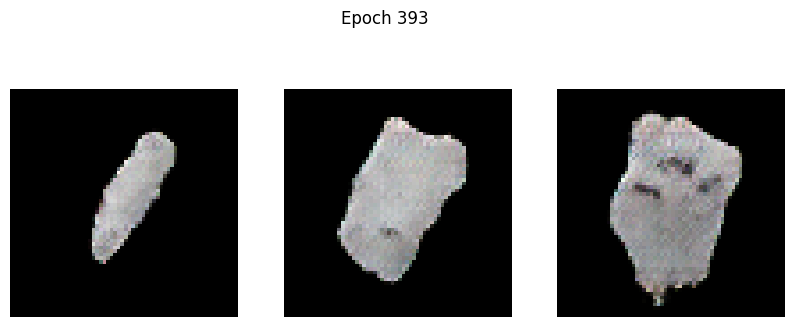

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -14.7649 - g_loss: 5.4078
Epoch 394/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.8666 - g_loss: 5.6259

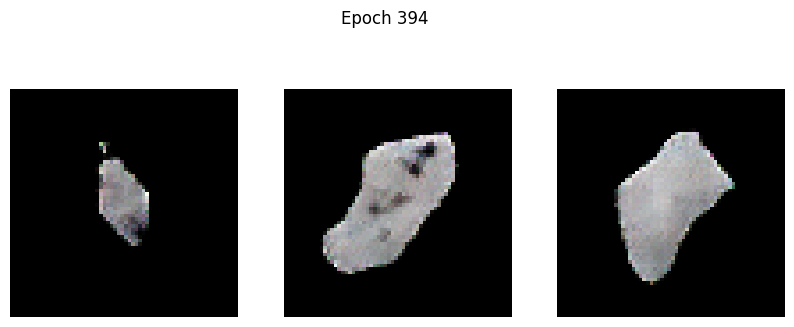

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -10.8997 - g_loss: 5.6255
Epoch 395/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -12.4894 - g_loss: 5.3890

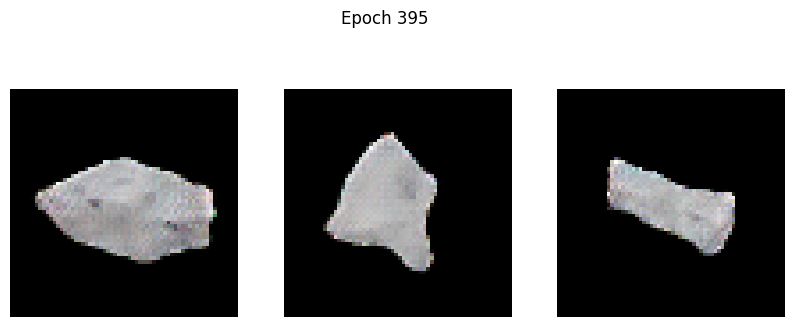

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -12.4932 - g_loss: 5.3904
Epoch 396/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.6656 - g_loss: 5.3961

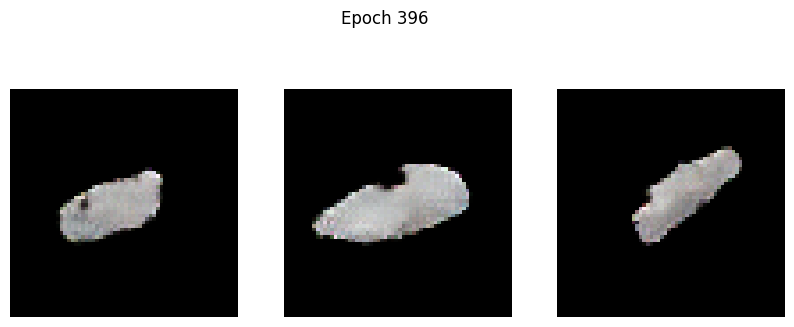

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.6745 - g_loss: 5.3975
Epoch 397/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.7444 - g_loss: 6.4055

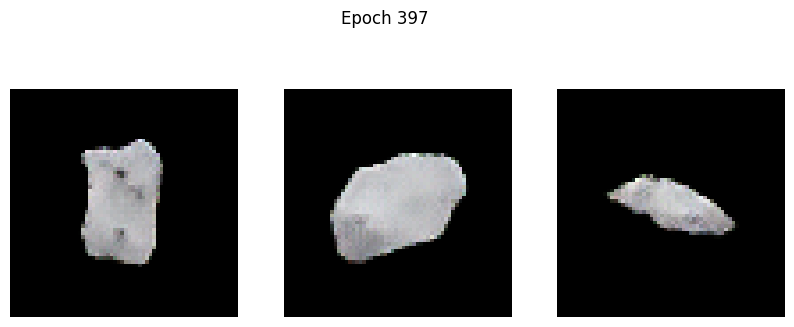

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.7459 - g_loss: 6.4079
Epoch 398/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -17.7180 - g_loss: 5.6577

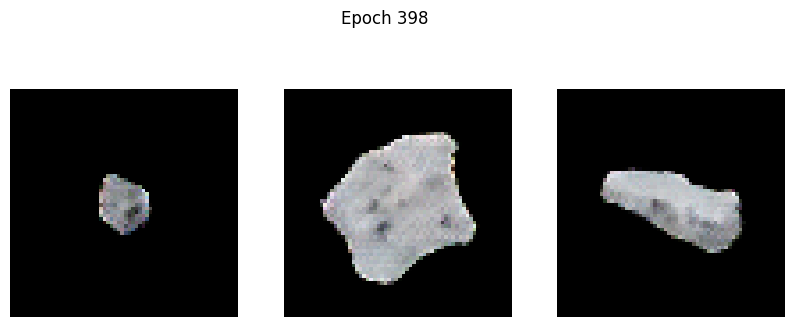

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -17.7166 - g_loss: 5.6593
Epoch 399/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -16.3014 - g_loss: 6.5797

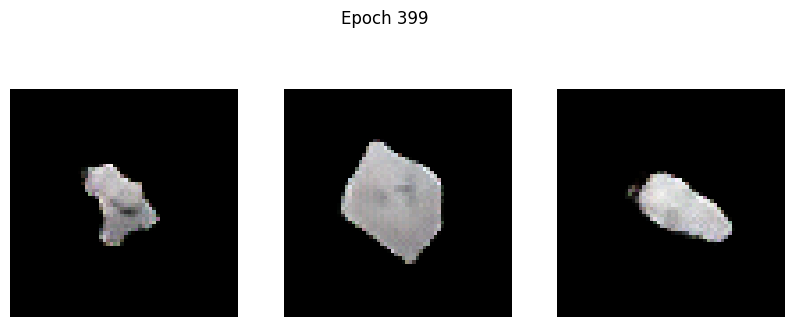

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -16.3123 - g_loss: 6.5761
Epoch 400/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.1254 - g_loss: 5.9938

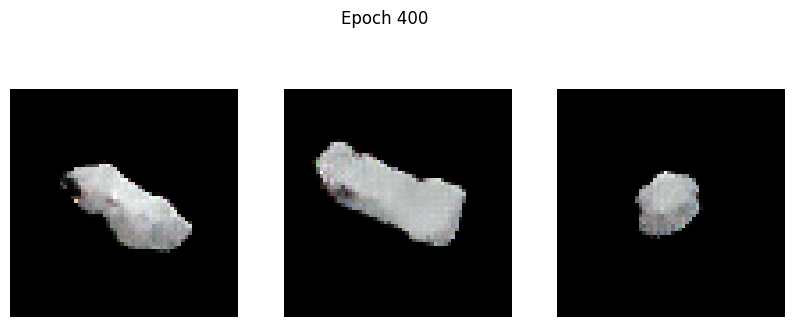

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.1489 - g_loss: 5.9952
Epoch 401/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.3082 - g_loss: 7.1164

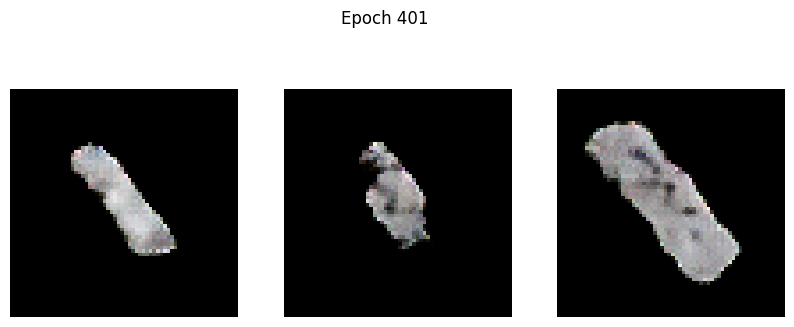

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.3127 - g_loss: 7.1146
Epoch 402/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -15.9282 - g_loss: 7.5798

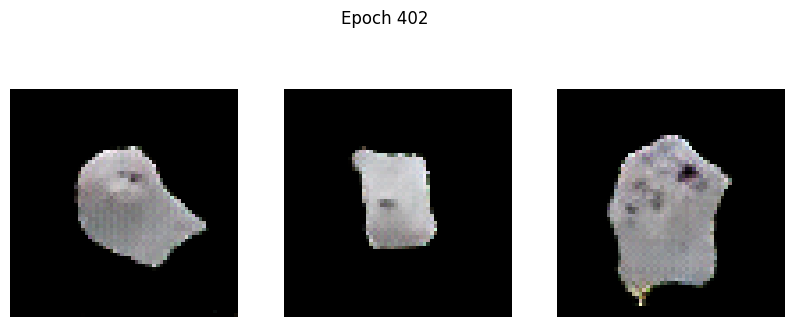

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -15.9250 - g_loss: 7.5814
Epoch 403/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -17.4371 - g_loss: 6.0700

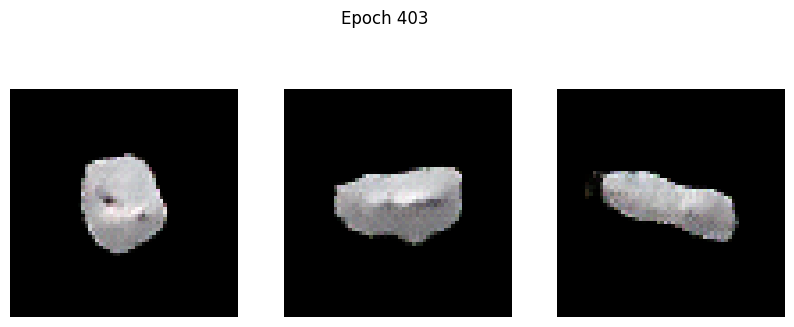

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -17.4546 - g_loss: 6.0662
Epoch 404/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -20.6185 - g_loss: 5.8702

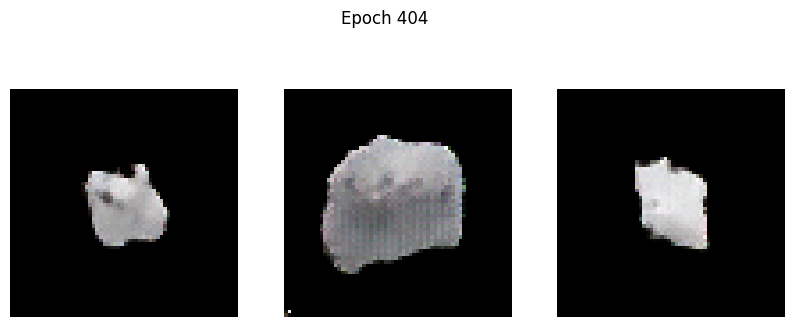

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -20.6237 - g_loss: 5.8716
Epoch 405/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -24.0997 - g_loss: 6.2864

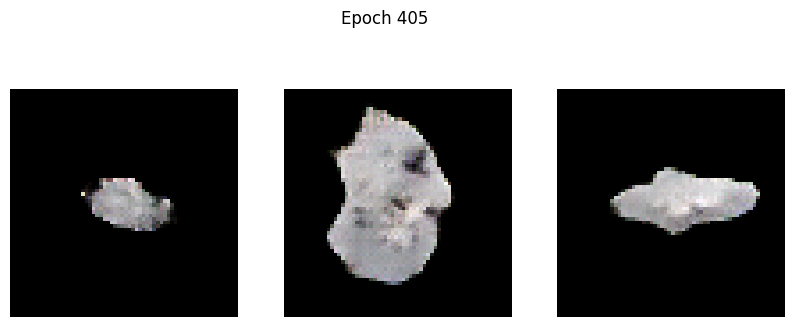

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -24.0739 - g_loss: 6.2874
Epoch 406/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -23.0718 - g_loss: 6.3181

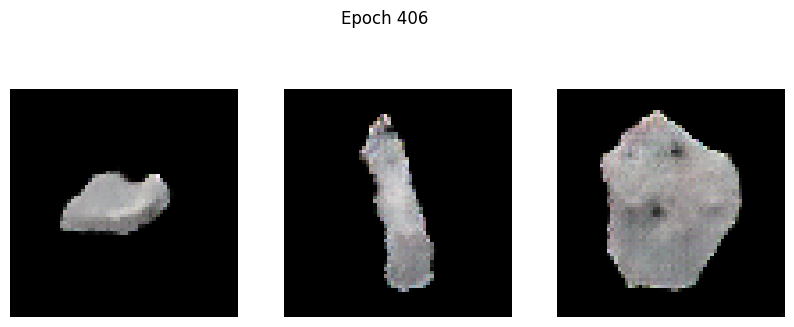

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -23.0462 - g_loss: 6.3183
Epoch 407/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -22.2668 - g_loss: 6.6514

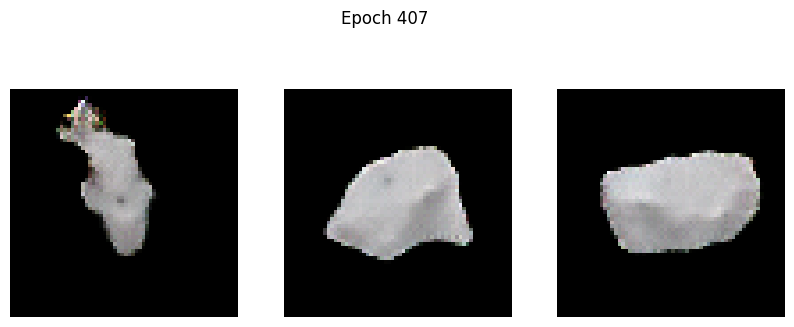

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -22.2748 - g_loss: 6.6533
Epoch 408/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -21.4759 - g_loss: 6.9084

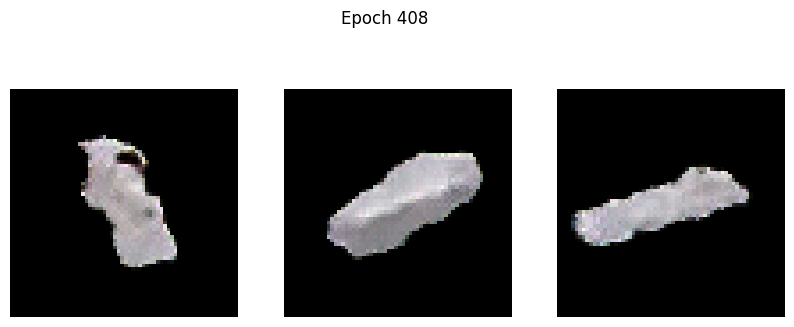

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -21.4716 - g_loss: 6.9129
Epoch 409/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -23.6505 - g_loss: 7.7387

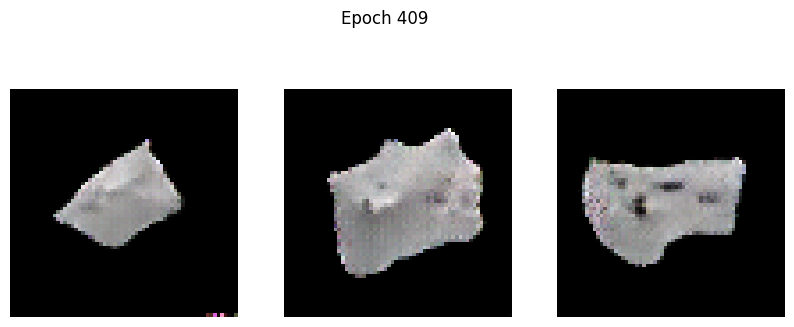

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -23.6468 - g_loss: 7.7345
Epoch 410/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -25.0828 - g_loss: 6.5316

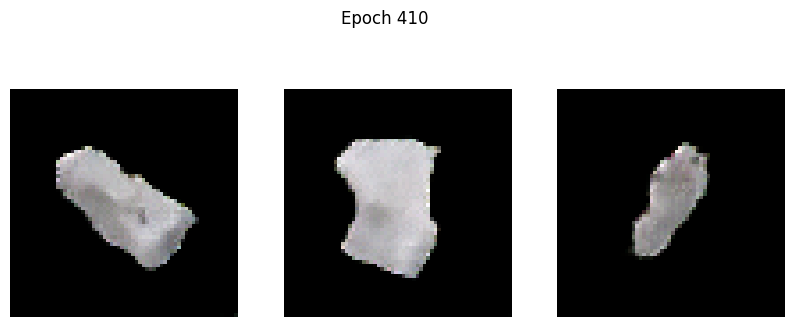

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -25.0637 - g_loss: 6.5356
Epoch 411/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -23.0468 - g_loss: 7.5098

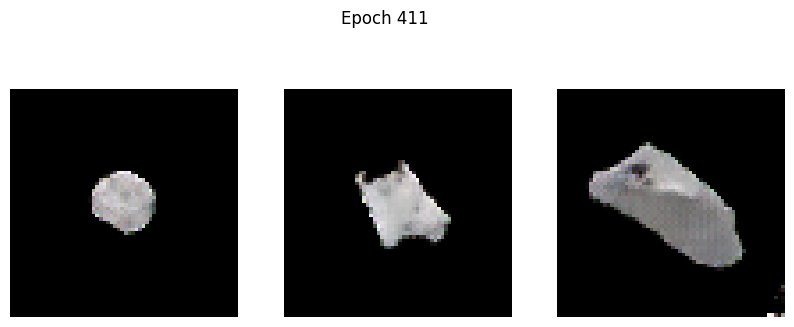

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -23.0686 - g_loss: 7.5077
Epoch 412/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -26.6372 - g_loss: 7.5253

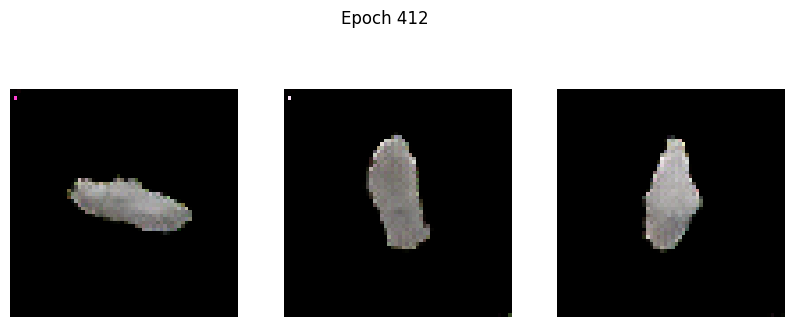

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -26.5475 - g_loss: 7.5334
Epoch 413/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.4943 - g_loss: 12.0437

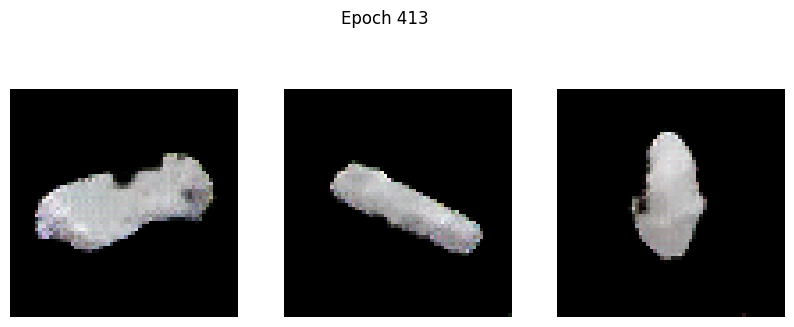

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.6258 - g_loss: 12.0120
Epoch 414/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -31.2394 - g_loss: 5.4023

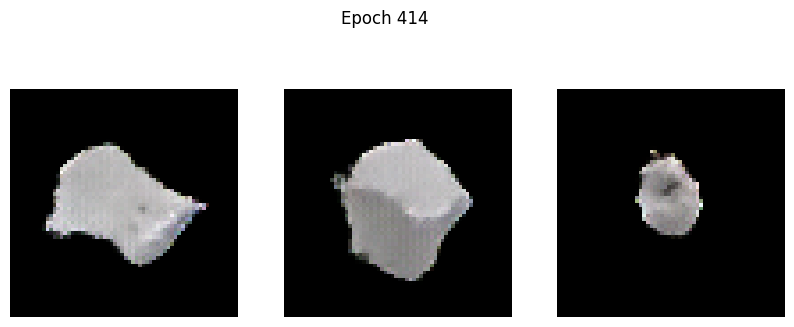

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -31.2502 - g_loss: 5.4026
Epoch 415/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -30.9943 - g_loss: 6.1924

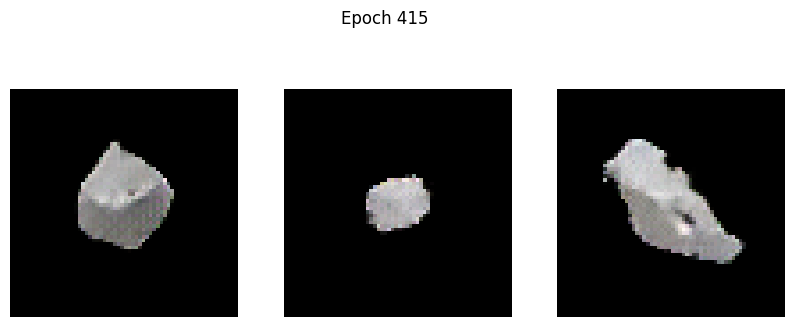

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -31.0110 - g_loss: 6.1922
Epoch 416/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -24.7000 - g_loss: 6.4312

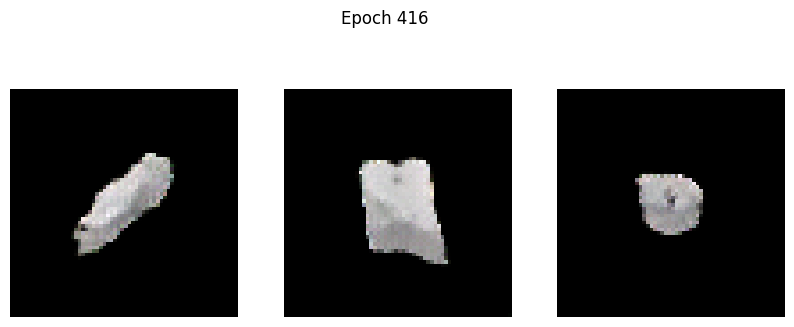

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -24.7317 - g_loss: 6.4323
Epoch 417/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -38.8894 - g_loss: 6.4091

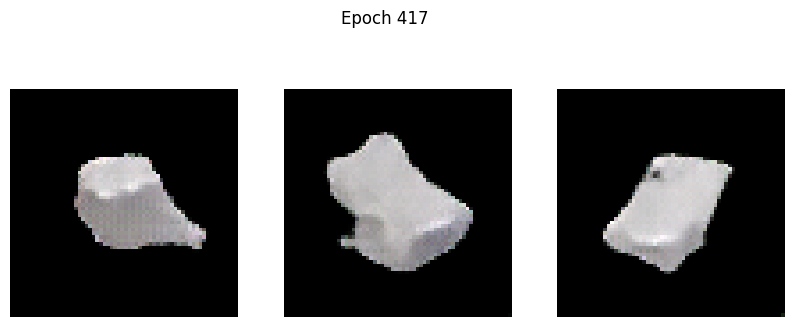

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -38.8404 - g_loss: 6.4085
Epoch 418/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -35.4614 - g_loss: 7.0884

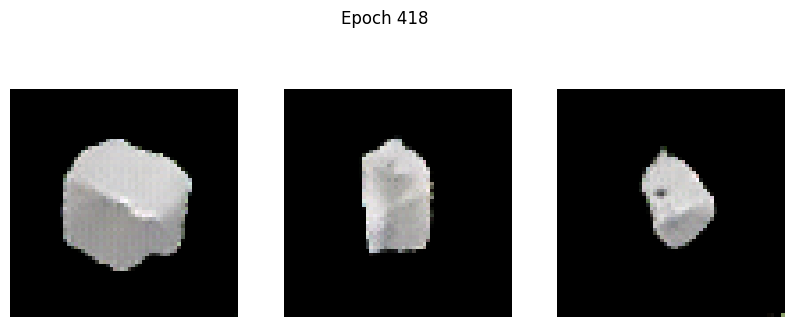

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -35.3962 - g_loss: 7.0910
Epoch 419/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -32.8380 - g_loss: 6.1609

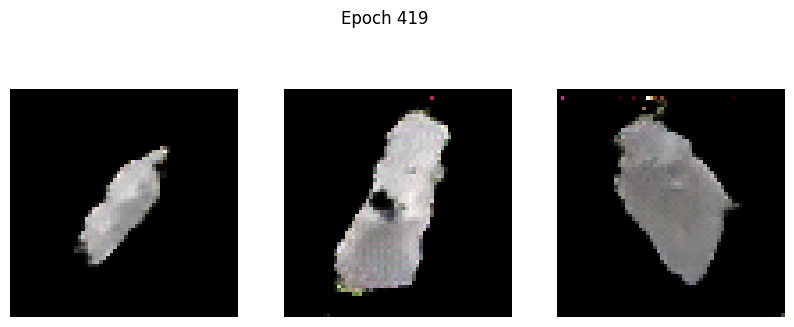

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -32.8317 - g_loss: 6.1623
Epoch 420/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 2930.7471 - g_loss: 753.6240

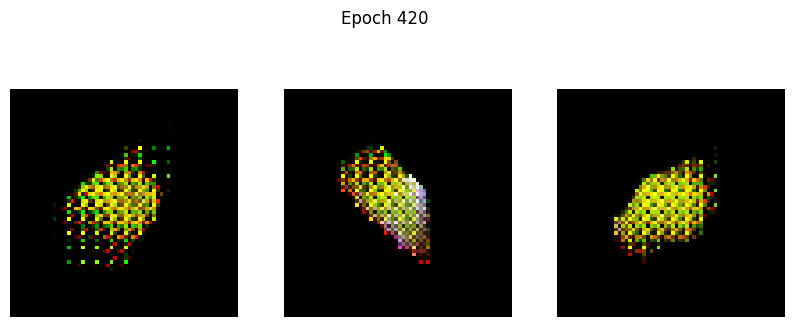

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 2922.4636 - g_loss: 754.6196
Epoch 421/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 169.2218 - g_loss: 236.2374

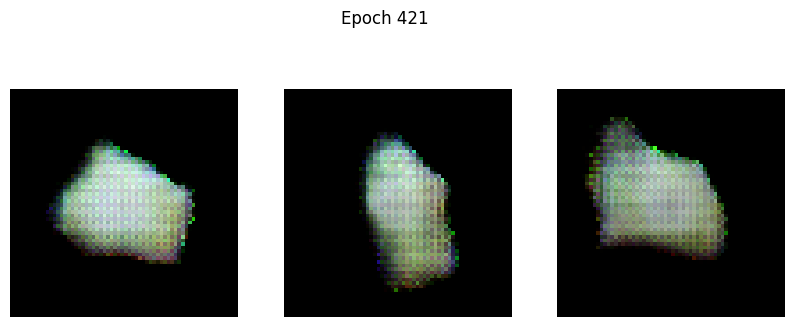

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 169.6575 - g_loss: 234.7438
Epoch 422/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 152.4035 - g_loss: 84.2549

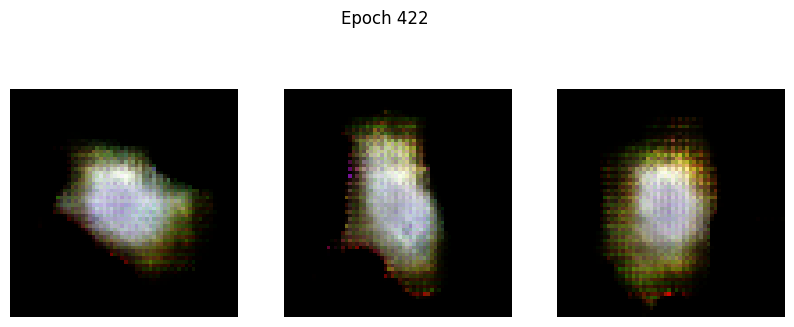

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 152.0744 - g_loss: 84.8520
Epoch 423/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 102.9168 - g_loss: 73.7239

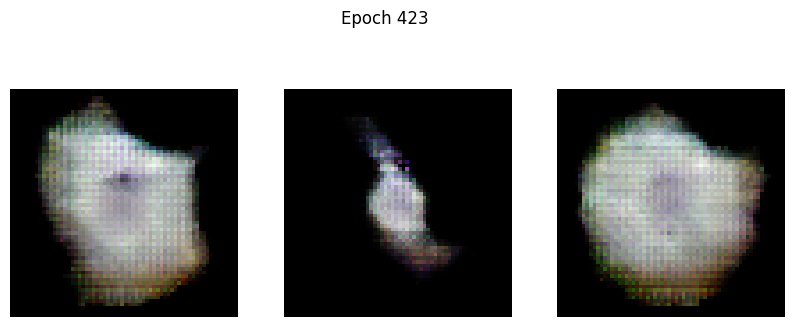

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 102.8047 - g_loss: 73.5696
Epoch 424/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 77.8537 - g_loss: 48.5199

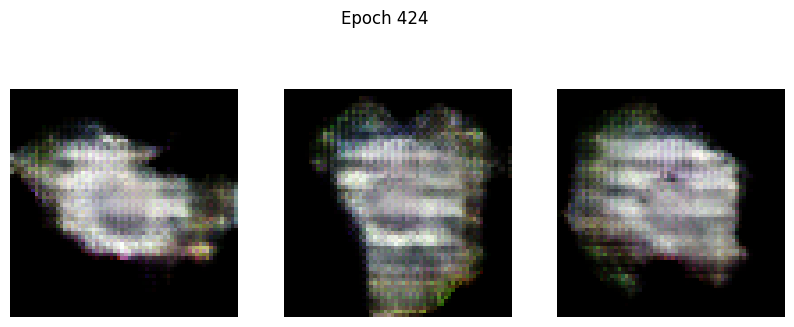

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 77.8436 - g_loss: 48.4967
Epoch 425/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 51.0314 - g_loss: 33.5218

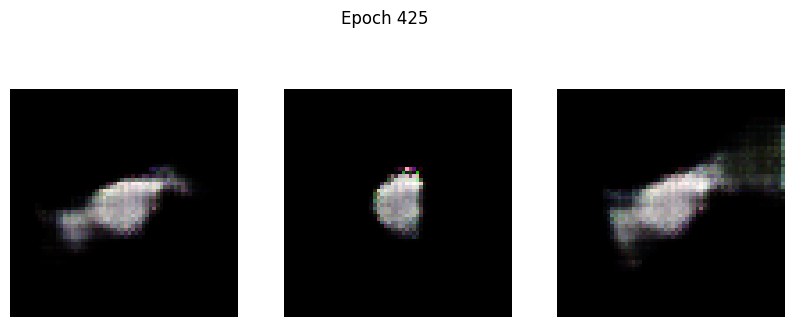

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 51.0431 - g_loss: 33.5682
Epoch 426/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 56.2346 - g_loss: 41.9735

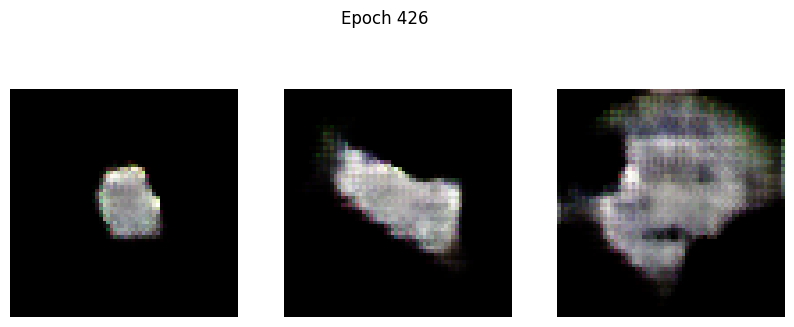

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 56.1747 - g_loss: 41.9614
Epoch 427/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 36.9451 - g_loss: 36.9268

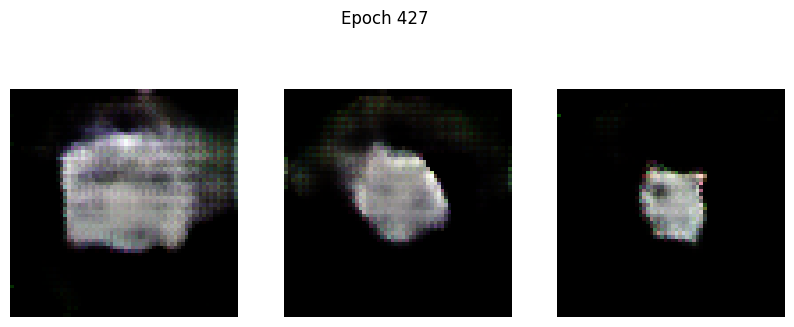

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 36.9064 - g_loss: 36.9146
Epoch 428/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 33.0989 - g_loss: 38.1498

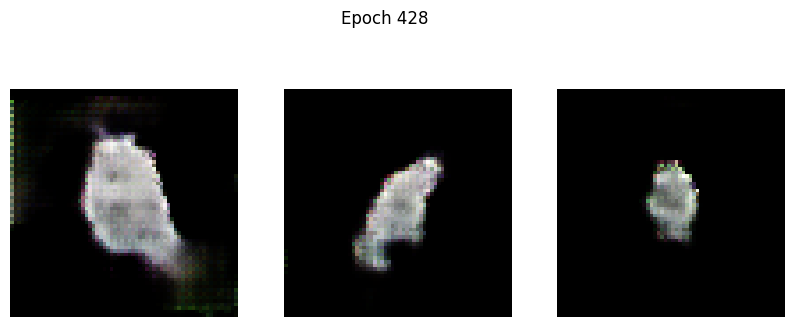

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 33.0716 - g_loss: 38.1213
Epoch 429/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 24.3527 - g_loss: 26.3029

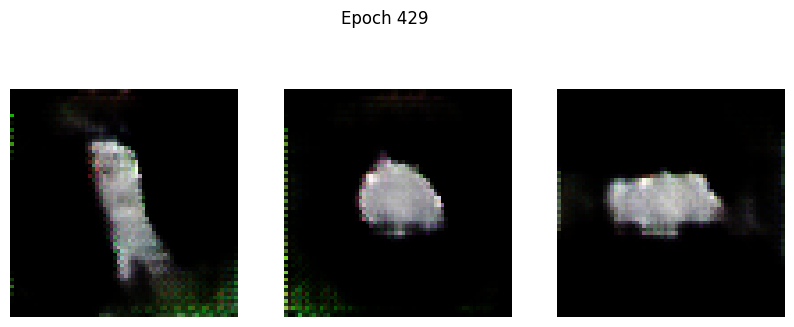

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 24.3866 - g_loss: 26.3364
Epoch 430/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 21.6774 - g_loss: 27.2131

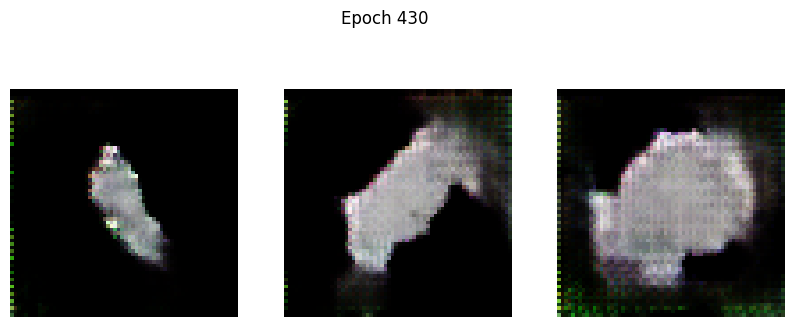

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 21.7220 - g_loss: 27.2452
Epoch 431/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 19.4328 - g_loss: 22.7605

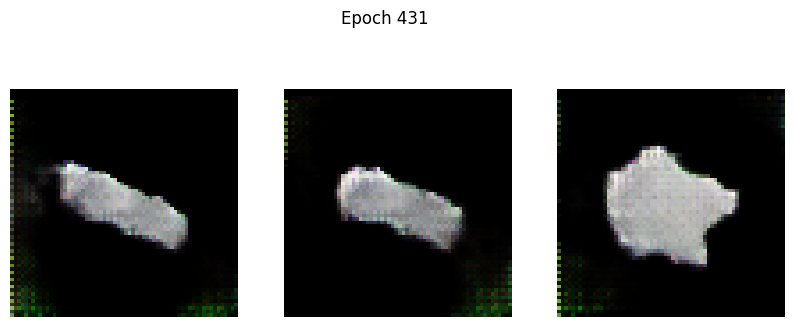

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 19.4278 - g_loss: 22.7606
Epoch 432/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 17.1300 - g_loss: 20.9218

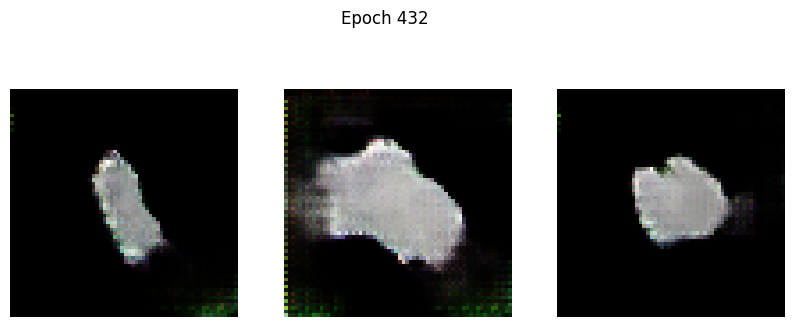

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 17.1289 - g_loss: 20.9234
Epoch 433/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 15.4115 - g_loss: 19.6574

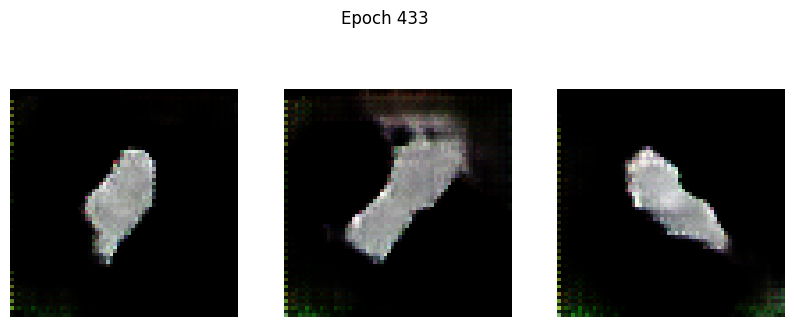

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 15.4209 - g_loss: 19.6699
Epoch 434/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 15.8556 - g_loss: 21.0530

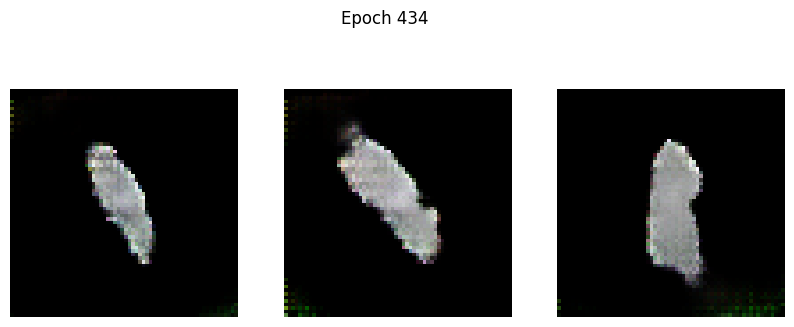

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 15.8528 - g_loss: 21.0467
Epoch 435/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 12.4151 - g_loss: 15.3712

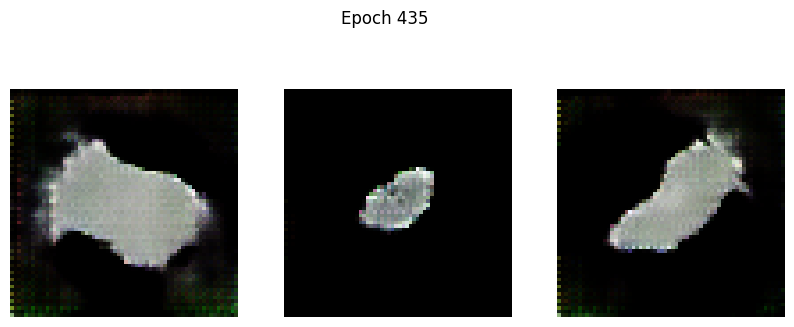

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 12.4105 - g_loss: 15.3708
Epoch 436/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 9.9212 - g_loss: 13.6527

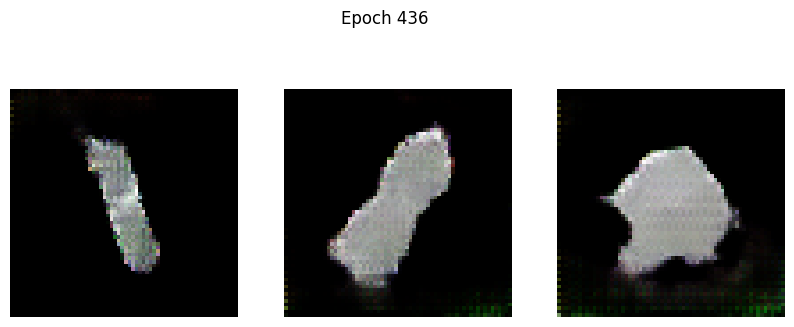

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 9.9236 - g_loss: 13.6536
Epoch 437/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 14.2241 - g_loss: 19.7219

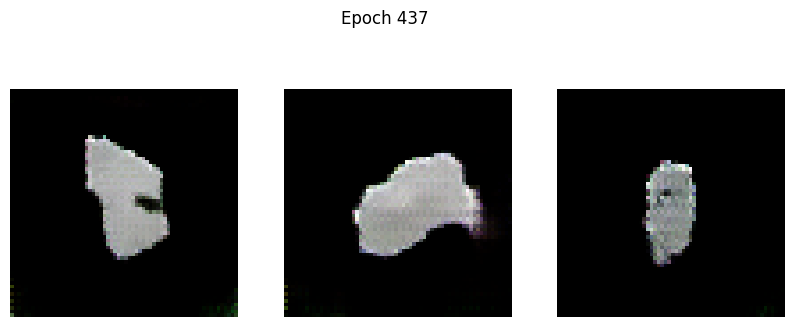

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 14.1929 - g_loss: 19.6777
Epoch 438/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 12.1562 - g_loss: 15.8032

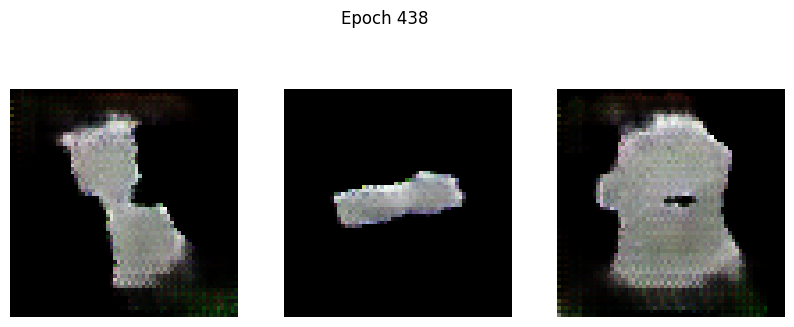

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 12.1360 - g_loss: 15.7972
Epoch 439/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 9.2372 - g_loss: 18.6572

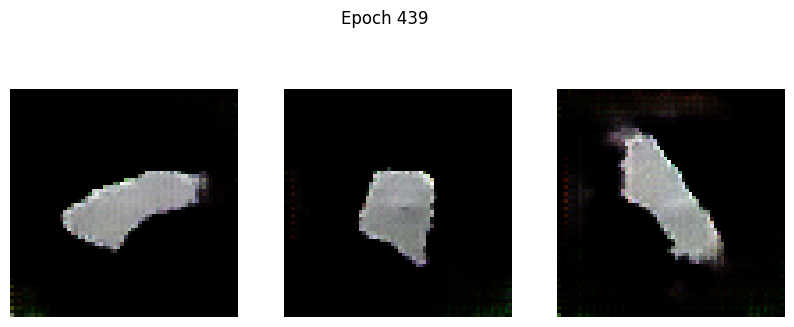

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 9.2186 - g_loss: 18.6092
Epoch 440/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 6.9045 - g_loss: 12.6405

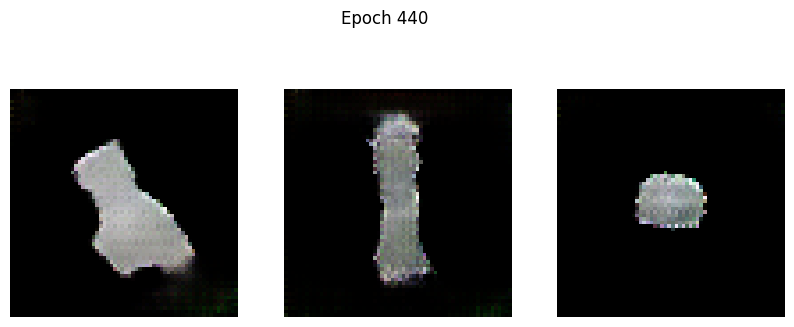

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 6.8978 - g_loss: 12.6385
Epoch 441/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 4.6211 - g_loss: 14.4799

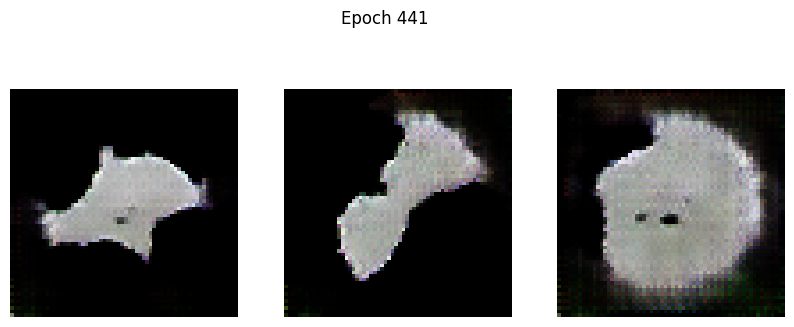

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 4.6282 - g_loss: 14.4747
Epoch 442/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 1.6852 - g_loss: 12.6113

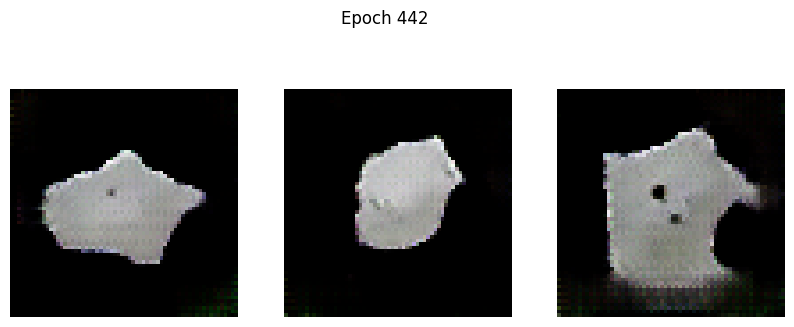

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 1.6941 - g_loss: 12.6101
Epoch 443/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 1.8479 - g_loss: 10.3786

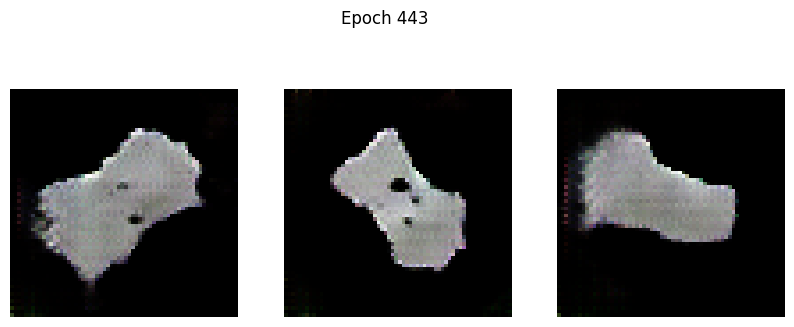

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 1.8489 - g_loss: 10.3825
Epoch 444/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 3.6465 - g_loss: 11.0005

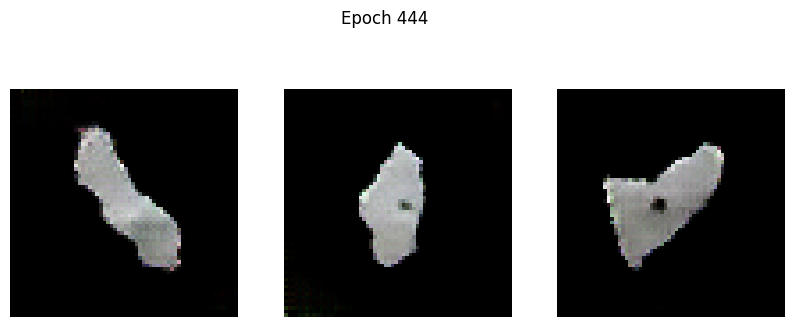

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 3.6203 - g_loss: 10.9991
Epoch 445/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 1.0762 - g_loss: 11.0723

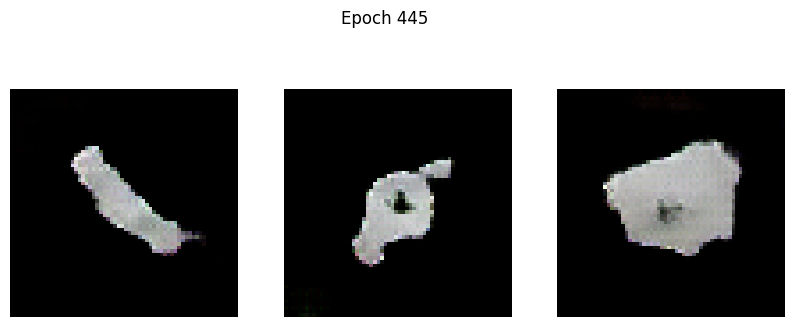

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: 1.0697 - g_loss: 11.0755
Epoch 446/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -2.2216 - g_loss: 11.4724

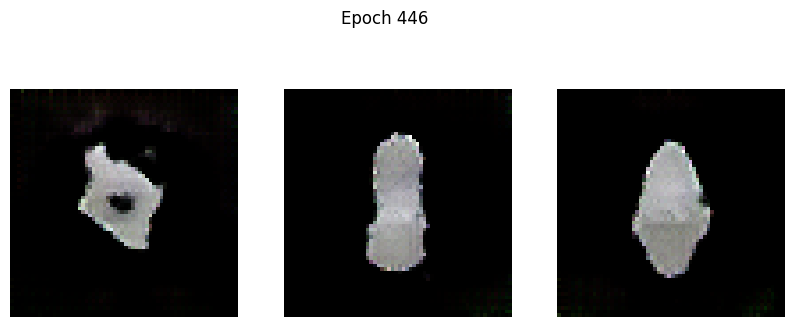

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -2.2162 - g_loss: 11.4701
Epoch 447/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -1.5443 - g_loss: 10.3260

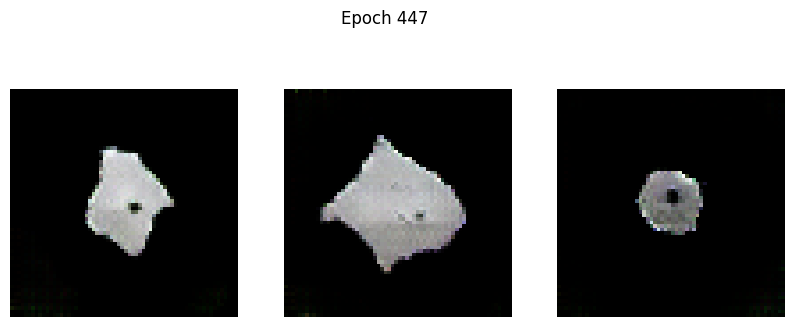

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -1.5405 - g_loss: 10.3237
Epoch 448/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -5.2968 - g_loss: 12.1071

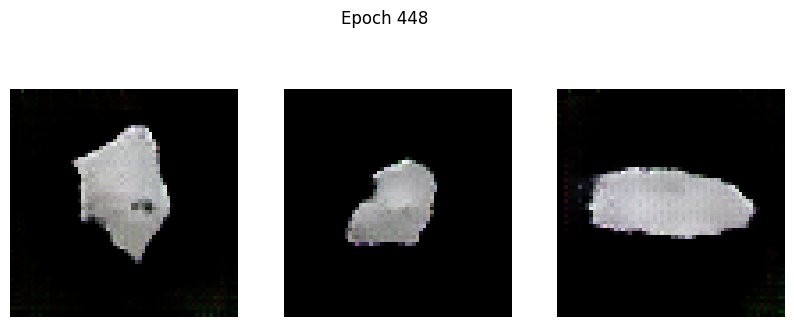

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -5.2842 - g_loss: 12.0988
Epoch 449/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -4.0856 - g_loss: 10.3257

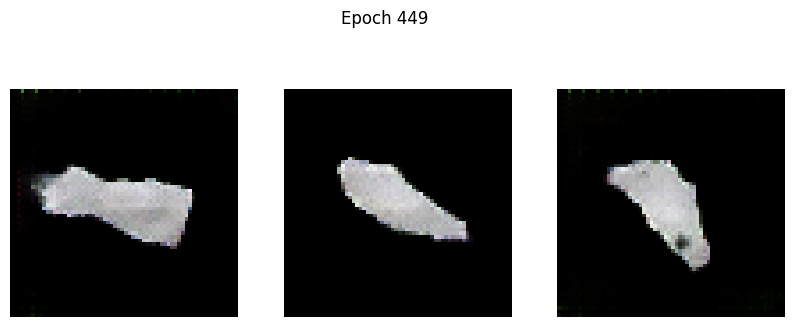

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -4.0821 - g_loss: 10.3259
Epoch 450/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -3.5895 - g_loss: 11.0369

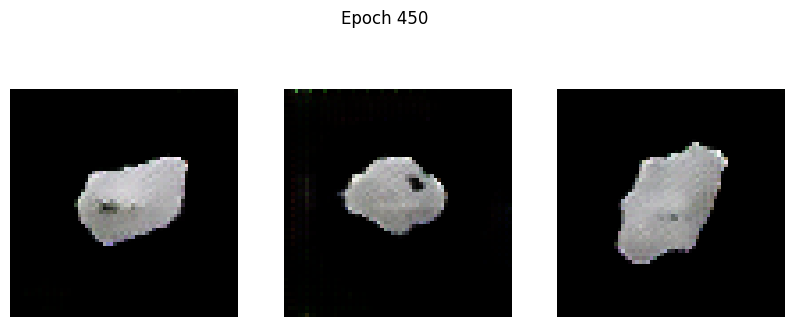

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -3.6045 - g_loss: 11.0303
Epoch 451/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -3.3760 - g_loss: 10.8574

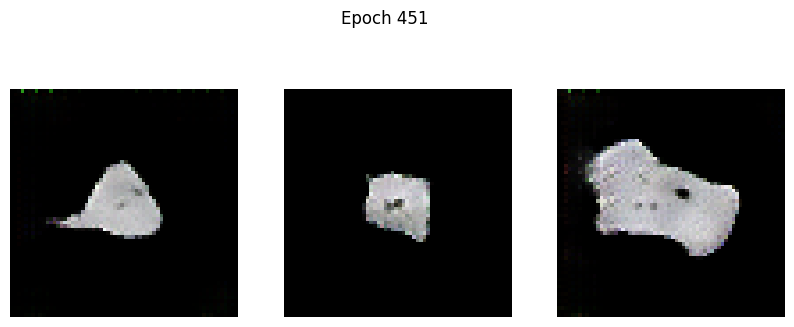

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -3.3812 - g_loss: 10.8519
Epoch 452/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -4.3939 - g_loss: 9.6203

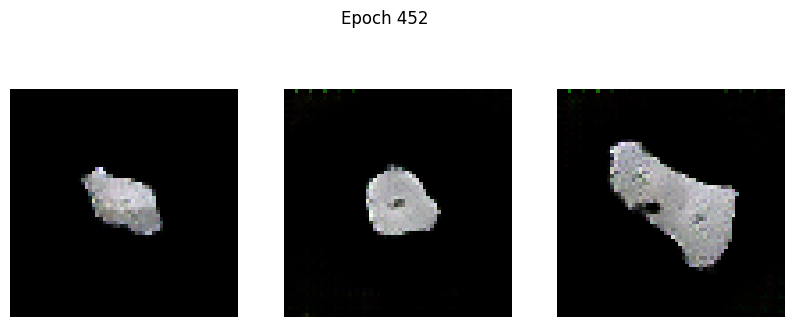

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -4.4049 - g_loss: 9.6186
Epoch 453/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -8.7408 - g_loss: 9.8702

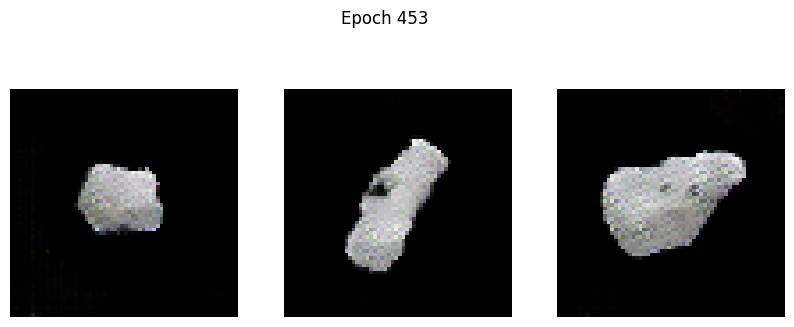

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -8.7327 - g_loss: 9.8690
Epoch 454/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -7.1328 - g_loss: 9.9986

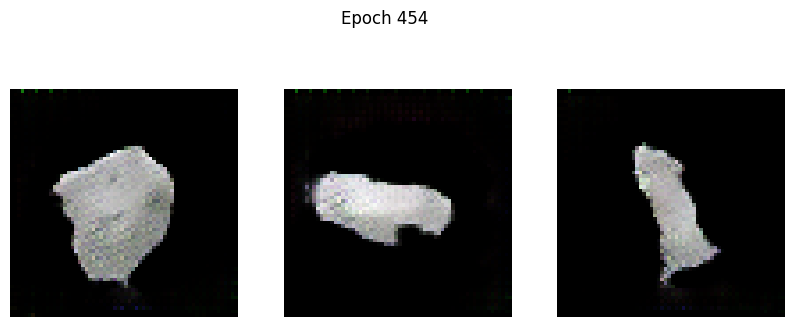

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -7.1460 - g_loss: 9.9984
Epoch 455/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -7.8724 - g_loss: 10.2114

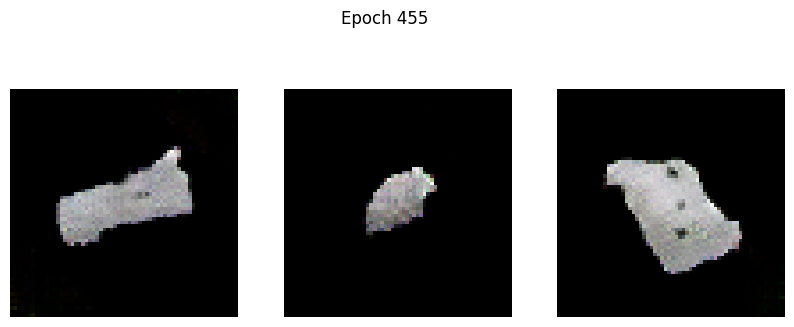

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -7.8682 - g_loss: 10.2065
Epoch 456/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -9.7575 - g_loss: 9.6419

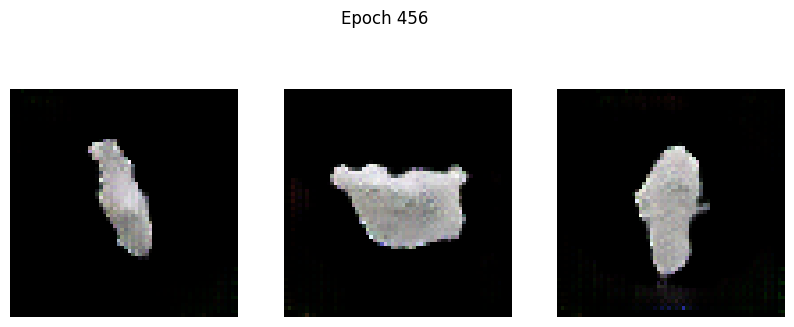

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -9.7662 - g_loss: 9.6376
Epoch 457/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -10.0334 - g_loss: 9.2275

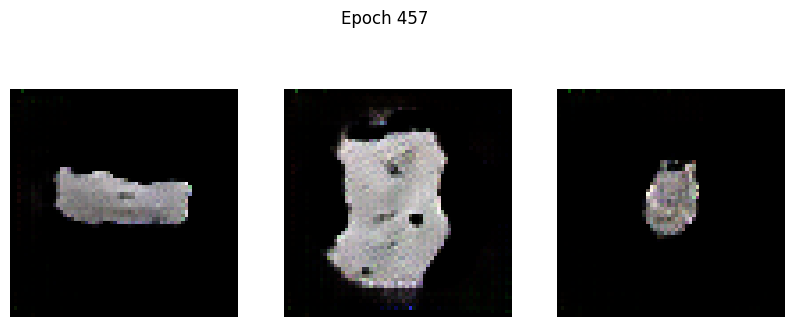

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -10.0445 - g_loss: 9.2247
Epoch 458/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -12.8645 - g_loss: 8.4586

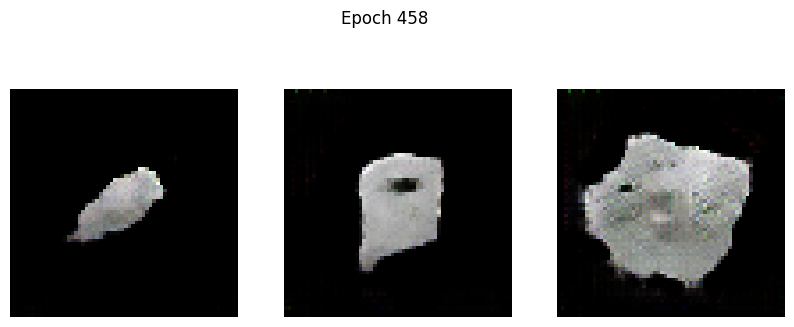

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -12.8454 - g_loss: 8.4582
Epoch 459/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -12.5957 - g_loss: 8.6151

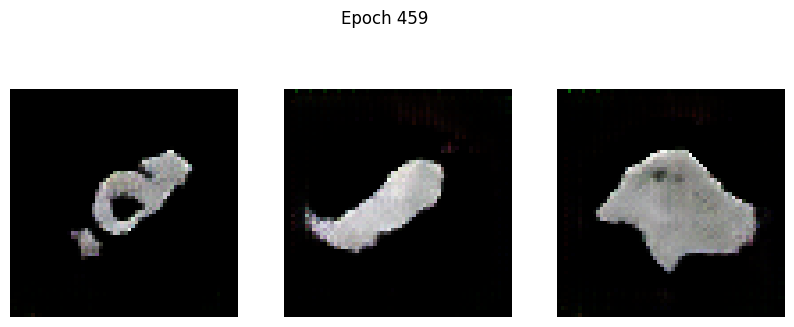

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -12.5923 - g_loss: 8.6117
Epoch 460/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -9.9672 - g_loss: 7.9183

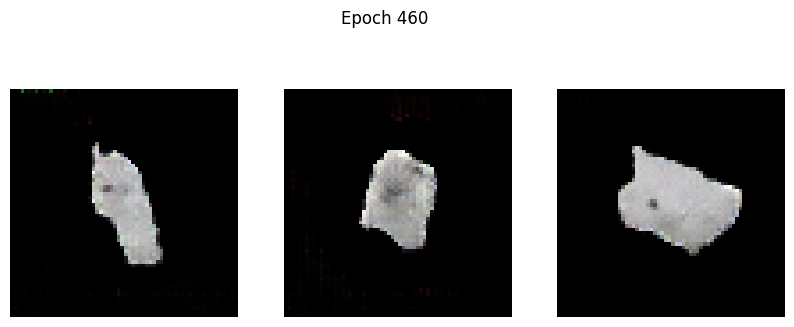

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -9.9895 - g_loss: 7.9178
Epoch 461/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -13.7120 - g_loss: 7.5583

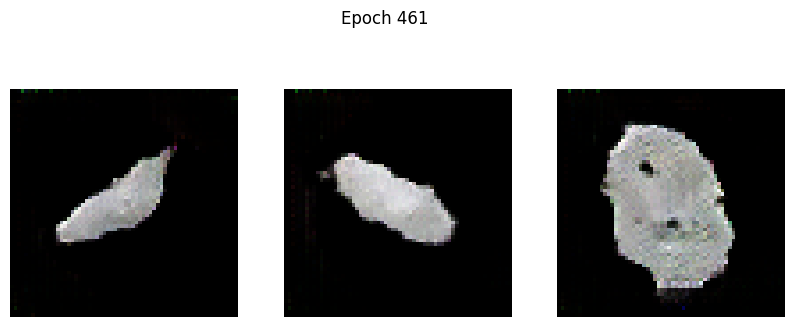

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -13.7070 - g_loss: 7.5570
Epoch 462/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -12.5700 - g_loss: 7.7645

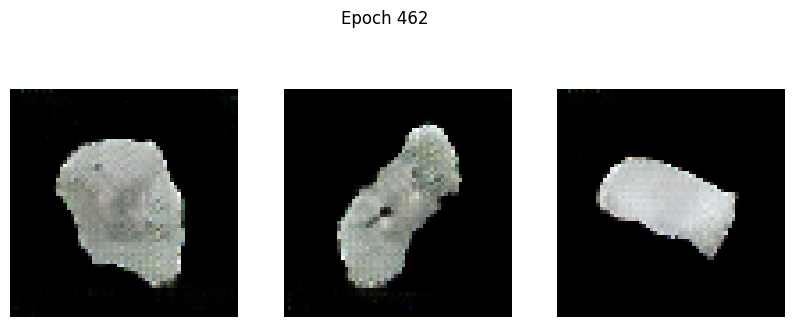

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -12.5999 - g_loss: 7.7604
Epoch 463/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -13.7740 - g_loss: 7.3934

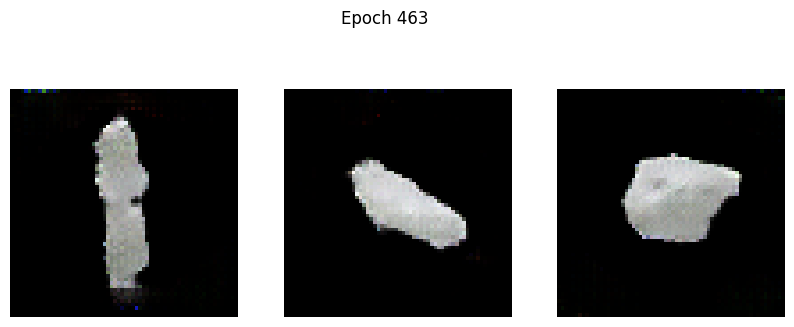

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -13.7919 - g_loss: 7.3919
Epoch 464/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -15.0599 - g_loss: 7.2499

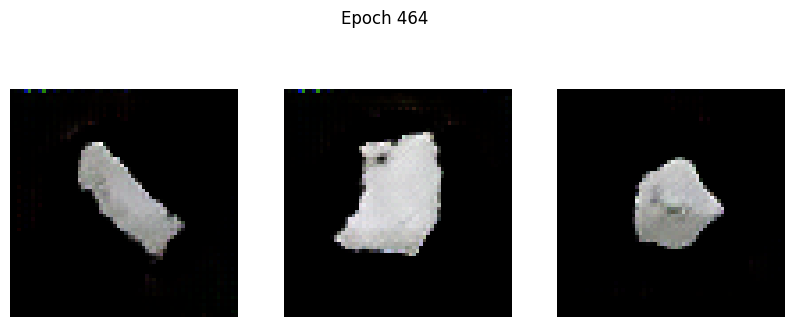

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -15.0899 - g_loss: 7.2469
Epoch 465/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -14.6751 - g_loss: 6.7966

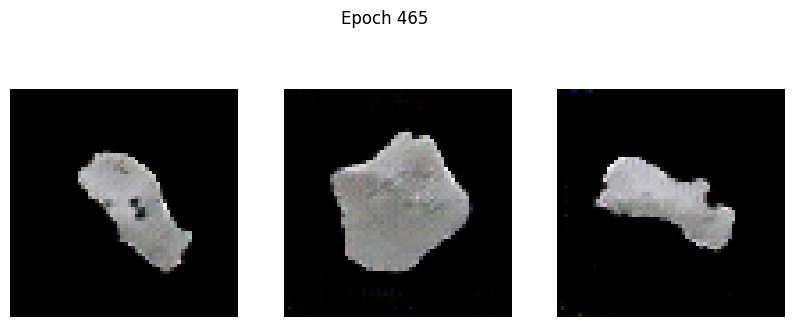

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -14.7156 - g_loss: 6.7971
Epoch 466/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -20.1303 - g_loss: 6.3711

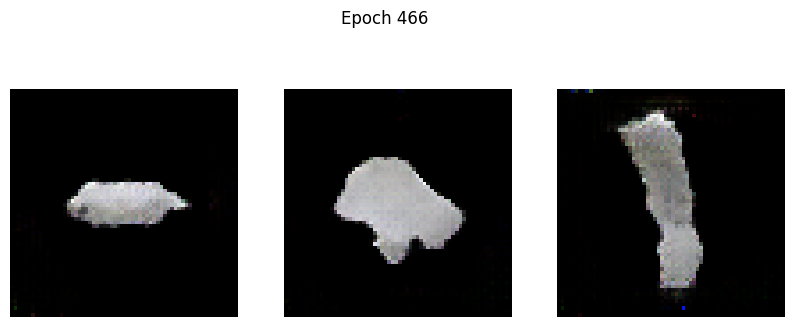

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -20.1276 - g_loss: 6.3737
Epoch 467/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -17.3366 - g_loss: 6.4327

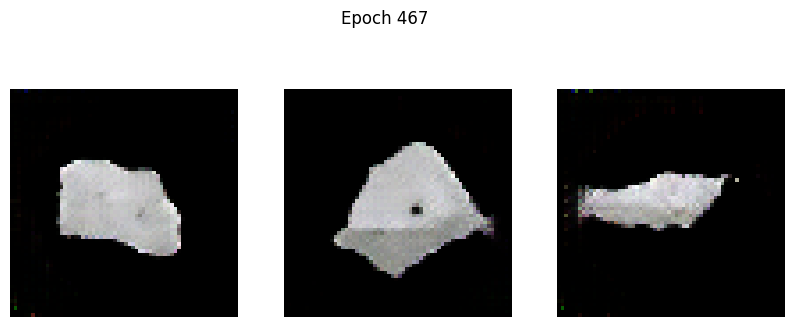

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -17.3541 - g_loss: 6.4332
Epoch 468/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -21.1638 - g_loss: 6.6050

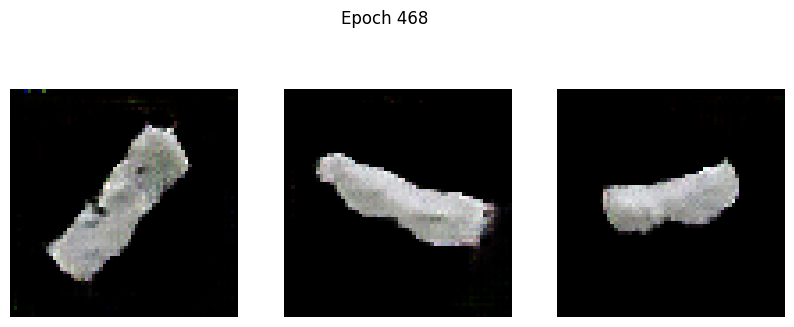

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -21.1376 - g_loss: 6.6040
Epoch 469/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -25.4309 - g_loss: 6.5197

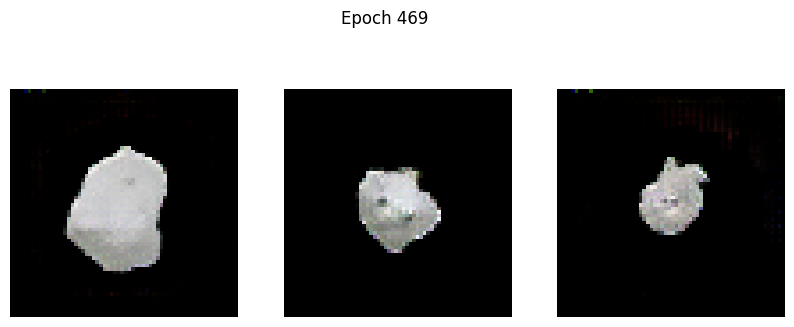

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -25.4000 - g_loss: 6.5184
Epoch 470/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -20.1838 - g_loss: 6.1226

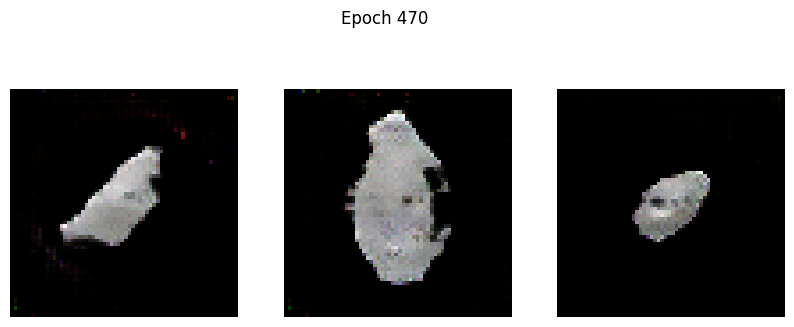

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -20.2265 - g_loss: 6.1239
Epoch 471/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -21.8662 - g_loss: 6.0684

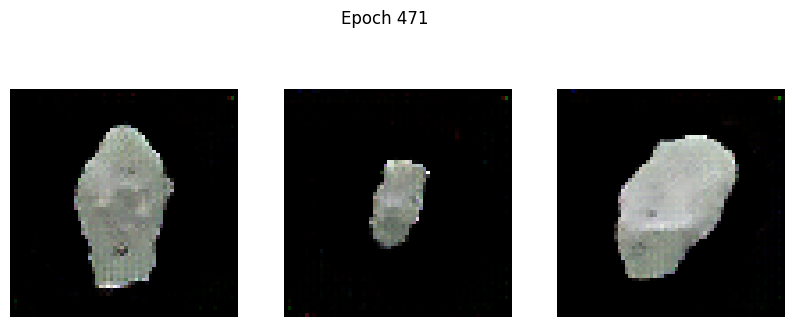

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -21.8687 - g_loss: 6.0699
Epoch 472/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -23.3662 - g_loss: 6.8060

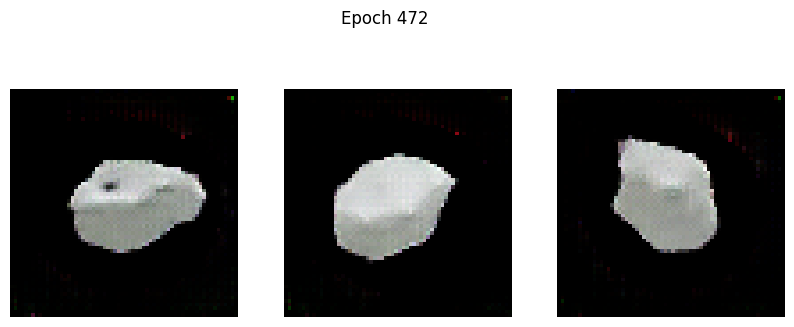

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -23.3955 - g_loss: 6.8021
Epoch 473/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -26.4713 - g_loss: 6.4787

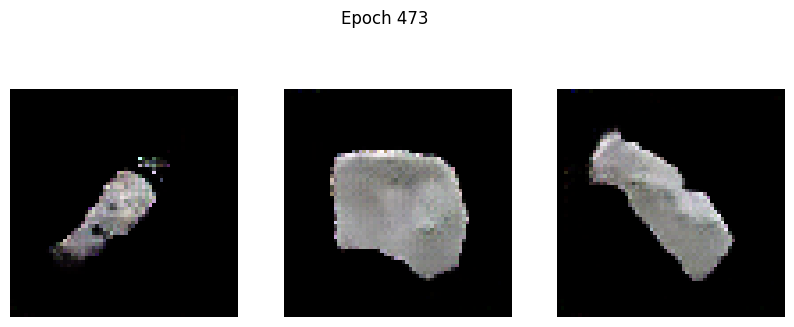

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - d_loss: -26.4712 - g_loss: 6.4762
Epoch 474/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -20.1171 - g_loss: 6.9865

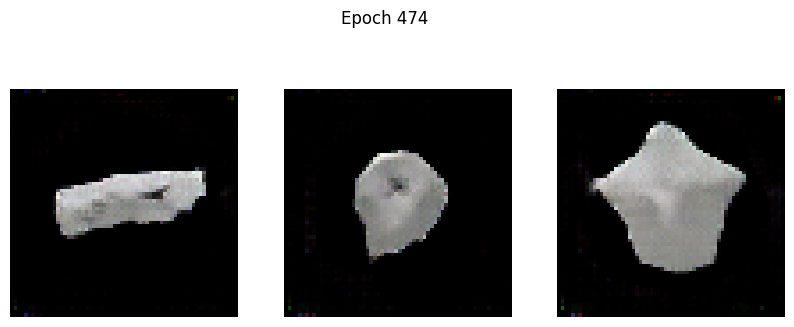

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: -20.1847 - g_loss: 6.9831
Epoch 475/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -26.3639 - g_loss: 6.6530

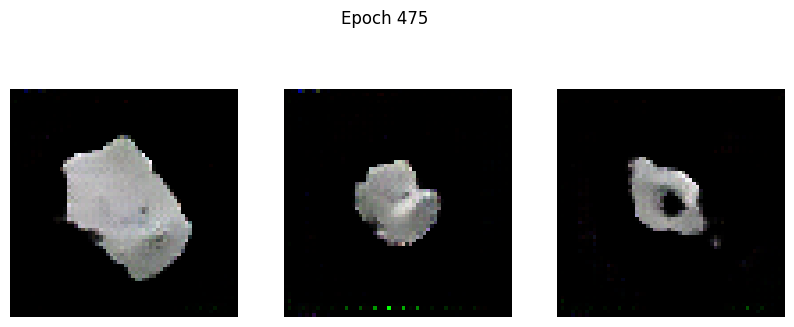

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -26.3735 - g_loss: 6.6526
Epoch 476/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 4542.6211 - g_loss: 1835.9811

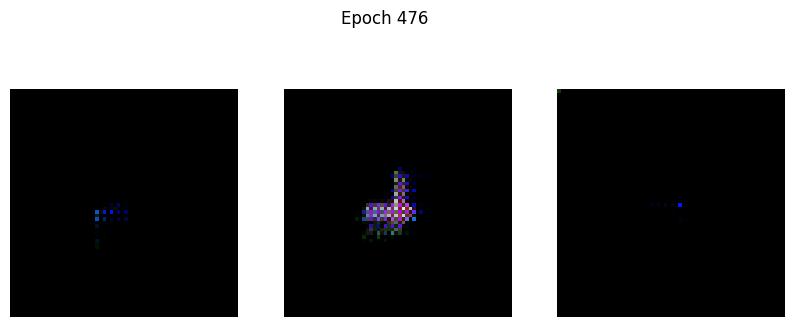

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 4541.9683 - g_loss: 1848.2653
Epoch 477/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 170.2854 - g_loss: 354.8661

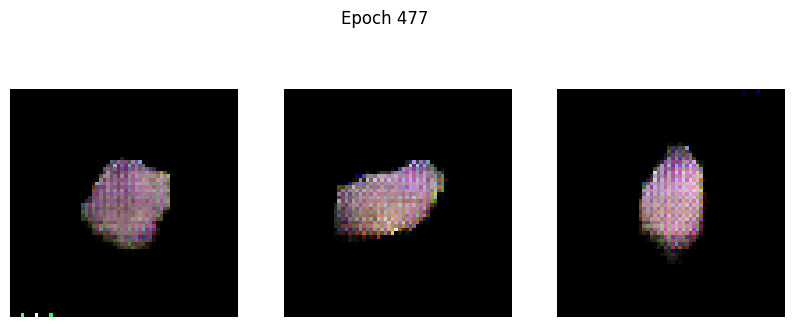

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 169.9908 - g_loss: 354.3571
Epoch 478/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 83.3263 - g_loss: 146.1785

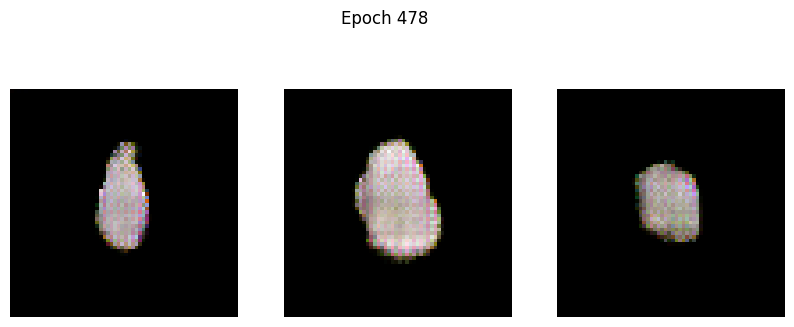

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 83.3353 - g_loss: 146.0865
Epoch 479/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 96.5984 - g_loss: 107.5279

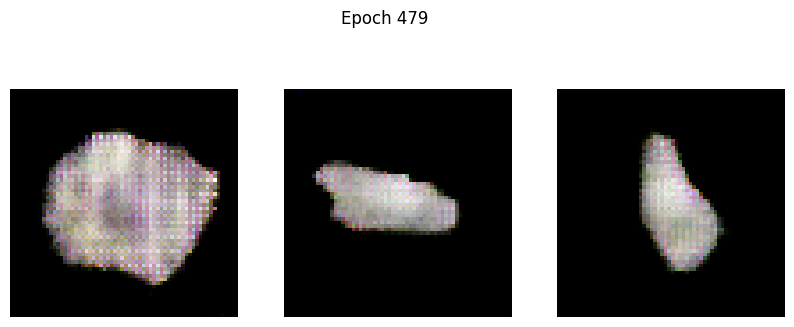

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 96.4297 - g_loss: 107.3430
Epoch 480/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 49.2598 - g_loss: 58.6447

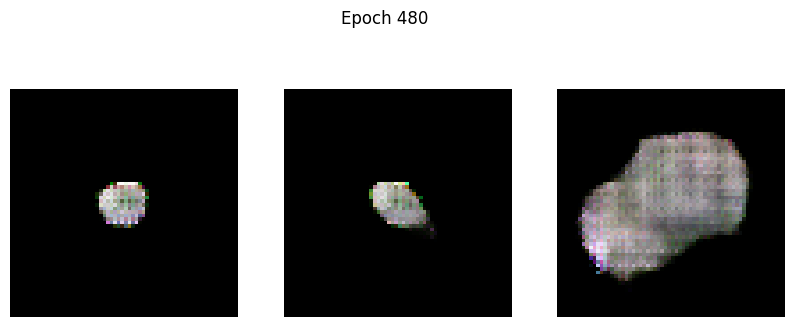

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 49.2221 - g_loss: 58.6209
Epoch 481/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 36.3202 - g_loss: 47.6118

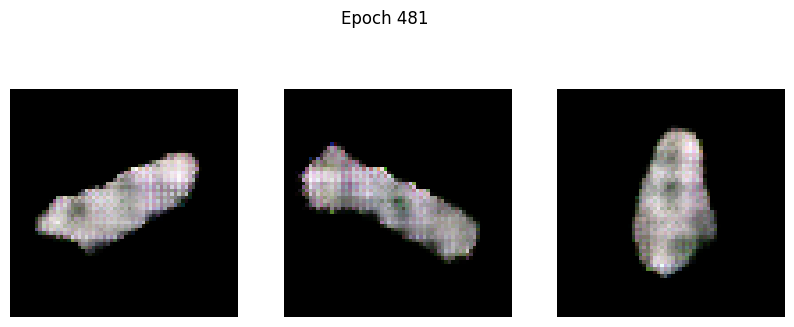

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 36.3237 - g_loss: 47.5919
Epoch 482/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 27.1131 - g_loss: 45.8672

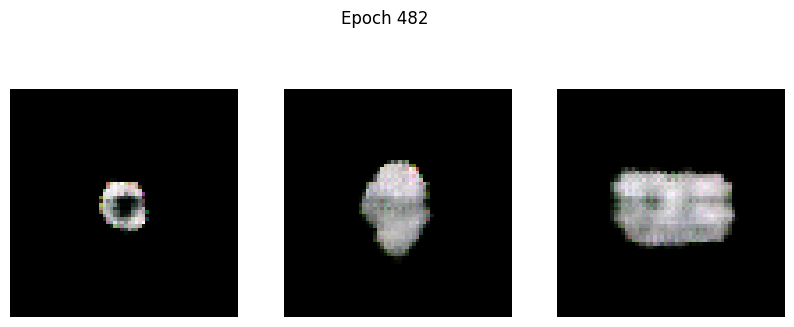

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 27.1295 - g_loss: 45.8266
Epoch 483/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 27.7566 - g_loss: 35.2554

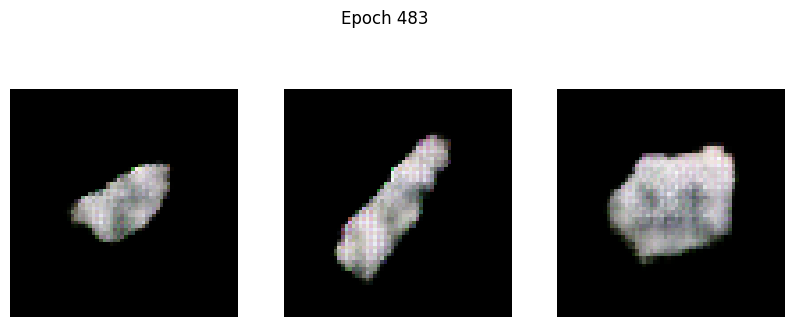

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 27.7507 - g_loss: 35.2472
Epoch 484/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 22.9194 - g_loss: 31.8532

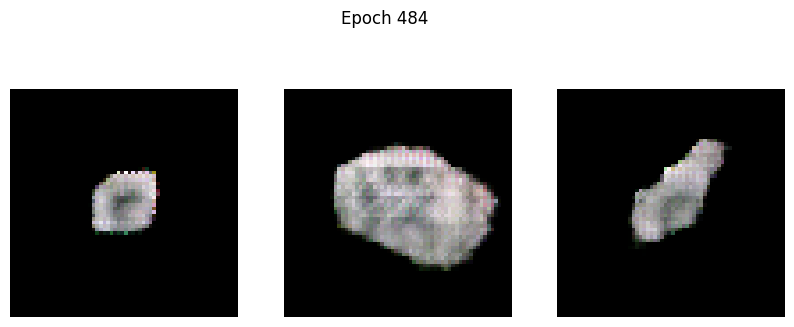

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 22.9016 - g_loss: 31.8552
Epoch 485/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 20.6944 - g_loss: 26.9942

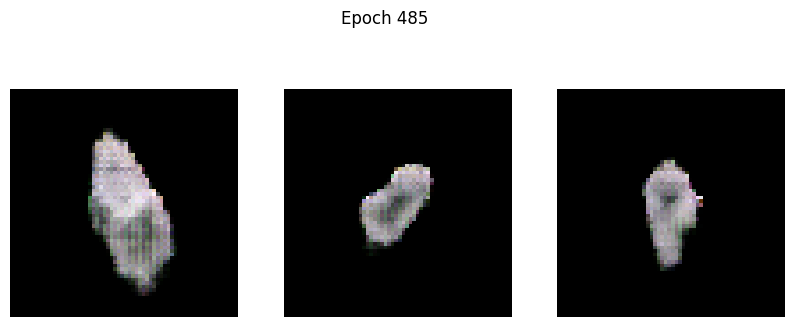

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 20.6757 - g_loss: 27.0011
Epoch 486/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 15.1299 - g_loss: 33.9053

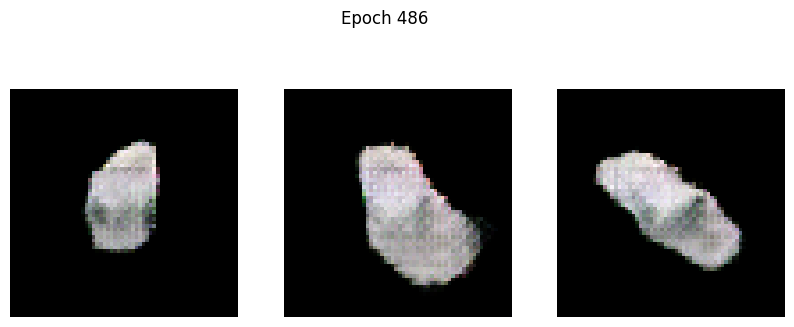

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 15.1330 - g_loss: 33.8671
Epoch 487/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 15.5387 - g_loss: 26.9006

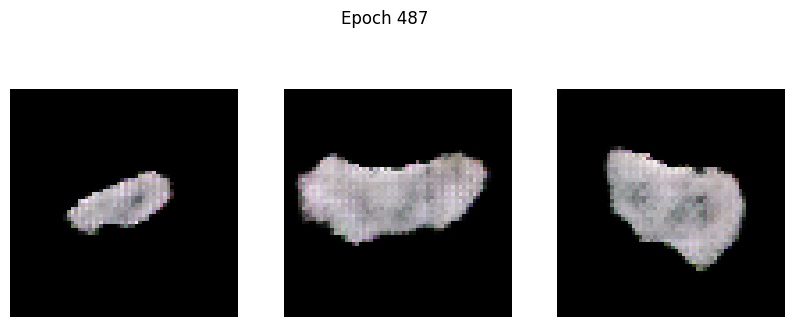

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 15.5332 - g_loss: 26.8955
Epoch 488/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 14.2346 - g_loss: 23.9282

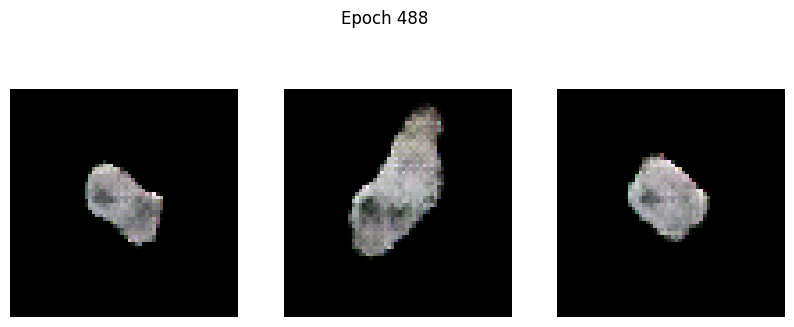

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 14.2236 - g_loss: 23.9333
Epoch 489/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 12.4402 - g_loss: 25.8204

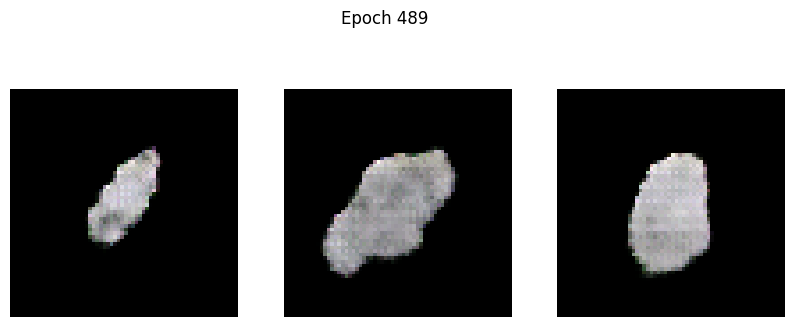

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 12.4460 - g_loss: 25.8018
Epoch 490/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 11.8629 - g_loss: 22.8194

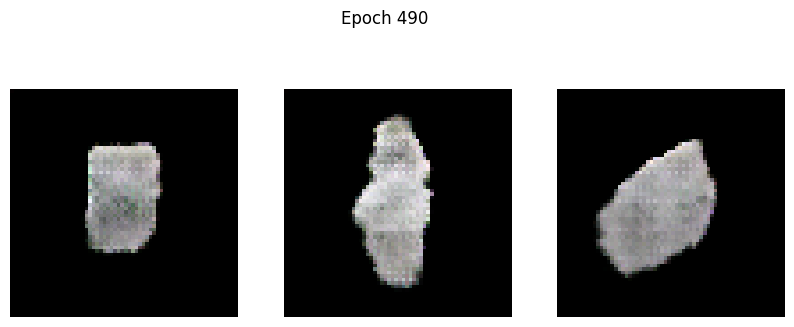

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 11.8633 - g_loss: 22.8046
Epoch 491/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 10.8547 - g_loss: 20.8965

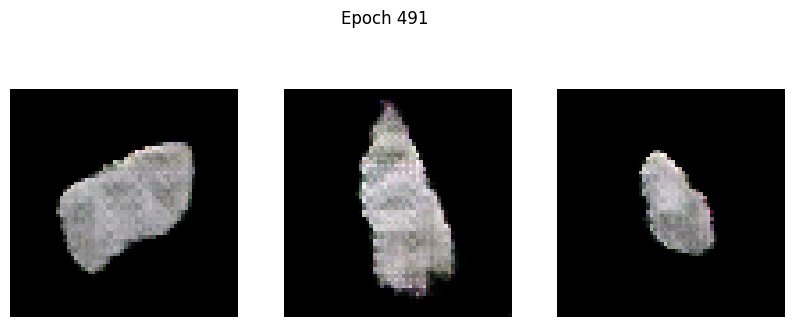

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 10.8573 - g_loss: 20.8826
Epoch 492/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 9.7165 - g_loss: 19.5177

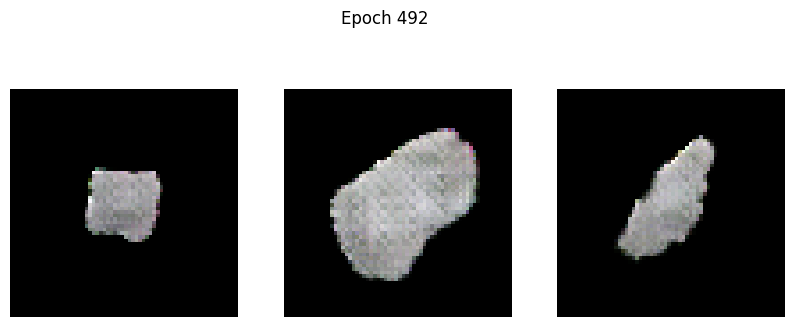

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 9.7222 - g_loss: 19.5127
Epoch 493/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 8.4699 - g_loss: 17.8598

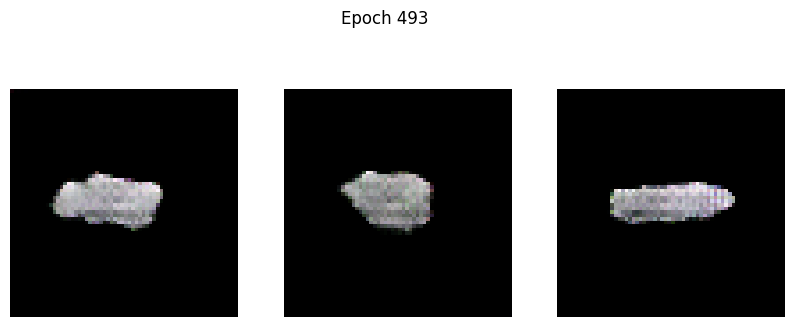

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 8.4730 - g_loss: 17.8617
Epoch 494/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 7.5141 - g_loss: 17.5604

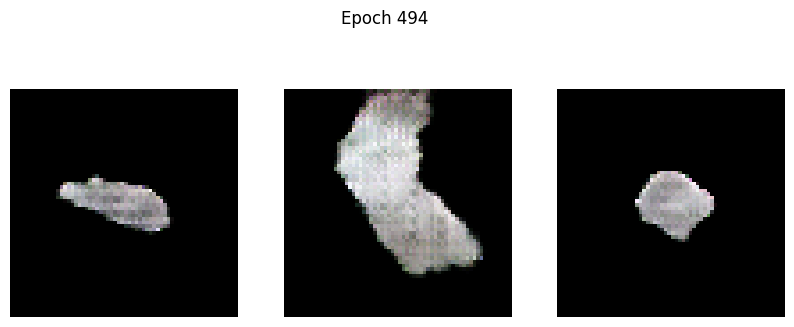

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 7.5182 - g_loss: 17.5563
Epoch 495/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 7.0778 - g_loss: 16.9368

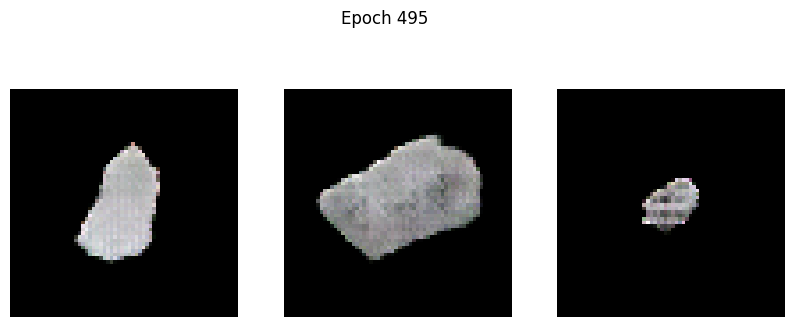

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 7.0777 - g_loss: 16.9375
Epoch 496/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 6.9676 - g_loss: 16.3480

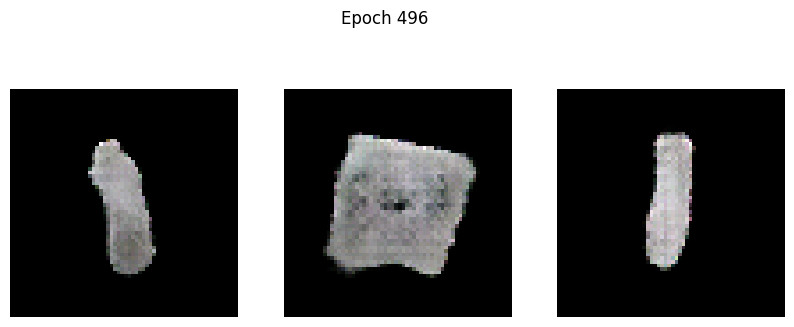

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 6.9618 - g_loss: 16.3528
Epoch 497/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 5.3167 - g_loss: 16.5208

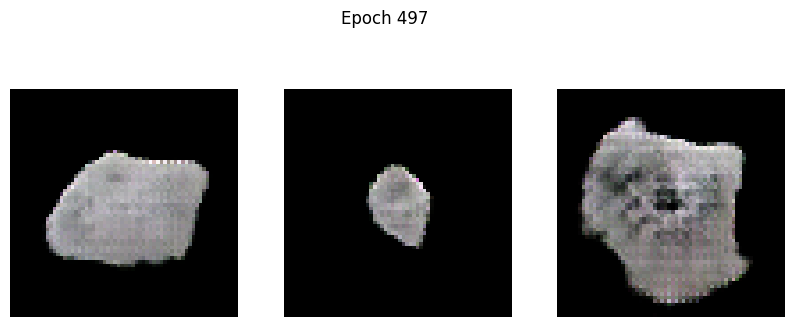

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 5.3153 - g_loss: 16.5226
Epoch 498/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 5.3967 - g_loss: 15.6087

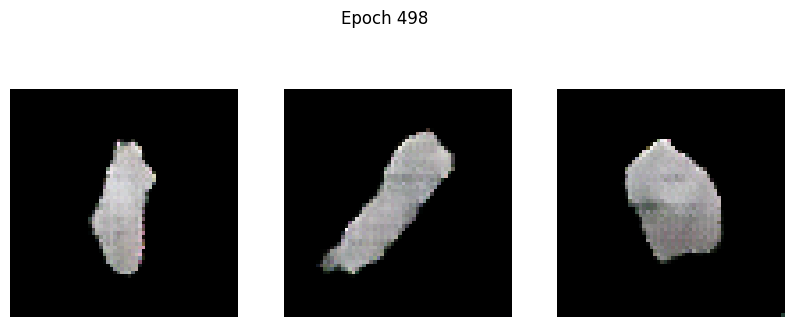

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 5.3946 - g_loss: 15.6157
Epoch 499/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 3.5451 - g_loss: 14.6668

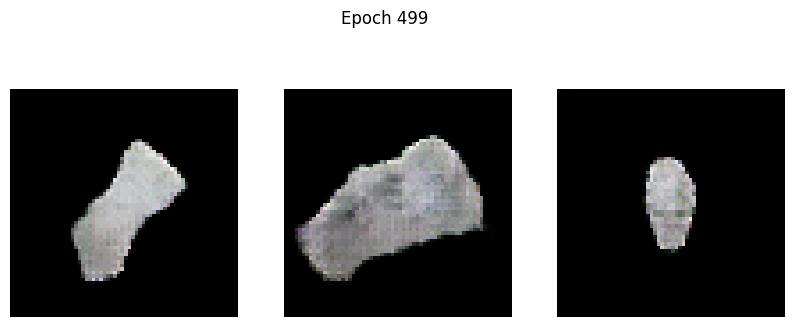

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 3.5437 - g_loss: 14.6716
Epoch 500/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 3.3492 - g_loss: 16.9764

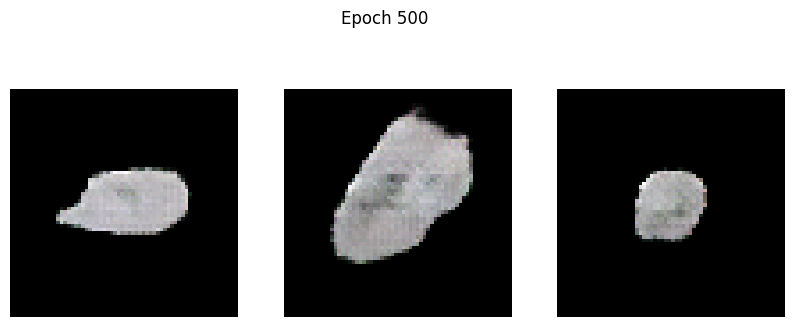

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 3.3472 - g_loss: 16.9631


In [ ]:
# Hyperparameters
EPOCHS = 500  # Tambahkan jumlah epoch untuk hasil lebih baik (misal: 100-200)
lr_generator = 0.0002
lr_discriminator = 0.0002

# Inisialisasi DCGAN
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Compile
dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=lr_discriminator, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=lr_generator, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

# Jalankan Training
print("Mulai Training...")
dcgan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=3, latent_dim=latent_dim)]
)

In [ ]:
# ==========================================
# 1. MENYIMPAN GENERATOR
# ==========================================
# Simpan model generator ke dalam format .keras atau .h5
# 'generator' adalah variabel model yang sudah Anda definisikan dan latih sebelumnya
generator.save('generator_lego_model.keras')
print("Model generator berhasil disimpan sebagai 'generator_lego_model.keras'")

Model generator berhasil disimpan sebagai 'generator_lego_model.keras'



--- 5 Gambar Baru Random ---


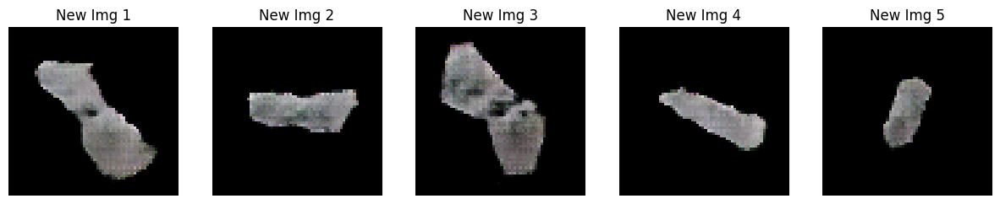

In [ ]:
# ==========================================
# 2. GENERATE 5 GAMBAR BARU
# ==========================================
def generate_and_plot_images(model, num_images=5):
    # Membuat noise random dari distribusi normal
    random_latent_vectors = tf.random.normal(shape=(num_images, latent_dim))

    # Generate gambar (training=False agar batchnorm berjalan dalam mode inference)
    generated_images = model(random_latent_vectors, training=False)

    # Plotting
    plt.figure(figsize=(15, 5))
    for i in range(num_images):
        plt.subplot(1, num_images, i+1)
        # Rescale pixel dari [-1, 1] ke [0, 1] agar bisa ditampilkan
        img = generated_images[i].numpy() * 0.5 + 0.5
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"New Img {i+1}")
    plt.show()

print("\n--- 5 Gambar Baru Random ---")
generate_and_plot_images(generator)


--- Latent Space Interpolation (Transisi Gambar) ---


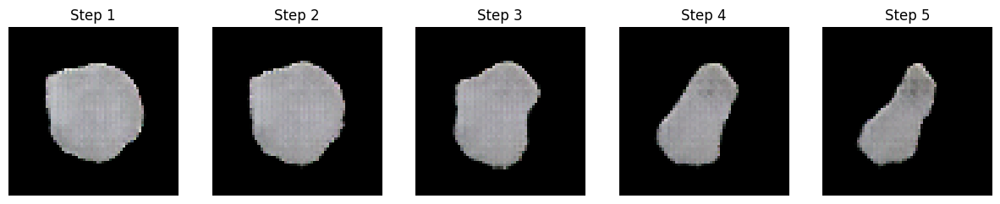

In [ ]:
# ==========================================
# 3. LATENT SPACE INTERPOLATION
# ==========================================
def interpolate_points(p1, p2, steps=5):
    # Melakukan interpolasi linear antara dua titik vektor
    ratios = np.linspace(0, 1, steps)
    vectors = []
    for ratio in ratios:
        v = (1.0 - ratio) * p1 + ratio * p2
        vectors.append(v)
    return tf.concat(vectors, axis=0)

# Ambil 2 titik acak di latent space
start_point = tf.random.normal(shape=(1, latent_dim))
end_point = tf.random.normal(shape=(1, latent_dim))

# Buat vektor interpolasi (transisi halus dari start -> end)
interpolated_vectors = interpolate_points(start_point, end_point, steps=5)

# Generate gambar dari vektor interpolasi
interpolated_images = generator(interpolated_vectors, training=False)

# Plotting
plt.figure(figsize=(15, 5))
print("\n--- Latent Space Interpolation (Transisi Gambar) ---")
for i in range(5):
    plt.subplot(1, 5, i+1)
    img = interpolated_images[i].numpy() * 0.5 + 0.5
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Step {i+1}")
plt.show()